In [1]:
#!pip install pyod
#!pip install lightgbm
#!pip install keras
#!pip install tensorflow
# !pip install libfreetype6-dev
# !pip install pkgconfig
#!pip install feature_selector
#!pip install --upgrade pandas
#!pip install --upgrade numpy

In [1]:
import pandas as pd
import numpy as np
import pyod
import seaborn as sns
import matplotlib.pyplot as pyplot
import matplotlib.pyplot as plt
import sklearn.metrics as metrics
from sklearn import preprocessing
from pyod.utils.data import evaluate_print

from pyod.models.pca import PCA
from pyod.models.mcd import MCD
from pyod.models.ocsvm import OCSVM

from pyod.models.lof import LOF 
from pyod.models.cof import COF
from pyod.models.cblof import CBLOF
from pyod.models.loci import LOCI
from pyod.models.hbos import HBOS
from pyod.models.knn import KNN
from pyod.models.sod import SOD

from pyod.models.abod import ABOD
from pyod.models.sos import SOS

from pyod.models.iforest import IForest
from pyod.models.feature_bagging import FeatureBagging
from pyod.models.lscp import LSCP

from pyod.models.auto_encoder import AutoEncoder
from pyod.models.so_gaal import SO_GAAL
from pyod.models.mo_gaal import MO_GAAL

from sklearn.preprocessing import StandardScaler
#from feature_selector import FeatureSelector

from datetime import datetime
import time
np.set_printoptions(precision=3)

/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.utils.testing module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.utils. Anything that cannot be imported from sklearn.utils is now part of the private API.
  warnings.warn(message, FutureWarning)
Using TensorFlow backend.


In [2]:
testingSet_pd = pd.read_csv('../Unbalanced_Samples/Sample_20K.csv',sep=',',header=0)
trainingSet_pd = pd.read_csv('../Unbalanced_Samples/Sample_60K.csv',sep=',',header=0)

import csv
with open('../Unbalanced_Samples/Sample_60K.csv', newline='') as f:
  csv_reader = csv.reader(f)
  header = next(csv_reader)

print("Features:")
for i in range(len(header)):
    header[i] = header[i]+" ("+str(i)+")"
    print(header[i])

Features:
Unnamed: 0 (0)
Flow ID (1)
Src IP (2)
Src Port (3)
Dst IP (4)
Dst Port (5)
Protocol (6)
Timestamp (7)
Flow Duration (8)
Tot Fwd Pkts (9)
Tot Bwd Pkts (10)
TotLen Fwd Pkts (11)
TotLen Bwd Pkts (12)
Fwd Pkt Len Max (13)
Fwd Pkt Len Min (14)
Fwd Pkt Len Mean (15)
Fwd Pkt Len Std (16)
Bwd Pkt Len Max (17)
Bwd Pkt Len Min (18)
Bwd Pkt Len Mean (19)
Bwd Pkt Len Std (20)
Flow Byts/s (21)
Flow Pkts/s (22)
Flow IAT Mean (23)
Flow IAT Std (24)
Flow IAT Max (25)
Flow IAT Min (26)
Fwd IAT Tot (27)
Fwd IAT Mean (28)
Fwd IAT Std (29)
Fwd IAT Max (30)
Fwd IAT Min (31)
Bwd IAT Tot (32)
Bwd IAT Mean (33)
Bwd IAT Std (34)
Bwd IAT Max (35)
Bwd IAT Min (36)
Fwd PSH Flags (37)
Bwd PSH Flags (38)
Fwd URG Flags (39)
Bwd URG Flags (40)
Fwd Header Len (41)
Bwd Header Len (42)
Fwd Pkts/s (43)
Bwd Pkts/s (44)
Pkt Len Min (45)
Pkt Len Max (46)
Pkt Len Mean (47)
Pkt Len Std (48)
Pkt Len Var (49)
FIN Flag Cnt (50)
SYN Flag Cnt (51)
RST Flag Cnt (52)
PSH Flag Cnt (53)
ACK Flag Cnt (54)
URG Flag Cnt (55)
CW

In [3]:
def ipToNumber(ip):
    if(isinstance(ip, float)):
        return ip
    ip = ip.split(".")
    final_ip = 0
    multiplier = 10**9
    for i in ip:
        final_ip+=int(i)*multiplier
        multiplier/=10**3
    return final_ip

def toTimestamp(hour):
    if(isinstance(hour, float)):
        return hour
    hour = hour.strip()
    if hour.rfind("AM") != -1 or hour.rfind("PM")!=-1:
        timestamp = time.mktime(datetime.strptime(hour, "%d/%m/%Y %I:%M:%S %p").timetuple())
    else:
        timestamp = time.mktime(datetime.strptime(hour, "%d/%m/%Y %I:%M:%S").timetuple())
    return timestamp

def labelToBinary(label):
    if isinstance(label, int):
        return label
    return 1 if (label == "ddos") else 0

def datasetToFloat(tSet):
    for f in tSet.columns:
        if f == "Src IP" or f == "Dst IP":
            tSet[f] = [ipToNumber(ip) for ip in tSet[f].values]
        elif f == "Timestamp":
            tSet[f] = [toTimestamp(t) for t in tSet[f].values]
        elif f == "Label":
            tSet[f] = [labelToBinary(l) for l in tSet[f].values]
        elif f == "Flow ID":   #drops flow Id, which is a composition of other features
            tSet[f] = [0 for i in range(len(tSet[f]))]
    return tSet
        
trainingSet_pd = datasetToFloat(trainingSet_pd)
testingSet_pd = datasetToFloat(testingSet_pd)

In [4]:
def deleteUnknown(tSet_):
    tSet = tSet_.values
    tSet = tSet.astype(float)
    np.random.shuffle(tSet)
    #removing nan or inf elements
    for i in range (tSet.shape[0]-1, 0, -1):
        for j in range(0, tSet.shape[1]):
            tSet[i, j] = float(tSet[i, j])
            if (np.isinf(tSet[i, j]) or np.isnan(tSet[i, j])):
                tSet = np.delete(tSet, i, axis=0)
    return pd.DataFrame(tSet, columns = header)

trainingSet_pd = deleteUnknown(trainingSet_pd)
testingSet_pd = deleteUnknown(testingSet_pd)

In [5]:
def getDatasetLabel(tSet):
    labels = tSet["Label (84)"]
    tSet = tSet.drop("Label (84)", axis=1)
    return tSet, np.array(labels.values).astype(int)

trainingSet_pd, y_train = getDatasetLabel(trainingSet_pd)
testingSet_pd, y_test = getDatasetLabel(testingSet_pd)

In [6]:
trainingSet_pd

,Unnamed: 0 (0),Flow ID (1),Src IP (2),Src Port (3),Dst IP (4),Dst Port (5),Protocol (6),Timestamp (7),Flow Duration (8),Tot Fwd Pkts (9),...,Fwd Act Data Pkts (74),Fwd Seg Size Min (75),Active Mean (76),Active Std (77),Active Max (78),Active Min (79),Idle Mean (80),Idle Std (81),Idle Max (82),Idle Min (83)
0,7466663.0,0.0,1.862321e+11,53829.0,1.720311e+11,445.0,6.0,1.519135e+09,488033.0,5.0,...,3.0,20.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,3399477.0,0.0,1.720311e+11,80.0,1.821919e+10,39258.0,6.0,1.518831e+09,4425134.0,4.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,6388672.0,0.0,1.720311e+11,49585.0,1.731942e+11,443.0,6.0,1.519130e+09,516529.0,10.0,...,4.0,20.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,4411920.0,0.0,1.720311e+11,63515.0,1.720310e+11,53.0,17.0,1.519097e+09,7993.0,1.0,...,0.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2358312.0,0.0,1.720311e+11,61088.0,1.720310e+11,53.0,17.0,1.519104e+09,18146.0,1.0,...,0.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59628,2801765.0,0.0,1.720311e+11,80.0,1.821919e+10,39034.0,6.0,1.518831e+09,4654885.0,4.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
59629,1382691.0,0.0,2.319610e+10,443.0,1.720311e+11,52387.0,6.0,1.519104e+09,130.0,3.0,...,1.0,20.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
59630,1981034.0,0.0,1.720311e+11,58868.0,1.720310e+11,53.0,17.0,1.519096e+09,947.0,1.0,...,0.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
59631,1046866.0,0.0,1.720311e+11,52435.0,1.720310e+11,53.0,17.0,1.519137e+09,53036.0,2.0,...,1.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [7]:
testingSet_pd

,Unnamed: 0 (0),Flow ID (1),Src IP (2),Src Port (3),Dst IP (4),Dst Port (5),Protocol (6),Timestamp (7),Flow Duration (8),Tot Fwd Pkts (9),...,Fwd Act Data Pkts (74),Fwd Seg Size Min (75),Active Mean (76),Active Std (77),Active Max (78),Active Min (79),Idle Mean (80),Idle Std (81),Idle Max (82),Idle Min (83)
0,4843965.0,0.0,1.720311e+11,52520.0,7.202109e+10,80.0,6.0,1.519097e+09,34155459.0,5.0,...,3.0,20.0,11251.666667,21.36196,11276.0,11236.0,1.015501e+07,50256.384215,10191500.0,10097686.0
1,1919056.0,0.0,1.720311e+11,80.0,1.821919e+10,36338.0,6.0,1.518830e+09,4817796.0,4.0,...,1.0,0.0,0.000000,0.00000,0.0,0.0,0.000000e+00,0.000000,0.0,0.0
2,6972931.0,0.0,2.120921e+11,52409.0,1.720311e+11,3389.0,6.0,1.519131e+09,1978592.0,8.0,...,5.0,20.0,0.000000,0.00000,0.0,0.0,0.000000e+00,0.000000,0.0,0.0
3,2031000.0,0.0,1.720311e+11,80.0,1.821901e+10,50941.0,6.0,1.519270e+09,596233.0,4.0,...,1.0,0.0,0.000000,0.00000,0.0,0.0,0.000000e+00,0.000000,0.0,0.0
4,44050.0,0.0,1.821903e+10,55012.0,1.720311e+11,80.0,6.0,1.519133e+09,1262323.0,3.0,...,1.0,20.0,0.000000,0.00000,0.0,0.0,0.000000e+00,0.000000,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19891,3347186.0,0.0,1.720311e+11,50670.0,2.305209e+10,80.0,6.0,1.519131e+09,122.0,2.0,...,0.0,20.0,0.000000,0.00000,0.0,0.0,0.000000e+00,0.000000,0.0,0.0
19892,4068651.0,0.0,1.720311e+11,55081.0,1.720310e+11,53.0,17.0,1.519106e+09,1030.0,1.0,...,0.0,8.0,0.000000,0.00000,0.0,0.0,0.000000e+00,0.000000,0.0,0.0
19893,309110.0,0.0,1.921680e+11,62448.0,1.722170e+11,443.0,6.0,1.499141e+09,153076.0,9.0,...,5.0,0.0,0.000000,0.00000,0.0,0.0,0.000000e+00,0.000000,0.0,0.0
19894,5463263.0,0.0,1.720311e+11,49486.0,1.720310e+11,53.0,17.0,1.519112e+09,13075.0,1.0,...,0.0,8.0,0.000000,0.00000,0.0,0.0,0.000000e+00,0.000000,0.0,0.0


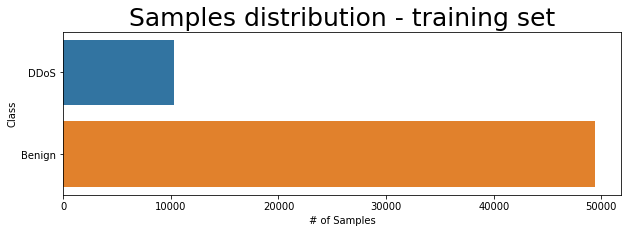

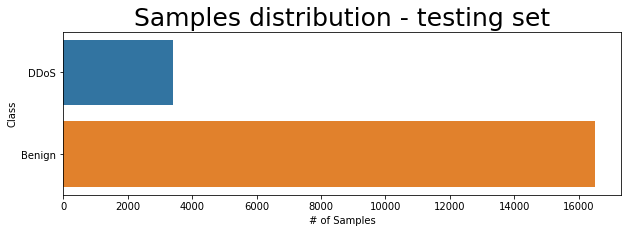

In [8]:
def plotDistribution(tLabels, t):
    pyplot.subplots(figsize=(10, 3))
    distribution = pd.DataFrame({"Class": ["DDoS","Benign"],
                                 "# of Samples":  [tLabels.sum() , tLabels.size - tLabels.sum()]})
    sns.barplot(data=distribution, y="Class", x="# of Samples").set_title("Samples distribution - "+t, fontsize=25)
    pyplot.show()

plotDistribution(y_train, "training set")
plotDistribution(y_test, "testing set")

Training Correlation Matrix


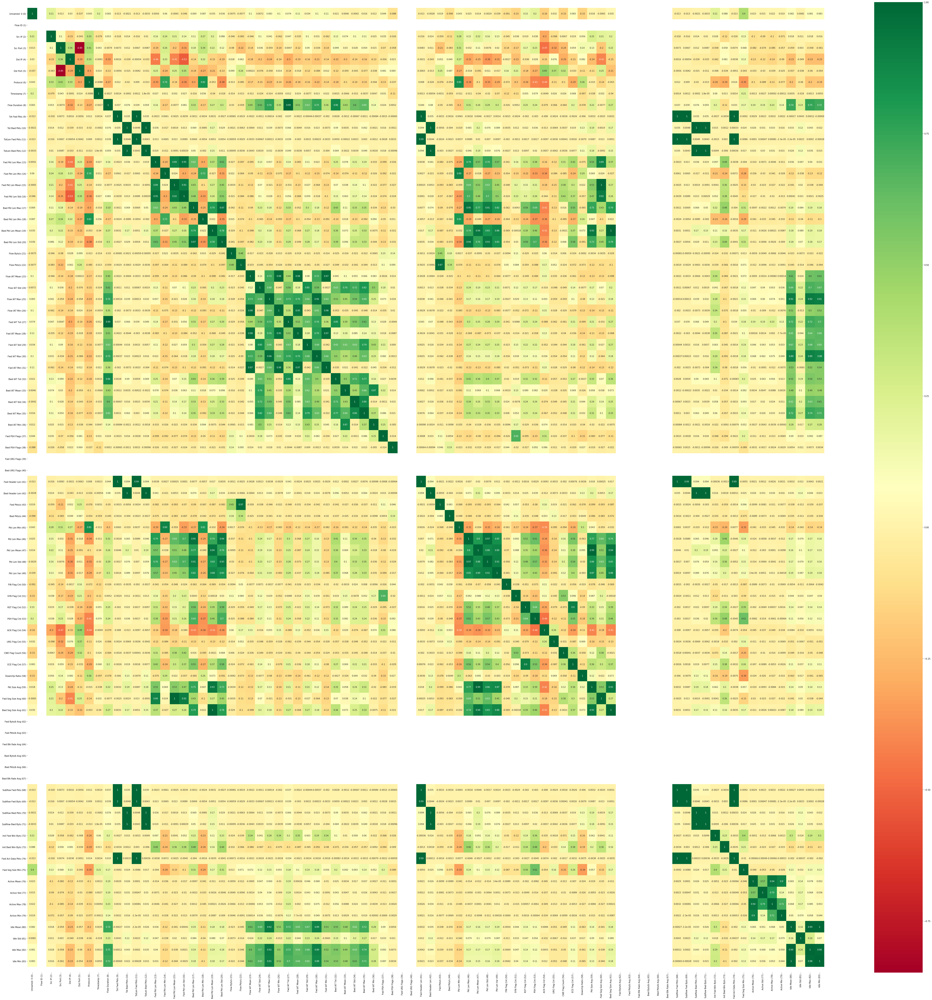

In [9]:
def printCorrelationMatrix(tSet):
    corrmat = tSet.corr()
    top_corr_features = corrmat.index
    plt.figure(figsize=(len(tSet.columns), len(tSet.columns)))
    g=sns.heatmap(tSet[top_corr_features].corr(),annot=True,cmap="RdYlGn")    #plot heat map
    g.set_ylim(g.get_ylim()[0]+0.5, g.get_ylim()[1]-0.5)                      #plot heat map

print("Training Correlation Matrix")
printCorrelationMatrix(trainingSet_pd)

In [10]:
#Features originalmente não float: 7 4 2 1 0
#Feaatures sempre 0: 67, 66, 65, 64, 63, 62, 40, 39
#features com correlação próxima de zero, vide loop abaixo: 73, 71, 70, 50, 42, 34, 12, 10 

def appendDropIndexByCorrelationWithLabel(tSet, labels, dList, tolerance):
    tSet["Label (84)"] = labels
    corrmat = tSet.corr()
    top_corr_features = corrmat.index
    cm = tSet[top_corr_features].corr().values
    tSet.drop("Label (84)", axis=1)
    dList_return = dList
    for i in range(cm.shape[0]-1, 0, -1):
        if cm[cm.shape[0]-1, i] <= -tolerance or cm[cm.shape[0]-1, i] >= tolerance:
            if i not in dList:
                dList_return.append(i)
    return dList_return
    

droppingList = [67, 66, 65, 64, 63, 62, 40, 39,       1, 0]
#droppingList = appendDropIndexByCorrelationWithLabel(trainingSet_pd, y_train, droppingList, 0.4)
droppingLabels = [trainingSet_pd.columns[i] for i in droppingList]

trainingSet_pd = trainingSet_pd.drop(droppingLabels, axis=1)
testingSet_pd = testingSet_pd.drop(droppingLabels, axis=1)
header = trainingSet_pd.columns

print("Features dropadas: ")
for dL in droppingLabels:
    print(dL)

Features dropadas: 
Bwd Blk Rate Avg (67)
Bwd Pkts/b Avg (66)
Bwd Byts/b Avg (65)
Fwd Blk Rate Avg (64)
Fwd Pkts/b Avg (63)
Fwd Byts/b Avg (62)
Bwd URG Flags (40)
Fwd URG Flags (39)
Flow ID (1)
Unnamed: 0 (0)


In [46]:
"""testing_set = pd.DataFrame(testingSet)
testing_set.columns = header
fs = FeatureSelector(data = testing_set, labels = y_test)
fs.identify_collinear(correlation_threshold = 0.85)

#gets real indexes of collinear above threshold features
real_indexs = np.zeros(fs.record_collinear.shape[0])
j = 0
for i in range(header.size):
    if (header[i] == fs.record_collinear.iloc[j, 0]):
        real_indexs[j] = i
        j = j+1

real_indexs = np.unique(real_indexs)
for i in range(real_indexs.size - 1, -1, -1):
    np.delete(testingSet, real_indexs[i], axis = 1)

print(real_indexs)
fs.record_collinear.head()"""

'testing_set = pd.DataFrame(testingSet)\ntesting_set.columns = header\nfs = FeatureSelector(data = testing_set, labels = y_test)\nfs.identify_collinear(correlation_threshold = 0.85)\n\n#gets real indexes of collinear above threshold features\nreal_indexs = np.zeros(fs.record_collinear.shape[0])\nj = 0\nfor i in range(header.size):\n    if (header[i] == fs.record_collinear.iloc[j, 0]):\n        real_indexs[j] = i\n        j = j+1\n\nreal_indexs = np.unique(real_indexs)\nfor i in range(real_indexs.size - 1, -1, -1):\n    np.delete(testingSet, real_indexs[i], axis = 1)\n\nprint(real_indexs)\nfs.record_collinear.head()'

In [12]:
#Aplica a padronização z-score
"""testingSetSaved = testingSet

mi = np.mean(testingSet)
sigma = np.std(testingSet)
testingSet = (testingSet - mi) / sigma"""

#Aplica regularização default sk-learn
scaler = StandardScaler()
scaler.fit_transform(testingSet)

array([[-0.697, -0.424, -1.315, ..., -0.093, -0.294, -0.283],
       [-1.248,  1.16 , -0.064, ..., -0.093, -0.294, -0.283],
       [ 1.811,  0.612,  1.454, ..., -0.093, -0.294, -0.283],
       ...,
       [-1.26 ,  1.231, -0.064, ..., -0.093, -0.294, -0.283],
       [-0.923,  1.318, -0.242, ..., -0.093, -0.294, -0.283],
       [-1.265, -1.309, -0.726, ..., -0.093, -0.294, -0.283]])

In [55]:
def printROC(clf_name, expected, scores):
    fpr, tpr, threshold = metrics.roc_curve(expected, scores)
    roc_auc = metrics.auc(fpr, tpr)
    
    plt.rcParams["figure.figsize"] = (6, 4)
    plt.title('Receiver Operating Characteristic - '+clf_name)
    plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
    plt.legend(loc = 'lower right')
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0, 1])
    plt.ylim([0, 1])
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
    evaluate_print(clf_name, expected, scores)

def printResults(clf_name, predicted, expected):
    print("\nResults - "+clf_name+":")
    truePositive = 0
    trueNegative = 0
    falsePositive = 0
    falseNegative = 0

    for i in range(expected.size):
        if(expected[i] == 1 and predicted[i] == 1):
            truePositive = truePositive+1
        elif (expected[i] == 0 and predicted[i] == 0):
            trueNegative = trueNegative+1
        elif (expected[i] == 0 and predicted[i] == 1):
            falsePositive = falsePositive+1
        else:
            falseNegative = falseNegative+1

    print("Confusion Matrix:")
    print("               Actual")
    print("Predicted  ", truePositive, " | ", falsePositive)
    print("           ",falseNegative, " | ", trueNegative,"\n")

    #####################################################################
    
    #gets usual metrics based on results obtained
    total = expected.shape[0]
    
    accuracy = (truePositive+trueNegative)/total
    print("Accuracy: ", accuracy)
    
    if(truePositive+falsePositive != 0):
        precision = truePositive/(truePositive+falsePositive)
        print("Precision: ", precision)
    else:
        precision = 0
        print("Precision: -")
        
    if(truePositive+falseNegative != 0):
        recall = truePositive/(truePositive+falseNegative)
        print("Recall: ", recall)
    else:
        recall = 0
        print("Recall: -")
        
    if(recall + precision != 0):
        f1 = 2*(recall*precision)/(recall+precision)
        print("F1-score: ", f1)
    else:
        print("F1-score: -")
    

    

outliers_fraction = 0.17
def testMethod(clf, clf_name, fitSet, predSet, labels_test, labels_train=[-1]):
    start_fit = datetime.now()
    if(labels_train[0] == -1):
        clf.fit(fitSet)
    else:
        clf.fit(fitSet, labels_train)
        
    #####################################################################
    try:
        y_test_pred = clf.predict(predSet)  # outlier labels (0 or 1)
        y_test_scores = clf.decision_function(predSet)  # outlier scores
        end_predict = datetime.now()
        printResults(clf_name, y_test_pred, labels_test)
        printROC(clf_name, y_test, y_test_scores)
    except:
        y_test_pred = clf.predict(predSet)  # outlier labels (0 or 1)
        y_test_scores = clf.predict_proba(predSet)  # outlier scores
        end_predict = datetime.now()
        printResults(clf_name, y_test_pred, labels_test)
    
    #####################################################################
    duration = end_predict - start_fit
    print("Duration: ", duration.total_seconds(), " seconds")
    print("\n")
    print("#####################################################################")


Results - PCA:
Confusion Matrix:
               Actual
Predicted   2170  |  8030
            8086  |  41714 

PCA ROC:0.5791, precision @ rank n:0.2124


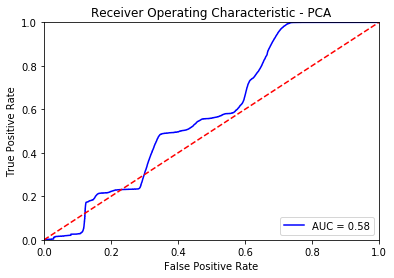

Accuracy:  0.7314
Precision:  0.21274509803921568
Recall:  0.21158346333853353
F1-score:  0.2121626906531091
Duration:  2.035688  seconds



Results - MCD:
Confusion Matrix:
               Actual
Predicted   848  |  9352
            9408  |  40392 

MCD ROC:0.4614, precision @ rank n:0.0829


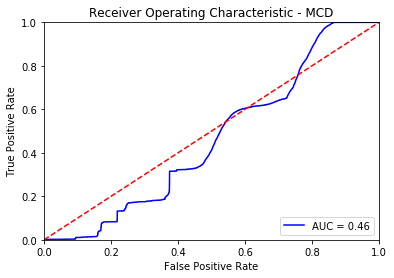

Accuracy:  0.6873333333333334
Precision:  0.08313725490196078
Recall:  0.08268330733229329
F1-score:  0.08290965975752834
Duration:  38.077569  seconds



Results - OCSVM:
Confusion Matrix:
               Actual
Predicted   0  |  0
            10256  |  49744 

OCSVM ROC:0.4998, precision @ rank n:0.0


/home/rudda/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)


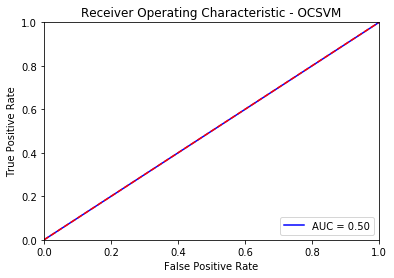

Accuracy:  0.8290666666666666
Precision: -
Recall:  0.0
F1-score: -
Duration:  1528.687349  seconds




In [14]:
#Linear Models
classifiers = {
    'PCA': PCA(contamination= outliers_fraction),
    'MCD': MCD(contamination= outliers_fraction),
    'OCSVM': OCSVM(contamination= outliers_fraction)
}

for i, (clf_name, clf) in enumerate(classifiers.items()):
    testMethod(clf, clf_name, testingSet, testingSet)


Results - LOF:
Confusion Matrix:
               Actual
Predicted   819  |  8361
            9437  |  41383 

LOF ROC:0.4188, precision @ rank n:0.0883


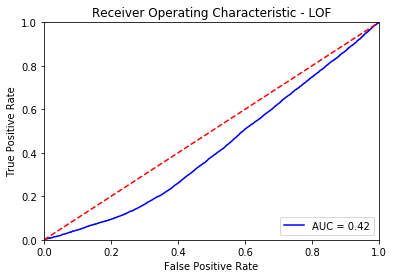

Accuracy:  0.7033666666666667
Precision:  0.0892156862745098
Recall:  0.07985569422776911
F1-score:  0.08427660012348219
Duration:  47.024687  seconds



Results - CBLOF:
Confusion Matrix:
               Actual
Predicted   1331  |  8869
            8925  |  40875 

CBLOF ROC:0.6082, precision @ rank n:0.1348


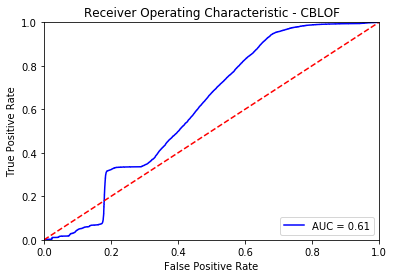

Accuracy:  0.7034333333333334
Precision:  0.13049019607843138
Recall:  0.1297776911076443
F1-score:  0.13013296832225266
Duration:  8.91354  seconds



Results - HBOS:
Confusion Matrix:
               Actual
Predicted   1828  |  8372
            8428  |  41372 

HBOS ROC:0.66, precision @ rank n:0.1782


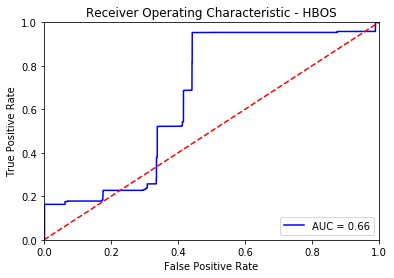

Accuracy:  0.72
Precision:  0.17921568627450982
Recall:  0.17823712948517942
F1-score:  0.17872506843957764
Duration:  2.016852  seconds



Results - kNN:
Confusion Matrix:
               Actual
Predicted   651  |  9015
            9605  |  40729 

kNN ROC:0.3629, precision @ rank n:0.0716


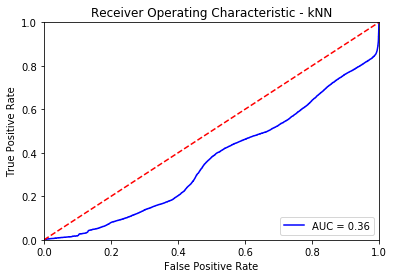

Accuracy:  0.6896666666666667
Precision:  0.06734947237740534
Recall:  0.06347503900156007
F1-score:  0.06535488404778637
Duration:  272.223706  seconds



Results - AvgKNN:
Confusion Matrix:
               Actual
Predicted   499  |  7952
            9757  |  41792 

AvgKNN ROC:0.3569, precision @ rank n:0.0683


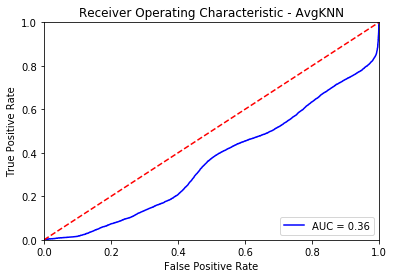

Accuracy:  0.70485
Precision:  0.05904626671399835
Recall:  0.048654446177847116
F1-score:  0.053349013738172885
Duration:  318.17992  seconds



Results - MedKNN:
Confusion Matrix:
               Actual
Predicted   609  |  8590
            9647  |  41154 

MedKNN ROC:0.3553, precision @ rank n:0.0667


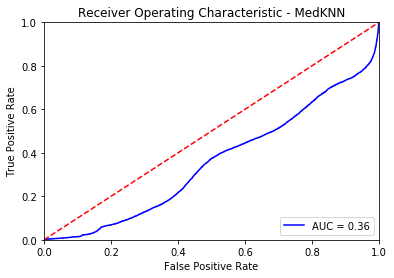

Accuracy:  0.69605
Precision:  0.06620284813566692
Recall:  0.0593798751950078
F1-score:  0.0626060138781804
Duration:  343.22045  seconds



Results - SOD:
Confusion Matrix:
               Actual
Predicted   448  |  9752
            9808  |  39992 

SOD ROC:0.3842, precision @ rank n:0.044


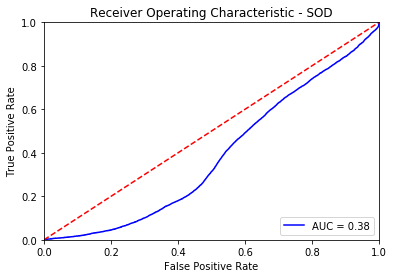

Accuracy:  0.674
Precision:  0.04392156862745098
Recall:  0.0436817472698908
F1-score:  0.043801329683222534
Duration:  5327.821198  seconds




In [15]:
#Proximity Based
classifiers = {
    #'COF': COF(contamination= outliers_fraction),  #Apresentou erros de execução.
    'LOF': LOF(contamination = outliers_fraction),
    'CBLOF':CBLOF(contamination= outliers_fraction),
    #'LOCI':LOCI(contamination= outliers_fraction),   #Travou a máquina de execução repetidas vezes.
    'HBOS': HBOS(contamination= outliers_fraction),
    'kNN': KNN(method='largest', contamination= outliers_fraction),
    'AvgKNN': KNN(method='mean', contamination= outliers_fraction),
    'MedKNN': KNN(method='median', contamination= outliers_fraction),
    'SOD': SOD(contamination= outliers_fraction)
}

for i, (clf_name, clf) in enumerate(classifiers.items()):
    testMethod(clf, clf_name, testingSet, testingSet)    


Results - ABOD:
Confusion Matrix:
               Actual
Predicted   574  |  9648
            9682  |  40096 

ABOD ROC:0.3426, precision @ rank n:0.0564


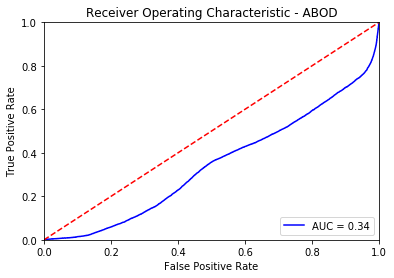

Accuracy:  0.6778333333333333
Precision:  0.05615339463901389
Recall:  0.05596723868954758
F1-score:  0.056060162125207535
Duration:  64.97771  seconds




In [16]:
#Probabilistic tests
classifiers = {
    'ABOD': ABOD(contamination = outliers_fraction),
    #'SOS': SOS(contamination = outliers_fraction) #Apresentou erros de execução.
}

for i, (clf_name, clf) in enumerate(classifiers.items()):
    testMethod(clf, clf_name, testingSet, testingSet)

/home/rudda/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/iforest.py:247: FutureWarning: behaviour="old" is deprecated and will be removed in version 0.22. Please use behaviour="new", which makes the decision_function change to match other anomaly detection algorithm API.
  FutureWarning)



Results - Isolation Forest:
Confusion Matrix:
               Actual
Predicted   1497  |  8703
            8759  |  41041 

Isolation Forest ROC:0.5059, precision @ rank n:0.1483


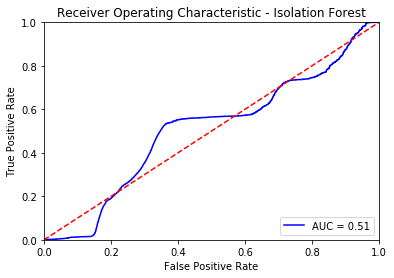

Accuracy:  0.7089666666666666
Precision:  0.14676470588235294
Recall:  0.14596333853354135
F1-score:  0.14636292530308956
Duration:  15.857569  seconds



Results - Feature Bagging:
Confusion Matrix:
               Actual
Predicted   784  |  8397
            9472  |  41347 

Feature Bagging ROC:0.4026, precision @ rank n:0.0874


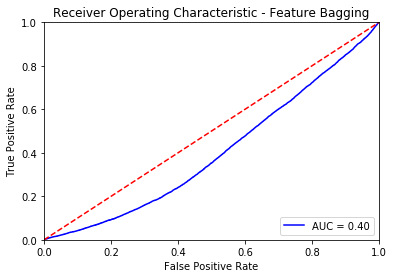

Accuracy:  0.7021833333333334
Precision:  0.08539374795773881
Recall:  0.07644305772230889
F1-score:  0.08067088542470545
Duration:  373.204154  seconds




In [17]:
#Ensembles tests
listDetectors = detector_list=[HBOS(),
                               PCA(),
                               ABOD(),
                               LOF(),
                               KNN()]
classifiers = {
    'Isolation Forest': IForest(contamination = outliers_fraction),
    'Feature Bagging': FeatureBagging(contamination = outliers_fraction)
    #'LSCP': LSCP(detector_list = listDetectors, contamination = outliers_fraction) #Still couldn't get it to work
    #XGBOD tests are in a separate file
}

for i, (clf_name, clf) in enumerate(classifiers.items()):
    testMethod(clf, clf_name, testingSet, testingSet)

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 76)                5852      
_________________________________________________________________
dropout_1 (Dropout)          (None, 76)                0         
_________________________________________________________________
dense_2 (Dense)              (None, 76)                5852      
_________________________________________________________________
dropout_2 (Dropout)          (None, 76)                0         
_________________________________________________________________
dense_3 (Dense)              (None, 8)                 616       
_________________________________________________________________
dropout_3 (Dropout)          (None, 8)                 0         
_________________________________________________________________
dense_4 (Dense)              (None, 4)                

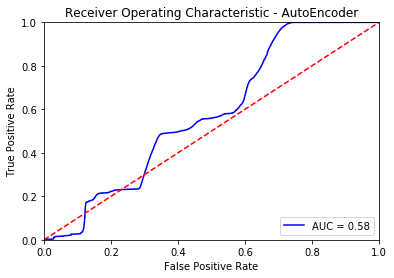

Accuracy:  0.7314
Precision:  0.21274509803921568
Recall:  0.21158346333853353
F1-score:  0.2121626906531091
Duration:  48.514138  seconds


Epoch 1 of 60

Testing for epoch 1 index 1:


/home/rudda/anaconda3/lib/python3.7/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'



Testing for epoch 1 index 2:

Testing for epoch 1 index 3:

Testing for epoch 1 index 4:

Testing for epoch 1 index 5:

Testing for epoch 1 index 6:

Testing for epoch 1 index 7:

Testing for epoch 1 index 8:

Testing for epoch 1 index 9:

Testing for epoch 1 index 10:

Testing for epoch 1 index 11:

Testing for epoch 1 index 12:

Testing for epoch 1 index 13:

Testing for epoch 1 index 14:

Testing for epoch 1 index 15:

Testing for epoch 1 index 16:

Testing for epoch 1 index 17:

Testing for epoch 1 index 18:

Testing for epoch 1 index 19:

Testing for epoch 1 index 20:

Testing for epoch 1 index 21:

Testing for epoch 1 index 22:

Testing for epoch 1 index 23:

Testing for epoch 1 index 24:

Testing for epoch 1 index 25:

Testing for epoch 1 index 26:

Testing for epoch 1 index 27:

Testing for epoch 1 index 28:

Testing for epoch 1 index 29:

Testing for epoch 1 index 30:

Testing for epoch 1 index 31:

Testing for epoch 1 index 32:

Testing for epoch 1 index 33:

Testing for epo


Testing for epoch 3 index 42:

Testing for epoch 3 index 43:

Testing for epoch 3 index 44:

Testing for epoch 3 index 45:

Testing for epoch 3 index 46:

Testing for epoch 3 index 47:

Testing for epoch 3 index 48:

Testing for epoch 3 index 49:

Testing for epoch 3 index 50:

Testing for epoch 3 index 51:

Testing for epoch 3 index 52:

Testing for epoch 3 index 53:

Testing for epoch 3 index 54:

Testing for epoch 3 index 55:

Testing for epoch 3 index 56:

Testing for epoch 3 index 57:

Testing for epoch 3 index 58:

Testing for epoch 3 index 59:

Testing for epoch 3 index 60:

Testing for epoch 3 index 61:

Testing for epoch 3 index 62:

Testing for epoch 3 index 63:

Testing for epoch 3 index 64:

Testing for epoch 3 index 65:

Testing for epoch 3 index 66:

Testing for epoch 3 index 67:

Testing for epoch 3 index 68:

Testing for epoch 3 index 69:

Testing for epoch 3 index 70:

Testing for epoch 3 index 71:

Testing for epoch 3 index 72:

Testing for epoch 3 index 73:

Testing


Testing for epoch 5 index 83:

Testing for epoch 5 index 84:

Testing for epoch 5 index 85:

Testing for epoch 5 index 86:

Testing for epoch 5 index 87:

Testing for epoch 5 index 88:

Testing for epoch 5 index 89:

Testing for epoch 5 index 90:

Testing for epoch 5 index 91:

Testing for epoch 5 index 92:

Testing for epoch 5 index 93:

Testing for epoch 5 index 94:

Testing for epoch 5 index 95:

Testing for epoch 5 index 96:

Testing for epoch 5 index 97:

Testing for epoch 5 index 98:

Testing for epoch 5 index 99:

Testing for epoch 5 index 100:

Testing for epoch 5 index 101:

Testing for epoch 5 index 102:

Testing for epoch 5 index 103:

Testing for epoch 5 index 104:

Testing for epoch 5 index 105:

Testing for epoch 5 index 106:

Testing for epoch 5 index 107:

Testing for epoch 5 index 108:

Testing for epoch 5 index 109:

Testing for epoch 5 index 110:

Testing for epoch 5 index 111:

Testing for epoch 5 index 112:

Testing for epoch 5 index 113:

Testing for epoch 5 inde


Testing for epoch 8 index 8:

Testing for epoch 8 index 9:

Testing for epoch 8 index 10:

Testing for epoch 8 index 11:

Testing for epoch 8 index 12:

Testing for epoch 8 index 13:

Testing for epoch 8 index 14:

Testing for epoch 8 index 15:

Testing for epoch 8 index 16:

Testing for epoch 8 index 17:

Testing for epoch 8 index 18:

Testing for epoch 8 index 19:

Testing for epoch 8 index 20:

Testing for epoch 8 index 21:

Testing for epoch 8 index 22:

Testing for epoch 8 index 23:

Testing for epoch 8 index 24:

Testing for epoch 8 index 25:

Testing for epoch 8 index 26:

Testing for epoch 8 index 27:

Testing for epoch 8 index 28:

Testing for epoch 8 index 29:

Testing for epoch 8 index 30:

Testing for epoch 8 index 31:

Testing for epoch 8 index 32:

Testing for epoch 8 index 33:

Testing for epoch 8 index 34:

Testing for epoch 8 index 35:

Testing for epoch 8 index 36:

Testing for epoch 8 index 37:

Testing for epoch 8 index 38:

Testing for epoch 8 index 39:

Testing f


Testing for epoch 10 index 31:

Testing for epoch 10 index 32:

Testing for epoch 10 index 33:

Testing for epoch 10 index 34:

Testing for epoch 10 index 35:

Testing for epoch 10 index 36:

Testing for epoch 10 index 37:

Testing for epoch 10 index 38:

Testing for epoch 10 index 39:

Testing for epoch 10 index 40:

Testing for epoch 10 index 41:

Testing for epoch 10 index 42:

Testing for epoch 10 index 43:

Testing for epoch 10 index 44:

Testing for epoch 10 index 45:

Testing for epoch 10 index 46:

Testing for epoch 10 index 47:

Testing for epoch 10 index 48:

Testing for epoch 10 index 49:

Testing for epoch 10 index 50:

Testing for epoch 10 index 51:

Testing for epoch 10 index 52:

Testing for epoch 10 index 53:

Testing for epoch 10 index 54:

Testing for epoch 10 index 55:

Testing for epoch 10 index 56:

Testing for epoch 10 index 57:

Testing for epoch 10 index 58:

Testing for epoch 10 index 59:

Testing for epoch 10 index 60:

Testing for epoch 10 index 61:

Testing


Testing for epoch 12 index 53:

Testing for epoch 12 index 54:

Testing for epoch 12 index 55:

Testing for epoch 12 index 56:

Testing for epoch 12 index 57:

Testing for epoch 12 index 58:

Testing for epoch 12 index 59:

Testing for epoch 12 index 60:

Testing for epoch 12 index 61:

Testing for epoch 12 index 62:

Testing for epoch 12 index 63:

Testing for epoch 12 index 64:

Testing for epoch 12 index 65:

Testing for epoch 12 index 66:

Testing for epoch 12 index 67:

Testing for epoch 12 index 68:

Testing for epoch 12 index 69:

Testing for epoch 12 index 70:

Testing for epoch 12 index 71:

Testing for epoch 12 index 72:

Testing for epoch 12 index 73:

Testing for epoch 12 index 74:

Testing for epoch 12 index 75:

Testing for epoch 12 index 76:

Testing for epoch 12 index 77:

Testing for epoch 12 index 78:

Testing for epoch 12 index 79:

Testing for epoch 12 index 80:

Testing for epoch 12 index 81:

Testing for epoch 12 index 82:

Testing for epoch 12 index 83:

Testing


Testing for epoch 14 index 74:

Testing for epoch 14 index 75:

Testing for epoch 14 index 76:

Testing for epoch 14 index 77:

Testing for epoch 14 index 78:

Testing for epoch 14 index 79:

Testing for epoch 14 index 80:

Testing for epoch 14 index 81:

Testing for epoch 14 index 82:

Testing for epoch 14 index 83:

Testing for epoch 14 index 84:

Testing for epoch 14 index 85:

Testing for epoch 14 index 86:

Testing for epoch 14 index 87:

Testing for epoch 14 index 88:

Testing for epoch 14 index 89:

Testing for epoch 14 index 90:

Testing for epoch 14 index 91:

Testing for epoch 14 index 92:

Testing for epoch 14 index 93:

Testing for epoch 14 index 94:

Testing for epoch 14 index 95:

Testing for epoch 14 index 96:

Testing for epoch 14 index 97:

Testing for epoch 14 index 98:

Testing for epoch 14 index 99:

Testing for epoch 14 index 100:

Testing for epoch 14 index 101:

Testing for epoch 14 index 102:

Testing for epoch 14 index 103:

Testing for epoch 14 index 104:

Te


Testing for epoch 16 index 98:

Testing for epoch 16 index 99:

Testing for epoch 16 index 100:

Testing for epoch 16 index 101:

Testing for epoch 16 index 102:

Testing for epoch 16 index 103:

Testing for epoch 16 index 104:

Testing for epoch 16 index 105:

Testing for epoch 16 index 106:

Testing for epoch 16 index 107:

Testing for epoch 16 index 108:

Testing for epoch 16 index 109:

Testing for epoch 16 index 110:

Testing for epoch 16 index 111:

Testing for epoch 16 index 112:

Testing for epoch 16 index 113:

Testing for epoch 16 index 114:

Testing for epoch 16 index 115:

Testing for epoch 16 index 116:

Testing for epoch 16 index 117:

Testing for epoch 16 index 118:

Testing for epoch 16 index 119:

Testing for epoch 16 index 120:
Epoch 17 of 60

Testing for epoch 17 index 1:

Testing for epoch 17 index 2:

Testing for epoch 17 index 3:

Testing for epoch 17 index 4:

Testing for epoch 17 index 5:

Testing for epoch 17 index 6:

Testing for epoch 17 index 7:

Testing fo


Testing for epoch 19 index 2:

Testing for epoch 19 index 3:

Testing for epoch 19 index 4:

Testing for epoch 19 index 5:

Testing for epoch 19 index 6:

Testing for epoch 19 index 7:

Testing for epoch 19 index 8:

Testing for epoch 19 index 9:

Testing for epoch 19 index 10:

Testing for epoch 19 index 11:

Testing for epoch 19 index 12:

Testing for epoch 19 index 13:

Testing for epoch 19 index 14:

Testing for epoch 19 index 15:

Testing for epoch 19 index 16:

Testing for epoch 19 index 17:

Testing for epoch 19 index 18:

Testing for epoch 19 index 19:

Testing for epoch 19 index 20:

Testing for epoch 19 index 21:

Testing for epoch 19 index 22:

Testing for epoch 19 index 23:

Testing for epoch 19 index 24:

Testing for epoch 19 index 25:

Testing for epoch 19 index 26:

Testing for epoch 19 index 27:

Testing for epoch 19 index 28:

Testing for epoch 19 index 29:

Testing for epoch 19 index 30:

Testing for epoch 19 index 31:

Testing for epoch 19 index 32:

Testing for epo


Testing for epoch 21 index 26:

Testing for epoch 21 index 27:

Testing for epoch 21 index 28:

Testing for epoch 21 index 29:

Testing for epoch 21 index 30:

Testing for epoch 21 index 31:

Testing for epoch 21 index 32:

Testing for epoch 21 index 33:

Testing for epoch 21 index 34:

Testing for epoch 21 index 35:

Testing for epoch 21 index 36:

Testing for epoch 21 index 37:

Testing for epoch 21 index 38:

Testing for epoch 21 index 39:

Testing for epoch 21 index 40:

Testing for epoch 21 index 41:

Testing for epoch 21 index 42:

Testing for epoch 21 index 43:

Testing for epoch 21 index 44:

Testing for epoch 21 index 45:

Testing for epoch 21 index 46:

Testing for epoch 21 index 47:

Testing for epoch 21 index 48:

Testing for epoch 21 index 49:

Testing for epoch 21 index 50:

Testing for epoch 21 index 51:

Testing for epoch 21 index 52:

Testing for epoch 21 index 53:

Testing for epoch 21 index 54:

Testing for epoch 21 index 55:

Testing for epoch 21 index 56:

Testing

500/500 [==============================] - 0s 14us/step

Testing for epoch 22 index 60:
500/500 [==============================] - 0s 16us/step

Testing for epoch 22 index 61:
500/500 [==============================] - 0s 15us/step

Testing for epoch 22 index 62:
500/500 [==============================] - 0s 14us/step

Testing for epoch 22 index 63:
500/500 [==============================] - 0s 14us/step

Testing for epoch 22 index 64:
500/500 [==============================] - 0s 15us/step

Testing for epoch 22 index 65:
500/500 [==============================] - 0s 14us/step

Testing for epoch 22 index 66:
500/500 [==============================] - 0s 14us/step

Testing for epoch 22 index 67:
500/500 [==============================] - 0s 15us/step

Testing for epoch 22 index 68:
500/500 [==============================] - 0s 15us/step

Testing for epoch 22 index 69:
500/500 [==============================] - 0s 14us/step

Testing for epoch 22 index 70:
500/500 [=======================

500/500 [==============================] - 0s 14us/step

Testing for epoch 23 index 33:
500/500 [==============================] - 0s 13us/step

Testing for epoch 23 index 34:
500/500 [==============================] - 0s 14us/step

Testing for epoch 23 index 35:
500/500 [==============================] - 0s 13us/step

Testing for epoch 23 index 36:
500/500 [==============================] - 0s 15us/step

Testing for epoch 23 index 37:
500/500 [==============================] - 0s 15us/step

Testing for epoch 23 index 38:
500/500 [==============================] - 0s 15us/step

Testing for epoch 23 index 39:
500/500 [==============================] - 0s 15us/step

Testing for epoch 23 index 40:
500/500 [==============================] - 0s 14us/step

Testing for epoch 23 index 41:
500/500 [==============================] - 0s 15us/step

Testing for epoch 23 index 42:
500/500 [==============================] - 0s 14us/step

Testing for epoch 23 index 43:
500/500 [=======================

500/500 [==============================] - 0s 14us/step

Testing for epoch 24 index 6:
500/500 [==============================] - 0s 12us/step

Testing for epoch 24 index 7:
500/500 [==============================] - 0s 13us/step

Testing for epoch 24 index 8:
500/500 [==============================] - 0s 12us/step

Testing for epoch 24 index 9:
500/500 [==============================] - 0s 13us/step

Testing for epoch 24 index 10:
500/500 [==============================] - 0s 12us/step

Testing for epoch 24 index 11:
500/500 [==============================] - 0s 13us/step

Testing for epoch 24 index 12:
500/500 [==============================] - 0s 12us/step

Testing for epoch 24 index 13:
500/500 [==============================] - 0s 12us/step

Testing for epoch 24 index 14:
500/500 [==============================] - 0s 12us/step

Testing for epoch 24 index 15:
500/500 [==============================] - 0s 12us/step

Testing for epoch 24 index 16:
500/500 [===========================

500/500 [==============================] - 0s 12us/step

Testing for epoch 25 index 72:
500/500 [==============================] - 0s 12us/step

Testing for epoch 25 index 73:
500/500 [==============================] - 0s 14us/step

Testing for epoch 25 index 74:
500/500 [==============================] - 0s 16us/step

Testing for epoch 25 index 75:
500/500 [==============================] - 0s 13us/step

Testing for epoch 25 index 76:
500/500 [==============================] - 0s 13us/step

Testing for epoch 25 index 77:
500/500 [==============================] - 0s 13us/step

Testing for epoch 25 index 78:
500/500 [==============================] - 0s 13us/step

Testing for epoch 25 index 79:
500/500 [==============================] - 0s 12us/step

Testing for epoch 25 index 80:
500/500 [==============================] - 0s 16us/step

Testing for epoch 25 index 81:
500/500 [==============================] - 0s 13us/step

Testing for epoch 25 index 82:
500/500 [=======================

500/500 [==============================] - 0s 13us/step

Testing for epoch 26 index 45:
500/500 [==============================] - 0s 13us/step

Testing for epoch 26 index 46:
500/500 [==============================] - 0s 14us/step

Testing for epoch 26 index 47:
500/500 [==============================] - 0s 12us/step

Testing for epoch 26 index 48:
500/500 [==============================] - 0s 13us/step

Testing for epoch 26 index 49:
500/500 [==============================] - 0s 14us/step

Testing for epoch 26 index 50:
500/500 [==============================] - 0s 12us/step

Testing for epoch 26 index 51:
500/500 [==============================] - 0s 13us/step

Testing for epoch 26 index 52:
500/500 [==============================] - 0s 13us/step

Testing for epoch 26 index 53:
500/500 [==============================] - 0s 16us/step

Testing for epoch 26 index 54:
500/500 [==============================] - 0s 14us/step

Testing for epoch 26 index 55:
500/500 [=======================

500/500 [==============================] - 0s 13us/step

Testing for epoch 27 index 18:
500/500 [==============================] - 0s 15us/step

Testing for epoch 27 index 19:
500/500 [==============================] - 0s 13us/step

Testing for epoch 27 index 20:
500/500 [==============================] - 0s 14us/step

Testing for epoch 27 index 21:
500/500 [==============================] - 0s 22us/step

Testing for epoch 27 index 22:
500/500 [==============================] - 0s 14us/step

Testing for epoch 27 index 23:
500/500 [==============================] - 0s 16us/step

Testing for epoch 27 index 24:
500/500 [==============================] - 0s 15us/step

Testing for epoch 27 index 25:
500/500 [==============================] - 0s 14us/step

Testing for epoch 27 index 26:
500/500 [==============================] - 0s 15us/step

Testing for epoch 27 index 27:
500/500 [==============================] - 0s 15us/step

Testing for epoch 27 index 28:
500/500 [=======================

500/500 [==============================] - 0s 13us/step

Testing for epoch 27 index 111:
500/500 [==============================] - 0s 14us/step

Testing for epoch 27 index 112:
500/500 [==============================] - 0s 13us/step

Testing for epoch 27 index 113:
500/500 [==============================] - 0s 16us/step

Testing for epoch 27 index 114:
500/500 [==============================] - 0s 13us/step

Testing for epoch 27 index 115:
500/500 [==============================] - 0s 14us/step

Testing for epoch 27 index 116:
500/500 [==============================] - 0s 14us/step

Testing for epoch 27 index 117:
500/500 [==============================] - 0s 14us/step

Testing for epoch 27 index 118:
500/500 [==============================] - 0s 13us/step

Testing for epoch 27 index 119:
500/500 [==============================] - 0s 14us/step

Testing for epoch 27 index 120:
500/500 [==============================] - 0s 13us/step
Epoch 28 of 60

Testing for epoch 28 index 1:
500/500 

500/500 [==============================] - 0s 17us/step

Testing for epoch 28 index 84:
500/500 [==============================] - 0s 19us/step

Testing for epoch 28 index 85:
500/500 [==============================] - 0s 12us/step

Testing for epoch 28 index 86:
500/500 [==============================] - 0s 14us/step

Testing for epoch 28 index 87:
500/500 [==============================] - 0s 13us/step

Testing for epoch 28 index 88:
500/500 [==============================] - 0s 13us/step

Testing for epoch 28 index 89:
500/500 [==============================] - 0s 14us/step

Testing for epoch 28 index 90:
500/500 [==============================] - 0s 13us/step

Testing for epoch 28 index 91:
500/500 [==============================] - 0s 13us/step

Testing for epoch 28 index 92:
500/500 [==============================] - 0s 14us/step

Testing for epoch 28 index 93:
500/500 [==============================] - 0s 13us/step

Testing for epoch 28 index 94:
500/500 [=======================

500/500 [==============================] - 0s 14us/step

Testing for epoch 29 index 57:
500/500 [==============================] - 0s 13us/step

Testing for epoch 29 index 58:
500/500 [==============================] - 0s 13us/step

Testing for epoch 29 index 59:
500/500 [==============================] - 0s 12us/step

Testing for epoch 29 index 60:
500/500 [==============================] - 0s 13us/step

Testing for epoch 29 index 61:
500/500 [==============================] - 0s 14us/step

Testing for epoch 29 index 62:
500/500 [==============================] - 0s 15us/step

Testing for epoch 29 index 63:
500/500 [==============================] - 0s 13us/step

Testing for epoch 29 index 64:
500/500 [==============================] - 0s 14us/step

Testing for epoch 29 index 65:
500/500 [==============================] - 0s 13us/step

Testing for epoch 29 index 66:
500/500 [==============================] - 0s 13us/step

Testing for epoch 29 index 67:
500/500 [=======================

500/500 [==============================] - 0s 15us/step

Testing for epoch 30 index 30:
500/500 [==============================] - 0s 13us/step

Testing for epoch 30 index 31:
500/500 [==============================] - 0s 15us/step

Testing for epoch 30 index 32:
500/500 [==============================] - 0s 13us/step

Testing for epoch 30 index 33:
500/500 [==============================] - 0s 13us/step

Testing for epoch 30 index 34:
500/500 [==============================] - 0s 14us/step

Testing for epoch 30 index 35:
500/500 [==============================] - 0s 13us/step

Testing for epoch 30 index 36:
500/500 [==============================] - 0s 14us/step

Testing for epoch 30 index 37:
500/500 [==============================] - 0s 14us/step

Testing for epoch 30 index 38:
500/500 [==============================] - 0s 14us/step

Testing for epoch 30 index 39:
500/500 [==============================] - 0s 16us/step

Testing for epoch 30 index 40:
500/500 [=======================

500/500 [==============================] - 0s 12us/step

Testing for epoch 31 index 3:
500/500 [==============================] - 0s 13us/step

Testing for epoch 31 index 4:
500/500 [==============================] - 0s 13us/step

Testing for epoch 31 index 5:
500/500 [==============================] - 0s 14us/step

Testing for epoch 31 index 6:
500/500 [==============================] - 0s 15us/step

Testing for epoch 31 index 7:
500/500 [==============================] - 0s 14us/step

Testing for epoch 31 index 8:
500/500 [==============================] - 0s 15us/step

Testing for epoch 31 index 9:
500/500 [==============================] - 0s 13us/step

Testing for epoch 31 index 10:
500/500 [==============================] - 0s 14us/step

Testing for epoch 31 index 11:
500/500 [==============================] - 0s 13us/step

Testing for epoch 31 index 12:
500/500 [==============================] - 0s 13us/step

Testing for epoch 31 index 13:
500/500 [==============================

500/500 [==============================] - 0s 13us/step

Testing for epoch 32 index 69:
500/500 [==============================] - 0s 12us/step

Testing for epoch 32 index 70:
500/500 [==============================] - 0s 15us/step

Testing for epoch 32 index 71:
500/500 [==============================] - 0s 13us/step

Testing for epoch 32 index 72:
500/500 [==============================] - 0s 14us/step

Testing for epoch 32 index 73:
500/500 [==============================] - 0s 12us/step

Testing for epoch 32 index 74:
500/500 [==============================] - 0s 15us/step

Testing for epoch 32 index 75:
500/500 [==============================] - 0s 14us/step

Testing for epoch 32 index 76:
500/500 [==============================] - 0s 13us/step

Testing for epoch 32 index 77:
500/500 [==============================] - 0s 12us/step

Testing for epoch 32 index 78:
500/500 [==============================] - 0s 14us/step

Testing for epoch 32 index 79:
500/500 [=======================

500/500 [==============================] - 0s 15us/step

Testing for epoch 33 index 42:
500/500 [==============================] - 0s 14us/step

Testing for epoch 33 index 43:
500/500 [==============================] - 0s 13us/step

Testing for epoch 33 index 44:
500/500 [==============================] - 0s 13us/step

Testing for epoch 33 index 45:
500/500 [==============================] - 0s 15us/step

Testing for epoch 33 index 46:
500/500 [==============================] - 0s 13us/step

Testing for epoch 33 index 47:
500/500 [==============================] - 0s 15us/step

Testing for epoch 33 index 48:
500/500 [==============================] - 0s 13us/step

Testing for epoch 33 index 49:
500/500 [==============================] - 0s 13us/step

Testing for epoch 33 index 50:
500/500 [==============================] - 0s 13us/step

Testing for epoch 33 index 51:
500/500 [==============================] - 0s 15us/step

Testing for epoch 33 index 52:
500/500 [=======================

500/500 [==============================] - 0s 13us/step

Testing for epoch 34 index 15:
500/500 [==============================] - 0s 13us/step

Testing for epoch 34 index 16:
500/500 [==============================] - 0s 14us/step

Testing for epoch 34 index 17:
500/500 [==============================] - 0s 13us/step

Testing for epoch 34 index 18:
500/500 [==============================] - 0s 14us/step

Testing for epoch 34 index 19:
500/500 [==============================] - 0s 13us/step

Testing for epoch 34 index 20:
500/500 [==============================] - 0s 14us/step

Testing for epoch 34 index 21:
500/500 [==============================] - 0s 14us/step

Testing for epoch 34 index 22:
500/500 [==============================] - 0s 13us/step

Testing for epoch 34 index 23:
500/500 [==============================] - 0s 14us/step

Testing for epoch 34 index 24:
500/500 [==============================] - 0s 14us/step

Testing for epoch 34 index 25:
500/500 [=======================

500/500 [==============================] - 0s 13us/step

Testing for epoch 34 index 108:
500/500 [==============================] - 0s 14us/step

Testing for epoch 34 index 109:
500/500 [==============================] - 0s 14us/step

Testing for epoch 34 index 110:
500/500 [==============================] - 0s 13us/step

Testing for epoch 34 index 111:
500/500 [==============================] - 0s 14us/step

Testing for epoch 34 index 112:
500/500 [==============================] - 0s 13us/step

Testing for epoch 34 index 113:
500/500 [==============================] - 0s 14us/step

Testing for epoch 34 index 114:
500/500 [==============================] - 0s 14us/step

Testing for epoch 34 index 115:
500/500 [==============================] - 0s 13us/step

Testing for epoch 34 index 116:
500/500 [==============================] - 0s 14us/step

Testing for epoch 34 index 117:
500/500 [==============================] - 0s 13us/step

Testing for epoch 34 index 118:
500/500 [============

500/500 [==============================] - 0s 13us/step

Testing for epoch 35 index 81:
500/500 [==============================] - 0s 13us/step

Testing for epoch 35 index 82:
500/500 [==============================] - 0s 13us/step

Testing for epoch 35 index 83:
500/500 [==============================] - 0s 14us/step

Testing for epoch 35 index 84:
500/500 [==============================] - 0s 14us/step

Testing for epoch 35 index 85:
500/500 [==============================] - 0s 14us/step

Testing for epoch 35 index 86:
500/500 [==============================] - 0s 14us/step

Testing for epoch 35 index 87:
500/500 [==============================] - 0s 13us/step

Testing for epoch 35 index 88:
500/500 [==============================] - 0s 13us/step

Testing for epoch 35 index 89:
500/500 [==============================] - 0s 13us/step

Testing for epoch 35 index 90:
500/500 [==============================] - 0s 14us/step

Testing for epoch 35 index 91:
500/500 [=======================

500/500 [==============================] - 0s 14us/step

Testing for epoch 36 index 54:
500/500 [==============================] - 0s 14us/step

Testing for epoch 36 index 55:
500/500 [==============================] - 0s 13us/step

Testing for epoch 36 index 56:
500/500 [==============================] - 0s 14us/step

Testing for epoch 36 index 57:
500/500 [==============================] - 0s 14us/step

Testing for epoch 36 index 58:
500/500 [==============================] - 0s 15us/step

Testing for epoch 36 index 59:
500/500 [==============================] - 0s 13us/step

Testing for epoch 36 index 60:
500/500 [==============================] - 0s 15us/step

Testing for epoch 36 index 61:
500/500 [==============================] - 0s 13us/step

Testing for epoch 36 index 62:
500/500 [==============================] - 0s 13us/step

Testing for epoch 36 index 63:
500/500 [==============================] - 0s 13us/step

Testing for epoch 36 index 64:
500/500 [=======================

500/500 [==============================] - 0s 14us/step

Testing for epoch 37 index 27:
500/500 [==============================] - 0s 13us/step

Testing for epoch 37 index 28:
500/500 [==============================] - 0s 13us/step

Testing for epoch 37 index 29:
500/500 [==============================] - 0s 12us/step

Testing for epoch 37 index 30:
500/500 [==============================] - 0s 12us/step

Testing for epoch 37 index 31:
500/500 [==============================] - 0s 15us/step

Testing for epoch 37 index 32:
500/500 [==============================] - 0s 15us/step

Testing for epoch 37 index 33:
500/500 [==============================] - 0s 13us/step

Testing for epoch 37 index 34:
500/500 [==============================] - 0s 14us/step

Testing for epoch 37 index 35:
500/500 [==============================] - 0s 13us/step

Testing for epoch 37 index 36:
500/500 [==============================] - 0s 13us/step

Testing for epoch 37 index 37:
500/500 [=======================

500/500 [==============================] - 0s 12us/step

Testing for epoch 37 index 120:
500/500 [==============================] - 0s 13us/step
Epoch 38 of 60

Testing for epoch 38 index 1:
500/500 [==============================] - 0s 13us/step

Testing for epoch 38 index 2:
500/500 [==============================] - 0s 13us/step

Testing for epoch 38 index 3:
500/500 [==============================] - 0s 12us/step

Testing for epoch 38 index 4:
500/500 [==============================] - 0s 14us/step

Testing for epoch 38 index 5:
500/500 [==============================] - 0s 12us/step

Testing for epoch 38 index 6:
500/500 [==============================] - 0s 13us/step

Testing for epoch 38 index 7:
500/500 [==============================] - 0s 14us/step

Testing for epoch 38 index 8:
500/500 [==============================] - 0s 13us/step

Testing for epoch 38 index 9:
500/500 [==============================] - 0s 13us/step

Testing for epoch 38 index 10:
500/500 [================

500/500 [==============================] - 0s 15us/step

Testing for epoch 39 index 66:
500/500 [==============================] - 0s 13us/step

Testing for epoch 39 index 67:
500/500 [==============================] - 0s 13us/step

Testing for epoch 39 index 68:
500/500 [==============================] - 0s 15us/step

Testing for epoch 39 index 69:
500/500 [==============================] - 0s 14us/step

Testing for epoch 39 index 70:
500/500 [==============================] - 0s 15us/step

Testing for epoch 39 index 71:
500/500 [==============================] - 0s 13us/step

Testing for epoch 39 index 72:
500/500 [==============================] - 0s 14us/step

Testing for epoch 39 index 73:
500/500 [==============================] - 0s 13us/step

Testing for epoch 39 index 74:
500/500 [==============================] - 0s 13us/step

Testing for epoch 39 index 75:
500/500 [==============================] - 0s 14us/step

Testing for epoch 39 index 76:
500/500 [=======================

500/500 [==============================] - 0s 14us/step

Testing for epoch 40 index 39:
500/500 [==============================] - 0s 13us/step

Testing for epoch 40 index 40:
500/500 [==============================] - 0s 13us/step

Testing for epoch 40 index 41:
500/500 [==============================] - 0s 13us/step

Testing for epoch 40 index 42:
500/500 [==============================] - 0s 13us/step

Testing for epoch 40 index 43:
500/500 [==============================] - 0s 13us/step

Testing for epoch 40 index 44:
500/500 [==============================] - 0s 13us/step

Testing for epoch 40 index 45:
500/500 [==============================] - 0s 13us/step

Testing for epoch 40 index 46:
500/500 [==============================] - 0s 13us/step

Testing for epoch 40 index 47:
500/500 [==============================] - 0s 15us/step

Testing for epoch 40 index 48:
500/500 [==============================] - 0s 15us/step

Testing for epoch 40 index 49:
500/500 [=======================

500/500 [==============================] - 0s 13us/step

Testing for epoch 41 index 12:
500/500 [==============================] - 0s 15us/step

Testing for epoch 41 index 13:
500/500 [==============================] - 0s 13us/step

Testing for epoch 41 index 14:
500/500 [==============================] - 0s 14us/step

Testing for epoch 41 index 15:
500/500 [==============================] - 0s 13us/step

Testing for epoch 41 index 16:
500/500 [==============================] - 0s 13us/step

Testing for epoch 41 index 17:
500/500 [==============================] - 0s 14us/step

Testing for epoch 41 index 18:
500/500 [==============================] - 0s 15us/step

Testing for epoch 41 index 19:
500/500 [==============================] - 0s 13us/step

Testing for epoch 41 index 20:
500/500 [==============================] - 0s 12us/step

Testing for epoch 41 index 21:
500/500 [==============================] - 0s 14us/step

Testing for epoch 41 index 22:
500/500 [=======================

500/500 [==============================] - 0s 19us/step

Testing for epoch 42 index 78:
500/500 [==============================] - 0s 13us/step

Testing for epoch 42 index 79:
500/500 [==============================] - 0s 14us/step

Testing for epoch 42 index 80:
500/500 [==============================] - 0s 13us/step

Testing for epoch 42 index 81:
500/500 [==============================] - 0s 15us/step

Testing for epoch 42 index 82:
500/500 [==============================] - 0s 13us/step

Testing for epoch 42 index 83:
500/500 [==============================] - 0s 14us/step

Testing for epoch 42 index 84:
500/500 [==============================] - 0s 12us/step

Testing for epoch 42 index 85:
500/500 [==============================] - 0s 13us/step

Testing for epoch 42 index 86:
500/500 [==============================] - 0s 14us/step

Testing for epoch 42 index 87:
500/500 [==============================] - 0s 13us/step

Testing for epoch 42 index 88:
500/500 [=======================

500/500 [==============================] - 0s 13us/step

Testing for epoch 43 index 51:
500/500 [==============================] - 0s 13us/step

Testing for epoch 43 index 52:
500/500 [==============================] - 0s 17us/step

Testing for epoch 43 index 53:
500/500 [==============================] - 0s 13us/step

Testing for epoch 43 index 54:
500/500 [==============================] - 0s 13us/step

Testing for epoch 43 index 55:
500/500 [==============================] - 0s 12us/step

Testing for epoch 43 index 56:
500/500 [==============================] - 0s 13us/step

Testing for epoch 43 index 57:
500/500 [==============================] - 0s 14us/step

Testing for epoch 43 index 58:
500/500 [==============================] - 0s 13us/step

Testing for epoch 43 index 59:
500/500 [==============================] - 0s 13us/step

Testing for epoch 43 index 60:
500/500 [==============================] - 0s 13us/step

Testing for epoch 43 index 61:
500/500 [=======================

500/500 [==============================] - 0s 15us/step

Testing for epoch 44 index 24:
500/500 [==============================] - 0s 13us/step

Testing for epoch 44 index 25:
500/500 [==============================] - 0s 12us/step

Testing for epoch 44 index 26:
500/500 [==============================] - 0s 13us/step

Testing for epoch 44 index 27:
500/500 [==============================] - 0s 13us/step

Testing for epoch 44 index 28:
500/500 [==============================] - 0s 13us/step

Testing for epoch 44 index 29:
500/500 [==============================] - 0s 14us/step

Testing for epoch 44 index 30:
500/500 [==============================] - 0s 15us/step

Testing for epoch 44 index 31:
500/500 [==============================] - 0s 14us/step

Testing for epoch 44 index 32:
500/500 [==============================] - 0s 13us/step

Testing for epoch 44 index 33:
500/500 [==============================] - 0s 12us/step

Testing for epoch 44 index 34:
500/500 [=======================

500/500 [==============================] - 0s 14us/step

Testing for epoch 44 index 117:
500/500 [==============================] - 0s 15us/step

Testing for epoch 44 index 118:
500/500 [==============================] - 0s 14us/step

Testing for epoch 44 index 119:
500/500 [==============================] - 0s 13us/step

Testing for epoch 44 index 120:
500/500 [==============================] - 0s 13us/step
Epoch 45 of 60

Testing for epoch 45 index 1:
500/500 [==============================] - 0s 14us/step

Testing for epoch 45 index 2:
500/500 [==============================] - 0s 13us/step

Testing for epoch 45 index 3:
500/500 [==============================] - 0s 13us/step

Testing for epoch 45 index 4:
500/500 [==============================] - 0s 13us/step

Testing for epoch 45 index 5:
500/500 [==============================] - 0s 13us/step

Testing for epoch 45 index 6:
500/500 [==============================] - 0s 14us/step

Testing for epoch 45 index 7:
500/500 [===========

500/500 [==============================] - 0s 13us/step

Testing for epoch 45 index 90:
500/500 [==============================] - 0s 14us/step

Testing for epoch 45 index 91:
500/500 [==============================] - 0s 14us/step

Testing for epoch 45 index 92:
500/500 [==============================] - 0s 14us/step

Testing for epoch 45 index 93:
500/500 [==============================] - 0s 14us/step

Testing for epoch 45 index 94:
500/500 [==============================] - 0s 14us/step

Testing for epoch 45 index 95:
500/500 [==============================] - 0s 14us/step

Testing for epoch 45 index 96:
500/500 [==============================] - 0s 14us/step

Testing for epoch 45 index 97:
500/500 [==============================] - 0s 13us/step

Testing for epoch 45 index 98:
500/500 [==============================] - 0s 13us/step

Testing for epoch 45 index 99:
500/500 [==============================] - 0s 14us/step

Testing for epoch 45 index 100:
500/500 [======================

500/500 [==============================] - 0s 14us/step

Testing for epoch 46 index 63:
500/500 [==============================] - 0s 14us/step

Testing for epoch 46 index 64:
500/500 [==============================] - 0s 12us/step

Testing for epoch 46 index 65:
500/500 [==============================] - 0s 14us/step

Testing for epoch 46 index 66:
500/500 [==============================] - 0s 13us/step

Testing for epoch 46 index 67:
500/500 [==============================] - 0s 15us/step

Testing for epoch 46 index 68:
500/500 [==============================] - 0s 14us/step

Testing for epoch 46 index 69:
500/500 [==============================] - 0s 13us/step

Testing for epoch 46 index 70:
500/500 [==============================] - 0s 14us/step

Testing for epoch 46 index 71:
500/500 [==============================] - 0s 12us/step

Testing for epoch 46 index 72:
500/500 [==============================] - 0s 12us/step

Testing for epoch 46 index 73:
500/500 [=======================

500/500 [==============================] - 0s 14us/step

Testing for epoch 47 index 36:
500/500 [==============================] - 0s 13us/step

Testing for epoch 47 index 37:
500/500 [==============================] - 0s 14us/step

Testing for epoch 47 index 38:
500/500 [==============================] - 0s 15us/step

Testing for epoch 47 index 39:
500/500 [==============================] - 0s 13us/step

Testing for epoch 47 index 40:
500/500 [==============================] - 0s 14us/step

Testing for epoch 47 index 41:
500/500 [==============================] - 0s 14us/step

Testing for epoch 47 index 42:
500/500 [==============================] - 0s 14us/step

Testing for epoch 47 index 43:
500/500 [==============================] - 0s 14us/step

Testing for epoch 47 index 44:
500/500 [==============================] - 0s 12us/step

Testing for epoch 47 index 45:
500/500 [==============================] - 0s 13us/step

Testing for epoch 47 index 46:
500/500 [=======================

500/500 [==============================] - 0s 15us/step

Testing for epoch 48 index 9:
500/500 [==============================] - 0s 13us/step

Testing for epoch 48 index 10:
500/500 [==============================] - 0s 13us/step

Testing for epoch 48 index 11:
500/500 [==============================] - 0s 13us/step

Testing for epoch 48 index 12:
500/500 [==============================] - 0s 14us/step

Testing for epoch 48 index 13:
500/500 [==============================] - 0s 13us/step

Testing for epoch 48 index 14:
500/500 [==============================] - 0s 12us/step

Testing for epoch 48 index 15:
500/500 [==============================] - 0s 13us/step

Testing for epoch 48 index 16:
500/500 [==============================] - 0s 13us/step

Testing for epoch 48 index 17:
500/500 [==============================] - 0s 13us/step

Testing for epoch 48 index 18:
500/500 [==============================] - 0s 14us/step

Testing for epoch 48 index 19:
500/500 [========================

500/500 [==============================] - 0s 13us/step

Testing for epoch 49 index 75:
500/500 [==============================] - 0s 12us/step

Testing for epoch 49 index 76:
500/500 [==============================] - 0s 14us/step

Testing for epoch 49 index 77:
500/500 [==============================] - 0s 15us/step

Testing for epoch 49 index 78:
500/500 [==============================] - 0s 14us/step

Testing for epoch 49 index 79:
500/500 [==============================] - 0s 14us/step

Testing for epoch 49 index 80:
500/500 [==============================] - 0s 14us/step

Testing for epoch 49 index 81:
500/500 [==============================] - 0s 13us/step

Testing for epoch 49 index 82:
500/500 [==============================] - 0s 16us/step

Testing for epoch 49 index 83:
500/500 [==============================] - 0s 13us/step

Testing for epoch 49 index 84:
500/500 [==============================] - 0s 13us/step

Testing for epoch 49 index 85:
500/500 [=======================

500/500 [==============================] - 0s 15us/step

Testing for epoch 50 index 48:
500/500 [==============================] - 0s 13us/step

Testing for epoch 50 index 49:
500/500 [==============================] - 0s 15us/step

Testing for epoch 50 index 50:
500/500 [==============================] - 0s 13us/step

Testing for epoch 50 index 51:
500/500 [==============================] - 0s 13us/step

Testing for epoch 50 index 52:
500/500 [==============================] - 0s 13us/step

Testing for epoch 50 index 53:
500/500 [==============================] - 0s 14us/step

Testing for epoch 50 index 54:
500/500 [==============================] - 0s 13us/step

Testing for epoch 50 index 55:
500/500 [==============================] - 0s 13us/step

Testing for epoch 50 index 56:
500/500 [==============================] - 0s 13us/step

Testing for epoch 50 index 57:
500/500 [==============================] - 0s 14us/step

Testing for epoch 50 index 58:
500/500 [=======================

500/500 [==============================] - 0s 14us/step

Testing for epoch 51 index 21:
500/500 [==============================] - 0s 15us/step

Testing for epoch 51 index 22:
500/500 [==============================] - 0s 14us/step

Testing for epoch 51 index 23:
500/500 [==============================] - 0s 14us/step

Testing for epoch 51 index 24:
500/500 [==============================] - 0s 13us/step

Testing for epoch 51 index 25:
500/500 [==============================] - 0s 14us/step

Testing for epoch 51 index 26:
500/500 [==============================] - 0s 14us/step

Testing for epoch 51 index 27:
500/500 [==============================] - 0s 13us/step

Testing for epoch 51 index 28:
500/500 [==============================] - 0s 15us/step

Testing for epoch 51 index 29:
500/500 [==============================] - 0s 14us/step

Testing for epoch 51 index 30:
500/500 [==============================] - 0s 14us/step

Testing for epoch 51 index 31:
500/500 [=======================

500/500 [==============================] - 0s 13us/step

Testing for epoch 51 index 114:
500/500 [==============================] - 0s 14us/step

Testing for epoch 51 index 115:
500/500 [==============================] - 0s 12us/step

Testing for epoch 51 index 116:
500/500 [==============================] - 0s 14us/step

Testing for epoch 51 index 117:
500/500 [==============================] - 0s 13us/step

Testing for epoch 51 index 118:
500/500 [==============================] - 0s 14us/step

Testing for epoch 51 index 119:
500/500 [==============================] - 0s 12us/step

Testing for epoch 51 index 120:
500/500 [==============================] - 0s 13us/step
Epoch 52 of 60

Testing for epoch 52 index 1:
500/500 [==============================] - 0s 13us/step

Testing for epoch 52 index 2:
500/500 [==============================] - 0s 13us/step

Testing for epoch 52 index 3:
500/500 [==============================] - 0s 13us/step

Testing for epoch 52 index 4:
500/500 [=====

500/500 [==============================] - 0s 13us/step

Testing for epoch 52 index 87:
500/500 [==============================] - 0s 16us/step

Testing for epoch 52 index 88:
500/500 [==============================] - 0s 13us/step

Testing for epoch 52 index 89:
500/500 [==============================] - ETA:  - 0s 15us/step

Testing for epoch 52 index 90:
500/500 [==============================] - 0s 13us/step

Testing for epoch 52 index 91:
500/500 [==============================] - 0s 13us/step

Testing for epoch 52 index 92:
500/500 [==============================] - 0s 15us/step

Testing for epoch 52 index 93:
500/500 [==============================] - 0s 14us/step

Testing for epoch 52 index 94:
500/500 [==============================] - 0s 12us/step

Testing for epoch 52 index 95:
500/500 [==============================] - 0s 13us/step

Testing for epoch 52 index 96:
500/500 [==============================] - 0s 13us/step

Testing for epoch 52 index 97:
500/500 [===============

500/500 [==============================] - 0s 14us/step

Testing for epoch 53 index 60:
500/500 [==============================] - 0s 14us/step

Testing for epoch 53 index 61:
500/500 [==============================] - 0s 13us/step

Testing for epoch 53 index 62:
500/500 [==============================] - 0s 13us/step

Testing for epoch 53 index 63:
500/500 [==============================] - 0s 14us/step

Testing for epoch 53 index 64:
500/500 [==============================] - 0s 13us/step

Testing for epoch 53 index 65:
500/500 [==============================] - 0s 14us/step

Testing for epoch 53 index 66:
500/500 [==============================] - 0s 13us/step

Testing for epoch 53 index 67:
500/500 [==============================] - 0s 14us/step

Testing for epoch 53 index 68:
500/500 [==============================] - 0s 14us/step

Testing for epoch 53 index 69:
500/500 [==============================] - 0s 13us/step

Testing for epoch 53 index 70:
500/500 [=======================

500/500 [==============================] - 0s 14us/step

Testing for epoch 54 index 33:
500/500 [==============================] - 0s 16us/step

Testing for epoch 54 index 34:
500/500 [==============================] - 0s 13us/step

Testing for epoch 54 index 35:
500/500 [==============================] - 0s 13us/step

Testing for epoch 54 index 36:
500/500 [==============================] - 0s 13us/step

Testing for epoch 54 index 37:
500/500 [==============================] - 0s 13us/step

Testing for epoch 54 index 38:
500/500 [==============================] - 0s 14us/step

Testing for epoch 54 index 39:
500/500 [==============================] - 0s 13us/step

Testing for epoch 54 index 40:
500/500 [==============================] - 0s 13us/step

Testing for epoch 54 index 41:
500/500 [==============================] - 0s 14us/step

Testing for epoch 54 index 42:
500/500 [==============================] - 0s 15us/step

Testing for epoch 54 index 43:
500/500 [=======================

500/500 [==============================] - 0s 14us/step

Testing for epoch 55 index 6:
500/500 [==============================] - 0s 14us/step

Testing for epoch 55 index 7:
500/500 [==============================] - 0s 13us/step

Testing for epoch 55 index 8:
500/500 [==============================] - 0s 14us/step

Testing for epoch 55 index 9:
500/500 [==============================] - 0s 13us/step

Testing for epoch 55 index 10:
500/500 [==============================] - 0s 14us/step

Testing for epoch 55 index 11:
500/500 [==============================] - 0s 14us/step

Testing for epoch 55 index 12:
500/500 [==============================] - 0s 12us/step

Testing for epoch 55 index 13:
500/500 [==============================] - 0s 13us/step

Testing for epoch 55 index 14:
500/500 [==============================] - 0s 13us/step

Testing for epoch 55 index 15:
500/500 [==============================] - 0s 13us/step

Testing for epoch 55 index 16:
500/500 [===========================

500/500 [==============================] - 0s 13us/step

Testing for epoch 55 index 99:
500/500 [==============================] - 0s 13us/step

Testing for epoch 55 index 100:
500/500 [==============================] - 0s 13us/step

Testing for epoch 55 index 101:
500/500 [==============================] - 0s 12us/step

Testing for epoch 55 index 102:
500/500 [==============================] - 0s 14us/step

Testing for epoch 55 index 103:
500/500 [==============================] - 0s 13us/step

Testing for epoch 55 index 104:
500/500 [==============================] - 0s 13us/step

Testing for epoch 55 index 105:
500/500 [==============================] - 0s 13us/step

Testing for epoch 55 index 106:
500/500 [==============================] - 0s 14us/step

Testing for epoch 55 index 107:
500/500 [==============================] - 0s 14us/step

Testing for epoch 55 index 108:
500/500 [==============================] - 0s 12us/step

Testing for epoch 55 index 109:
500/500 [=============

500/500 [==============================] - 0s 13us/step

Testing for epoch 56 index 72:
500/500 [==============================] - 0s 14us/step

Testing for epoch 56 index 73:
500/500 [==============================] - 0s 13us/step

Testing for epoch 56 index 74:
500/500 [==============================] - 0s 13us/step

Testing for epoch 56 index 75:
500/500 [==============================] - 0s 12us/step

Testing for epoch 56 index 76:
500/500 [==============================] - 0s 13us/step

Testing for epoch 56 index 77:
500/500 [==============================] - 0s 14us/step

Testing for epoch 56 index 78:
500/500 [==============================] - 0s 13us/step

Testing for epoch 56 index 79:
500/500 [==============================] - 0s 15us/step

Testing for epoch 56 index 80:
500/500 [==============================] - 0s 13us/step

Testing for epoch 56 index 81:
500/500 [==============================] - 0s 14us/step

Testing for epoch 56 index 82:
500/500 [=======================

500/500 [==============================] - 0s 13us/step

Testing for epoch 57 index 45:
500/500 [==============================] - 0s 13us/step

Testing for epoch 57 index 46:
500/500 [==============================] - 0s 15us/step

Testing for epoch 57 index 47:
500/500 [==============================] - 0s 13us/step

Testing for epoch 57 index 48:
500/500 [==============================] - 0s 13us/step

Testing for epoch 57 index 49:
500/500 [==============================] - 0s 14us/step

Testing for epoch 57 index 50:
500/500 [==============================] - 0s 13us/step

Testing for epoch 57 index 51:
500/500 [==============================] - 0s 13us/step

Testing for epoch 57 index 52:
500/500 [==============================] - 0s 15us/step

Testing for epoch 57 index 53:
500/500 [==============================] - 0s 13us/step

Testing for epoch 57 index 54:
500/500 [==============================] - 0s 13us/step

Testing for epoch 57 index 55:
500/500 [=======================

500/500 [==============================] - 0s 13us/step

Testing for epoch 58 index 18:
500/500 [==============================] - 0s 13us/step

Testing for epoch 58 index 19:
500/500 [==============================] - 0s 13us/step

Testing for epoch 58 index 20:
500/500 [==============================] - 0s 13us/step

Testing for epoch 58 index 21:
500/500 [==============================] - 0s 13us/step

Testing for epoch 58 index 22:
500/500 [==============================] - 0s 15us/step

Testing for epoch 58 index 23:
500/500 [==============================] - 0s 14us/step

Testing for epoch 58 index 24:
500/500 [==============================] - 0s 15us/step

Testing for epoch 58 index 25:
500/500 [==============================] - 0s 14us/step

Testing for epoch 58 index 26:
500/500 [==============================] - 0s 13us/step

Testing for epoch 58 index 27:
500/500 [==============================] - 0s 13us/step

Testing for epoch 58 index 28:
500/500 [=======================

500/500 [==============================] - 0s 13us/step

Testing for epoch 58 index 111:
500/500 [==============================] - 0s 14us/step

Testing for epoch 58 index 112:
500/500 [==============================] - 0s 14us/step

Testing for epoch 58 index 113:
500/500 [==============================] - 0s 13us/step

Testing for epoch 58 index 114:
500/500 [==============================] - 0s 13us/step

Testing for epoch 58 index 115:
500/500 [==============================] - 0s 13us/step

Testing for epoch 58 index 116:
500/500 [==============================] - 0s 14us/step

Testing for epoch 58 index 117:
500/500 [==============================] - 0s 13us/step

Testing for epoch 58 index 118:
500/500 [==============================] - 0s 13us/step

Testing for epoch 58 index 119:
500/500 [==============================] - 0s 13us/step

Testing for epoch 58 index 120:
500/500 [==============================] - 0s 13us/step
Epoch 59 of 60

Testing for epoch 59 index 1:
500/500 

500/500 [==============================] - 0s 13us/step

Testing for epoch 59 index 84:
500/500 [==============================] - 0s 12us/step

Testing for epoch 59 index 85:
500/500 [==============================] - 0s 16us/step

Testing for epoch 59 index 86:
500/500 [==============================] - 0s 13us/step

Testing for epoch 59 index 87:
500/500 [==============================] - 0s 14us/step

Testing for epoch 59 index 88:
500/500 [==============================] - 0s 13us/step

Testing for epoch 59 index 89:
500/500 [==============================] - 0s 13us/step

Testing for epoch 59 index 90:
500/500 [==============================] - 0s 15us/step

Testing for epoch 59 index 91:
500/500 [==============================] - 0s 14us/step

Testing for epoch 59 index 92:
500/500 [==============================] - 0s 13us/step

Testing for epoch 59 index 93:
500/500 [==============================] - 0s 12us/step

Testing for epoch 59 index 94:
500/500 [=======================

500/500 [==============================] - 0s 13us/step

Testing for epoch 60 index 57:
500/500 [==============================] - 0s 13us/step

Testing for epoch 60 index 58:
500/500 [==============================] - 0s 14us/step

Testing for epoch 60 index 59:
500/500 [==============================] - 0s 14us/step

Testing for epoch 60 index 60:
500/500 [==============================] - 0s 12us/step

Testing for epoch 60 index 61:
500/500 [==============================] - 0s 13us/step

Testing for epoch 60 index 62:
500/500 [==============================] - 0s 14us/step

Testing for epoch 60 index 63:
500/500 [==============================] - 0s 14us/step

Testing for epoch 60 index 64:
500/500 [==============================] - 0s 13us/step

Testing for epoch 60 index 65:
500/500 [==============================] - 0s 14us/step

Testing for epoch 60 index 66:
500/500 [==============================] - 0s 19us/step

Testing for epoch 60 index 67:
500/500 [=======================

/home/rudda/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)


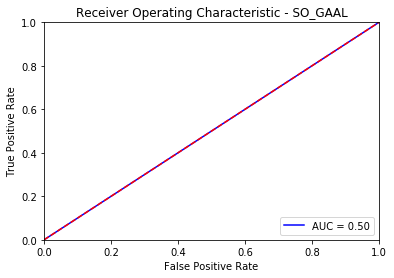

Accuracy:  0.8290666666666666
Precision: -
Recall:  0.0
F1-score: -
Duration:  95.525117  seconds


Epoch 1 of 60

Testing for epoch 1 index 1:


/home/rudda/anaconda3/lib/python3.7/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'



Testing for epoch 1 index 2:

Testing for epoch 1 index 3:

Testing for epoch 1 index 4:

Testing for epoch 1 index 5:

Testing for epoch 1 index 6:

Testing for epoch 1 index 7:

Testing for epoch 1 index 8:

Testing for epoch 1 index 9:

Testing for epoch 1 index 10:

Testing for epoch 1 index 11:

Testing for epoch 1 index 12:

Testing for epoch 1 index 13:

Testing for epoch 1 index 14:

Testing for epoch 1 index 15:

Testing for epoch 1 index 16:

Testing for epoch 1 index 17:

Testing for epoch 1 index 18:

Testing for epoch 1 index 19:

Testing for epoch 1 index 20:

Testing for epoch 1 index 21:

Testing for epoch 1 index 22:

Testing for epoch 1 index 23:

Testing for epoch 1 index 24:

Testing for epoch 1 index 25:

Testing for epoch 1 index 26:

Testing for epoch 1 index 27:

Testing for epoch 1 index 28:

Testing for epoch 1 index 29:

Testing for epoch 1 index 30:

Testing for epoch 1 index 31:

Testing for epoch 1 index 32:

Testing for epoch 1 index 33:

Testing for epo


Testing for epoch 3 index 25:

Testing for epoch 3 index 26:

Testing for epoch 3 index 27:

Testing for epoch 3 index 28:

Testing for epoch 3 index 29:

Testing for epoch 3 index 30:

Testing for epoch 3 index 31:

Testing for epoch 3 index 32:

Testing for epoch 3 index 33:

Testing for epoch 3 index 34:

Testing for epoch 3 index 35:

Testing for epoch 3 index 36:

Testing for epoch 3 index 37:

Testing for epoch 3 index 38:

Testing for epoch 3 index 39:

Testing for epoch 3 index 40:

Testing for epoch 3 index 41:

Testing for epoch 3 index 42:

Testing for epoch 3 index 43:

Testing for epoch 3 index 44:

Testing for epoch 3 index 45:

Testing for epoch 3 index 46:

Testing for epoch 3 index 47:

Testing for epoch 3 index 48:

Testing for epoch 3 index 49:

Testing for epoch 3 index 50:

Testing for epoch 3 index 51:

Testing for epoch 3 index 52:

Testing for epoch 3 index 53:

Testing for epoch 3 index 54:

Testing for epoch 3 index 55:

Testing for epoch 3 index 56:

Testing


Testing for epoch 5 index 48:

Testing for epoch 5 index 49:

Testing for epoch 5 index 50:

Testing for epoch 5 index 51:

Testing for epoch 5 index 52:

Testing for epoch 5 index 53:

Testing for epoch 5 index 54:

Testing for epoch 5 index 55:

Testing for epoch 5 index 56:

Testing for epoch 5 index 57:

Testing for epoch 5 index 58:

Testing for epoch 5 index 59:

Testing for epoch 5 index 60:

Testing for epoch 5 index 61:

Testing for epoch 5 index 62:

Testing for epoch 5 index 63:

Testing for epoch 5 index 64:

Testing for epoch 5 index 65:

Testing for epoch 5 index 66:

Testing for epoch 5 index 67:

Testing for epoch 5 index 68:

Testing for epoch 5 index 69:

Testing for epoch 5 index 70:

Testing for epoch 5 index 71:

Testing for epoch 5 index 72:

Testing for epoch 5 index 73:

Testing for epoch 5 index 74:

Testing for epoch 5 index 75:

Testing for epoch 5 index 76:

Testing for epoch 5 index 77:

Testing for epoch 5 index 78:

Testing for epoch 5 index 79:

Testing


Testing for epoch 7 index 71:

Testing for epoch 7 index 72:

Testing for epoch 7 index 73:

Testing for epoch 7 index 74:

Testing for epoch 7 index 75:

Testing for epoch 7 index 76:

Testing for epoch 7 index 77:

Testing for epoch 7 index 78:

Testing for epoch 7 index 79:

Testing for epoch 7 index 80:

Testing for epoch 7 index 81:

Testing for epoch 7 index 82:

Testing for epoch 7 index 83:

Testing for epoch 7 index 84:

Testing for epoch 7 index 85:

Testing for epoch 7 index 86:

Testing for epoch 7 index 87:

Testing for epoch 7 index 88:

Testing for epoch 7 index 89:

Testing for epoch 7 index 90:

Testing for epoch 7 index 91:

Testing for epoch 7 index 92:

Testing for epoch 7 index 93:

Testing for epoch 7 index 94:

Testing for epoch 7 index 95:

Testing for epoch 7 index 96:

Testing for epoch 7 index 97:

Testing for epoch 7 index 98:

Testing for epoch 7 index 99:

Testing for epoch 7 index 100:

Testing for epoch 7 index 101:

Testing for epoch 7 index 102:

Test


Testing for epoch 9 index 94:

Testing for epoch 9 index 95:

Testing for epoch 9 index 96:

Testing for epoch 9 index 97:

Testing for epoch 9 index 98:

Testing for epoch 9 index 99:

Testing for epoch 9 index 100:

Testing for epoch 9 index 101:

Testing for epoch 9 index 102:

Testing for epoch 9 index 103:

Testing for epoch 9 index 104:

Testing for epoch 9 index 105:

Testing for epoch 9 index 106:

Testing for epoch 9 index 107:

Testing for epoch 9 index 108:

Testing for epoch 9 index 109:

Testing for epoch 9 index 110:

Testing for epoch 9 index 111:

Testing for epoch 9 index 112:

Testing for epoch 9 index 113:

Testing for epoch 9 index 114:

Testing for epoch 9 index 115:

Testing for epoch 9 index 116:

Testing for epoch 9 index 117:

Testing for epoch 9 index 118:

Testing for epoch 9 index 119:

Testing for epoch 9 index 120:
Epoch 10 of 60

Testing for epoch 10 index 1:

Testing for epoch 10 index 2:

Testing for epoch 10 index 3:

Testing for epoch 10 index 4:

Te


Testing for epoch 11 index 109:

Testing for epoch 11 index 110:

Testing for epoch 11 index 111:

Testing for epoch 11 index 112:

Testing for epoch 11 index 113:

Testing for epoch 11 index 114:

Testing for epoch 11 index 115:

Testing for epoch 11 index 116:

Testing for epoch 11 index 117:

Testing for epoch 11 index 118:

Testing for epoch 11 index 119:

Testing for epoch 11 index 120:
Epoch 12 of 60

Testing for epoch 12 index 1:

Testing for epoch 12 index 2:

Testing for epoch 12 index 3:

Testing for epoch 12 index 4:

Testing for epoch 12 index 5:

Testing for epoch 12 index 6:

Testing for epoch 12 index 7:

Testing for epoch 12 index 8:

Testing for epoch 12 index 9:

Testing for epoch 12 index 10:

Testing for epoch 12 index 11:

Testing for epoch 12 index 12:

Testing for epoch 12 index 13:

Testing for epoch 12 index 14:

Testing for epoch 12 index 15:

Testing for epoch 12 index 16:

Testing for epoch 12 index 17:

Testing for epoch 12 index 18:

Testing for epoch 12 


Testing for epoch 14 index 3:

Testing for epoch 14 index 4:

Testing for epoch 14 index 5:

Testing for epoch 14 index 6:

Testing for epoch 14 index 7:

Testing for epoch 14 index 8:

Testing for epoch 14 index 9:

Testing for epoch 14 index 10:

Testing for epoch 14 index 11:

Testing for epoch 14 index 12:

Testing for epoch 14 index 13:

Testing for epoch 14 index 14:

Testing for epoch 14 index 15:

Testing for epoch 14 index 16:

Testing for epoch 14 index 17:

Testing for epoch 14 index 18:

Testing for epoch 14 index 19:

Testing for epoch 14 index 20:

Testing for epoch 14 index 21:

Testing for epoch 14 index 22:

Testing for epoch 14 index 23:

Testing for epoch 14 index 24:

Testing for epoch 14 index 25:

Testing for epoch 14 index 26:

Testing for epoch 14 index 27:

Testing for epoch 14 index 28:

Testing for epoch 14 index 29:

Testing for epoch 14 index 30:

Testing for epoch 14 index 31:

Testing for epoch 14 index 32:

Testing for epoch 14 index 33:

Testing for ep


Testing for epoch 16 index 18:

Testing for epoch 16 index 19:

Testing for epoch 16 index 20:

Testing for epoch 16 index 21:

Testing for epoch 16 index 22:

Testing for epoch 16 index 23:

Testing for epoch 16 index 24:

Testing for epoch 16 index 25:

Testing for epoch 16 index 26:

Testing for epoch 16 index 27:

Testing for epoch 16 index 28:

Testing for epoch 16 index 29:

Testing for epoch 16 index 30:

Testing for epoch 16 index 31:

Testing for epoch 16 index 32:

Testing for epoch 16 index 33:

Testing for epoch 16 index 34:

Testing for epoch 16 index 35:

Testing for epoch 16 index 36:

Testing for epoch 16 index 37:

Testing for epoch 16 index 38:

Testing for epoch 16 index 39:

Testing for epoch 16 index 40:

Testing for epoch 16 index 41:

Testing for epoch 16 index 42:

Testing for epoch 16 index 43:

Testing for epoch 16 index 44:

Testing for epoch 16 index 45:

Testing for epoch 16 index 46:

Testing for epoch 16 index 47:

Testing for epoch 16 index 48:

Testing


Testing for epoch 18 index 33:

Testing for epoch 18 index 34:

Testing for epoch 18 index 35:

Testing for epoch 18 index 36:

Testing for epoch 18 index 37:

Testing for epoch 18 index 38:

Testing for epoch 18 index 39:

Testing for epoch 18 index 40:

Testing for epoch 18 index 41:

Testing for epoch 18 index 42:

Testing for epoch 18 index 43:

Testing for epoch 18 index 44:

Testing for epoch 18 index 45:

Testing for epoch 18 index 46:

Testing for epoch 18 index 47:

Testing for epoch 18 index 48:

Testing for epoch 18 index 49:

Testing for epoch 18 index 50:

Testing for epoch 18 index 51:

Testing for epoch 18 index 52:

Testing for epoch 18 index 53:

Testing for epoch 18 index 54:

Testing for epoch 18 index 55:

Testing for epoch 18 index 56:

Testing for epoch 18 index 57:

Testing for epoch 18 index 58:

Testing for epoch 18 index 59:

Testing for epoch 18 index 60:

Testing for epoch 18 index 61:

Testing for epoch 18 index 62:

Testing for epoch 18 index 63:

Testing


Testing for epoch 20 index 48:

Testing for epoch 20 index 49:

Testing for epoch 20 index 50:

Testing for epoch 20 index 51:

Testing for epoch 20 index 52:

Testing for epoch 20 index 53:

Testing for epoch 20 index 54:

Testing for epoch 20 index 55:

Testing for epoch 20 index 56:

Testing for epoch 20 index 57:

Testing for epoch 20 index 58:

Testing for epoch 20 index 59:

Testing for epoch 20 index 60:

Testing for epoch 20 index 61:

Testing for epoch 20 index 62:

Testing for epoch 20 index 63:

Testing for epoch 20 index 64:

Testing for epoch 20 index 65:

Testing for epoch 20 index 66:

Testing for epoch 20 index 67:

Testing for epoch 20 index 68:

Testing for epoch 20 index 69:

Testing for epoch 20 index 70:

Testing for epoch 20 index 71:

Testing for epoch 20 index 72:

Testing for epoch 20 index 73:

Testing for epoch 20 index 74:

Testing for epoch 20 index 75:

Testing for epoch 20 index 76:

Testing for epoch 20 index 77:

Testing for epoch 20 index 78:

Testing

500/500 [==============================] - 0s 14us/step

Testing for epoch 21 index 26:
500/500 [==============================] - 0s 15us/step

Testing for epoch 21 index 27:
500/500 [==============================] - 0s 14us/step

Testing for epoch 21 index 28:
500/500 [==============================] - 0s 15us/step

Testing for epoch 21 index 29:
500/500 [==============================] - 0s 16us/step

Testing for epoch 21 index 30:
500/500 [==============================] - 0s 21us/step

Testing for epoch 21 index 31:
500/500 [==============================] - 0s 15us/step

Testing for epoch 21 index 32:
500/500 [==============================] - 0s 16us/step

Testing for epoch 21 index 33:
500/500 [==============================] - 0s 14us/step

Testing for epoch 21 index 34:
500/500 [==============================] - 0s 14us/step

Testing for epoch 21 index 35:
500/500 [==============================] - 0s 14us/step

Testing for epoch 21 index 36:
500/500 [=======================

500/500 [==============================] - 0s 14us/step

Testing for epoch 21 index 54:
500/500 [==============================] - 0s 17us/step

Testing for epoch 21 index 55:
500/500 [==============================] - 0s 15us/step

Testing for epoch 21 index 56:
500/500 [==============================] - 0s 14us/step

Testing for epoch 21 index 57:
500/500 [==============================] - 0s 15us/step

Testing for epoch 21 index 58:
500/500 [==============================] - 0s 15us/step

Testing for epoch 21 index 59:
500/500 [==============================] - 0s 14us/step

Testing for epoch 21 index 60:
500/500 [==============================] - 0s 16us/step

Testing for epoch 21 index 61:
500/500 [==============================] - 0s 16us/step

Testing for epoch 21 index 62:
500/500 [==============================] - 0s 14us/step

Testing for epoch 21 index 63:
500/500 [==============================] - 0s 15us/step

Testing for epoch 21 index 64:
500/500 [=======================

500/500 [==============================] - 0s 14us/step

Testing for epoch 21 index 81:
500/500 [==============================] - 0s 14us/step

Testing for epoch 21 index 82:
500/500 [==============================] - 0s 14us/step

Testing for epoch 21 index 83:
500/500 [==============================] - 0s 14us/step

Testing for epoch 21 index 84:
500/500 [==============================] - 0s 14us/step

Testing for epoch 21 index 85:
500/500 [==============================] - 0s 14us/step

Testing for epoch 21 index 86:
500/500 [==============================] - 0s 21us/step

Testing for epoch 21 index 87:
500/500 [==============================] - 0s 16us/step

Testing for epoch 21 index 88:
500/500 [==============================] - 0s 16us/step

Testing for epoch 21 index 89:
500/500 [==============================] - 0s 14us/step

Testing for epoch 21 index 90:
500/500 [==============================] - 0s 17us/step

Testing for epoch 21 index 91:
500/500 [=======================

500/500 [==============================] - 0s 14us/step

Testing for epoch 21 index 109:
500/500 [==============================] - 0s 16us/step

Testing for epoch 21 index 110:
500/500 [==============================] - 0s 20us/step

Testing for epoch 21 index 111:
500/500 [==============================] - 0s 32us/step

Testing for epoch 21 index 112:
500/500 [==============================] - 0s 19us/step

Testing for epoch 21 index 113:
500/500 [==============================] - 0s 16us/step

Testing for epoch 21 index 114:
500/500 [==============================] - 0s 17us/step

Testing for epoch 21 index 115:
500/500 [==============================] - 0s 18us/step

Testing for epoch 21 index 116:
500/500 [==============================] - 0s 16us/step

Testing for epoch 21 index 117:
500/500 [==============================] - 0s 15us/step

Testing for epoch 21 index 118:
500/500 [==============================] - 0s 16us/step

Testing for epoch 21 index 119:
500/500 [============

500/500 [==============================] - 0s 15us/step

Testing for epoch 22 index 16:
500/500 [==============================] - 0s 15us/step

Testing for epoch 22 index 17:
500/500 [==============================] - 0s 15us/step

Testing for epoch 22 index 18:
500/500 [==============================] - 0s 17us/step

Testing for epoch 22 index 19:
500/500 [==============================] - 0s 14us/step

Testing for epoch 22 index 20:
500/500 [==============================] - 0s 21us/step

Testing for epoch 22 index 21:
500/500 [==============================] - 0s 16us/step

Testing for epoch 22 index 22:
500/500 [==============================] - 0s 45us/step

Testing for epoch 22 index 23:
500/500 [==============================] - 0s 16us/step

Testing for epoch 22 index 24:
500/500 [==============================] - 0s 18us/step

Testing for epoch 22 index 25:
500/500 [==============================] - 0s 35us/step

Testing for epoch 22 index 26:
500/500 [=======================

500/500 [==============================] - 0s 16us/step

Testing for epoch 22 index 44:
500/500 [==============================] - 0s 16us/step

Testing for epoch 22 index 45:
500/500 [==============================] - 0s 15us/step

Testing for epoch 22 index 46:
500/500 [==============================] - 0s 16us/step

Testing for epoch 22 index 47:
500/500 [==============================] - 0s 17us/step

Testing for epoch 22 index 48:
500/500 [==============================] - 0s 17us/step

Testing for epoch 22 index 49:
500/500 [==============================] - 0s 16us/step

Testing for epoch 22 index 50:
500/500 [==============================] - 0s 18us/step

Testing for epoch 22 index 51:
500/500 [==============================] - 0s 19us/step

Testing for epoch 22 index 52:
500/500 [==============================] - 0s 15us/step

Testing for epoch 22 index 53:
500/500 [==============================] - 0s 17us/step

Testing for epoch 22 index 54:
500/500 [=======================

500/500 [==============================] - 0s 16us/step

Testing for epoch 22 index 72:
500/500 [==============================] - 0s 16us/step

Testing for epoch 22 index 73:
500/500 [==============================] - 0s 15us/step

Testing for epoch 22 index 74:
500/500 [==============================] - 0s 17us/step

Testing for epoch 22 index 75:
500/500 [==============================] - 0s 16us/step

Testing for epoch 22 index 76:
500/500 [==============================] - 0s 18us/step

Testing for epoch 22 index 77:
500/500 [==============================] - 0s 16us/step

Testing for epoch 22 index 78:
500/500 [==============================] - 0s 17us/step

Testing for epoch 22 index 79:
500/500 [==============================] - 0s 16us/step

Testing for epoch 22 index 80:
500/500 [==============================] - 0s 18us/step

Testing for epoch 22 index 81:
500/500 [==============================] - 0s 16us/step

Testing for epoch 22 index 82:
500/500 [=======================

500/500 [==============================] - 0s 16us/step

Testing for epoch 22 index 99:
500/500 [==============================] - 0s 15us/step

Testing for epoch 22 index 100:
500/500 [==============================] - 0s 17us/step

Testing for epoch 22 index 101:
500/500 [==============================] - 0s 18us/step

Testing for epoch 22 index 102:
500/500 [==============================] - 0s 17us/step

Testing for epoch 22 index 103:
500/500 [==============================] - 0s 17us/step

Testing for epoch 22 index 104:
500/500 [==============================] - 0s 18us/step

Testing for epoch 22 index 105:
500/500 [==============================] - 0s 17us/step

Testing for epoch 22 index 106:
500/500 [==============================] - 0s 16us/step

Testing for epoch 22 index 107:
500/500 [==============================] - 0s 18us/step

Testing for epoch 22 index 108:
500/500 [==============================] - 0s 16us/step

Testing for epoch 22 index 109:
500/500 [=============

500/500 [==============================] - 0s 19us/step

Testing for epoch 23 index 7:
500/500 [==============================] - 0s 16us/step

Testing for epoch 23 index 8:
500/500 [==============================] - 0s 14us/step

Testing for epoch 23 index 9:
500/500 [==============================] - 0s 15us/step

Testing for epoch 23 index 10:
500/500 [==============================] - 0s 17us/step

Testing for epoch 23 index 11:
500/500 [==============================] - 0s 18us/step

Testing for epoch 23 index 12:
500/500 [==============================] - 0s 20us/step

Testing for epoch 23 index 13:
500/500 [==============================] - 0s 17us/step

Testing for epoch 23 index 14:
500/500 [==============================] - 0s 15us/step

Testing for epoch 23 index 15:
500/500 [==============================] - 0s 18us/step

Testing for epoch 23 index 16:
500/500 [==============================] - 0s 15us/step

Testing for epoch 23 index 17:
500/500 [==========================

500/500 [==============================] - 0s 16us/step

Testing for epoch 23 index 34:
500/500 [==============================] - 0s 16us/step

Testing for epoch 23 index 35:
500/500 [==============================] - 0s 18us/step

Testing for epoch 23 index 36:
500/500 [==============================] - 0s 17us/step

Testing for epoch 23 index 37:
500/500 [==============================] - 0s 16us/step

Testing for epoch 23 index 38:
500/500 [==============================] - 0s 16us/step

Testing for epoch 23 index 39:
500/500 [==============================] - 0s 15us/step

Testing for epoch 23 index 40:
500/500 [==============================] - 0s 17us/step

Testing for epoch 23 index 41:
500/500 [==============================] - 0s 17us/step

Testing for epoch 23 index 42:
500/500 [==============================] - 0s 17us/step

Testing for epoch 23 index 43:
500/500 [==============================] - 0s 17us/step

Testing for epoch 23 index 44:
500/500 [=======================

500/500 [==============================] - 0s 18us/step

Testing for epoch 23 index 62:
500/500 [==============================] - 0s 16us/step

Testing for epoch 23 index 63:
500/500 [==============================] - 0s 19us/step

Testing for epoch 23 index 64:
500/500 [==============================] - 0s 17us/step

Testing for epoch 23 index 65:
500/500 [==============================] - 0s 16us/step

Testing for epoch 23 index 66:
500/500 [==============================] - 0s 18us/step

Testing for epoch 23 index 67:
500/500 [==============================] - 0s 17us/step

Testing for epoch 23 index 68:
500/500 [==============================] - 0s 17us/step

Testing for epoch 23 index 69:
500/500 [==============================] - 0s 13us/step

Testing for epoch 23 index 70:
500/500 [==============================] - 0s 18us/step

Testing for epoch 23 index 71:
500/500 [==============================] - 0s 18us/step

Testing for epoch 23 index 72:
500/500 [=======================

500/500 [==============================] - 0s 17us/step

Testing for epoch 23 index 90:
500/500 [==============================] - 0s 17us/step

Testing for epoch 23 index 91:
500/500 [==============================] - 0s 36us/step

Testing for epoch 23 index 92:
500/500 [==============================] - 0s 16us/step

Testing for epoch 23 index 93:
500/500 [==============================] - 0s 16us/step

Testing for epoch 23 index 94:
500/500 [==============================] - 0s 17us/step

Testing for epoch 23 index 95:
500/500 [==============================] - 0s 19us/step

Testing for epoch 23 index 96:
500/500 [==============================] - 0s 30us/step

Testing for epoch 23 index 97:
500/500 [==============================] - 0s 17us/step

Testing for epoch 23 index 98:
500/500 [==============================] - 0s 27us/step

Testing for epoch 23 index 99:
500/500 [==============================] - 0s 18us/step

Testing for epoch 23 index 100:
500/500 [======================

500/500 [==============================] - 0s 18us/step

Testing for epoch 23 index 117:
500/500 [==============================] - 0s 39us/step

Testing for epoch 23 index 118:
500/500 [==============================] - 0s 17us/step

Testing for epoch 23 index 119:
500/500 [==============================] - 0s 31us/step

Testing for epoch 23 index 120:
500/500 [==============================] - 0s 16us/step
Epoch 24 of 60

Testing for epoch 24 index 1:
500/500 [==============================] - 0s 17us/step

Testing for epoch 24 index 2:
500/500 [==============================] - 0s 29us/step

Testing for epoch 24 index 3:
500/500 [==============================] - 0s 18us/step

Testing for epoch 24 index 4:
500/500 [==============================] - 0s 14us/step

Testing for epoch 24 index 5:
500/500 [==============================] - 0s 20us/step

Testing for epoch 24 index 6:
500/500 [==============================] - 0s 17us/step

Testing for epoch 24 index 7:
500/500 [===========

500/500 [==============================] - 0s 16us/step

Testing for epoch 24 index 25:
500/500 [==============================] - 0s 16us/step

Testing for epoch 24 index 26:
500/500 [==============================] - 0s 15us/step

Testing for epoch 24 index 27:
500/500 [==============================] - 0s 16us/step

Testing for epoch 24 index 28:
500/500 [==============================] - 0s 16us/step

Testing for epoch 24 index 29:
500/500 [==============================] - 0s 18us/step

Testing for epoch 24 index 30:
500/500 [==============================] - 0s 17us/step

Testing for epoch 24 index 31:
500/500 [==============================] - 0s 16us/step

Testing for epoch 24 index 32:
500/500 [==============================] - 0s 17us/step

Testing for epoch 24 index 33:
500/500 [==============================] - 0s 35us/step

Testing for epoch 24 index 34:
500/500 [==============================] - 0s 16us/step

Testing for epoch 24 index 35:
500/500 [=======================

500/500 [==============================] - 0s 19us/step

Testing for epoch 24 index 52:
500/500 [==============================] - 0s 15us/step

Testing for epoch 24 index 53:
500/500 [==============================] - 0s 14us/step

Testing for epoch 24 index 54:
500/500 [==============================] - 0s 14us/step

Testing for epoch 24 index 55:
500/500 [==============================] - 0s 16us/step

Testing for epoch 24 index 56:
500/500 [==============================] - 0s 49us/step

Testing for epoch 24 index 57:
500/500 [==============================] - 0s 22us/step

Testing for epoch 24 index 58:
500/500 [==============================] - 0s 15us/step

Testing for epoch 24 index 59:
500/500 [==============================] - 0s 13us/step

Testing for epoch 24 index 60:
500/500 [==============================] - 0s 15us/step

Testing for epoch 24 index 61:
500/500 [==============================] - 0s 14us/step

Testing for epoch 24 index 62:
500/500 [=======================

500/500 [==============================] - 0s 16us/step

Testing for epoch 24 index 80:
500/500 [==============================] - 0s 16us/step

Testing for epoch 24 index 81:
500/500 [==============================] - 0s 15us/step

Testing for epoch 24 index 82:
500/500 [==============================] - 0s 15us/step

Testing for epoch 24 index 83:
500/500 [==============================] - 0s 14us/step

Testing for epoch 24 index 84:
500/500 [==============================] - 0s 17us/step

Testing for epoch 24 index 85:
500/500 [==============================] - 0s 15us/step

Testing for epoch 24 index 86:
500/500 [==============================] - 0s 14us/step

Testing for epoch 24 index 87:
500/500 [==============================] - 0s 14us/step

Testing for epoch 24 index 88:
500/500 [==============================] - 0s 15us/step

Testing for epoch 24 index 89:
500/500 [==============================] - 0s 14us/step

Testing for epoch 24 index 90:
500/500 [=======================

500/500 [==============================] - 0s 16us/step

Testing for epoch 24 index 108:
500/500 [==============================] - 0s 16us/step

Testing for epoch 24 index 109:
500/500 [==============================] - 0s 29us/step

Testing for epoch 24 index 110:
500/500 [==============================] - 0s 18us/step

Testing for epoch 24 index 111:
500/500 [==============================] - 0s 19us/step

Testing for epoch 24 index 112:
500/500 [==============================] - 0s 17us/step

Testing for epoch 24 index 113:
500/500 [==============================] - 0s 20us/step

Testing for epoch 24 index 114:
500/500 [==============================] - 0s 23us/step

Testing for epoch 24 index 115:
500/500 [==============================] - 0s 52us/step

Testing for epoch 24 index 116:
500/500 [==============================] - 0s 13us/step

Testing for epoch 24 index 117:
500/500 [==============================] - 0s 16us/step

Testing for epoch 24 index 118:
500/500 [============

500/500 [==============================] - 0s 15us/step

Testing for epoch 25 index 15:
500/500 [==============================] - 0s 13us/step

Testing for epoch 25 index 16:
500/500 [==============================] - 0s 16us/step

Testing for epoch 25 index 17:
500/500 [==============================] - 0s 16us/step

Testing for epoch 25 index 18:
500/500 [==============================] - 0s 15us/step

Testing for epoch 25 index 19:
500/500 [==============================] - 0s 13us/step

Testing for epoch 25 index 20:
500/500 [==============================] - 0s 14us/step

Testing for epoch 25 index 21:
500/500 [==============================] - 0s 15us/step

Testing for epoch 25 index 22:
500/500 [==============================] - 0s 14us/step

Testing for epoch 25 index 23:
500/500 [==============================] - 0s 14us/step

Testing for epoch 25 index 24:
500/500 [==============================] - 0s 15us/step

Testing for epoch 25 index 25:
500/500 [=======================

500/500 [==============================] - 0s 32us/step

Testing for epoch 25 index 43:
500/500 [==============================] - 0s 17us/step

Testing for epoch 25 index 44:
500/500 [==============================] - 0s 15us/step

Testing for epoch 25 index 45:
500/500 [==============================] - 0s 19us/step

Testing for epoch 25 index 46:
500/500 [==============================] - 0s 15us/step

Testing for epoch 25 index 47:
500/500 [==============================] - 0s 19us/step

Testing for epoch 25 index 48:
500/500 [==============================] - 0s 16us/step

Testing for epoch 25 index 49:
500/500 [==============================] - 0s 19us/step

Testing for epoch 25 index 50:
500/500 [==============================] - 0s 17us/step

Testing for epoch 25 index 51:
500/500 [==============================] - 0s 15us/step

Testing for epoch 25 index 52:
500/500 [==============================] - 0s 17us/step

Testing for epoch 25 index 53:
500/500 [=======================

500/500 [==============================] - 0s 14us/step

Testing for epoch 25 index 70:
500/500 [==============================] - 0s 15us/step

Testing for epoch 25 index 71:
500/500 [==============================] - 0s 17us/step

Testing for epoch 25 index 72:
500/500 [==============================] - 0s 18us/step

Testing for epoch 25 index 73:
500/500 [==============================] - 0s 17us/step

Testing for epoch 25 index 74:
500/500 [==============================] - 0s 32us/step

Testing for epoch 25 index 75:
500/500 [==============================] - 0s 15us/step

Testing for epoch 25 index 76:
500/500 [==============================] - 0s 17us/step

Testing for epoch 25 index 77:
500/500 [==============================] - 0s 16us/step

Testing for epoch 25 index 78:
500/500 [==============================] - 0s 35us/step

Testing for epoch 25 index 79:
500/500 [==============================] - 0s 18us/step

Testing for epoch 25 index 80:
500/500 [=======================

500/500 [==============================] - 0s 19us/step

Testing for epoch 25 index 98:
500/500 [==============================] - 0s 16us/step

Testing for epoch 25 index 99:
500/500 [==============================] - 0s 16us/step

Testing for epoch 25 index 100:
500/500 [==============================] - 0s 17us/step

Testing for epoch 25 index 101:
500/500 [==============================] - 0s 18us/step

Testing for epoch 25 index 102:
500/500 [==============================] - 0s 16us/step

Testing for epoch 25 index 103:
500/500 [==============================] - 0s 17us/step

Testing for epoch 25 index 104:
500/500 [==============================] - 0s 16us/step

Testing for epoch 25 index 105:
500/500 [==============================] - 0s 15us/step

Testing for epoch 25 index 106:
500/500 [==============================] - 0s 14us/step

Testing for epoch 25 index 107:
500/500 [==============================] - 0s 15us/step

Testing for epoch 25 index 108:
500/500 [==============

500/500 [==============================] - 0s 16us/step

Testing for epoch 26 index 6:
500/500 [==============================] - 0s 18us/step

Testing for epoch 26 index 7:
500/500 [==============================] - 0s 17us/step

Testing for epoch 26 index 8:
500/500 [==============================] - 0s 16us/step

Testing for epoch 26 index 9:
500/500 [==============================] - 0s 18us/step

Testing for epoch 26 index 10:
500/500 [==============================] - 0s 16us/step

Testing for epoch 26 index 11:
500/500 [==============================] - 0s 14us/step

Testing for epoch 26 index 12:
500/500 [==============================] - 0s 19us/step

Testing for epoch 26 index 13:
500/500 [==============================] - 0s 17us/step

Testing for epoch 26 index 14:
500/500 [==============================] - 0s 16us/step

Testing for epoch 26 index 15:
500/500 [==============================] - 0s 18us/step

Testing for epoch 26 index 16:
500/500 [===========================


Testing for epoch 26 index 19:
500/500 [==============================] - 0s 17us/step

Testing for epoch 26 index 20:
500/500 [==============================] - 0s 17us/step

Testing for epoch 26 index 21:
500/500 [==============================] - 0s 52us/step

Testing for epoch 26 index 22:
500/500 [==============================] - 0s 35us/step

Testing for epoch 26 index 23:
500/500 [==============================] - 0s 17us/step

Testing for epoch 26 index 24:
500/500 [==============================] - 0s 18us/step

Testing for epoch 26 index 25:
500/500 [==============================] - 0s 14us/step

Testing for epoch 26 index 26:
500/500 [==============================] - 0s 16us/step

Testing for epoch 26 index 27:
500/500 [==============================] - 0s 19us/step

Testing for epoch 26 index 28:
500/500 [==============================] - 0s 17us/step

Testing for epoch 26 index 29:
500/500 [==============================] - 0s 17us/step

Testing for epoch 26 index 30:


500/500 [==============================] - 0s 20us/step

Testing for epoch 26 index 47:
500/500 [==============================] - 0s 16us/step

Testing for epoch 26 index 48:
500/500 [==============================] - 0s 19us/step

Testing for epoch 26 index 49:
500/500 [==============================] - 0s 14us/step

Testing for epoch 26 index 50:
500/500 [==============================] - 0s 17us/step

Testing for epoch 26 index 51:
500/500 [==============================] - 0s 16us/step

Testing for epoch 26 index 52:
500/500 [==============================] - 0s 18us/step

Testing for epoch 26 index 53:
500/500 [==============================] - 0s 17us/step

Testing for epoch 26 index 54:
500/500 [==============================] - 0s 17us/step

Testing for epoch 26 index 55:
500/500 [==============================] - 0s 18us/step

Testing for epoch 26 index 56:
500/500 [==============================] - 0s 18us/step

Testing for epoch 26 index 57:
500/500 [=======================

500/500 [==============================] - 0s 17us/step

Testing for epoch 26 index 75:
500/500 [==============================] - 0s 17us/step

Testing for epoch 26 index 76:
500/500 [==============================] - 0s 17us/step

Testing for epoch 26 index 77:
500/500 [==============================] - 0s 14us/step

Testing for epoch 26 index 78:
500/500 [==============================] - 0s 16us/step

Testing for epoch 26 index 79:
500/500 [==============================] - 0s 16us/step

Testing for epoch 26 index 80:
500/500 [==============================] - 0s 16us/step

Testing for epoch 26 index 81:
500/500 [==============================] - 0s 18us/step

Testing for epoch 26 index 82:
500/500 [==============================] - 0s 16us/step

Testing for epoch 26 index 83:
500/500 [==============================] - 0s 18us/step

Testing for epoch 26 index 84:
500/500 [==============================] - 0s 17us/step

Testing for epoch 26 index 85:
500/500 [=======================

500/500 [==============================] - 0s 15us/step

Testing for epoch 26 index 102:
500/500 [==============================] - 0s 17us/step

Testing for epoch 26 index 103:
500/500 [==============================] - 0s 19us/step

Testing for epoch 26 index 104:
500/500 [==============================] - 0s 16us/step

Testing for epoch 26 index 105:
500/500 [==============================] - 0s 17us/step

Testing for epoch 26 index 106:
500/500 [==============================] - 0s 17us/step

Testing for epoch 26 index 107:
500/500 [==============================] - 0s 17us/step

Testing for epoch 26 index 108:
500/500 [==============================] - 0s 18us/step

Testing for epoch 26 index 109:
500/500 [==============================] - 0s 19us/step

Testing for epoch 26 index 110:
500/500 [==============================] - 0s 18us/step

Testing for epoch 26 index 111:
500/500 [==============================] - 0s 27us/step

Testing for epoch 26 index 112:
500/500 [============

500/500 [==============================] - 0s 16us/step

Testing for epoch 27 index 10:
500/500 [==============================] - 0s 20us/step

Testing for epoch 27 index 11:
500/500 [==============================] - 0s 18us/step

Testing for epoch 27 index 12:
500/500 [==============================] - 0s 18us/step

Testing for epoch 27 index 13:
500/500 [==============================] - 0s 15us/step

Testing for epoch 27 index 14:
500/500 [==============================] - 0s 17us/step

Testing for epoch 27 index 15:
500/500 [==============================] - 0s 15us/step

Testing for epoch 27 index 16:
500/500 [==============================] - 0s 16us/step

Testing for epoch 27 index 17:
500/500 [==============================] - 0s 16us/step

Testing for epoch 27 index 18:
500/500 [==============================] - 0s 16us/step

Testing for epoch 27 index 19:
500/500 [==============================] - 0s 15us/step

Testing for epoch 27 index 20:
500/500 [=======================

500/500 [==============================] - 0s 16us/step

Testing for epoch 27 index 38:
500/500 [==============================] - 0s 16us/step

Testing for epoch 27 index 39:
500/500 [==============================] - 0s 17us/step

Testing for epoch 27 index 40:
500/500 [==============================] - 0s 17us/step

Testing for epoch 27 index 41:
500/500 [==============================] - 0s 17us/step

Testing for epoch 27 index 42:
500/500 [==============================] - 0s 18us/step

Testing for epoch 27 index 43:
500/500 [==============================] - 0s 18us/step

Testing for epoch 27 index 44:
500/500 [==============================] - 0s 16us/step

Testing for epoch 27 index 45:
500/500 [==============================] - 0s 19us/step

Testing for epoch 27 index 46:
500/500 [==============================] - 0s 18us/step

Testing for epoch 27 index 47:
500/500 [==============================] - 0s 16us/step

Testing for epoch 27 index 48:
500/500 [=======================

500/500 [==============================] - 0s 16us/step

Testing for epoch 27 index 65:
500/500 [==============================] - 0s 18us/step

Testing for epoch 27 index 66:
500/500 [==============================] - 0s 16us/step

Testing for epoch 27 index 67:
500/500 [==============================] - 0s 18us/step

Testing for epoch 27 index 68:
500/500 [==============================] - 0s 16us/step

Testing for epoch 27 index 69:
500/500 [==============================] - 0s 17us/step

Testing for epoch 27 index 70:
500/500 [==============================] - 0s 17us/step

Testing for epoch 27 index 71:
500/500 [==============================] - 0s 16us/step

Testing for epoch 27 index 72:
500/500 [==============================] - 0s 18us/step

Testing for epoch 27 index 73:
500/500 [==============================] - 0s 16us/step

Testing for epoch 27 index 74:
500/500 [==============================] - 0s 19us/step

Testing for epoch 27 index 75:
500/500 [=======================

500/500 [==============================] - 0s 17us/step

Testing for epoch 27 index 93:
500/500 [==============================] - 0s 16us/step

Testing for epoch 27 index 94:
500/500 [==============================] - 0s 16us/step

Testing for epoch 27 index 95:
500/500 [==============================] - 0s 17us/step

Testing for epoch 27 index 96:
500/500 [==============================] - 0s 16us/step

Testing for epoch 27 index 97:
500/500 [==============================] - 0s 18us/step

Testing for epoch 27 index 98:
500/500 [==============================] - 0s 15us/step

Testing for epoch 27 index 99:
500/500 [==============================] - 0s 17us/step

Testing for epoch 27 index 100:
500/500 [==============================] - 0s 16us/step

Testing for epoch 27 index 101:
500/500 [==============================] - 0s 15us/step

Testing for epoch 27 index 102:
500/500 [==============================] - 0s 18us/step

Testing for epoch 27 index 103:
500/500 [===================

500/500 [==============================] - 0s 17us/step

Testing for epoch 27 index 120:
500/500 [==============================] - 0s 15us/step
Epoch 28 of 60

Testing for epoch 28 index 1:
500/500 [==============================] - 0s 20us/step

Testing for epoch 28 index 2:
500/500 [==============================] - 0s 14us/step

Testing for epoch 28 index 3:
500/500 [==============================] - 0s 16us/step

Testing for epoch 28 index 4:
500/500 [==============================] - 0s 18us/step

Testing for epoch 28 index 5:
500/500 [==============================] - 0s 19us/step

Testing for epoch 28 index 6:
500/500 [==============================] - 0s 16us/step

Testing for epoch 28 index 7:
500/500 [==============================] - 0s 16us/step

Testing for epoch 28 index 8:
500/500 [==============================] - 0s 16us/step

Testing for epoch 28 index 9:
500/500 [==============================] - 0s 17us/step

Testing for epoch 28 index 10:
500/500 [================

500/500 [==============================] - 0s 18us/step

Testing for epoch 28 index 28:
500/500 [==============================] - 0s 17us/step

Testing for epoch 28 index 29:
500/500 [==============================] - 0s 24us/step

Testing for epoch 28 index 30:
500/500 [==============================] - 0s 19us/step

Testing for epoch 28 index 31:
500/500 [==============================] - 0s 15us/step

Testing for epoch 28 index 32:
500/500 [==============================] - 0s 17us/step

Testing for epoch 28 index 33:
500/500 [==============================] - 0s 16us/step

Testing for epoch 28 index 34:
500/500 [==============================] - 0s 17us/step

Testing for epoch 28 index 35:
500/500 [==============================] - 0s 19us/step

Testing for epoch 28 index 36:
500/500 [==============================] - 0s 20us/step

Testing for epoch 28 index 37:
500/500 [==============================] - 0s 16us/step

Testing for epoch 28 index 38:
500/500 [=======================

500/500 [==============================] - 0s 16us/step

Testing for epoch 28 index 56:
500/500 [==============================] - 0s 16us/step

Testing for epoch 28 index 57:
500/500 [==============================] - 0s 15us/step

Testing for epoch 28 index 58:
500/500 [==============================] - 0s 16us/step

Testing for epoch 28 index 59:
500/500 [==============================] - 0s 17us/step

Testing for epoch 28 index 60:
500/500 [==============================] - 0s 18us/step

Testing for epoch 28 index 61:
500/500 [==============================] - 0s 17us/step

Testing for epoch 28 index 62:
500/500 [==============================] - 0s 28us/step

Testing for epoch 28 index 63:
500/500 [==============================] - 0s 16us/step

Testing for epoch 28 index 64:
500/500 [==============================] - 0s 18us/step

Testing for epoch 28 index 65:
500/500 [==============================] - 0s 18us/step

Testing for epoch 28 index 66:
500/500 [=======================

500/500 [==============================] - 0s 17us/step

Testing for epoch 28 index 83:
500/500 [==============================] - 0s 16us/step

Testing for epoch 28 index 84:
500/500 [==============================] - 0s 16us/step

Testing for epoch 28 index 85:
500/500 [==============================] - 0s 17us/step

Testing for epoch 28 index 86:
500/500 [==============================] - 0s 14us/step

Testing for epoch 28 index 87:
500/500 [==============================] - 0s 17us/step

Testing for epoch 28 index 88:
500/500 [==============================] - 0s 16us/step

Testing for epoch 28 index 89:
500/500 [==============================] - 0s 16us/step

Testing for epoch 28 index 90:
500/500 [==============================] - 0s 18us/step

Testing for epoch 28 index 91:
500/500 [==============================] - 0s 18us/step

Testing for epoch 28 index 92:
500/500 [==============================] - 0s 16us/step

Testing for epoch 28 index 93:
500/500 [=======================

500/500 [==============================] - 0s 16us/step

Testing for epoch 28 index 111:
500/500 [==============================] - 0s 16us/step

Testing for epoch 28 index 112:
500/500 [==============================] - 0s 20us/step

Testing for epoch 28 index 113:
500/500 [==============================] - 0s 18us/step

Testing for epoch 28 index 114:
500/500 [==============================] - 0s 16us/step

Testing for epoch 28 index 115:
500/500 [==============================] - 0s 17us/step

Testing for epoch 28 index 116:
500/500 [==============================] - 0s 15us/step

Testing for epoch 28 index 117:
500/500 [==============================] - 0s 18us/step

Testing for epoch 28 index 118:
500/500 [==============================] - 0s 17us/step

Testing for epoch 28 index 119:
500/500 [==============================] - 0s 18us/step

Testing for epoch 28 index 120:
500/500 [==============================] - 0s 18us/step
Epoch 29 of 60

Testing for epoch 29 index 1:
500/500 

500/500 [==============================] - 0s 17us/step

Testing for epoch 29 index 5:
500/500 [==============================] - 0s 17us/step

Testing for epoch 29 index 6:
500/500 [==============================] - 0s 18us/step

Testing for epoch 29 index 7:
500/500 [==============================] - 0s 15us/step

Testing for epoch 29 index 8:
500/500 [==============================] - 0s 16us/step

Testing for epoch 29 index 9:
500/500 [==============================] - 0s 18us/step

Testing for epoch 29 index 10:
500/500 [==============================] - 0s 15us/step

Testing for epoch 29 index 11:
500/500 [==============================] - 0s 15us/step

Testing for epoch 29 index 12:
500/500 [==============================] - 0s 17us/step

Testing for epoch 29 index 13:
500/500 [==============================] - 0s 17us/step

Testing for epoch 29 index 14:
500/500 [==============================] - 0s 16us/step

Testing for epoch 29 index 15:
500/500 [============================

500/500 [==============================] - 0s 17us/step

Testing for epoch 29 index 18:
500/500 [==============================] - 0s 15us/step

Testing for epoch 29 index 19:
500/500 [==============================] - 0s 16us/step

Testing for epoch 29 index 20:
500/500 [==============================] - 0s 18us/step

Testing for epoch 29 index 21:
500/500 [==============================] - 0s 17us/step

Testing for epoch 29 index 22:
500/500 [==============================] - 0s 15us/step

Testing for epoch 29 index 23:
500/500 [==============================] - 0s 17us/step

Testing for epoch 29 index 24:
500/500 [==============================] - 0s 17us/step

Testing for epoch 29 index 25:
500/500 [==============================] - 0s 16us/step

Testing for epoch 29 index 26:
500/500 [==============================] - 0s 17us/step

Testing for epoch 29 index 27:
500/500 [==============================] - 0s 17us/step

Testing for epoch 29 index 28:
500/500 [=======================

500/500 [==============================] - 0s 16us/step

Testing for epoch 29 index 46:
500/500 [==============================] - 0s 16us/step

Testing for epoch 29 index 47:
500/500 [==============================] - 0s 16us/step

Testing for epoch 29 index 48:
500/500 [==============================] - 0s 17us/step

Testing for epoch 29 index 49:
500/500 [==============================] - 0s 16us/step

Testing for epoch 29 index 50:
500/500 [==============================] - 0s 16us/step

Testing for epoch 29 index 51:
500/500 [==============================] - 0s 16us/step

Testing for epoch 29 index 52:
500/500 [==============================] - 0s 18us/step

Testing for epoch 29 index 53:
500/500 [==============================] - 0s 16us/step

Testing for epoch 29 index 54:
500/500 [==============================] - 0s 15us/step

Testing for epoch 29 index 55:
500/500 [==============================] - 0s 14us/step

Testing for epoch 29 index 56:
500/500 [=======================

500/500 [==============================] - 0s 17us/step

Testing for epoch 29 index 74:
500/500 [==============================] - 0s 14us/step

Testing for epoch 29 index 75:
500/500 [==============================] - 0s 15us/step

Testing for epoch 29 index 76:
500/500 [==============================] - 0s 17us/step

Testing for epoch 29 index 77:
500/500 [==============================] - 0s 15us/step

Testing for epoch 29 index 78:
500/500 [==============================] - 0s 17us/step

Testing for epoch 29 index 79:
500/500 [==============================] - 0s 16us/step

Testing for epoch 29 index 80:
500/500 [==============================] - 0s 18us/step

Testing for epoch 29 index 81:
500/500 [==============================] - 0s 18us/step

Testing for epoch 29 index 82:
500/500 [==============================] - 0s 19us/step

Testing for epoch 29 index 83:
500/500 [==============================] - 0s 16us/step

Testing for epoch 29 index 84:
500/500 [=======================

500/500 [==============================] - 0s 15us/step

Testing for epoch 29 index 101:
500/500 [==============================] - 0s 18us/step

Testing for epoch 29 index 102:
500/500 [==============================] - 0s 17us/step

Testing for epoch 29 index 103:
500/500 [==============================] - 0s 16us/step

Testing for epoch 29 index 104:
500/500 [==============================] - 0s 16us/step

Testing for epoch 29 index 105:
500/500 [==============================] - 0s 19us/step

Testing for epoch 29 index 106:
500/500 [==============================] - 0s 19us/step

Testing for epoch 29 index 107:
500/500 [==============================] - 0s 19us/step

Testing for epoch 29 index 108:
500/500 [==============================] - 0s 15us/step

Testing for epoch 29 index 109:
500/500 [==============================] - 0s 19us/step

Testing for epoch 29 index 110:
500/500 [==============================] - 0s 16us/step

Testing for epoch 29 index 111:
500/500 [============

500/500 [==============================] - 0s 18us/step

Testing for epoch 30 index 9:
500/500 [==============================] - 0s 17us/step

Testing for epoch 30 index 10:
500/500 [==============================] - 0s 18us/step

Testing for epoch 30 index 11:
500/500 [==============================] - 0s 17us/step

Testing for epoch 30 index 12:
500/500 [==============================] - 0s 16us/step

Testing for epoch 30 index 13:
500/500 [==============================] - 0s 17us/step

Testing for epoch 30 index 14:
500/500 [==============================] - 0s 18us/step

Testing for epoch 30 index 15:
500/500 [==============================] - 0s 15us/step

Testing for epoch 30 index 16:
500/500 [==============================] - 0s 17us/step

Testing for epoch 30 index 17:
500/500 [==============================] - 0s 20us/step

Testing for epoch 30 index 18:
500/500 [==============================] - 0s 20us/step

Testing for epoch 30 index 19:
500/500 [========================

500/500 [==============================] - 0s 16us/step

Testing for epoch 30 index 36:
500/500 [==============================] - 0s 17us/step

Testing for epoch 30 index 37:
500/500 [==============================] - 0s 17us/step

Testing for epoch 30 index 38:
500/500 [==============================] - 0s 17us/step

Testing for epoch 30 index 39:
500/500 [==============================] - 0s 16us/step

Testing for epoch 30 index 40:
500/500 [==============================] - 0s 18us/step

Testing for epoch 30 index 41:
500/500 [==============================] - 0s 16us/step

Testing for epoch 30 index 42:
500/500 [==============================] - 0s 16us/step

Testing for epoch 30 index 43:
500/500 [==============================] - 0s 17us/step

Testing for epoch 30 index 44:
500/500 [==============================] - 0s 17us/step

Testing for epoch 30 index 45:
500/500 [==============================] - 0s 16us/step

Testing for epoch 30 index 46:
500/500 [=======================

500/500 [==============================] - 0s 17us/step

Testing for epoch 30 index 64:
500/500 [==============================] - 0s 17us/step

Testing for epoch 30 index 65:
500/500 [==============================] - 0s 17us/step

Testing for epoch 30 index 66:
500/500 [==============================] - 0s 14us/step

Testing for epoch 30 index 67:
500/500 [==============================] - 0s 17us/step

Testing for epoch 30 index 68:
500/500 [==============================] - 0s 19us/step

Testing for epoch 30 index 69:
500/500 [==============================] - 0s 16us/step

Testing for epoch 30 index 70:
500/500 [==============================] - 0s 17us/step

Testing for epoch 30 index 71:
500/500 [==============================] - 0s 18us/step

Testing for epoch 30 index 72:
500/500 [==============================] - 0s 17us/step

Testing for epoch 30 index 73:
500/500 [==============================] - 0s 17us/step

Testing for epoch 30 index 74:
500/500 [=======================

500/500 [==============================] - 0s 19us/step

Testing for epoch 30 index 92:
500/500 [==============================] - 0s 17us/step

Testing for epoch 30 index 93:
500/500 [==============================] - 0s 17us/step

Testing for epoch 30 index 94:
500/500 [==============================] - 0s 17us/step

Testing for epoch 30 index 95:
500/500 [==============================] - 0s 17us/step

Testing for epoch 30 index 96:
500/500 [==============================] - 0s 16us/step

Testing for epoch 30 index 97:
500/500 [==============================] - 0s 15us/step

Testing for epoch 30 index 98:
500/500 [==============================] - 0s 17us/step

Testing for epoch 30 index 99:
500/500 [==============================] - 0s 16us/step

Testing for epoch 30 index 100:
500/500 [==============================] - 0s 17us/step

Testing for epoch 30 index 101:
500/500 [==============================] - 0s 18us/step

Testing for epoch 30 index 102:
500/500 [====================

500/500 [==============================] - 0s 19us/step

Testing for epoch 30 index 119:
500/500 [==============================] - 0s 17us/step

Testing for epoch 30 index 120:
500/500 [==============================] - 0s 14us/step
Epoch 31 of 60

Testing for epoch 31 index 1:
500/500 [==============================] - 0s 17us/step

Testing for epoch 31 index 2:
500/500 [==============================] - 0s 23us/step

Testing for epoch 31 index 3:
500/500 [==============================] - 0s 18us/step

Testing for epoch 31 index 4:
500/500 [==============================] - 0s 15us/step

Testing for epoch 31 index 5:
500/500 [==============================] - 0s 19us/step

Testing for epoch 31 index 6:
500/500 [==============================] - 0s 16us/step

Testing for epoch 31 index 7:
500/500 [==============================] - 0s 18us/step

Testing for epoch 31 index 8:
500/500 [==============================] - 0s 16us/step

Testing for epoch 31 index 9:
500/500 [===============

500/500 [==============================] - 0s 17us/step

Testing for epoch 31 index 27:
500/500 [==============================] - 0s 16us/step

Testing for epoch 31 index 28:
500/500 [==============================] - 0s 16us/step

Testing for epoch 31 index 29:
500/500 [==============================] - 0s 17us/step

Testing for epoch 31 index 30:
500/500 [==============================] - 0s 15us/step

Testing for epoch 31 index 31:
500/500 [==============================] - 0s 18us/step

Testing for epoch 31 index 32:
500/500 [==============================] - 0s 17us/step

Testing for epoch 31 index 33:
500/500 [==============================] - 0s 15us/step

Testing for epoch 31 index 34:
500/500 [==============================] - 0s 18us/step

Testing for epoch 31 index 35:
500/500 [==============================] - 0s 19us/step

Testing for epoch 31 index 36:
500/500 [==============================] - 0s 18us/step

Testing for epoch 31 index 37:
500/500 [=======================

500/500 [==============================] - 0s 15us/step

Testing for epoch 31 index 54:
500/500 [==============================] - 0s 16us/step

Testing for epoch 31 index 55:
500/500 [==============================] - 0s 17us/step

Testing for epoch 31 index 56:
500/500 [==============================] - 0s 18us/step

Testing for epoch 31 index 57:
500/500 [==============================] - 0s 15us/step

Testing for epoch 31 index 58:
500/500 [==============================] - 0s 15us/step

Testing for epoch 31 index 59:
500/500 [==============================] - 0s 17us/step

Testing for epoch 31 index 60:
500/500 [==============================] - 0s 18us/step

Testing for epoch 31 index 61:
500/500 [==============================] - 0s 18us/step

Testing for epoch 31 index 62:
500/500 [==============================] - 0s 17us/step

Testing for epoch 31 index 63:
500/500 [==============================] - 0s 15us/step

Testing for epoch 31 index 64:
500/500 [=======================

500/500 [==============================] - 0s 16us/step

Testing for epoch 31 index 82:
500/500 [==============================] - 0s 15us/step

Testing for epoch 31 index 83:
500/500 [==============================] - 0s 17us/step

Testing for epoch 31 index 84:
500/500 [==============================] - 0s 17us/step

Testing for epoch 31 index 85:
500/500 [==============================] - 0s 17us/step

Testing for epoch 31 index 86:
500/500 [==============================] - 0s 19us/step

Testing for epoch 31 index 87:
500/500 [==============================] - 0s 16us/step

Testing for epoch 31 index 88:
500/500 [==============================] - 0s 17us/step

Testing for epoch 31 index 89:
500/500 [==============================] - 0s 17us/step

Testing for epoch 31 index 90:
500/500 [==============================] - 0s 18us/step

Testing for epoch 31 index 91:
500/500 [==============================] - 0s 17us/step

Testing for epoch 31 index 92:
500/500 [=======================

500/500 [==============================] - 0s 15us/step

Testing for epoch 31 index 110:
500/500 [==============================] - 0s 17us/step

Testing for epoch 31 index 111:
500/500 [==============================] - 0s 18us/step

Testing for epoch 31 index 112:
500/500 [==============================] - 0s 18us/step

Testing for epoch 31 index 113:
500/500 [==============================] - 0s 17us/step

Testing for epoch 31 index 114:
500/500 [==============================] - 0s 19us/step

Testing for epoch 31 index 115:
500/500 [==============================] - 0s 16us/step

Testing for epoch 31 index 116:
500/500 [==============================] - 0s 17us/step

Testing for epoch 31 index 117:
500/500 [==============================] - 0s 18us/step

Testing for epoch 31 index 118:
500/500 [==============================] - 0s 18us/step

Testing for epoch 31 index 119:
500/500 [==============================] - 0s 18us/step

Testing for epoch 31 index 120:
500/500 [============

500/500 [==============================] - 0s 19us/step

Testing for epoch 32 index 17:
500/500 [==============================] - 0s 15us/step

Testing for epoch 32 index 18:
500/500 [==============================] - 0s 17us/step

Testing for epoch 32 index 19:
500/500 [==============================] - 0s 17us/step

Testing for epoch 32 index 20:
500/500 [==============================] - 0s 18us/step

Testing for epoch 32 index 21:
500/500 [==============================] - 0s 18us/step

Testing for epoch 32 index 22:
500/500 [==============================] - 0s 23us/step

Testing for epoch 32 index 23:
500/500 [==============================] - 0s 13us/step

Testing for epoch 32 index 24:
500/500 [==============================] - 0s 18us/step

Testing for epoch 32 index 25:
500/500 [==============================] - 0s 17us/step

Testing for epoch 32 index 26:
500/500 [==============================] - 0s 15us/step

Testing for epoch 32 index 27:
500/500 [=======================

500/500 [==============================] - 0s 17us/step

Testing for epoch 32 index 45:
500/500 [==============================] - 0s 18us/step

Testing for epoch 32 index 46:
500/500 [==============================] - 0s 17us/step

Testing for epoch 32 index 47:
500/500 [==============================] - 0s 16us/step

Testing for epoch 32 index 48:
500/500 [==============================] - 0s 16us/step

Testing for epoch 32 index 49:
500/500 [==============================] - 0s 22us/step

Testing for epoch 32 index 50:
500/500 [==============================] - 0s 15us/step

Testing for epoch 32 index 51:
500/500 [==============================] - 0s 20us/step

Testing for epoch 32 index 52:
500/500 [==============================] - 0s 17us/step

Testing for epoch 32 index 53:
500/500 [==============================] - 0s 16us/step

Testing for epoch 32 index 54:
500/500 [==============================] - 0s 19us/step

Testing for epoch 32 index 55:
500/500 [=======================

500/500 [==============================] - 0s 18us/step

Testing for epoch 32 index 72:
500/500 [==============================] - 0s 15us/step

Testing for epoch 32 index 73:
500/500 [==============================] - 0s 15us/step

Testing for epoch 32 index 74:
500/500 [==============================] - 0s 15us/step

Testing for epoch 32 index 75:
500/500 [==============================] - 0s 19us/step

Testing for epoch 32 index 76:
500/500 [==============================] - 0s 15us/step

Testing for epoch 32 index 77:
500/500 [==============================] - 0s 15us/step

Testing for epoch 32 index 78:
500/500 [==============================] - 0s 16us/step

Testing for epoch 32 index 79:
500/500 [==============================] - 0s 16us/step

Testing for epoch 32 index 80:
500/500 [==============================] - 0s 15us/step

Testing for epoch 32 index 81:
500/500 [==============================] - 0s 17us/step

Testing for epoch 32 index 82:
500/500 [=======================

500/500 [==============================] - 0s 16us/step

Testing for epoch 32 index 100:
500/500 [==============================] - 0s 15us/step

Testing for epoch 32 index 101:
500/500 [==============================] - 0s 16us/step

Testing for epoch 32 index 102:
500/500 [==============================] - 0s 15us/step

Testing for epoch 32 index 103:
500/500 [==============================] - 0s 24us/step

Testing for epoch 32 index 104:
500/500 [==============================] - 0s 18us/step

Testing for epoch 32 index 105:
500/500 [==============================] - 0s 16us/step

Testing for epoch 32 index 106:
500/500 [==============================] - 0s 18us/step

Testing for epoch 32 index 107:
500/500 [==============================] - 0s 16us/step

Testing for epoch 32 index 108:
500/500 [==============================] - 0s 20us/step

Testing for epoch 32 index 109:
500/500 [==============================] - 0s 18us/step

Testing for epoch 32 index 110:
500/500 [============

500/500 [==============================] - 0s 16us/step

Testing for epoch 33 index 8:
500/500 [==============================] - 0s 15us/step

Testing for epoch 33 index 9:
500/500 [==============================] - 0s 15us/step

Testing for epoch 33 index 10:
500/500 [==============================] - 0s 14us/step

Testing for epoch 33 index 11:
500/500 [==============================] - 0s 17us/step

Testing for epoch 33 index 12:
500/500 [==============================] - 0s 17us/step

Testing for epoch 33 index 13:
500/500 [==============================] - 0s 16us/step

Testing for epoch 33 index 14:
500/500 [==============================] - 0s 13us/step

Testing for epoch 33 index 15:
500/500 [==============================] - 0s 15us/step

Testing for epoch 33 index 16:
500/500 [==============================] - 0s 18us/step

Testing for epoch 33 index 17:
500/500 [==============================] - 0s 15us/step

Testing for epoch 33 index 18:
500/500 [=========================


Testing for epoch 33 index 21:
500/500 [==============================] - 0s 15us/step

Testing for epoch 33 index 22:
500/500 [==============================] - 0s 17us/step

Testing for epoch 33 index 23:
500/500 [==============================] - 0s 16us/step

Testing for epoch 33 index 24:
500/500 [==============================] - 0s 17us/step

Testing for epoch 33 index 25:
500/500 [==============================] - 0s 17us/step

Testing for epoch 33 index 26:
500/500 [==============================] - 0s 15us/step

Testing for epoch 33 index 27:
500/500 [==============================] - 0s 14us/step

Testing for epoch 33 index 28:
500/500 [==============================] - 0s 15us/step

Testing for epoch 33 index 29:
500/500 [==============================] - 0s 14us/step

Testing for epoch 33 index 30:
500/500 [==============================] - 0s 15us/step

Testing for epoch 33 index 31:
500/500 [==============================] - 0s 14us/step

Testing for epoch 33 index 32:


500/500 [==============================] - 0s 14us/step

Testing for epoch 33 index 49:
500/500 [==============================] - 0s 15us/step

Testing for epoch 33 index 50:
500/500 [==============================] - 0s 15us/step

Testing for epoch 33 index 51:
500/500 [==============================] - 0s 14us/step

Testing for epoch 33 index 52:
500/500 [==============================] - 0s 15us/step

Testing for epoch 33 index 53:
500/500 [==============================] - 0s 14us/step

Testing for epoch 33 index 54:
500/500 [==============================] - 0s 13us/step

Testing for epoch 33 index 55:
500/500 [==============================] - 0s 14us/step

Testing for epoch 33 index 56:
500/500 [==============================] - 0s 15us/step

Testing for epoch 33 index 57:
500/500 [==============================] - 0s 13us/step

Testing for epoch 33 index 58:
500/500 [==============================] - 0s 17us/step

Testing for epoch 33 index 59:
500/500 [=======================

500/500 [==============================] - 0s 15us/step

Testing for epoch 33 index 77:
500/500 [==============================] - 0s 14us/step

Testing for epoch 33 index 78:
500/500 [==============================] - 0s 13us/step

Testing for epoch 33 index 79:
500/500 [==============================] - 0s 13us/step

Testing for epoch 33 index 80:
500/500 [==============================] - 0s 19us/step

Testing for epoch 33 index 81:
500/500 [==============================] - 0s 15us/step

Testing for epoch 33 index 82:
500/500 [==============================] - 0s 15us/step

Testing for epoch 33 index 83:
500/500 [==============================] - 0s 14us/step

Testing for epoch 33 index 84:
500/500 [==============================] - 0s 15us/step

Testing for epoch 33 index 85:
500/500 [==============================] - 0s 14us/step

Testing for epoch 33 index 86:
500/500 [==============================] - 0s 14us/step

Testing for epoch 33 index 87:
500/500 [=======================

500/500 [==============================] - 0s 15us/step

Testing for epoch 33 index 104:
500/500 [==============================] - 0s 14us/step

Testing for epoch 33 index 105:
500/500 [==============================] - 0s 16us/step

Testing for epoch 33 index 106:
500/500 [==============================] - 0s 15us/step

Testing for epoch 33 index 107:
500/500 [==============================] - 0s 15us/step

Testing for epoch 33 index 108:
500/500 [==============================] - 0s 14us/step

Testing for epoch 33 index 109:
500/500 [==============================] - 0s 13us/step

Testing for epoch 33 index 110:
500/500 [==============================] - 0s 17us/step

Testing for epoch 33 index 111:
500/500 [==============================] - 0s 16us/step

Testing for epoch 33 index 112:
500/500 [==============================] - 0s 15us/step

Testing for epoch 33 index 113:
500/500 [==============================] - 0s 15us/step

Testing for epoch 33 index 114:
500/500 [============

500/500 [==============================] - 0s 14us/step

Testing for epoch 34 index 12:
500/500 [==============================] - 0s 15us/step

Testing for epoch 34 index 13:
500/500 [==============================] - 0s 14us/step

Testing for epoch 34 index 14:
500/500 [==============================] - 0s 14us/step

Testing for epoch 34 index 15:
500/500 [==============================] - 0s 13us/step

Testing for epoch 34 index 16:
500/500 [==============================] - 0s 13us/step

Testing for epoch 34 index 17:
500/500 [==============================] - 0s 14us/step

Testing for epoch 34 index 18:
500/500 [==============================] - 0s 17us/step

Testing for epoch 34 index 19:
500/500 [==============================] - 0s 17us/step

Testing for epoch 34 index 20:
500/500 [==============================] - 0s 13us/step

Testing for epoch 34 index 21:
500/500 [==============================] - 0s 13us/step

Testing for epoch 34 index 22:
500/500 [=======================

500/500 [==============================] - 0s 13us/step

Testing for epoch 34 index 40:
500/500 [==============================] - 0s 14us/step

Testing for epoch 34 index 41:
500/500 [==============================] - 0s 15us/step

Testing for epoch 34 index 42:
500/500 [==============================] - 0s 18us/step

Testing for epoch 34 index 43:
500/500 [==============================] - 0s 15us/step

Testing for epoch 34 index 44:
500/500 [==============================] - 0s 14us/step

Testing for epoch 34 index 45:
500/500 [==============================] - 0s 14us/step

Testing for epoch 34 index 46:
500/500 [==============================] - 0s 14us/step

Testing for epoch 34 index 47:
500/500 [==============================] - 0s 16us/step

Testing for epoch 34 index 48:
500/500 [==============================] - 0s 16us/step

Testing for epoch 34 index 49:
500/500 [==============================] - 0s 16us/step

Testing for epoch 34 index 50:
500/500 [=======================

500/500 [==============================] - 0s 14us/step

Testing for epoch 34 index 67:
500/500 [==============================] - 0s 15us/step

Testing for epoch 34 index 68:
500/500 [==============================] - 0s 15us/step

Testing for epoch 34 index 69:
500/500 [==============================] - 0s 14us/step

Testing for epoch 34 index 70:
500/500 [==============================] - 0s 15us/step

Testing for epoch 34 index 71:
500/500 [==============================] - 0s 15us/step

Testing for epoch 34 index 72:
500/500 [==============================] - 0s 19us/step

Testing for epoch 34 index 73:
500/500 [==============================] - 0s 16us/step

Testing for epoch 34 index 74:
500/500 [==============================] - 0s 14us/step

Testing for epoch 34 index 75:
500/500 [==============================] - 0s 14us/step

Testing for epoch 34 index 76:
500/500 [==============================] - 0s 16us/step

Testing for epoch 34 index 77:
500/500 [=======================

500/500 [==============================] - 0s 17us/step

Testing for epoch 34 index 95:
500/500 [==============================] - 0s 15us/step

Testing for epoch 34 index 96:
500/500 [==============================] - 0s 14us/step

Testing for epoch 34 index 97:
500/500 [==============================] - 0s 13us/step

Testing for epoch 34 index 98:
500/500 [==============================] - 0s 14us/step

Testing for epoch 34 index 99:
500/500 [==============================] - 0s 15us/step

Testing for epoch 34 index 100:
500/500 [==============================] - 0s 15us/step

Testing for epoch 34 index 101:
500/500 [==============================] - 0s 16us/step

Testing for epoch 34 index 102:
500/500 [==============================] - 0s 16us/step

Testing for epoch 34 index 103:
500/500 [==============================] - 0s 14us/step

Testing for epoch 34 index 104:
500/500 [==============================] - 0s 15us/step

Testing for epoch 34 index 105:
500/500 [=================

500/500 [==============================] - 0s 14us/step

Testing for epoch 35 index 2:
500/500 [==============================] - 0s 13us/step

Testing for epoch 35 index 3:
500/500 [==============================] - 0s 15us/step

Testing for epoch 35 index 4:
500/500 [==============================] - 0s 14us/step

Testing for epoch 35 index 5:
500/500 [==============================] - 0s 15us/step

Testing for epoch 35 index 6:
500/500 [==============================] - 0s 14us/step

Testing for epoch 35 index 7:
500/500 [==============================] - 0s 13us/step

Testing for epoch 35 index 8:
500/500 [==============================] - 0s 14us/step

Testing for epoch 35 index 9:
500/500 [==============================] - 0s 17us/step

Testing for epoch 35 index 10:
500/500 [==============================] - 0s 15us/step

Testing for epoch 35 index 11:
500/500 [==============================] - 0s 14us/step

Testing for epoch 35 index 12:
500/500 [==============================]

500/500 [==============================] - 0s 16us/step

Testing for epoch 35 index 30:
500/500 [==============================] - 0s 16us/step

Testing for epoch 35 index 31:
500/500 [==============================] - 0s 14us/step

Testing for epoch 35 index 32:
500/500 [==============================] - 0s 14us/step

Testing for epoch 35 index 33:
500/500 [==============================] - 0s 14us/step

Testing for epoch 35 index 34:
500/500 [==============================] - 0s 14us/step

Testing for epoch 35 index 35:
500/500 [==============================] - 0s 14us/step

Testing for epoch 35 index 36:
500/500 [==============================] - 0s 14us/step

Testing for epoch 35 index 37:
500/500 [==============================] - 0s 14us/step

Testing for epoch 35 index 38:
500/500 [==============================] - 0s 16us/step

Testing for epoch 35 index 39:
500/500 [==============================] - 0s 14us/step

Testing for epoch 35 index 40:
500/500 [=======================

500/500 [==============================] - 0s 14us/step

Testing for epoch 35 index 58:
500/500 [==============================] - 0s 13us/step

Testing for epoch 35 index 59:
500/500 [==============================] - 0s 16us/step

Testing for epoch 35 index 60:
500/500 [==============================] - 0s 13us/step

Testing for epoch 35 index 61:
500/500 [==============================] - 0s 13us/step

Testing for epoch 35 index 62:
500/500 [==============================] - 0s 13us/step

Testing for epoch 35 index 63:
500/500 [==============================] - 0s 14us/step

Testing for epoch 35 index 64:
500/500 [==============================] - 0s 15us/step

Testing for epoch 35 index 65:
500/500 [==============================] - 0s 15us/step

Testing for epoch 35 index 66:
500/500 [==============================] - 0s 15us/step

Testing for epoch 35 index 67:
500/500 [==============================] - 0s 15us/step

Testing for epoch 35 index 68:
500/500 [=======================

500/500 [==============================] - 0s 14us/step

Testing for epoch 35 index 85:
500/500 [==============================] - 0s 14us/step

Testing for epoch 35 index 86:
500/500 [==============================] - 0s 15us/step

Testing for epoch 35 index 87:
500/500 [==============================] - 0s 14us/step

Testing for epoch 35 index 88:
500/500 [==============================] - 0s 14us/step

Testing for epoch 35 index 89:
500/500 [==============================] - 0s 14us/step

Testing for epoch 35 index 90:
500/500 [==============================] - 0s 16us/step

Testing for epoch 35 index 91:
500/500 [==============================] - 0s 16us/step

Testing for epoch 35 index 92:
500/500 [==============================] - 0s 16us/step

Testing for epoch 35 index 93:
500/500 [==============================] - 0s 14us/step

Testing for epoch 35 index 94:
500/500 [==============================] - 0s 15us/step

Testing for epoch 35 index 95:
500/500 [=======================

500/500 [==============================] - 0s 15us/step

Testing for epoch 35 index 113:
500/500 [==============================] - 0s 16us/step

Testing for epoch 35 index 114:
500/500 [==============================] - 0s 14us/step

Testing for epoch 35 index 115:
500/500 [==============================] - 0s 15us/step

Testing for epoch 35 index 116:
500/500 [==============================] - 0s 15us/step

Testing for epoch 35 index 117:
500/500 [==============================] - 0s 16us/step

Testing for epoch 35 index 118:
500/500 [==============================] - 0s 14us/step

Testing for epoch 35 index 119:
500/500 [==============================] - 0s 14us/step

Testing for epoch 35 index 120:
500/500 [==============================] - 0s 14us/step
Epoch 36 of 60

Testing for epoch 36 index 1:
500/500 [==============================] - 0s 15us/step

Testing for epoch 36 index 2:
500/500 [==============================] - 0s 16us/step

Testing for epoch 36 index 3:
500/500 [===

500/500 [==============================] - 0s 14us/step

Testing for epoch 36 index 7:
500/500 [==============================] - 0s 15us/step

Testing for epoch 36 index 8:
500/500 [==============================] - 0s 15us/step

Testing for epoch 36 index 9:
500/500 [==============================] - 0s 14us/step

Testing for epoch 36 index 10:
500/500 [==============================] - 0s 14us/step

Testing for epoch 36 index 11:
500/500 [==============================] - 0s 14us/step

Testing for epoch 36 index 12:
500/500 [==============================] - 0s 15us/step

Testing for epoch 36 index 13:
500/500 [==============================] - 0s 15us/step

Testing for epoch 36 index 14:
500/500 [==============================] - 0s 14us/step

Testing for epoch 36 index 15:
500/500 [==============================] - 0s 15us/step

Testing for epoch 36 index 16:
500/500 [==============================] - 0s 15us/step

Testing for epoch 36 index 17:
500/500 [==========================

500/500 [==============================] - 0s 14us/step

Testing for epoch 36 index 20:
500/500 [==============================] - 0s 14us/step

Testing for epoch 36 index 21:
500/500 [==============================] - 0s 16us/step

Testing for epoch 36 index 22:
500/500 [==============================] - 0s 16us/step

Testing for epoch 36 index 23:
500/500 [==============================] - 0s 13us/step

Testing for epoch 36 index 24:
500/500 [==============================] - 0s 14us/step

Testing for epoch 36 index 25:
500/500 [==============================] - 0s 18us/step

Testing for epoch 36 index 26:
500/500 [==============================] - 0s 14us/step

Testing for epoch 36 index 27:
500/500 [==============================] - 0s 14us/step

Testing for epoch 36 index 28:
500/500 [==============================] - 0s 13us/step

Testing for epoch 36 index 29:
500/500 [==============================] - 0s 14us/step

Testing for epoch 36 index 30:
500/500 [=======================

500/500 [==============================] - 0s 13us/step

Testing for epoch 36 index 48:
500/500 [==============================] - 0s 14us/step

Testing for epoch 36 index 49:
500/500 [==============================] - 0s 14us/step

Testing for epoch 36 index 50:
500/500 [==============================] - 0s 16us/step

Testing for epoch 36 index 51:
500/500 [==============================] - 0s 15us/step

Testing for epoch 36 index 52:
500/500 [==============================] - 0s 14us/step

Testing for epoch 36 index 53:
500/500 [==============================] - 0s 14us/step

Testing for epoch 36 index 54:
500/500 [==============================] - 0s 13us/step

Testing for epoch 36 index 55:
500/500 [==============================] - 0s 15us/step

Testing for epoch 36 index 56:
500/500 [==============================] - 0s 11us/step

Testing for epoch 36 index 57:
500/500 [==============================] - 0s 13us/step

Testing for epoch 36 index 58:
500/500 [=======================

500/500 [==============================] - 0s 14us/step

Testing for epoch 36 index 76:
500/500 [==============================] - 0s 15us/step

Testing for epoch 36 index 77:
500/500 [==============================] - 0s 14us/step

Testing for epoch 36 index 78:
500/500 [==============================] - 0s 15us/step

Testing for epoch 36 index 79:
500/500 [==============================] - 0s 23us/step

Testing for epoch 36 index 80:
500/500 [==============================] - 0s 17us/step

Testing for epoch 36 index 81:
500/500 [==============================] - 0s 14us/step

Testing for epoch 36 index 82:
500/500 [==============================] - 0s 15us/step

Testing for epoch 36 index 83:
500/500 [==============================] - 0s 16us/step

Testing for epoch 36 index 84:
500/500 [==============================] - 0s 14us/step

Testing for epoch 36 index 85:
500/500 [==============================] - 0s 14us/step

Testing for epoch 36 index 86:
500/500 [=======================

500/500 [==============================] - 0s 16us/step

Testing for epoch 36 index 103:
500/500 [==============================] - 0s 15us/step

Testing for epoch 36 index 104:
500/500 [==============================] - 0s 15us/step

Testing for epoch 36 index 105:
500/500 [==============================] - 0s 14us/step

Testing for epoch 36 index 106:
500/500 [==============================] - 0s 14us/step

Testing for epoch 36 index 107:
500/500 [==============================] - 0s 14us/step

Testing for epoch 36 index 108:
500/500 [==============================] - 0s 17us/step

Testing for epoch 36 index 109:
500/500 [==============================] - 0s 15us/step

Testing for epoch 36 index 110:
500/500 [==============================] - 0s 17us/step

Testing for epoch 36 index 111:
500/500 [==============================] - 0s 13us/step

Testing for epoch 36 index 112:
500/500 [==============================] - 0s 14us/step

Testing for epoch 36 index 113:
500/500 [============

500/500 [==============================] - 0s 15us/step

Testing for epoch 37 index 11:
500/500 [==============================] - 0s 15us/step

Testing for epoch 37 index 12:
500/500 [==============================] - 0s 13us/step

Testing for epoch 37 index 13:
500/500 [==============================] - 0s 14us/step

Testing for epoch 37 index 14:
500/500 [==============================] - 0s 14us/step

Testing for epoch 37 index 15:
500/500 [==============================] - 0s 15us/step

Testing for epoch 37 index 16:
500/500 [==============================] - 0s 14us/step

Testing for epoch 37 index 17:
500/500 [==============================] - 0s 18us/step

Testing for epoch 37 index 18:
500/500 [==============================] - 0s 14us/step

Testing for epoch 37 index 19:
500/500 [==============================] - 0s 14us/step

Testing for epoch 37 index 20:
500/500 [==============================] - 0s 14us/step

Testing for epoch 37 index 21:
500/500 [=======================

500/500 [==============================] - 0s 17us/step

Testing for epoch 37 index 38:
500/500 [==============================] - 0s 15us/step

Testing for epoch 37 index 39:
500/500 [==============================] - 0s 16us/step

Testing for epoch 37 index 40:
500/500 [==============================] - 0s 15us/step

Testing for epoch 37 index 41:
500/500 [==============================] - 0s 14us/step

Testing for epoch 37 index 42:
500/500 [==============================] - 0s 14us/step

Testing for epoch 37 index 43:
500/500 [==============================] - 0s 15us/step

Testing for epoch 37 index 44:
500/500 [==============================] - 0s 14us/step

Testing for epoch 37 index 45:
500/500 [==============================] - 0s 15us/step

Testing for epoch 37 index 46:
500/500 [==============================] - 0s 14us/step

Testing for epoch 37 index 47:
500/500 [==============================] - 0s 15us/step

Testing for epoch 37 index 48:
500/500 [=======================

500/500 [==============================] - 0s 15us/step

Testing for epoch 37 index 66:
500/500 [==============================] - 0s 16us/step

Testing for epoch 37 index 67:
500/500 [==============================] - 0s 13us/step

Testing for epoch 37 index 68:
500/500 [==============================] - 0s 14us/step

Testing for epoch 37 index 69:
500/500 [==============================] - 0s 15us/step

Testing for epoch 37 index 70:
500/500 [==============================] - 0s 13us/step

Testing for epoch 37 index 71:
500/500 [==============================] - 0s 13us/step

Testing for epoch 37 index 72:
500/500 [==============================] - 0s 17us/step

Testing for epoch 37 index 73:
500/500 [==============================] - 0s 14us/step

Testing for epoch 37 index 74:
500/500 [==============================] - 0s 16us/step

Testing for epoch 37 index 75:
500/500 [==============================] - 0s 13us/step

Testing for epoch 37 index 76:
500/500 [=======================

500/500 [==============================] - 0s 15us/step

Testing for epoch 37 index 94:
500/500 [==============================] - 0s 15us/step

Testing for epoch 37 index 95:
500/500 [==============================] - 0s 15us/step

Testing for epoch 37 index 96:
500/500 [==============================] - 0s 16us/step

Testing for epoch 37 index 97:
500/500 [==============================] - 0s 15us/step

Testing for epoch 37 index 98:
500/500 [==============================] - 0s 14us/step

Testing for epoch 37 index 99:
500/500 [==============================] - 0s 14us/step

Testing for epoch 37 index 100:
500/500 [==============================] - 0s 15us/step

Testing for epoch 37 index 101:
500/500 [==============================] - 0s 14us/step

Testing for epoch 37 index 102:
500/500 [==============================] - 0s 16us/step

Testing for epoch 37 index 103:
500/500 [==============================] - 0s 14us/step

Testing for epoch 37 index 104:
500/500 [==================

500/500 [==============================] - 0s 14us/step
Epoch 38 of 60

Testing for epoch 38 index 1:
500/500 [==============================] - 0s 13us/step

Testing for epoch 38 index 2:
500/500 [==============================] - 0s 15us/step

Testing for epoch 38 index 3:
500/500 [==============================] - 0s 14us/step

Testing for epoch 38 index 4:
500/500 [==============================] - 0s 14us/step

Testing for epoch 38 index 5:
500/500 [==============================] - 0s 14us/step

Testing for epoch 38 index 6:
500/500 [==============================] - 0s 13us/step

Testing for epoch 38 index 7:
500/500 [==============================] - 0s 15us/step

Testing for epoch 38 index 8:
500/500 [==============================] - 0s 13us/step

Testing for epoch 38 index 9:
500/500 [==============================] - 0s 16us/step

Testing for epoch 38 index 10:
500/500 [==============================] - 0s 15us/step

Testing for epoch 38 index 11:
500/500 [=================

500/500 [==============================] - 0s 15us/step

Testing for epoch 38 index 29:
500/500 [==============================] - 0s 15us/step

Testing for epoch 38 index 30:
500/500 [==============================] - 0s 14us/step

Testing for epoch 38 index 31:
500/500 [==============================] - 0s 14us/step

Testing for epoch 38 index 32:
500/500 [==============================] - 0s 15us/step

Testing for epoch 38 index 33:
500/500 [==============================] - 0s 13us/step

Testing for epoch 38 index 34:
500/500 [==============================] - 0s 16us/step

Testing for epoch 38 index 35:
500/500 [==============================] - 0s 14us/step

Testing for epoch 38 index 36:
500/500 [==============================] - 0s 15us/step

Testing for epoch 38 index 37:
500/500 [==============================] - 0s 15us/step

Testing for epoch 38 index 38:
500/500 [==============================] - 0s 15us/step

Testing for epoch 38 index 39:
500/500 [=======================

500/500 [==============================] - 0s 14us/step

Testing for epoch 38 index 56:
500/500 [==============================] - 0s 14us/step

Testing for epoch 38 index 57:
500/500 [==============================] - 0s 14us/step

Testing for epoch 38 index 58:
500/500 [==============================] - 0s 14us/step

Testing for epoch 38 index 59:
500/500 [==============================] - 0s 16us/step

Testing for epoch 38 index 60:
500/500 [==============================] - 0s 14us/step

Testing for epoch 38 index 61:
500/500 [==============================] - 0s 16us/step

Testing for epoch 38 index 62:
500/500 [==============================] - 0s 14us/step

Testing for epoch 38 index 63:
500/500 [==============================] - 0s 15us/step

Testing for epoch 38 index 64:
500/500 [==============================] - 0s 15us/step

Testing for epoch 38 index 65:
500/500 [==============================] - 0s 14us/step

Testing for epoch 38 index 66:
500/500 [=======================

500/500 [==============================] - 0s 17us/step

Testing for epoch 38 index 84:
500/500 [==============================] - 0s 12us/step

Testing for epoch 38 index 85:
500/500 [==============================] - 0s 17us/step

Testing for epoch 38 index 86:
500/500 [==============================] - 0s 15us/step

Testing for epoch 38 index 87:
500/500 [==============================] - 0s 16us/step

Testing for epoch 38 index 88:
500/500 [==============================] - 0s 16us/step

Testing for epoch 38 index 89:
500/500 [==============================] - 0s 17us/step

Testing for epoch 38 index 90:
500/500 [==============================] - 0s 15us/step

Testing for epoch 38 index 91:
500/500 [==============================] - 0s 16us/step

Testing for epoch 38 index 92:
500/500 [==============================] - 0s 16us/step

Testing for epoch 38 index 93:
500/500 [==============================] - 0s 16us/step

Testing for epoch 38 index 94:
500/500 [=======================

500/500 [==============================] - 0s 14us/step

Testing for epoch 38 index 112:
500/500 [==============================] - 0s 14us/step

Testing for epoch 38 index 113:
500/500 [==============================] - 0s 15us/step

Testing for epoch 38 index 114:
500/500 [==============================] - 0s 15us/step

Testing for epoch 38 index 115:
500/500 [==============================] - 0s 14us/step

Testing for epoch 38 index 116:
500/500 [==============================] - 0s 14us/step

Testing for epoch 38 index 117:
500/500 [==============================] - 0s 16us/step

Testing for epoch 38 index 118:
500/500 [==============================] - 0s 13us/step

Testing for epoch 38 index 119:
500/500 [==============================] - 0s 14us/step

Testing for epoch 38 index 120:
500/500 [==============================] - 0s 16us/step
Epoch 39 of 60

Testing for epoch 39 index 1:
500/500 [==============================] - 0s 14us/step

Testing for epoch 39 index 2:
500/500 [=

500/500 [==============================] - 0s 14us/step

Testing for epoch 39 index 19:
500/500 [==============================] - 0s 14us/step

Testing for epoch 39 index 20:
500/500 [==============================] - 0s 14us/step

Testing for epoch 39 index 21:
500/500 [==============================] - 0s 14us/step

Testing for epoch 39 index 22:
500/500 [==============================] - 0s 15us/step

Testing for epoch 39 index 23:
500/500 [==============================] - 0s 15us/step

Testing for epoch 39 index 24:
500/500 [==============================] - 0s 15us/step

Testing for epoch 39 index 25:
500/500 [==============================] - 0s 16us/step

Testing for epoch 39 index 26:
500/500 [==============================] - 0s 15us/step

Testing for epoch 39 index 27:
500/500 [==============================] - 0s 17us/step

Testing for epoch 39 index 28:
500/500 [==============================] - 0s 14us/step

Testing for epoch 39 index 29:
500/500 [=======================

500/500 [==============================] - 0s 14us/step

Testing for epoch 39 index 47:
500/500 [==============================] - 0s 14us/step

Testing for epoch 39 index 48:
500/500 [==============================] - 0s 14us/step

Testing for epoch 39 index 49:
500/500 [==============================] - 0s 14us/step

Testing for epoch 39 index 50:
500/500 [==============================] - 0s 13us/step

Testing for epoch 39 index 51:
500/500 [==============================] - 0s 16us/step

Testing for epoch 39 index 52:
500/500 [==============================] - 0s 14us/step

Testing for epoch 39 index 53:
500/500 [==============================] - 0s 14us/step

Testing for epoch 39 index 54:
500/500 [==============================] - 0s 15us/step

Testing for epoch 39 index 55:
500/500 [==============================] - 0s 21us/step

Testing for epoch 39 index 56:
500/500 [==============================] - 0s 13us/step

Testing for epoch 39 index 57:
500/500 [=======================

500/500 [==============================] - 0s 15us/step

Testing for epoch 39 index 74:
500/500 [==============================] - 0s 14us/step

Testing for epoch 39 index 75:
500/500 [==============================] - 0s 16us/step

Testing for epoch 39 index 76:
500/500 [==============================] - 0s 15us/step

Testing for epoch 39 index 77:
500/500 [==============================] - 0s 14us/step

Testing for epoch 39 index 78:
500/500 [==============================] - 0s 15us/step

Testing for epoch 39 index 79:
500/500 [==============================] - 0s 14us/step

Testing for epoch 39 index 80:
500/500 [==============================] - 0s 14us/step

Testing for epoch 39 index 81:
500/500 [==============================] - 0s 16us/step

Testing for epoch 39 index 82:
500/500 [==============================] - 0s 14us/step

Testing for epoch 39 index 83:
500/500 [==============================] - 0s 14us/step

Testing for epoch 39 index 84:
500/500 [=======================

500/500 [==============================] - 0s 14us/step

Testing for epoch 39 index 102:
500/500 [==============================] - 0s 14us/step

Testing for epoch 39 index 103:
500/500 [==============================] - 0s 15us/step

Testing for epoch 39 index 104:
500/500 [==============================] - 0s 17us/step

Testing for epoch 39 index 105:
500/500 [==============================] - 0s 15us/step

Testing for epoch 39 index 106:
500/500 [==============================] - 0s 15us/step

Testing for epoch 39 index 107:
500/500 [==============================] - 0s 14us/step

Testing for epoch 39 index 108:
500/500 [==============================] - 0s 17us/step

Testing for epoch 39 index 109:
500/500 [==============================] - 0s 14us/step

Testing for epoch 39 index 110:
500/500 [==============================] - 0s 16us/step

Testing for epoch 39 index 111:
500/500 [==============================] - 0s 15us/step

Testing for epoch 39 index 112:
500/500 [============

500/500 [==============================] - 0s 13us/step

Testing for epoch 40 index 10:
500/500 [==============================] - 0s 14us/step

Testing for epoch 40 index 11:
500/500 [==============================] - 0s 14us/step

Testing for epoch 40 index 12:
500/500 [==============================] - 0s 14us/step

Testing for epoch 40 index 13:
500/500 [==============================] - 0s 14us/step

Testing for epoch 40 index 14:
500/500 [==============================] - 0s 15us/step

Testing for epoch 40 index 15:
500/500 [==============================] - 0s 16us/step

Testing for epoch 40 index 16:
500/500 [==============================] - 0s 13us/step

Testing for epoch 40 index 17:
500/500 [==============================] - 0s 13us/step

Testing for epoch 40 index 18:
500/500 [==============================] - 0s 13us/step

Testing for epoch 40 index 19:
500/500 [==============================] - 0s 17us/step

Testing for epoch 40 index 20:
500/500 [=======================

500/500 [==============================] - 0s 15us/step

Testing for epoch 40 index 37:
500/500 [==============================] - 0s 14us/step

Testing for epoch 40 index 38:
500/500 [==============================] - 0s 15us/step

Testing for epoch 40 index 39:
500/500 [==============================] - 0s 14us/step

Testing for epoch 40 index 40:
500/500 [==============================] - 0s 14us/step

Testing for epoch 40 index 41:
500/500 [==============================] - 0s 14us/step

Testing for epoch 40 index 42:
500/500 [==============================] - 0s 14us/step

Testing for epoch 40 index 43:
500/500 [==============================] - 0s 14us/step

Testing for epoch 40 index 44:
500/500 [==============================] - 0s 16us/step

Testing for epoch 40 index 45:
500/500 [==============================] - 0s 16us/step

Testing for epoch 40 index 46:
500/500 [==============================] - 0s 16us/step

Testing for epoch 40 index 47:
500/500 [=======================

500/500 [==============================] - 0s 14us/step

Testing for epoch 40 index 65:
500/500 [==============================] - 0s 14us/step

Testing for epoch 40 index 66:
500/500 [==============================] - 0s 16us/step

Testing for epoch 40 index 67:
500/500 [==============================] - 0s 14us/step

Testing for epoch 40 index 68:
500/500 [==============================] - 0s 17us/step

Testing for epoch 40 index 69:
500/500 [==============================] - 0s 14us/step

Testing for epoch 40 index 70:
500/500 [==============================] - 0s 15us/step

Testing for epoch 40 index 71:
500/500 [==============================] - 0s 14us/step

Testing for epoch 40 index 72:
500/500 [==============================] - 0s 14us/step

Testing for epoch 40 index 73:
500/500 [==============================] - 0s 13us/step

Testing for epoch 40 index 74:
500/500 [==============================] - 0s 14us/step

Testing for epoch 40 index 75:
500/500 [=======================

500/500 [==============================] - 0s 14us/step

Testing for epoch 40 index 92:
500/500 [==============================] - 0s 14us/step

Testing for epoch 40 index 93:
500/500 [==============================] - 0s 13us/step

Testing for epoch 40 index 94:
500/500 [==============================] - 0s 14us/step

Testing for epoch 40 index 95:
500/500 [==============================] - 0s 15us/step

Testing for epoch 40 index 96:
500/500 [==============================] - 0s 14us/step

Testing for epoch 40 index 97:
500/500 [==============================] - 0s 14us/step

Testing for epoch 40 index 98:
500/500 [==============================] - 0s 16us/step

Testing for epoch 40 index 99:
500/500 [==============================] - 0s 14us/step

Testing for epoch 40 index 100:
500/500 [==============================] - 0s 15us/step

Testing for epoch 40 index 101:
500/500 [==============================] - 0s 16us/step

Testing for epoch 40 index 102:
500/500 [====================

500/500 [==============================] - 0s 17us/step

Testing for epoch 40 index 120:
500/500 [==============================] - 0s 14us/step
Epoch 41 of 60

Testing for epoch 41 index 1:
500/500 [==============================] - 0s 14us/step

Testing for epoch 41 index 2:
500/500 [==============================] - 0s 16us/step

Testing for epoch 41 index 3:
500/500 [==============================] - 0s 14us/step

Testing for epoch 41 index 4:
500/500 [==============================] - 0s 14us/step

Testing for epoch 41 index 5:
500/500 [==============================] - 0s 14us/step

Testing for epoch 41 index 6:
500/500 [==============================] - 0s 15us/step

Testing for epoch 41 index 7:
500/500 [==============================] - 0s 18us/step

Testing for epoch 41 index 8:
500/500 [==============================] - 0s 17us/step

Testing for epoch 41 index 9:
500/500 [==============================] - 0s 14us/step

Testing for epoch 41 index 10:
500/500 [================

500/500 [==============================] - 0s 15us/step

Testing for epoch 41 index 28:
500/500 [==============================] - 0s 13us/step

Testing for epoch 41 index 29:
500/500 [==============================] - 0s 13us/step

Testing for epoch 41 index 30:
500/500 [==============================] - 0s 17us/step

Testing for epoch 41 index 31:
500/500 [==============================] - 0s 13us/step

Testing for epoch 41 index 32:
500/500 [==============================] - 0s 14us/step

Testing for epoch 41 index 33:
500/500 [==============================] - 0s 16us/step

Testing for epoch 41 index 34:
500/500 [==============================] - 0s 14us/step

Testing for epoch 41 index 35:
500/500 [==============================] - 0s 15us/step

Testing for epoch 41 index 36:
500/500 [==============================] - 0s 14us/step

Testing for epoch 41 index 37:
500/500 [==============================] - 0s 14us/step

Testing for epoch 41 index 38:
500/500 [=======================

500/500 [==============================] - 0s 16us/step

Testing for epoch 41 index 55:
500/500 [==============================] - 0s 13us/step

Testing for epoch 41 index 56:
500/500 [==============================] - 0s 14us/step

Testing for epoch 41 index 57:
500/500 [==============================] - 0s 14us/step

Testing for epoch 41 index 58:
500/500 [==============================] - 0s 14us/step

Testing for epoch 41 index 59:
500/500 [==============================] - 0s 15us/step

Testing for epoch 41 index 60:
500/500 [==============================] - 0s 16us/step

Testing for epoch 41 index 61:
500/500 [==============================] - 0s 13us/step

Testing for epoch 41 index 62:
500/500 [==============================] - 0s 15us/step

Testing for epoch 41 index 63:
500/500 [==============================] - 0s 15us/step

Testing for epoch 41 index 64:
500/500 [==============================] - 0s 17us/step

Testing for epoch 41 index 65:
500/500 [=======================

500/500 [==============================] - 0s 16us/step

Testing for epoch 41 index 83:
500/500 [==============================] - 0s 16us/step

Testing for epoch 41 index 84:
500/500 [==============================] - 0s 13us/step

Testing for epoch 41 index 85:
500/500 [==============================] - 0s 14us/step

Testing for epoch 41 index 86:
500/500 [==============================] - 0s 14us/step

Testing for epoch 41 index 87:
500/500 [==============================] - 0s 15us/step

Testing for epoch 41 index 88:
500/500 [==============================] - 0s 15us/step

Testing for epoch 41 index 89:
500/500 [==============================] - 0s 14us/step

Testing for epoch 41 index 90:
500/500 [==============================] - 0s 15us/step

Testing for epoch 41 index 91:
500/500 [==============================] - 0s 15us/step

Testing for epoch 41 index 92:
500/500 [==============================] - 0s 13us/step

Testing for epoch 41 index 93:
500/500 [=======================

500/500 [==============================] - 0s 16us/step

Testing for epoch 41 index 110:
500/500 [==============================] - 0s 16us/step

Testing for epoch 41 index 111:
500/500 [==============================] - 0s 13us/step

Testing for epoch 41 index 112:
500/500 [==============================] - 0s 14us/step

Testing for epoch 41 index 113:
500/500 [==============================] - 0s 14us/step

Testing for epoch 41 index 114:
500/500 [==============================] - 0s 17us/step

Testing for epoch 41 index 115:
500/500 [==============================] - 0s 15us/step

Testing for epoch 41 index 116:
500/500 [==============================] - 0s 15us/step

Testing for epoch 41 index 117:
500/500 [==============================] - 0s 16us/step

Testing for epoch 41 index 118:
500/500 [==============================] - 0s 15us/step

Testing for epoch 41 index 119:
500/500 [==============================] - 0s 16us/step

Testing for epoch 41 index 120:
500/500 [============

500/500 [==============================] - 0s 15us/step

Testing for epoch 42 index 18:
500/500 [==============================] - 0s 15us/step

Testing for epoch 42 index 19:
500/500 [==============================] - 0s 16us/step

Testing for epoch 42 index 20:
500/500 [==============================] - 0s 15us/step

Testing for epoch 42 index 21:
500/500 [==============================] - 0s 14us/step

Testing for epoch 42 index 22:
500/500 [==============================] - 0s 14us/step

Testing for epoch 42 index 23:
500/500 [==============================] - 0s 16us/step

Testing for epoch 42 index 24:
500/500 [==============================] - 0s 15us/step

Testing for epoch 42 index 25:
500/500 [==============================] - 0s 15us/step

Testing for epoch 42 index 26:
500/500 [==============================] - 0s 14us/step

Testing for epoch 42 index 27:
500/500 [==============================] - 0s 14us/step

Testing for epoch 42 index 28:
500/500 [=======================

500/500 [==============================] - 0s 13us/step

Testing for epoch 42 index 46:
500/500 [==============================] - 0s 14us/step

Testing for epoch 42 index 47:
500/500 [==============================] - 0s 14us/step

Testing for epoch 42 index 48:
500/500 [==============================] - 0s 15us/step

Testing for epoch 42 index 49:
500/500 [==============================] - 0s 16us/step

Testing for epoch 42 index 50:
500/500 [==============================] - 0s 14us/step

Testing for epoch 42 index 51:
500/500 [==============================] - 0s 16us/step

Testing for epoch 42 index 52:
500/500 [==============================] - 0s 17us/step

Testing for epoch 42 index 53:
500/500 [==============================] - 0s 13us/step

Testing for epoch 42 index 54:
500/500 [==============================] - 0s 16us/step

Testing for epoch 42 index 55:
500/500 [==============================] - 0s 16us/step

Testing for epoch 42 index 56:
500/500 [=======================

500/500 [==============================] - 0s 13us/step

Testing for epoch 42 index 73:
500/500 [==============================] - 0s 14us/step

Testing for epoch 42 index 74:
500/500 [==============================] - 0s 14us/step

Testing for epoch 42 index 75:
500/500 [==============================] - 0s 17us/step

Testing for epoch 42 index 76:
500/500 [==============================] - 0s 14us/step

Testing for epoch 42 index 77:
500/500 [==============================] - 0s 14us/step

Testing for epoch 42 index 78:
500/500 [==============================] - 0s 15us/step

Testing for epoch 42 index 79:
500/500 [==============================] - 0s 15us/step

Testing for epoch 42 index 80:
500/500 [==============================] - 0s 15us/step

Testing for epoch 42 index 81:
500/500 [==============================] - 0s 16us/step

Testing for epoch 42 index 82:
500/500 [==============================] - 0s 17us/step

Testing for epoch 42 index 83:
500/500 [=======================

500/500 [==============================] - 0s 14us/step

Testing for epoch 42 index 101:
500/500 [==============================] - 0s 16us/step

Testing for epoch 42 index 102:
500/500 [==============================] - 0s 16us/step

Testing for epoch 42 index 103:
500/500 [==============================] - 0s 14us/step

Testing for epoch 42 index 104:
500/500 [==============================] - 0s 16us/step

Testing for epoch 42 index 105:
500/500 [==============================] - 0s 16us/step

Testing for epoch 42 index 106:
500/500 [==============================] - 0s 13us/step

Testing for epoch 42 index 107:
500/500 [==============================] - 0s 15us/step

Testing for epoch 42 index 108:
500/500 [==============================] - 0s 16us/step

Testing for epoch 42 index 109:
500/500 [==============================] - 0s 16us/step

Testing for epoch 42 index 110:
500/500 [==============================] - 0s 14us/step

Testing for epoch 42 index 111:
500/500 [============

500/500 [==============================] - 0s 15us/step

Testing for epoch 43 index 8:
500/500 [==============================] - 0s 15us/step

Testing for epoch 43 index 9:
500/500 [==============================] - 0s 13us/step

Testing for epoch 43 index 10:
500/500 [==============================] - 0s 15us/step

Testing for epoch 43 index 11:
500/500 [==============================] - 0s 21us/step

Testing for epoch 43 index 12:
500/500 [==============================] - 0s 14us/step

Testing for epoch 43 index 13:
500/500 [==============================] - 0s 16us/step

Testing for epoch 43 index 14:
500/500 [==============================] - 0s 15us/step

Testing for epoch 43 index 15:
500/500 [==============================] - 0s 15us/step

Testing for epoch 43 index 16:
500/500 [==============================] - 0s 13us/step

Testing for epoch 43 index 17:
500/500 [==============================] - 0s 13us/step

Testing for epoch 43 index 18:
500/500 [=========================

500/500 [==============================] - 0s 16us/step

Testing for epoch 43 index 36:
500/500 [==============================] - 0s 15us/step

Testing for epoch 43 index 37:
500/500 [==============================] - 0s 14us/step

Testing for epoch 43 index 38:
500/500 [==============================] - 0s 16us/step

Testing for epoch 43 index 39:
500/500 [==============================] - 0s 16us/step

Testing for epoch 43 index 40:
500/500 [==============================] - 0s 15us/step

Testing for epoch 43 index 41:
500/500 [==============================] - 0s 14us/step

Testing for epoch 43 index 42:
500/500 [==============================] - 0s 15us/step

Testing for epoch 43 index 43:
500/500 [==============================] - 0s 14us/step

Testing for epoch 43 index 44:
500/500 [==============================] - 0s 15us/step

Testing for epoch 43 index 45:
500/500 [==============================] - 0s 15us/step

Testing for epoch 43 index 46:
500/500 [=======================

500/500 [==============================] - 0s 15us/step

Testing for epoch 43 index 64:
500/500 [==============================] - 0s 15us/step

Testing for epoch 43 index 65:
500/500 [==============================] - 0s 14us/step

Testing for epoch 43 index 66:
500/500 [==============================] - 0s 15us/step

Testing for epoch 43 index 67:
500/500 [==============================] - 0s 14us/step

Testing for epoch 43 index 68:
500/500 [==============================] - 0s 15us/step

Testing for epoch 43 index 69:
500/500 [==============================] - 0s 16us/step

Testing for epoch 43 index 70:
500/500 [==============================] - 0s 16us/step

Testing for epoch 43 index 71:
500/500 [==============================] - 0s 14us/step

Testing for epoch 43 index 72:
500/500 [==============================] - 0s 14us/step

Testing for epoch 43 index 73:
500/500 [==============================] - 0s 14us/step

Testing for epoch 43 index 74:
500/500 [=======================

500/500 [==============================] - 0s 14us/step

Testing for epoch 43 index 91:
500/500 [==============================] - 0s 14us/step

Testing for epoch 43 index 92:
500/500 [==============================] - 0s 14us/step

Testing for epoch 43 index 93:
500/500 [==============================] - 0s 16us/step

Testing for epoch 43 index 94:
500/500 [==============================] - 0s 14us/step

Testing for epoch 43 index 95:
500/500 [==============================] - 0s 15us/step

Testing for epoch 43 index 96:
500/500 [==============================] - 0s 17us/step

Testing for epoch 43 index 97:
500/500 [==============================] - 0s 15us/step

Testing for epoch 43 index 98:
500/500 [==============================] - 0s 17us/step

Testing for epoch 43 index 99:
500/500 [==============================] - 0s 14us/step

Testing for epoch 43 index 100:
500/500 [==============================] - 0s 13us/step

Testing for epoch 43 index 101:
500/500 [=====================

500/500 [==============================] - 0s 16us/step

Testing for epoch 43 index 119:
500/500 [==============================] - 0s 14us/step

Testing for epoch 43 index 120:
500/500 [==============================] - 0s 14us/step
Epoch 44 of 60

Testing for epoch 44 index 1:
500/500 [==============================] - 0s 15us/step

Testing for epoch 44 index 2:
500/500 [==============================] - 0s 14us/step

Testing for epoch 44 index 3:
500/500 [==============================] - 0s 14us/step

Testing for epoch 44 index 4:
500/500 [==============================] - 0s 14us/step

Testing for epoch 44 index 5:
500/500 [==============================] - 0s 15us/step

Testing for epoch 44 index 6:
500/500 [==============================] - 0s 17us/step

Testing for epoch 44 index 7:
500/500 [==============================] - 0s 15us/step

Testing for epoch 44 index 8:
500/500 [==============================] - 0s 14us/step

Testing for epoch 44 index 9:
500/500 [===============

500/500 [==============================] - 0s 14us/step

Testing for epoch 44 index 26:
500/500 [==============================] - 0s 13us/step

Testing for epoch 44 index 27:
500/500 [==============================] - 0s 14us/step

Testing for epoch 44 index 28:
500/500 [==============================] - 0s 12us/step

Testing for epoch 44 index 29:
500/500 [==============================] - 0s 16us/step

Testing for epoch 44 index 30:
500/500 [==============================] - 0s 14us/step

Testing for epoch 44 index 31:
500/500 [==============================] - 0s 15us/step

Testing for epoch 44 index 32:
500/500 [==============================] - 0s 14us/step

Testing for epoch 44 index 33:
500/500 [==============================] - 0s 16us/step

Testing for epoch 44 index 34:
500/500 [==============================] - 0s 15us/step

Testing for epoch 44 index 35:
500/500 [==============================] - 0s 14us/step

Testing for epoch 44 index 36:
500/500 [=======================

500/500 [==============================] - 0s 18us/step

Testing for epoch 44 index 54:
500/500 [==============================] - 0s 15us/step

Testing for epoch 44 index 55:
500/500 [==============================] - 0s 15us/step

Testing for epoch 44 index 56:
500/500 [==============================] - 0s 16us/step

Testing for epoch 44 index 57:
500/500 [==============================] - 0s 14us/step

Testing for epoch 44 index 58:
500/500 [==============================] - 0s 16us/step

Testing for epoch 44 index 59:
500/500 [==============================] - 0s 14us/step

Testing for epoch 44 index 60:
500/500 [==============================] - 0s 15us/step

Testing for epoch 44 index 61:
500/500 [==============================] - 0s 14us/step

Testing for epoch 44 index 62:
500/500 [==============================] - 0s 15us/step

Testing for epoch 44 index 63:
500/500 [==============================] - 0s 14us/step

Testing for epoch 44 index 64:
500/500 [=======================

500/500 [==============================] - 0s 14us/step

Testing for epoch 44 index 82:
500/500 [==============================] - 0s 13us/step

Testing for epoch 44 index 83:
500/500 [==============================] - 0s 15us/step

Testing for epoch 44 index 84:
500/500 [==============================] - 0s 15us/step

Testing for epoch 44 index 85:
500/500 [==============================] - 0s 14us/step

Testing for epoch 44 index 86:
500/500 [==============================] - 0s 15us/step

Testing for epoch 44 index 87:
500/500 [==============================] - 0s 16us/step

Testing for epoch 44 index 88:
500/500 [==============================] - 0s 17us/step

Testing for epoch 44 index 89:
500/500 [==============================] - 0s 15us/step

Testing for epoch 44 index 90:
500/500 [==============================] - 0s 13us/step

Testing for epoch 44 index 91:
500/500 [==============================] - 0s 14us/step

Testing for epoch 44 index 92:
500/500 [=======================

500/500 [==============================] - 0s 15us/step

Testing for epoch 44 index 109:
500/500 [==============================] - 0s 16us/step

Testing for epoch 44 index 110:
500/500 [==============================] - 0s 15us/step

Testing for epoch 44 index 111:
500/500 [==============================] - 0s 18us/step

Testing for epoch 44 index 112:
500/500 [==============================] - 0s 17us/step

Testing for epoch 44 index 113:
500/500 [==============================] - 0s 16us/step

Testing for epoch 44 index 114:
500/500 [==============================] - 0s 20us/step

Testing for epoch 44 index 115:
500/500 [==============================] - 0s 17us/step

Testing for epoch 44 index 116:
500/500 [==============================] - 0s 18us/step

Testing for epoch 44 index 117:
500/500 [==============================] - 0s 18us/step

Testing for epoch 44 index 118:
500/500 [==============================] - 0s 15us/step

Testing for epoch 44 index 119:
500/500 [============

500/500 [==============================] - 0s 16us/step

Testing for epoch 45 index 17:
500/500 [==============================] - 0s 17us/step

Testing for epoch 45 index 18:
500/500 [==============================] - 0s 17us/step

Testing for epoch 45 index 19:
500/500 [==============================] - 0s 15us/step

Testing for epoch 45 index 20:
500/500 [==============================] - 0s 15us/step

Testing for epoch 45 index 21:
500/500 [==============================] - 0s 17us/step

Testing for epoch 45 index 22:
500/500 [==============================] - 0s 17us/step

Testing for epoch 45 index 23:
500/500 [==============================] - 0s 17us/step

Testing for epoch 45 index 24:
500/500 [==============================] - 0s 16us/step

Testing for epoch 45 index 25:
500/500 [==============================] - 0s 16us/step

Testing for epoch 45 index 26:
500/500 [==============================] - 0s 18us/step

Testing for epoch 45 index 27:
500/500 [=======================

500/500 [==============================] - 0s 16us/step

Testing for epoch 45 index 44:
500/500 [==============================] - 0s 15us/step

Testing for epoch 45 index 45:
500/500 [==============================] - 0s 14us/step

Testing for epoch 45 index 46:
500/500 [==============================] - 0s 19us/step

Testing for epoch 45 index 47:
500/500 [==============================] - 0s 16us/step

Testing for epoch 45 index 48:
500/500 [==============================] - 0s 18us/step

Testing for epoch 45 index 49:
500/500 [==============================] - 0s 17us/step

Testing for epoch 45 index 50:
500/500 [==============================] - 0s 16us/step

Testing for epoch 45 index 51:
500/500 [==============================] - 0s 15us/step

Testing for epoch 45 index 52:
500/500 [==============================] - 0s 17us/step

Testing for epoch 45 index 53:
500/500 [==============================] - 0s 15us/step

Testing for epoch 45 index 54:
500/500 [=======================

500/500 [==============================] - 0s 17us/step

Testing for epoch 45 index 72:
500/500 [==============================] - 0s 14us/step

Testing for epoch 45 index 73:
500/500 [==============================] - 0s 15us/step

Testing for epoch 45 index 74:
500/500 [==============================] - 0s 14us/step

Testing for epoch 45 index 75:
500/500 [==============================] - 0s 18us/step

Testing for epoch 45 index 76:
500/500 [==============================] - 0s 18us/step

Testing for epoch 45 index 77:
500/500 [==============================] - 0s 15us/step

Testing for epoch 45 index 78:
500/500 [==============================] - 0s 16us/step

Testing for epoch 45 index 79:
500/500 [==============================] - 0s 16us/step

Testing for epoch 45 index 80:
500/500 [==============================] - 0s 15us/step

Testing for epoch 45 index 81:
500/500 [==============================] - 0s 19us/step

Testing for epoch 45 index 82:
500/500 [=======================

500/500 [==============================] - 0s 16us/step

Testing for epoch 45 index 99:
500/500 [==============================] - 0s 16us/step

Testing for epoch 45 index 100:
500/500 [==============================] - 0s 15us/step

Testing for epoch 45 index 101:
500/500 [==============================] - 0s 15us/step

Testing for epoch 45 index 102:
500/500 [==============================] - 0s 18us/step

Testing for epoch 45 index 103:
500/500 [==============================] - 0s 15us/step

Testing for epoch 45 index 104:
500/500 [==============================] - 0s 17us/step

Testing for epoch 45 index 105:
500/500 [==============================] - 0s 17us/step

Testing for epoch 45 index 106:
500/500 [==============================] - 0s 18us/step

Testing for epoch 45 index 107:
500/500 [==============================] - 0s 18us/step

Testing for epoch 45 index 108:
500/500 [==============================] - 0s 15us/step

Testing for epoch 45 index 109:
500/500 [=============

500/500 [==============================] - 0s 20us/step

Testing for epoch 46 index 7:
500/500 [==============================] - 0s 19us/step

Testing for epoch 46 index 8:
500/500 [==============================] - 0s 18us/step

Testing for epoch 46 index 9:
500/500 [==============================] - 0s 17us/step

Testing for epoch 46 index 10:
500/500 [==============================] - 0s 17us/step

Testing for epoch 46 index 11:
500/500 [==============================] - 0s 15us/step

Testing for epoch 46 index 12:
500/500 [==============================] - 0s 17us/step

Testing for epoch 46 index 13:
500/500 [==============================] - 0s 16us/step

Testing for epoch 46 index 14:
500/500 [==============================] - 0s 27us/step

Testing for epoch 46 index 15:
500/500 [==============================] - 0s 31us/step

Testing for epoch 46 index 16:
500/500 [==============================] - 0s 23us/step

Testing for epoch 46 index 17:
500/500 [==========================

500/500 [==============================] - 0s 18us/step

Testing for epoch 46 index 35:
500/500 [==============================] - 0s 17us/step

Testing for epoch 46 index 36:
500/500 [==============================] - 0s 44us/step

Testing for epoch 46 index 37:
500/500 [==============================] - 0s 15us/step

Testing for epoch 46 index 38:
500/500 [==============================] - 0s 45us/step

Testing for epoch 46 index 39:
500/500 [==============================] - 0s 40us/step

Testing for epoch 46 index 40:
500/500 [==============================] - 0s 32us/step

Testing for epoch 46 index 41:
500/500 [==============================] - 0s 15us/step

Testing for epoch 46 index 42:
500/500 [==============================] - 0s 16us/step

Testing for epoch 46 index 43:
500/500 [==============================] - 0s 17us/step

Testing for epoch 46 index 44:
500/500 [==============================] - 0s 15us/step

Testing for epoch 46 index 45:
500/500 [=======================

500/500 [==============================] - 0s 18us/step

Testing for epoch 46 index 62:
500/500 [==============================] - 0s 46us/step

Testing for epoch 46 index 63:
500/500 [==============================] - 0s 15us/step

Testing for epoch 46 index 64:
500/500 [==============================] - 0s 17us/step

Testing for epoch 46 index 65:
500/500 [==============================] - 0s 16us/step

Testing for epoch 46 index 66:
500/500 [==============================] - 0s 19us/step

Testing for epoch 46 index 67:
500/500 [==============================] - 0s 17us/step

Testing for epoch 46 index 68:
500/500 [==============================] - 0s 16us/step

Testing for epoch 46 index 69:
500/500 [==============================] - 0s 16us/step

Testing for epoch 46 index 70:
500/500 [==============================] - 0s 17us/step

Testing for epoch 46 index 71:
500/500 [==============================] - 0s 19us/step

Testing for epoch 46 index 72:
500/500 [=======================

500/500 [==============================] - 0s 42us/step

Testing for epoch 46 index 90:
500/500 [==============================] - 0s 14us/step

Testing for epoch 46 index 91:
500/500 [==============================] - 0s 14us/step

Testing for epoch 46 index 92:
500/500 [==============================] - 0s 15us/step

Testing for epoch 46 index 93:
500/500 [==============================] - 0s 41us/step

Testing for epoch 46 index 94:
500/500 [==============================] - 0s 16us/step

Testing for epoch 46 index 95:
500/500 [==============================] - 0s 14us/step

Testing for epoch 46 index 96:
500/500 [==============================] - 0s 14us/step

Testing for epoch 46 index 97:
500/500 [==============================] - 0s 15us/step

Testing for epoch 46 index 98:
500/500 [==============================] - 0s 15us/step

Testing for epoch 46 index 99:
500/500 [==============================] - 0s 16us/step

Testing for epoch 46 index 100:
500/500 [======================

500/500 [==============================] - 0s 17us/step

Testing for epoch 46 index 117:
500/500 [==============================] - 0s 19us/step

Testing for epoch 46 index 118:
500/500 [==============================] - 0s 15us/step

Testing for epoch 46 index 119:
500/500 [==============================] - 0s 15us/step

Testing for epoch 46 index 120:
500/500 [==============================] - 0s 33us/step
Epoch 47 of 60

Testing for epoch 47 index 1:
500/500 [==============================] - 0s 19us/step

Testing for epoch 47 index 2:
500/500 [==============================] - 0s 35us/step

Testing for epoch 47 index 3:
500/500 [==============================] - 0s 20us/step

Testing for epoch 47 index 4:
500/500 [==============================] - 0s 17us/step

Testing for epoch 47 index 5:
500/500 [==============================] - 0s 19us/step

Testing for epoch 47 index 6:
500/500 [==============================] - 0s 24us/step

Testing for epoch 47 index 7:
500/500 [===========

500/500 [==============================] - 0s 16us/step

Testing for epoch 47 index 25:
500/500 [==============================] - 0s 17us/step

Testing for epoch 47 index 26:
500/500 [==============================] - 0s 19us/step

Testing for epoch 47 index 27:
500/500 [==============================] - 0s 16us/step

Testing for epoch 47 index 28:
500/500 [==============================] - 0s 18us/step

Testing for epoch 47 index 29:
500/500 [==============================] - 0s 17us/step

Testing for epoch 47 index 30:
500/500 [==============================] - 0s 17us/step

Testing for epoch 47 index 31:
500/500 [==============================] - 0s 16us/step

Testing for epoch 47 index 32:
500/500 [==============================] - 0s 18us/step

Testing for epoch 47 index 33:
500/500 [==============================] - 0s 19us/step

Testing for epoch 47 index 34:
500/500 [==============================] - 0s 20us/step

Testing for epoch 47 index 35:
500/500 [=======================

500/500 [==============================] - 0s 17us/step

Testing for epoch 47 index 53:
500/500 [==============================] - 0s 17us/step

Testing for epoch 47 index 54:
500/500 [==============================] - 0s 18us/step

Testing for epoch 47 index 55:
500/500 [==============================] - 0s 17us/step

Testing for epoch 47 index 56:
500/500 [==============================] - 0s 16us/step

Testing for epoch 47 index 57:
500/500 [==============================] - 0s 17us/step

Testing for epoch 47 index 58:
500/500 [==============================] - 0s 14us/step

Testing for epoch 47 index 59:
500/500 [==============================] - 0s 17us/step

Testing for epoch 47 index 60:
500/500 [==============================] - 0s 15us/step

Testing for epoch 47 index 61:
500/500 [==============================] - 0s 18us/step

Testing for epoch 47 index 62:
500/500 [==============================] - 0s 18us/step

Testing for epoch 47 index 63:
500/500 [=======================

500/500 [==============================] - 0s 16us/step

Testing for epoch 47 index 80:
500/500 [==============================] - 0s 16us/step

Testing for epoch 47 index 81:
500/500 [==============================] - 0s 18us/step

Testing for epoch 47 index 82:
500/500 [==============================] - 0s 16us/step

Testing for epoch 47 index 83:
500/500 [==============================] - 0s 16us/step

Testing for epoch 47 index 84:
500/500 [==============================] - 0s 19us/step

Testing for epoch 47 index 85:
500/500 [==============================] - 0s 16us/step

Testing for epoch 47 index 86:
500/500 [==============================] - 0s 17us/step

Testing for epoch 47 index 87:
500/500 [==============================] - 0s 18us/step

Testing for epoch 47 index 88:
500/500 [==============================] - 0s 16us/step

Testing for epoch 47 index 89:
500/500 [==============================] - 0s 15us/step

Testing for epoch 47 index 90:
500/500 [=======================

500/500 [==============================] - 0s 14us/step

Testing for epoch 47 index 108:
500/500 [==============================] - 0s 16us/step

Testing for epoch 47 index 109:
500/500 [==============================] - 0s 17us/step

Testing for epoch 47 index 110:
500/500 [==============================] - 0s 16us/step

Testing for epoch 47 index 111:
500/500 [==============================] - 0s 29us/step

Testing for epoch 47 index 112:
500/500 [==============================] - 0s 19us/step

Testing for epoch 47 index 113:
500/500 [==============================] - 0s 15us/step

Testing for epoch 47 index 114:
500/500 [==============================] - 0s 18us/step

Testing for epoch 47 index 115:
500/500 [==============================] - 0s 17us/step

Testing for epoch 47 index 116:
500/500 [==============================] - 0s 18us/step

Testing for epoch 47 index 117:
500/500 [==============================] - 0s 19us/step

Testing for epoch 47 index 118:
500/500 [============

500/500 [==============================] - 0s 35us/step

Testing for epoch 48 index 15:
500/500 [==============================] - 0s 18us/step

Testing for epoch 48 index 16:
500/500 [==============================] - 0s 14us/step

Testing for epoch 48 index 17:
500/500 [==============================] - 0s 17us/step

Testing for epoch 48 index 18:
500/500 [==============================] - 0s 18us/step

Testing for epoch 48 index 19:
500/500 [==============================] - 0s 15us/step

Testing for epoch 48 index 20:
500/500 [==============================] - 0s 19us/step

Testing for epoch 48 index 21:
500/500 [==============================] - 0s 17us/step

Testing for epoch 48 index 22:
500/500 [==============================] - 0s 17us/step

Testing for epoch 48 index 23:
500/500 [==============================] - 0s 17us/step

Testing for epoch 48 index 24:
500/500 [==============================] - 0s 23us/step

Testing for epoch 48 index 25:
500/500 [=======================

500/500 [==============================] - 0s 17us/step

Testing for epoch 48 index 43:
500/500 [==============================] - 0s 16us/step

Testing for epoch 48 index 44:
500/500 [==============================] - 0s 16us/step

Testing for epoch 48 index 45:
500/500 [==============================] - 0s 18us/step

Testing for epoch 48 index 46:
500/500 [==============================] - 0s 32us/step

Testing for epoch 48 index 47:
500/500 [==============================] - 0s 30us/step

Testing for epoch 48 index 48:
500/500 [==============================] - 0s 16us/step

Testing for epoch 48 index 49:
500/500 [==============================] - 0s 16us/step

Testing for epoch 48 index 50:
500/500 [==============================] - 0s 30us/step

Testing for epoch 48 index 51:
500/500 [==============================] - 0s 33us/step

Testing for epoch 48 index 52:
500/500 [==============================] - 0s 16us/step

Testing for epoch 48 index 53:
500/500 [=======================

500/500 [==============================] - 0s 17us/step

Testing for epoch 48 index 71:
500/500 [==============================] - 0s 19us/step

Testing for epoch 48 index 72:
500/500 [==============================] - 0s 18us/step

Testing for epoch 48 index 73:
500/500 [==============================] - 0s 17us/step

Testing for epoch 48 index 74:
500/500 [==============================] - 0s 16us/step

Testing for epoch 48 index 75:
500/500 [==============================] - 0s 18us/step

Testing for epoch 48 index 76:
500/500 [==============================] - 0s 17us/step

Testing for epoch 48 index 77:
500/500 [==============================] - 0s 17us/step

Testing for epoch 48 index 78:
500/500 [==============================] - 0s 16us/step

Testing for epoch 48 index 79:
500/500 [==============================] - 0s 18us/step

Testing for epoch 48 index 80:
500/500 [==============================] - 0s 17us/step

Testing for epoch 48 index 81:
500/500 [=======================

500/500 [==============================] - 0s 16us/step

Testing for epoch 48 index 98:
500/500 [==============================] - 0s 17us/step

Testing for epoch 48 index 99:
500/500 [==============================] - 0s 15us/step

Testing for epoch 48 index 100:
500/500 [==============================] - 0s 17us/step

Testing for epoch 48 index 101:
500/500 [==============================] - 0s 16us/step

Testing for epoch 48 index 102:
500/500 [==============================] - 0s 19us/step

Testing for epoch 48 index 103:
500/500 [==============================] - 0s 16us/step

Testing for epoch 48 index 104:
500/500 [==============================] - 0s 17us/step

Testing for epoch 48 index 105:
500/500 [==============================] - 0s 18us/step

Testing for epoch 48 index 106:
500/500 [==============================] - 0s 17us/step

Testing for epoch 48 index 107:
500/500 [==============================] - 0s 17us/step

Testing for epoch 48 index 108:
500/500 [==============

500/500 [==============================] - 0s 19us/step

Testing for epoch 49 index 6:
500/500 [==============================] - 0s 17us/step

Testing for epoch 49 index 7:
500/500 [==============================] - 0s 16us/step

Testing for epoch 49 index 8:
500/500 [==============================] - 0s 16us/step

Testing for epoch 49 index 9:
500/500 [==============================] - 0s 20us/step

Testing for epoch 49 index 10:
500/500 [==============================] - 0s 16us/step

Testing for epoch 49 index 11:
500/500 [==============================] - 0s 17us/step

Testing for epoch 49 index 12:
500/500 [==============================] - 0s 15us/step

Testing for epoch 49 index 13:
500/500 [==============================] - 0s 17us/step

Testing for epoch 49 index 14:
500/500 [==============================] - 0s 30us/step

Testing for epoch 49 index 15:
500/500 [==============================] - 0s 18us/step

Testing for epoch 49 index 16:
500/500 [===========================

500/500 [==============================] - 0s 30us/step

Testing for epoch 49 index 33:
500/500 [==============================] - 0s 29us/step

Testing for epoch 49 index 34:
500/500 [==============================] - 0s 25us/step

Testing for epoch 49 index 35:
500/500 [==============================] - 0s 27us/step

Testing for epoch 49 index 36:
500/500 [==============================] - 0s 20us/step

Testing for epoch 49 index 37:
500/500 [==============================] - 0s 18us/step

Testing for epoch 49 index 38:
500/500 [==============================] - 0s 19us/step

Testing for epoch 49 index 39:
500/500 [==============================] - 0s 18us/step

Testing for epoch 49 index 40:
500/500 [==============================] - 0s 19us/step

Testing for epoch 49 index 41:
500/500 [==============================] - 0s 15us/step

Testing for epoch 49 index 42:
500/500 [==============================] - 0s 17us/step

Testing for epoch 49 index 43:
500/500 [=======================

500/500 [==============================] - 0s 14us/step

Testing for epoch 49 index 61:
500/500 [==============================] - 0s 15us/step

Testing for epoch 49 index 62:
500/500 [==============================] - 0s 14us/step

Testing for epoch 49 index 63:
500/500 [==============================] - 0s 15us/step

Testing for epoch 49 index 64:
500/500 [==============================] - 0s 18us/step

Testing for epoch 49 index 65:
500/500 [==============================] - 0s 17us/step

Testing for epoch 49 index 66:
500/500 [==============================] - 0s 16us/step

Testing for epoch 49 index 67:
500/500 [==============================] - 0s 15us/step

Testing for epoch 49 index 68:
500/500 [==============================] - 0s 16us/step

Testing for epoch 49 index 69:
500/500 [==============================] - 0s 16us/step

Testing for epoch 49 index 70:
500/500 [==============================] - 0s 16us/step

Testing for epoch 49 index 71:
500/500 [=======================

500/500 [==============================] - 0s 26us/step

Testing for epoch 49 index 89:
500/500 [==============================] - 0s 18us/step

Testing for epoch 49 index 90:
500/500 [==============================] - 0s 19us/step

Testing for epoch 49 index 91:
500/500 [==============================] - 0s 18us/step

Testing for epoch 49 index 92:
500/500 [==============================] - 0s 16us/step

Testing for epoch 49 index 93:
500/500 [==============================] - 0s 15us/step

Testing for epoch 49 index 94:
500/500 [==============================] - 0s 19us/step

Testing for epoch 49 index 95:
500/500 [==============================] - 0s 17us/step

Testing for epoch 49 index 96:
500/500 [==============================] - 0s 19us/step

Testing for epoch 49 index 97:
500/500 [==============================] - 0s 16us/step

Testing for epoch 49 index 98:
500/500 [==============================] - 0s 17us/step

Testing for epoch 49 index 99:
500/500 [=======================

500/500 [==============================] - 0s 19us/step

Testing for epoch 49 index 116:
500/500 [==============================] - 0s 18us/step

Testing for epoch 49 index 117:
500/500 [==============================] - 0s 18us/step

Testing for epoch 49 index 118:
500/500 [==============================] - 0s 16us/step

Testing for epoch 49 index 119:
500/500 [==============================] - 0s 15us/step

Testing for epoch 49 index 120:
500/500 [==============================] - 0s 16us/step
Epoch 50 of 60

Testing for epoch 50 index 1:
500/500 [==============================] - 0s 29us/step

Testing for epoch 50 index 2:
500/500 [==============================] - 0s 16us/step

Testing for epoch 50 index 3:
500/500 [==============================] - 0s 17us/step

Testing for epoch 50 index 4:
500/500 [==============================] - 0s 18us/step

Testing for epoch 50 index 5:
500/500 [==============================] - 0s 16us/step

Testing for epoch 50 index 6:
500/500 [=========

500/500 [==============================] - 0s 18us/step

Testing for epoch 50 index 24:
500/500 [==============================] - 0s 15us/step

Testing for epoch 50 index 25:
500/500 [==============================] - 0s 18us/step

Testing for epoch 50 index 26:
500/500 [==============================] - 0s 16us/step

Testing for epoch 50 index 27:
500/500 [==============================] - 0s 18us/step

Testing for epoch 50 index 28:
500/500 [==============================] - 0s 16us/step

Testing for epoch 50 index 29:
500/500 [==============================] - 0s 17us/step

Testing for epoch 50 index 30:
500/500 [==============================] - 0s 16us/step

Testing for epoch 50 index 31:
500/500 [==============================] - 0s 18us/step

Testing for epoch 50 index 32:
500/500 [==============================] - 0s 16us/step

Testing for epoch 50 index 33:
500/500 [==============================] - 0s 18us/step

Testing for epoch 50 index 34:
500/500 [=======================

500/500 [==============================] - 0s 16us/step

Testing for epoch 50 index 51:
500/500 [==============================] - 0s 16us/step

Testing for epoch 50 index 52:
500/500 [==============================] - 0s 26us/step

Testing for epoch 50 index 53:
500/500 [==============================] - 0s 18us/step

Testing for epoch 50 index 54:
500/500 [==============================] - 0s 14us/step

Testing for epoch 50 index 55:
500/500 [==============================] - 0s 18us/step

Testing for epoch 50 index 56:
500/500 [==============================] - 0s 18us/step

Testing for epoch 50 index 57:
500/500 [==============================] - 0s 22us/step

Testing for epoch 50 index 58:
500/500 [==============================] - 0s 15us/step

Testing for epoch 50 index 59:
500/500 [==============================] - 0s 16us/step

Testing for epoch 50 index 60:
500/500 [==============================] - 0s 17us/step

Testing for epoch 50 index 61:
500/500 [=======================

500/500 [==============================] - 0s 14us/step

Testing for epoch 50 index 79:
500/500 [==============================] - 0s 14us/step

Testing for epoch 50 index 80:
500/500 [==============================] - 0s 15us/step

Testing for epoch 50 index 81:
500/500 [==============================] - 0s 16us/step

Testing for epoch 50 index 82:
500/500 [==============================] - 0s 15us/step

Testing for epoch 50 index 83:
500/500 [==============================] - 0s 19us/step

Testing for epoch 50 index 84:
500/500 [==============================] - 0s 15us/step

Testing for epoch 50 index 85:
500/500 [==============================] - 0s 18us/step

Testing for epoch 50 index 86:
500/500 [==============================] - 0s 27us/step

Testing for epoch 50 index 87:
500/500 [==============================] - 0s 17us/step

Testing for epoch 50 index 88:
500/500 [==============================] - 0s 18us/step

Testing for epoch 50 index 89:
500/500 [=======================

500/500 [==============================] - 0s 24us/step

Testing for epoch 50 index 107:
500/500 [==============================] - 0s 17us/step

Testing for epoch 50 index 108:
500/500 [==============================] - 0s 16us/step

Testing for epoch 50 index 109:
500/500 [==============================] - 0s 16us/step

Testing for epoch 50 index 110:
500/500 [==============================] - 0s 17us/step

Testing for epoch 50 index 111:
500/500 [==============================] - 0s 17us/step

Testing for epoch 50 index 112:
500/500 [==============================] - 0s 17us/step

Testing for epoch 50 index 113:
500/500 [==============================] - 0s 19us/step

Testing for epoch 50 index 114:
500/500 [==============================] - 0s 17us/step

Testing for epoch 50 index 115:
500/500 [==============================] - 0s 17us/step

Testing for epoch 50 index 116:
500/500 [==============================] - 0s 20us/step

Testing for epoch 50 index 117:
500/500 [============

500/500 [==============================] - 0s 16us/step

Testing for epoch 51 index 14:
500/500 [==============================] - 0s 15us/step

Testing for epoch 51 index 15:
500/500 [==============================] - 0s 15us/step

Testing for epoch 51 index 16:
500/500 [==============================] - 0s 16us/step

Testing for epoch 51 index 17:
500/500 [==============================] - 0s 18us/step

Testing for epoch 51 index 18:
500/500 [==============================] - 0s 17us/step

Testing for epoch 51 index 19:
500/500 [==============================] - 0s 19us/step

Testing for epoch 51 index 20:
500/500 [==============================] - 0s 18us/step

Testing for epoch 51 index 21:
500/500 [==============================] - 0s 17us/step

Testing for epoch 51 index 22:
500/500 [==============================] - 0s 14us/step

Testing for epoch 51 index 23:
500/500 [==============================] - 0s 17us/step

Testing for epoch 51 index 24:
500/500 [=======================

500/500 [==============================] - 0s 17us/step

Testing for epoch 51 index 42:
500/500 [==============================] - 0s 16us/step

Testing for epoch 51 index 43:
500/500 [==============================] - 0s 17us/step

Testing for epoch 51 index 44:
500/500 [==============================] - 0s 18us/step

Testing for epoch 51 index 45:
500/500 [==============================] - 0s 15us/step

Testing for epoch 51 index 46:
500/500 [==============================] - 0s 16us/step

Testing for epoch 51 index 47:
500/500 [==============================] - 0s 17us/step

Testing for epoch 51 index 48:
500/500 [==============================] - 0s 19us/step

Testing for epoch 51 index 49:
500/500 [==============================] - 0s 17us/step

Testing for epoch 51 index 50:
500/500 [==============================] - 0s 18us/step

Testing for epoch 51 index 51:
500/500 [==============================] - 0s 17us/step

Testing for epoch 51 index 52:
500/500 [=======================

500/500 [==============================] - 0s 16us/step

Testing for epoch 51 index 69:
500/500 [==============================] - 0s 16us/step

Testing for epoch 51 index 70:
500/500 [==============================] - 0s 17us/step

Testing for epoch 51 index 71:
500/500 [==============================] - 0s 16us/step

Testing for epoch 51 index 72:
500/500 [==============================] - 0s 16us/step

Testing for epoch 51 index 73:
500/500 [==============================] - 0s 16us/step

Testing for epoch 51 index 74:
500/500 [==============================] - 0s 18us/step

Testing for epoch 51 index 75:
500/500 [==============================] - 0s 17us/step

Testing for epoch 51 index 76:
500/500 [==============================] - 0s 19us/step

Testing for epoch 51 index 77:
500/500 [==============================] - 0s 18us/step

Testing for epoch 51 index 78:
500/500 [==============================] - 0s 17us/step

Testing for epoch 51 index 79:
500/500 [=======================

500/500 [==============================] - 0s 16us/step

Testing for epoch 51 index 97:
500/500 [==============================] - 0s 17us/step

Testing for epoch 51 index 98:
500/500 [==============================] - 0s 17us/step

Testing for epoch 51 index 99:
500/500 [==============================] - 0s 18us/step

Testing for epoch 51 index 100:
500/500 [==============================] - 0s 15us/step

Testing for epoch 51 index 101:
500/500 [==============================] - 0s 16us/step

Testing for epoch 51 index 102:
500/500 [==============================] - 0s 17us/step

Testing for epoch 51 index 103:
500/500 [==============================] - 0s 19us/step

Testing for epoch 51 index 104:
500/500 [==============================] - 0s 15us/step

Testing for epoch 51 index 105:
500/500 [==============================] - 0s 17us/step

Testing for epoch 51 index 106:
500/500 [==============================] - 0s 17us/step

Testing for epoch 51 index 107:
500/500 [===============

500/500 [==============================] - 0s 15us/step

Testing for epoch 52 index 5:
500/500 [==============================] - 0s 17us/step

Testing for epoch 52 index 6:
500/500 [==============================] - 0s 26us/step

Testing for epoch 52 index 7:
500/500 [==============================] - 0s 16us/step

Testing for epoch 52 index 8:
500/500 [==============================] - 0s 17us/step

Testing for epoch 52 index 9:
500/500 [==============================] - 0s 18us/step

Testing for epoch 52 index 10:
500/500 [==============================] - 0s 16us/step

Testing for epoch 52 index 11:
500/500 [==============================] - 0s 18us/step

Testing for epoch 52 index 12:
500/500 [==============================] - 0s 20us/step

Testing for epoch 52 index 13:
500/500 [==============================] - 0s 18us/step

Testing for epoch 52 index 14:
500/500 [==============================] - 0s 26us/step

Testing for epoch 52 index 15:
500/500 [============================


Testing for epoch 52 index 18:
500/500 [==============================] - 0s 17us/step

Testing for epoch 52 index 19:
500/500 [==============================] - 0s 15us/step

Testing for epoch 52 index 20:
500/500 [==============================] - 0s 15us/step

Testing for epoch 52 index 21:
500/500 [==============================] - 0s 16us/step

Testing for epoch 52 index 22:
500/500 [==============================] - 0s 15us/step

Testing for epoch 52 index 23:
500/500 [==============================] - 0s 16us/step

Testing for epoch 52 index 24:
500/500 [==============================] - 0s 15us/step

Testing for epoch 52 index 25:
500/500 [==============================] - 0s 15us/step

Testing for epoch 52 index 26:
500/500 [==============================] - 0s 17us/step

Testing for epoch 52 index 27:
500/500 [==============================] - 0s 15us/step

Testing for epoch 52 index 28:
500/500 [==============================] - 0s 17us/step

Testing for epoch 52 index 29:


500/500 [==============================] - 0s 17us/step

Testing for epoch 52 index 46:
500/500 [==============================] - 0s 26us/step

Testing for epoch 52 index 47:
500/500 [==============================] - 0s 16us/step

Testing for epoch 52 index 48:
500/500 [==============================] - 0s 18us/step

Testing for epoch 52 index 49:
500/500 [==============================] - 0s 17us/step

Testing for epoch 52 index 50:
500/500 [==============================] - 0s 18us/step

Testing for epoch 52 index 51:
500/500 [==============================] - 0s 15us/step

Testing for epoch 52 index 52:
500/500 [==============================] - 0s 17us/step

Testing for epoch 52 index 53:
500/500 [==============================] - 0s 18us/step

Testing for epoch 52 index 54:
500/500 [==============================] - 0s 18us/step

Testing for epoch 52 index 55:
500/500 [==============================] - 0s 21us/step

Testing for epoch 52 index 56:
500/500 [=======================

500/500 [==============================] - 0s 15us/step

Testing for epoch 52 index 74:
500/500 [==============================] - 0s 18us/step

Testing for epoch 52 index 75:
500/500 [==============================] - 0s 15us/step

Testing for epoch 52 index 76:
500/500 [==============================] - 0s 18us/step

Testing for epoch 52 index 77:
500/500 [==============================] - 0s 17us/step

Testing for epoch 52 index 78:
500/500 [==============================] - 0s 17us/step

Testing for epoch 52 index 79:
500/500 [==============================] - 0s 15us/step

Testing for epoch 52 index 80:
500/500 [==============================] - 0s 19us/step

Testing for epoch 52 index 81:
500/500 [==============================] - 0s 18us/step

Testing for epoch 52 index 82:
500/500 [==============================] - 0s 18us/step

Testing for epoch 52 index 83:
500/500 [==============================] - 0s 22us/step

Testing for epoch 52 index 84:
500/500 [=======================

500/500 [==============================] - 0s 16us/step

Testing for epoch 52 index 101:
500/500 [==============================] - 0s 17us/step

Testing for epoch 52 index 102:
500/500 [==============================] - 0s 17us/step

Testing for epoch 52 index 103:
500/500 [==============================] - 0s 18us/step

Testing for epoch 52 index 104:
500/500 [==============================] - 0s 15us/step

Testing for epoch 52 index 105:
500/500 [==============================] - 0s 16us/step

Testing for epoch 52 index 106:
500/500 [==============================] - 0s 17us/step

Testing for epoch 52 index 107:
500/500 [==============================] - 0s 17us/step

Testing for epoch 52 index 108:
500/500 [==============================] - 0s 17us/step

Testing for epoch 52 index 109:
500/500 [==============================] - 0s 18us/step

Testing for epoch 52 index 110:
500/500 [==============================] - 0s 17us/step

Testing for epoch 52 index 111:
500/500 [============

500/500 [==============================] - 0s 18us/step

Testing for epoch 53 index 9:
500/500 [==============================] - 0s 16us/step

Testing for epoch 53 index 10:
500/500 [==============================] - 0s 16us/step

Testing for epoch 53 index 11:
500/500 [==============================] - 0s 17us/step

Testing for epoch 53 index 12:
500/500 [==============================] - 0s 17us/step

Testing for epoch 53 index 13:
500/500 [==============================] - 0s 18us/step

Testing for epoch 53 index 14:
500/500 [==============================] - 0s 17us/step

Testing for epoch 53 index 15:
500/500 [==============================] - 0s 19us/step

Testing for epoch 53 index 16:
500/500 [==============================] - 0s 16us/step

Testing for epoch 53 index 17:
500/500 [==============================] - 0s 17us/step

Testing for epoch 53 index 18:
500/500 [==============================] - 0s 16us/step

Testing for epoch 53 index 19:
500/500 [========================

500/500 [==============================] - 0s 15us/step

Testing for epoch 53 index 37:
500/500 [==============================] - 0s 17us/step

Testing for epoch 53 index 38:
500/500 [==============================] - 0s 19us/step

Testing for epoch 53 index 39:
500/500 [==============================] - 0s 16us/step

Testing for epoch 53 index 40:
500/500 [==============================] - 0s 20us/step

Testing for epoch 53 index 41:
500/500 [==============================] - 0s 17us/step

Testing for epoch 53 index 42:
500/500 [==============================] - 0s 16us/step

Testing for epoch 53 index 43:
500/500 [==============================] - 0s 17us/step

Testing for epoch 53 index 44:
500/500 [==============================] - 0s 15us/step

Testing for epoch 53 index 45:
500/500 [==============================] - 0s 18us/step

Testing for epoch 53 index 46:
500/500 [==============================] - 0s 16us/step

Testing for epoch 53 index 47:
500/500 [=======================

500/500 [==============================] - 0s 15us/step

Testing for epoch 53 index 64:
500/500 [==============================] - 0s 17us/step

Testing for epoch 53 index 65:
500/500 [==============================] - 0s 17us/step

Testing for epoch 53 index 66:
500/500 [==============================] - 0s 17us/step

Testing for epoch 53 index 67:
500/500 [==============================] - 0s 19us/step

Testing for epoch 53 index 68:
500/500 [==============================] - 0s 18us/step

Testing for epoch 53 index 69:
500/500 [==============================] - 0s 18us/step

Testing for epoch 53 index 70:
500/500 [==============================] - 0s 15us/step

Testing for epoch 53 index 71:
500/500 [==============================] - 0s 17us/step

Testing for epoch 53 index 72:
500/500 [==============================] - 0s 18us/step

Testing for epoch 53 index 73:
500/500 [==============================] - 0s 17us/step

Testing for epoch 53 index 74:
500/500 [=======================

500/500 [==============================] - 0s 17us/step

Testing for epoch 53 index 92:
500/500 [==============================] - 0s 16us/step

Testing for epoch 53 index 93:
500/500 [==============================] - 0s 17us/step

Testing for epoch 53 index 94:
500/500 [==============================] - 0s 17us/step

Testing for epoch 53 index 95:
500/500 [==============================] - 0s 18us/step

Testing for epoch 53 index 96:
500/500 [==============================] - 0s 16us/step

Testing for epoch 53 index 97:
500/500 [==============================] - 0s 15us/step

Testing for epoch 53 index 98:
500/500 [==============================] - 0s 17us/step

Testing for epoch 53 index 99:
500/500 [==============================] - 0s 17us/step

Testing for epoch 53 index 100:
500/500 [==============================] - 0s 17us/step

Testing for epoch 53 index 101:
500/500 [==============================] - 0s 17us/step

Testing for epoch 53 index 102:
500/500 [====================

500/500 [==============================] - 0s 17us/step

Testing for epoch 53 index 119:
500/500 [==============================] - 0s 15us/step

Testing for epoch 53 index 120:
500/500 [==============================] - 0s 16us/step
Epoch 54 of 60

Testing for epoch 54 index 1:
500/500 [==============================] - 0s 18us/step

Testing for epoch 54 index 2:
500/500 [==============================] - 0s 16us/step

Testing for epoch 54 index 3:
500/500 [==============================] - 0s 27us/step

Testing for epoch 54 index 4:
500/500 [==============================] - 0s 15us/step

Testing for epoch 54 index 5:
500/500 [==============================] - 0s 15us/step

Testing for epoch 54 index 6:
500/500 [==============================] - 0s 16us/step

Testing for epoch 54 index 7:
500/500 [==============================] - 0s 18us/step

Testing for epoch 54 index 8:
500/500 [==============================] - 0s 15us/step

Testing for epoch 54 index 9:
500/500 [===============

500/500 [==============================] - 0s 15us/step

Testing for epoch 54 index 27:
500/500 [==============================] - 0s 15us/step

Testing for epoch 54 index 28:
500/500 [==============================] - 0s 15us/step

Testing for epoch 54 index 29:
500/500 [==============================] - 0s 15us/step

Testing for epoch 54 index 30:
500/500 [==============================] - 0s 15us/step

Testing for epoch 54 index 31:
500/500 [==============================] - 0s 15us/step

Testing for epoch 54 index 32:
500/500 [==============================] - 0s 17us/step

Testing for epoch 54 index 33:
500/500 [==============================] - 0s 14us/step

Testing for epoch 54 index 34:
500/500 [==============================] - 0s 15us/step

Testing for epoch 54 index 35:
500/500 [==============================] - 0s 19us/step

Testing for epoch 54 index 36:
500/500 [==============================] - 0s 17us/step

Testing for epoch 54 index 37:
500/500 [=======================

500/500 [==============================] - 0s 17us/step

Testing for epoch 54 index 55:
500/500 [==============================] - 0s 18us/step

Testing for epoch 54 index 56:
500/500 [==============================] - 0s 16us/step

Testing for epoch 54 index 57:
500/500 [==============================] - 0s 15us/step

Testing for epoch 54 index 58:
500/500 [==============================] - 0s 16us/step

Testing for epoch 54 index 59:
500/500 [==============================] - 0s 17us/step

Testing for epoch 54 index 60:
500/500 [==============================] - 0s 15us/step

Testing for epoch 54 index 61:
500/500 [==============================] - 0s 18us/step

Testing for epoch 54 index 62:
500/500 [==============================] - 0s 17us/step

Testing for epoch 54 index 63:
500/500 [==============================] - 0s 17us/step

Testing for epoch 54 index 64:
500/500 [==============================] - 0s 17us/step

Testing for epoch 54 index 65:
500/500 [=======================

500/500 [==============================] - 0s 15us/step

Testing for epoch 54 index 82:
500/500 [==============================] - 0s 17us/step

Testing for epoch 54 index 83:
500/500 [==============================] - 0s 17us/step

Testing for epoch 54 index 84:
500/500 [==============================] - 0s 28us/step

Testing for epoch 54 index 85:
500/500 [==============================] - 0s 18us/step

Testing for epoch 54 index 86:
500/500 [==============================] - 0s 15us/step

Testing for epoch 54 index 87:
500/500 [==============================] - 0s 16us/step

Testing for epoch 54 index 88:
500/500 [==============================] - 0s 30us/step

Testing for epoch 54 index 89:
500/500 [==============================] - 0s 14us/step

Testing for epoch 54 index 90:
500/500 [==============================] - 0s 20us/step

Testing for epoch 54 index 91:
500/500 [==============================] - 0s 17us/step

Testing for epoch 54 index 92:
500/500 [=======================

500/500 [==============================] - 0s 20us/step

Testing for epoch 54 index 110:
500/500 [==============================] - 0s 22us/step

Testing for epoch 54 index 111:
500/500 [==============================] - 0s 18us/step

Testing for epoch 54 index 112:
500/500 [==============================] - 0s 17us/step

Testing for epoch 54 index 113:
500/500 [==============================] - 0s 17us/step

Testing for epoch 54 index 114:
500/500 [==============================] - 0s 15us/step

Testing for epoch 54 index 115:
500/500 [==============================] - 0s 17us/step

Testing for epoch 54 index 116:
500/500 [==============================] - 0s 15us/step

Testing for epoch 54 index 117:
500/500 [==============================] - 0s 14us/step

Testing for epoch 54 index 118:
500/500 [==============================] - 0s 19us/step

Testing for epoch 54 index 119:
500/500 [==============================] - 0s 15us/step

Testing for epoch 54 index 120:
500/500 [============

500/500 [==============================] - 0s 20us/step

Testing for epoch 55 index 4:
500/500 [==============================] - 0s 16us/step

Testing for epoch 55 index 5:
500/500 [==============================] - 0s 17us/step

Testing for epoch 55 index 6:
500/500 [==============================] - 0s 16us/step

Testing for epoch 55 index 7:
500/500 [==============================] - 0s 21us/step

Testing for epoch 55 index 8:
500/500 [==============================] - 0s 16us/step

Testing for epoch 55 index 9:
500/500 [==============================] - 0s 15us/step

Testing for epoch 55 index 10:
500/500 [==============================] - 0s 16us/step

Testing for epoch 55 index 11:
500/500 [==============================] - 0s 15us/step

Testing for epoch 55 index 12:
500/500 [==============================] - 0s 17us/step

Testing for epoch 55 index 13:
500/500 [==============================] - 0s 22us/step

Testing for epoch 55 index 14:
500/500 [=============================

500/500 [==============================] - 0s 16us/step

Testing for epoch 55 index 17:
500/500 [==============================] - 0s 18us/step

Testing for epoch 55 index 18:
500/500 [==============================] - 0s 18us/step

Testing for epoch 55 index 19:
500/500 [==============================] - 0s 15us/step

Testing for epoch 55 index 20:
500/500 [==============================] - 0s 17us/step

Testing for epoch 55 index 21:
500/500 [==============================] - 0s 15us/step

Testing for epoch 55 index 22:
500/500 [==============================] - 0s 17us/step

Testing for epoch 55 index 23:
500/500 [==============================] - 0s 17us/step

Testing for epoch 55 index 24:
500/500 [==============================] - 0s 19us/step

Testing for epoch 55 index 25:
500/500 [==============================] - 0s 19us/step

Testing for epoch 55 index 26:
500/500 [==============================] - 0s 19us/step

Testing for epoch 55 index 27:
500/500 [=======================

500/500 [==============================] - 0s 15us/step

Testing for epoch 55 index 45:
500/500 [==============================] - 0s 14us/step

Testing for epoch 55 index 46:
500/500 [==============================] - 0s 15us/step

Testing for epoch 55 index 47:
500/500 [==============================] - 0s 14us/step

Testing for epoch 55 index 48:
500/500 [==============================] - 0s 15us/step

Testing for epoch 55 index 49:
500/500 [==============================] - 0s 15us/step

Testing for epoch 55 index 50:
500/500 [==============================] - 0s 16us/step

Testing for epoch 55 index 51:
500/500 [==============================] - 0s 17us/step

Testing for epoch 55 index 52:
500/500 [==============================] - 0s 17us/step

Testing for epoch 55 index 53:
500/500 [==============================] - 0s 17us/step

Testing for epoch 55 index 54:
500/500 [==============================] - 0s 16us/step

Testing for epoch 55 index 55:
500/500 [=======================

500/500 [==============================] - 0s 18us/step

Testing for epoch 55 index 73:
500/500 [==============================] - 0s 17us/step

Testing for epoch 55 index 74:
500/500 [==============================] - 0s 16us/step

Testing for epoch 55 index 75:
500/500 [==============================] - 0s 30us/step

Testing for epoch 55 index 76:
500/500 [==============================] - 0s 21us/step

Testing for epoch 55 index 77:
500/500 [==============================] - 0s 21us/step

Testing for epoch 55 index 78:
500/500 [==============================] - 0s 18us/step

Testing for epoch 55 index 79:
500/500 [==============================] - 0s 16us/step

Testing for epoch 55 index 80:
500/500 [==============================] - 0s 18us/step

Testing for epoch 55 index 81:
500/500 [==============================] - 0s 18us/step

Testing for epoch 55 index 82:
500/500 [==============================] - 0s 17us/step

Testing for epoch 55 index 83:
500/500 [=======================

500/500 [==============================] - 0s 17us/step

Testing for epoch 55 index 100:
500/500 [==============================] - 0s 19us/step

Testing for epoch 55 index 101:
500/500 [==============================] - 0s 17us/step

Testing for epoch 55 index 102:
500/500 [==============================] - 0s 18us/step

Testing for epoch 55 index 103:
500/500 [==============================] - 0s 19us/step

Testing for epoch 55 index 104:
500/500 [==============================] - 0s 19us/step

Testing for epoch 55 index 105:
500/500 [==============================] - 0s 17us/step

Testing for epoch 55 index 106:
500/500 [==============================] - 0s 18us/step

Testing for epoch 55 index 107:
500/500 [==============================] - 0s 18us/step

Testing for epoch 55 index 108:
500/500 [==============================] - 0s 17us/step

Testing for epoch 55 index 109:
500/500 [==============================] - 0s 19us/step

Testing for epoch 55 index 110:
500/500 [============

500/500 [==============================] - 0s 19us/step

Testing for epoch 56 index 8:
500/500 [==============================] - 0s 16us/step

Testing for epoch 56 index 9:
500/500 [==============================] - 0s 17us/step

Testing for epoch 56 index 10:
500/500 [==============================] - 0s 19us/step

Testing for epoch 56 index 11:
500/500 [==============================] - 0s 15us/step

Testing for epoch 56 index 12:
500/500 [==============================] - 0s 37us/step

Testing for epoch 56 index 13:
500/500 [==============================] - 0s 20us/step

Testing for epoch 56 index 14:
500/500 [==============================] - 0s 18us/step

Testing for epoch 56 index 15:
500/500 [==============================] - 0s 18us/step

Testing for epoch 56 index 16:
500/500 [==============================] - 0s 17us/step

Testing for epoch 56 index 17:
500/500 [==============================] - 0s 17us/step

Testing for epoch 56 index 18:
500/500 [=========================

500/500 [==============================] - 0s 21us/step

Testing for epoch 56 index 35:
500/500 [==============================] - 0s 40us/step

Testing for epoch 56 index 36:
500/500 [==============================] - 0s 16us/step

Testing for epoch 56 index 37:
500/500 [==============================] - 0s 14us/step

Testing for epoch 56 index 38:
500/500 [==============================] - 0s 14us/step

Testing for epoch 56 index 39:
500/500 [==============================] - 0s 15us/step

Testing for epoch 56 index 40:
500/500 [==============================] - 0s 19us/step

Testing for epoch 56 index 41:
500/500 [==============================] - 0s 21us/step

Testing for epoch 56 index 42:
500/500 [==============================] - 0s 15us/step

Testing for epoch 56 index 43:
500/500 [==============================] - 0s 15us/step

Testing for epoch 56 index 44:
500/500 [==============================] - 0s 17us/step

Testing for epoch 56 index 45:
500/500 [=======================

500/500 [==============================] - 0s 15us/step

Testing for epoch 56 index 63:
500/500 [==============================] - 0s 21us/step

Testing for epoch 56 index 64:
500/500 [==============================] - 0s 16us/step

Testing for epoch 56 index 65:
500/500 [==============================] - 0s 17us/step

Testing for epoch 56 index 66:
500/500 [==============================] - 0s 16us/step

Testing for epoch 56 index 67:
500/500 [==============================] - 0s 16us/step

Testing for epoch 56 index 68:
500/500 [==============================] - 0s 17us/step

Testing for epoch 56 index 69:
500/500 [==============================] - 0s 18us/step

Testing for epoch 56 index 70:
500/500 [==============================] - 0s 16us/step

Testing for epoch 56 index 71:
500/500 [==============================] - 0s 18us/step

Testing for epoch 56 index 72:
500/500 [==============================] - 0s 15us/step

Testing for epoch 56 index 73:
500/500 [=======================

500/500 [==============================] - 0s 19us/step

Testing for epoch 56 index 91:
500/500 [==============================] - 0s 16us/step

Testing for epoch 56 index 92:
500/500 [==============================] - 0s 17us/step

Testing for epoch 56 index 93:
500/500 [==============================] - 0s 16us/step

Testing for epoch 56 index 94:
500/500 [==============================] - 0s 19us/step

Testing for epoch 56 index 95:
500/500 [==============================] - 0s 17us/step

Testing for epoch 56 index 96:
500/500 [==============================] - 0s 16us/step

Testing for epoch 56 index 97:
500/500 [==============================] - 0s 18us/step

Testing for epoch 56 index 98:
500/500 [==============================] - 0s 18us/step

Testing for epoch 56 index 99:
500/500 [==============================] - 0s 18us/step

Testing for epoch 56 index 100:
500/500 [==============================] - 0s 19us/step

Testing for epoch 56 index 101:
500/500 [=====================

500/500 [==============================] - 0s 18us/step

Testing for epoch 56 index 118:
500/500 [==============================] - 0s 18us/step

Testing for epoch 56 index 119:
500/500 [==============================] - 0s 17us/step

Testing for epoch 56 index 120:
500/500 [==============================] - 0s 17us/step
Epoch 57 of 60

Testing for epoch 57 index 1:
500/500 [==============================] - 0s 17us/step

Testing for epoch 57 index 2:
500/500 [==============================] - 0s 16us/step

Testing for epoch 57 index 3:
500/500 [==============================] - 0s 17us/step

Testing for epoch 57 index 4:
500/500 [==============================] - 0s 20us/step

Testing for epoch 57 index 5:
500/500 [==============================] - 0s 16us/step

Testing for epoch 57 index 6:
500/500 [==============================] - 0s 18us/step

Testing for epoch 57 index 7:
500/500 [==============================] - 0s 19us/step

Testing for epoch 57 index 8:
500/500 [=============

500/500 [==============================] - 0s 16us/step

Testing for epoch 57 index 26:
500/500 [==============================] - 0s 18us/step

Testing for epoch 57 index 27:
500/500 [==============================] - 0s 16us/step

Testing for epoch 57 index 28:
500/500 [==============================] - 0s 16us/step

Testing for epoch 57 index 29:
500/500 [==============================] - 0s 16us/step

Testing for epoch 57 index 30:
500/500 [==============================] - 0s 17us/step

Testing for epoch 57 index 31:
500/500 [==============================] - 0s 17us/step

Testing for epoch 57 index 32:
500/500 [==============================] - 0s 18us/step

Testing for epoch 57 index 33:
500/500 [==============================] - 0s 17us/step

Testing for epoch 57 index 34:
500/500 [==============================] - 0s 19us/step

Testing for epoch 57 index 35:
500/500 [==============================] - 0s 16us/step

Testing for epoch 57 index 36:
500/500 [=======================

500/500 [==============================] - 0s 17us/step

Testing for epoch 57 index 53:
500/500 [==============================] - 0s 18us/step

Testing for epoch 57 index 54:
500/500 [==============================] - 0s 17us/step

Testing for epoch 57 index 55:
500/500 [==============================] - 0s 17us/step

Testing for epoch 57 index 56:
500/500 [==============================] - 0s 17us/step

Testing for epoch 57 index 57:
500/500 [==============================] - 0s 18us/step

Testing for epoch 57 index 58:
500/500 [==============================] - 0s 16us/step

Testing for epoch 57 index 59:
500/500 [==============================] - 0s 18us/step

Testing for epoch 57 index 60:
500/500 [==============================] - 0s 17us/step

Testing for epoch 57 index 61:
500/500 [==============================] - 0s 18us/step

Testing for epoch 57 index 62:
500/500 [==============================] - 0s 18us/step

Testing for epoch 57 index 63:
500/500 [=======================

500/500 [==============================] - 0s 18us/step

Testing for epoch 57 index 81:
500/500 [==============================] - 0s 18us/step

Testing for epoch 57 index 82:
500/500 [==============================] - 0s 19us/step

Testing for epoch 57 index 83:
500/500 [==============================] - 0s 16us/step

Testing for epoch 57 index 84:
500/500 [==============================] - 0s 17us/step

Testing for epoch 57 index 85:
500/500 [==============================] - 0s 16us/step

Testing for epoch 57 index 86:
500/500 [==============================] - 0s 17us/step

Testing for epoch 57 index 87:
500/500 [==============================] - 0s 16us/step

Testing for epoch 57 index 88:
500/500 [==============================] - 0s 15us/step

Testing for epoch 57 index 89:
500/500 [==============================] - 0s 16us/step

Testing for epoch 57 index 90:
500/500 [==============================] - 0s 19us/step

Testing for epoch 57 index 91:
500/500 [=======================

500/500 [==============================] - 0s 16us/step

Testing for epoch 57 index 109:
500/500 [==============================] - 0s 16us/step

Testing for epoch 57 index 110:
500/500 [==============================] - 0s 19us/step

Testing for epoch 57 index 111:
500/500 [==============================] - 0s 18us/step

Testing for epoch 57 index 112:
500/500 [==============================] - 0s 18us/step

Testing for epoch 57 index 113:
500/500 [==============================] - 0s 17us/step

Testing for epoch 57 index 114:
500/500 [==============================] - 0s 18us/step

Testing for epoch 57 index 115:
500/500 [==============================] - 0s 17us/step

Testing for epoch 57 index 116:
500/500 [==============================] - 0s 15us/step

Testing for epoch 57 index 117:
500/500 [==============================] - 0s 16us/step

Testing for epoch 57 index 118:
500/500 [==============================] - 0s 18us/step

Testing for epoch 57 index 119:
500/500 [============

500/500 [==============================] - 0s 16us/step

Testing for epoch 58 index 16:
500/500 [==============================] - 0s 17us/step

Testing for epoch 58 index 17:
500/500 [==============================] - 0s 16us/step

Testing for epoch 58 index 18:
500/500 [==============================] - 0s 16us/step

Testing for epoch 58 index 19:
500/500 [==============================] - 0s 16us/step

Testing for epoch 58 index 20:
500/500 [==============================] - 0s 16us/step

Testing for epoch 58 index 21:
500/500 [==============================] - 0s 18us/step

Testing for epoch 58 index 22:
500/500 [==============================] - 0s 18us/step

Testing for epoch 58 index 23:
500/500 [==============================] - 0s 15us/step

Testing for epoch 58 index 24:
500/500 [==============================] - 0s 18us/step

Testing for epoch 58 index 25:
500/500 [==============================] - 0s 17us/step

Testing for epoch 58 index 26:
500/500 [=======================

500/500 [==============================] - 0s 18us/step

Testing for epoch 58 index 44:
500/500 [==============================] - 0s 17us/step

Testing for epoch 58 index 45:
500/500 [==============================] - 0s 18us/step

Testing for epoch 58 index 46:
500/500 [==============================] - 0s 16us/step

Testing for epoch 58 index 47:
500/500 [==============================] - 0s 15us/step

Testing for epoch 58 index 48:
500/500 [==============================] - 0s 18us/step

Testing for epoch 58 index 49:
500/500 [==============================] - 0s 14us/step

Testing for epoch 58 index 50:
500/500 [==============================] - 0s 16us/step

Testing for epoch 58 index 51:
500/500 [==============================] - 0s 20us/step

Testing for epoch 58 index 52:
500/500 [==============================] - 0s 15us/step

Testing for epoch 58 index 53:
500/500 [==============================] - 0s 18us/step

Testing for epoch 58 index 54:
500/500 [=======================

500/500 [==============================] - 0s 18us/step

Testing for epoch 58 index 71:
500/500 [==============================] - 0s 15us/step

Testing for epoch 58 index 72:
500/500 [==============================] - 0s 17us/step

Testing for epoch 58 index 73:
500/500 [==============================] - 0s 15us/step

Testing for epoch 58 index 74:
500/500 [==============================] - 0s 18us/step

Testing for epoch 58 index 75:
500/500 [==============================] - 0s 17us/step

Testing for epoch 58 index 76:
500/500 [==============================] - 0s 16us/step

Testing for epoch 58 index 77:
500/500 [==============================] - 0s 13us/step

Testing for epoch 58 index 78:
500/500 [==============================] - 0s 13us/step

Testing for epoch 58 index 79:
500/500 [==============================] - 0s 14us/step

Testing for epoch 58 index 80:
500/500 [==============================] - 0s 16us/step

Testing for epoch 58 index 81:
500/500 [=======================

500/500 [==============================] - 0s 16us/step

Testing for epoch 58 index 99:
500/500 [==============================] - 0s 18us/step

Testing for epoch 58 index 100:
500/500 [==============================] - 0s 17us/step

Testing for epoch 58 index 101:
500/500 [==============================] - 0s 17us/step

Testing for epoch 58 index 102:
500/500 [==============================] - 0s 15us/step

Testing for epoch 58 index 103:
500/500 [==============================] - 0s 19us/step

Testing for epoch 58 index 104:
500/500 [==============================] - 0s 17us/step

Testing for epoch 58 index 105:
500/500 [==============================] - 0s 16us/step

Testing for epoch 58 index 106:
500/500 [==============================] - 0s 19us/step

Testing for epoch 58 index 107:
500/500 [==============================] - 0s 18us/step

Testing for epoch 58 index 108:
500/500 [==============================] - 0s 17us/step

Testing for epoch 58 index 109:
500/500 [=============

500/500 [==============================] - 0s 17us/step

Testing for epoch 59 index 7:
500/500 [==============================] - 0s 15us/step

Testing for epoch 59 index 8:
500/500 [==============================] - 0s 19us/step

Testing for epoch 59 index 9:
500/500 [==============================] - 0s 17us/step

Testing for epoch 59 index 10:
500/500 [==============================] - 0s 17us/step

Testing for epoch 59 index 11:
500/500 [==============================] - 0s 18us/step

Testing for epoch 59 index 12:
500/500 [==============================] - 0s 17us/step

Testing for epoch 59 index 13:
500/500 [==============================] - 0s 21us/step

Testing for epoch 59 index 14:
500/500 [==============================] - 0s 18us/step

Testing for epoch 59 index 15:
500/500 [==============================] - 0s 16us/step

Testing for epoch 59 index 16:
500/500 [==============================] - 0s 17us/step

Testing for epoch 59 index 17:
500/500 [==========================


Testing for epoch 59 index 20:
500/500 [==============================] - 0s 16us/step

Testing for epoch 59 index 21:
500/500 [==============================] - 0s 17us/step

Testing for epoch 59 index 22:
500/500 [==============================] - 0s 19us/step

Testing for epoch 59 index 23:
500/500 [==============================] - 0s 15us/step

Testing for epoch 59 index 24:
500/500 [==============================] - 0s 21us/step

Testing for epoch 59 index 25:
500/500 [==============================] - 0s 16us/step

Testing for epoch 59 index 26:
500/500 [==============================] - 0s 16us/step

Testing for epoch 59 index 27:
500/500 [==============================] - 0s 18us/step

Testing for epoch 59 index 28:
500/500 [==============================] - 0s 17us/step

Testing for epoch 59 index 29:
500/500 [==============================] - 0s 17us/step

Testing for epoch 59 index 30:
500/500 [==============================] - 0s 17us/step

Testing for epoch 59 index 31:


500/500 [==============================] - 0s 17us/step

Testing for epoch 59 index 48:
500/500 [==============================] - 0s 17us/step

Testing for epoch 59 index 49:
500/500 [==============================] - 0s 18us/step

Testing for epoch 59 index 50:
500/500 [==============================] - 0s 18us/step

Testing for epoch 59 index 51:
500/500 [==============================] - 0s 17us/step

Testing for epoch 59 index 52:
500/500 [==============================] - 0s 16us/step

Testing for epoch 59 index 53:
500/500 [==============================] - 0s 16us/step

Testing for epoch 59 index 54:
500/500 [==============================] - 0s 18us/step

Testing for epoch 59 index 55:
500/500 [==============================] - 0s 15us/step

Testing for epoch 59 index 56:
500/500 [==============================] - 0s 17us/step

Testing for epoch 59 index 57:
500/500 [==============================] - 0s 18us/step

Testing for epoch 59 index 58:
500/500 [=======================

500/500 [==============================] - 0s 17us/step

Testing for epoch 59 index 76:
500/500 [==============================] - 0s 18us/step

Testing for epoch 59 index 77:
500/500 [==============================] - 0s 17us/step

Testing for epoch 59 index 78:
500/500 [==============================] - 0s 15us/step

Testing for epoch 59 index 79:
500/500 [==============================] - 0s 19us/step

Testing for epoch 59 index 80:
500/500 [==============================] - 0s 17us/step

Testing for epoch 59 index 81:
500/500 [==============================] - 0s 18us/step

Testing for epoch 59 index 82:
500/500 [==============================] - 0s 17us/step

Testing for epoch 59 index 83:
500/500 [==============================] - 0s 18us/step

Testing for epoch 59 index 84:
500/500 [==============================] - 0s 18us/step

Testing for epoch 59 index 85:
500/500 [==============================] - 0s 16us/step

Testing for epoch 59 index 86:
500/500 [=======================

500/500 [==============================] - 0s 19us/step

Testing for epoch 59 index 103:
500/500 [==============================] - 0s 16us/step

Testing for epoch 59 index 104:
500/500 [==============================] - 0s 16us/step

Testing for epoch 59 index 105:
500/500 [==============================] - 0s 16us/step

Testing for epoch 59 index 106:
500/500 [==============================] - 0s 16us/step

Testing for epoch 59 index 107:
500/500 [==============================] - 0s 19us/step

Testing for epoch 59 index 108:
500/500 [==============================] - 0s 18us/step

Testing for epoch 59 index 109:
500/500 [==============================] - 0s 18us/step

Testing for epoch 59 index 110:
500/500 [==============================] - 0s 18us/step

Testing for epoch 59 index 111:
500/500 [==============================] - 0s 16us/step

Testing for epoch 59 index 112:
500/500 [==============================] - 0s 19us/step

Testing for epoch 59 index 113:
500/500 [============

500/500 [==============================] - 0s 18us/step

Testing for epoch 60 index 11:
500/500 [==============================] - 0s 17us/step

Testing for epoch 60 index 12:
500/500 [==============================] - 0s 17us/step

Testing for epoch 60 index 13:
500/500 [==============================] - 0s 18us/step

Testing for epoch 60 index 14:
500/500 [==============================] - 0s 17us/step

Testing for epoch 60 index 15:
500/500 [==============================] - 0s 15us/step

Testing for epoch 60 index 16:
500/500 [==============================] - 0s 16us/step

Testing for epoch 60 index 17:
500/500 [==============================] - 0s 21us/step

Testing for epoch 60 index 18:
500/500 [==============================] - 0s 19us/step

Testing for epoch 60 index 19:
500/500 [==============================] - 0s 16us/step

Testing for epoch 60 index 20:
500/500 [==============================] - 0s 18us/step

Testing for epoch 60 index 21:
500/500 [=======================

500/500 [==============================] - 0s 17us/step

Testing for epoch 60 index 39:
500/500 [==============================] - 0s 17us/step

Testing for epoch 60 index 40:
500/500 [==============================] - 0s 16us/step

Testing for epoch 60 index 41:
500/500 [==============================] - 0s 18us/step

Testing for epoch 60 index 42:
500/500 [==============================] - 0s 16us/step

Testing for epoch 60 index 43:
500/500 [==============================] - 0s 17us/step

Testing for epoch 60 index 44:
500/500 [==============================] - 0s 18us/step

Testing for epoch 60 index 45:
500/500 [==============================] - 0s 16us/step

Testing for epoch 60 index 46:
500/500 [==============================] - 0s 16us/step

Testing for epoch 60 index 47:
500/500 [==============================] - 0s 17us/step

Testing for epoch 60 index 48:
500/500 [==============================] - 0s 17us/step

Testing for epoch 60 index 49:
500/500 [=======================

500/500 [==============================] - 0s 16us/step

Testing for epoch 60 index 66:
500/500 [==============================] - 0s 18us/step

Testing for epoch 60 index 67:
500/500 [==============================] - 0s 16us/step

Testing for epoch 60 index 68:
500/500 [==============================] - 0s 17us/step

Testing for epoch 60 index 69:
500/500 [==============================] - 0s 17us/step

Testing for epoch 60 index 70:
500/500 [==============================] - 0s 18us/step

Testing for epoch 60 index 71:
500/500 [==============================] - 0s 15us/step

Testing for epoch 60 index 72:
500/500 [==============================] - 0s 18us/step

Testing for epoch 60 index 73:
500/500 [==============================] - 0s 16us/step

Testing for epoch 60 index 74:
500/500 [==============================] - 0s 17us/step

Testing for epoch 60 index 75:
500/500 [==============================] - 0s 12us/step

Testing for epoch 60 index 76:
500/500 [=======================

500/500 [==============================] - 0s 18us/step

Testing for epoch 60 index 94:
500/500 [==============================] - 0s 15us/step

Testing for epoch 60 index 95:
500/500 [==============================] - 0s 24us/step

Testing for epoch 60 index 96:
500/500 [==============================] - 0s 18us/step

Testing for epoch 60 index 97:
500/500 [==============================] - 0s 16us/step

Testing for epoch 60 index 98:
500/500 [==============================] - 0s 19us/step

Testing for epoch 60 index 99:
500/500 [==============================] - 0s 20us/step

Testing for epoch 60 index 100:
500/500 [==============================] - 0s 17us/step

Testing for epoch 60 index 101:
500/500 [==============================] - 0s 16us/step

Testing for epoch 60 index 102:
500/500 [==============================] - 0s 21us/step

Testing for epoch 60 index 103:
500/500 [==============================] - 0s 17us/step

Testing for epoch 60 index 104:
500/500 [==================

500/500 [==============================] - 0s 18us/step

Results - MO_GAAL:
Confusion Matrix:
               Actual
Predicted   0  |  6
            10256  |  49738 

MO_GAAL ROC:0.4999, precision @ rank n:0.0


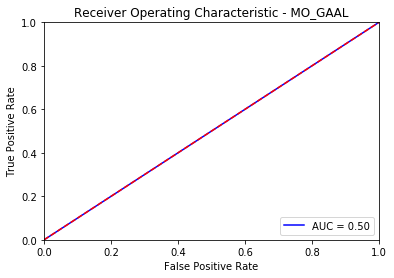

Accuracy:  0.8289666666666666
Precision:  0.0
Recall:  0.0
F1-score: -
Duration:  4628.671039  seconds




In [18]:
#Neural Networks tests
classifiers = {
    'AutoEncoder': AutoEncoder(contamination = outliers_fraction, hidden_neurons = [8, 4, 4, 8], epochs = 15),
    'SO_GAAL': SO_GAAL(contamination = outliers_fraction),
    'MO_GAAL': MO_GAAL(contamination = outliers_fraction)
}

for i, (clf_name, clf) in enumerate(classifiers.items()):
    testMethod(clf, clf_name, testingSet, testingSet)


Results - XGBoost:
Confusion Matrix:
               Actual
Predicted   3406  |  0
            0  |  16490 

Accuracy:  1.0
Precision:  1.0
Recall:  1.0
F1-score:  1.0
Duration:  7.59034  seconds


#####################################################################


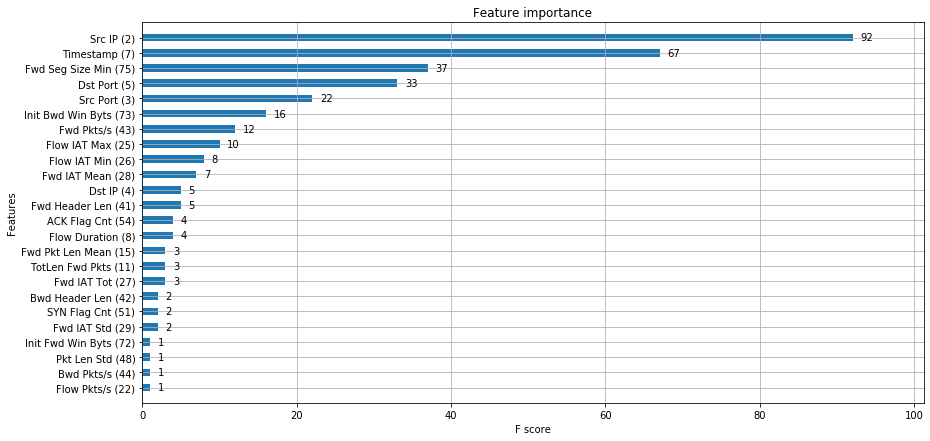

In [56]:
from xgboost import XGBClassifier, plot_importance

xgbo = XGBClassifier()
testMethod(xgbo, "XGBoost", trainingSet_pd, testingSet_pd, y_test, y_train)

plt.rcParams["figure.figsize"] = (14, 7)
plot_importance(xgbo, height=0.5)
pyplot.show()

In [35]:
features_dict = xgbo.get_booster().get_fscore()

split_th = 3
for f, v in list(features_dict.items()):
    if(v < split_th):
        del features_dict[f]

print("\nFeatures:")
for f in features_dict:
    print(f)

testingSet_fs = pd.DataFrame()
for i in features_dict:
    serie = pd.Series(testingSet_pd[i])
    testingSet_fs[i] = serie


Features:
Fwd Seg Size Min (75)
Timestamp (7)
Src Port (3)
Src IP (2)
Dst Port (5)
Flow IAT Max (25)
Fwd IAT Tot (27)
Flow Duration (8)
Fwd Pkts/s (43)
Init Bwd Win Byts (73)
Fwd Header Len (41)
Dst IP (4)
TotLen Fwd Pkts (11)
Fwd IAT Mean (28)
Flow IAT Min (26)
ACK Flag Cnt (54)
Fwd Pkt Len Mean (15)


In [36]:
testingSet_fs

,Fwd Seg Size Min (75),Timestamp (7),Src Port (3),Src IP (2),Dst Port (5),Flow IAT Max (25),Fwd IAT Tot (27),Flow Duration (8),Fwd Pkts/s (43),Init Bwd Win Byts (73),Fwd Header Len (41),Dst IP (4),TotLen Fwd Pkts (11),Fwd IAT Mean (28),Flow IAT Min (26),ACK Flag Cnt (54),Fwd Pkt Len Mean (15)
0,20.0,1.519097e+09,52520.0,1.720311e+11,80.0,10191500.0,34155459.0,34155459.0,0.146389,298.0,100.0,7.202109e+10,4.0,8.538865e+06,11236.0,1.0,0.800000
1,0.0,1.518830e+09,80.0,1.720311e+11,36338.0,4699513.0,118277.0,4817796.0,0.830255,211.0,136.0,1.821919e+10,935.0,3.942567e+04,6.0,1.0,233.750000
2,20.0,1.519131e+09,52409.0,2.120921e+11,3389.0,953164.0,1978592.0,1978592.0,4.043279,62952.0,172.0,1.720311e+11,1048.0,2.826560e+05,75.0,0.0,131.000000
3,0.0,1.519270e+09,80.0,1.720311e+11,50941.0,540836.0,596229.0,596233.0,6.708787,32768.0,92.0,1.821901e+10,935.0,1.987430e+05,4.0,0.0,233.750000
4,20.0,1.519133e+09,55012.0,1.821903e+10,80.0,1261906.0,384.0,1262323.0,2.376571,211.0,72.0,1.720311e+11,20.0,1.920000e+02,3.0,0.0,6.666667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19891,20.0,1.519131e+09,50670.0,1.720311e+11,80.0,122.0,122.0,122.0,16393.442623,-1.0,40.0,2.305209e+10,0.0,1.220000e+02,122.0,1.0,0.000000
19892,8.0,1.519106e+09,55081.0,1.720311e+11,53.0,1030.0,0.0,1030.0,970.873786,-1.0,8.0,1.720310e+11,40.0,0.000000e+00,1030.0,0.0,40.000000
19893,0.0,1.499141e+09,62448.0,1.921680e+11,443.0,36866.0,114860.0,153076.0,58.794324,362.0,288.0,1.722170e+11,1275.0,1.435750e+04,49.0,0.0,141.666667
19894,8.0,1.519112e+09,49486.0,1.720311e+11,53.0,13075.0,0.0,13075.0,76.481836,-1.0,8.0,1.720310e+11,43.0,0.000000e+00,13075.0,0.0,43.000000



Results - PCA:
Confusion Matrix:
               Actual
Predicted   741  |  2642
            2665  |  13848 

Accuracy:  0.7332629674306393
Precision:  0.2190363582618977
Recall:  0.21755725190839695
F1-score:  0.21829429960229785


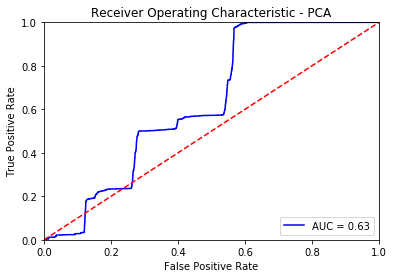

PCA ROC:0.6329, precision @ rank n:0.219
Duration:  0.377351  seconds


#####################################################################

Results - PCA:
Confusion Matrix:
               Actual
Predicted   1253  |  2130
            2153  |  14360 

Accuracy:  0.7847305991154001
Precision:  0.3703813183564883
Recall:  0.36788021139166177
F1-score:  0.3691265282073943


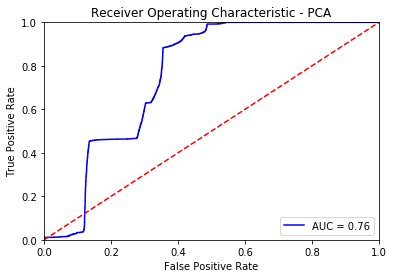

PCA ROC:0.7565, precision @ rank n:0.3732
Duration:  0.053868  seconds


#####################################################################

Results - MCD:
Confusion Matrix:
               Actual
Predicted   527  |  2856
            2879  |  13634 

Accuracy:  0.7117511057498995
Precision:  0.15577889447236182
Recall:  0.1547269524368761
F1-score:  0.15525114155251143


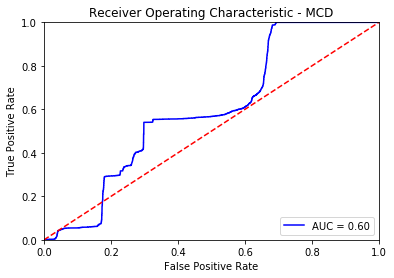

MCD ROC:0.5975, precision @ rank n:0.1588
Duration:  5.295298  seconds


#####################################################################


/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/covariance/_robust_covariance.py:170: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (307.309832271074356 > 301.673547859340488). You may want to try with a higher value of support_fraction (current value: 0.501).
  RuntimeWarning)
/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/covariance/_robust_covariance.py:170: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (313.167337167489904 > 309.751065569486968). You may want to try with a higher value of support_fraction (current value: 0.501).
  RuntimeWarning)
/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/covariance/_robust_covariance.py:170: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (313.827075207724761 > 313.208840027720385). You may want to try with a higher value of support_fraction (current value: 0.501).
 

/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/covariance/_robust_covariance.py:170: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (301.767390264465007 > 301.518567389383350). You may want to try with a higher value of support_fraction (current value: 0.501).
  RuntimeWarning)
/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/covariance/_robust_covariance.py:170: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (301.038341308518852 > 300.712824205589186). You may want to try with a higher value of support_fraction (current value: 0.501).
  RuntimeWarning)
/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/covariance/_robust_covariance.py:170: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (301.481591221836482 > 301.370212635074836). You may want to try with a higher value of support_fraction (current value: 0.501).
 

/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/covariance/_robust_covariance.py:170: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (307.859612428884873 > 307.351587311781600). You may want to try with a higher value of support_fraction (current value: 0.501).
  RuntimeWarning)
/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/covariance/_robust_covariance.py:170: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (297.810053210359172 > 296.723715199182209). You may want to try with a higher value of support_fraction (current value: 0.501).
  RuntimeWarning)
/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/covariance/_robust_covariance.py:170: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (302.596261968144347 > 302.368046530952824). You may want to try with a higher value of support_fraction (current value: 0.501).
 

/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/covariance/_robust_covariance.py:170: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (297.195910739627664 > 296.105728136237076). You may want to try with a higher value of support_fraction (current value: 0.501).
  RuntimeWarning)
/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/covariance/_robust_covariance.py:170: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (297.205996394844874 > 296.675893492749651). You may want to try with a higher value of support_fraction (current value: 0.501).
  RuntimeWarning)
/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/covariance/_robust_covariance.py:170: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (297.168024453160911 > 296.706808232625121). You may want to try with a higher value of support_fraction (current value: 0.501).
 

/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/covariance/_robust_covariance.py:170: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (298.405762844100479 > 296.295572220192298). You may want to try with a higher value of support_fraction (current value: 0.501).
  RuntimeWarning)
/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/covariance/_robust_covariance.py:170: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (316.353815055831774 > 311.738242694093287). You may want to try with a higher value of support_fraction (current value: 0.501).
  RuntimeWarning)
/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/covariance/_robust_covariance.py:170: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (316.440266078238778 > 311.046670472138601). You may want to try with a higher value of support_fraction (current value: 0.501).
 

/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/covariance/_robust_covariance.py:170: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (323.056149297530965 > 321.940561454649639). You may want to try with a higher value of support_fraction (current value: 0.501).
  RuntimeWarning)
/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/covariance/_robust_covariance.py:170: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (301.676655086651465 > 301.400038386172866). You may want to try with a higher value of support_fraction (current value: 0.501).
  RuntimeWarning)
/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/covariance/_robust_covariance.py:170: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (303.346260194789465 > 302.474914323529049). You may want to try with a higher value of support_fraction (current value: 0.501).
 

/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/covariance/_robust_covariance.py:170: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (301.680452089227231 > 301.654412511947726). You may want to try with a higher value of support_fraction (current value: 0.501).
  RuntimeWarning)
/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/covariance/_robust_covariance.py:170: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (301.039619148063707 > 300.860229750057670). You may want to try with a higher value of support_fraction (current value: 0.501).
  RuntimeWarning)
/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/covariance/_robust_covariance.py:170: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (301.673717180346273 > 301.033844491898151). You may want to try with a higher value of support_fraction (current value: 0.501).
 

/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/covariance/_robust_covariance.py:170: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (301.069564855792066 > 300.743846201726512). You may want to try with a higher value of support_fraction (current value: 0.501).
  RuntimeWarning)
/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/covariance/_robust_covariance.py:170: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (303.540454624836116 > 302.374419141625310). You may want to try with a higher value of support_fraction (current value: 0.501).
  RuntimeWarning)
/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/covariance/_robust_covariance.py:170: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (301.249541052933921 > 300.786672553736310). You may want to try with a higher value of support_fraction (current value: 0.501).
 

/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/covariance/_robust_covariance.py:170: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (301.039619148063707 > 300.825505047335469). You may want to try with a higher value of support_fraction (current value: 0.501).
  RuntimeWarning)
/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/covariance/_robust_covariance.py:170: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (301.027385703625441 > 300.617594088597230). You may want to try with a higher value of support_fraction (current value: 0.501).
  RuntimeWarning)
/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/covariance/_robust_covariance.py:170: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (298.544455590883672 > 297.953284521322246). You may want to try with a higher value of support_fraction (current value: 0.501).
 

/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/covariance/_robust_covariance.py:170: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (316.624273382175545 > 311.176298645635086). You may want to try with a higher value of support_fraction (current value: 0.501).
  RuntimeWarning)
/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/covariance/_robust_covariance.py:170: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (302.854114948661334 > 301.815539488810884). You may want to try with a higher value of support_fraction (current value: 0.501).
  RuntimeWarning)
/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/covariance/_robust_covariance.py:170: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (302.842968227071992 > 302.055239038324657). You may want to try with a higher value of support_fraction (current value: 0.501).
 

/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/covariance/_robust_covariance.py:170: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (302.842844225239105 > 302.070065211134931). You may want to try with a higher value of support_fraction (current value: 0.501).
  RuntimeWarning)
/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/covariance/_robust_covariance.py:170: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (303.320683532589612 > 302.600729764498737). You may want to try with a higher value of support_fraction (current value: 0.501).
  RuntimeWarning)
/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/covariance/_robust_covariance.py:170: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (301.807772049126186 > 301.478323299231079). You may want to try with a higher value of support_fraction (current value: 0.501).
 

/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/covariance/_robust_covariance.py:170: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (302.079204624453610 > 301.487565903003258). You may want to try with a higher value of support_fraction (current value: 0.501).
  RuntimeWarning)
/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/covariance/_robust_covariance.py:170: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (303.083619132726426 > 302.342661706645629). You may want to try with a higher value of support_fraction (current value: 0.501).
  RuntimeWarning)
/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/covariance/_robust_covariance.py:170: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (301.676655086651465 > 301.490818474228888). You may want to try with a higher value of support_fraction (current value: 0.501).
 

/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/covariance/_robust_covariance.py:170: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (303.070434042876172 > 302.363769262576454). You may want to try with a higher value of support_fraction (current value: 0.501).
  RuntimeWarning)
/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/covariance/_robust_covariance.py:170: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (312.009675950097744 > 311.968176979207101). You may want to try with a higher value of support_fraction (current value: 0.501).
  RuntimeWarning)
/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/covariance/_robust_covariance.py:170: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (311.933610412873293 > 311.917899521051595). You may want to try with a higher value of support_fraction (current value: 0.501).
 

/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/covariance/_robust_covariance.py:170: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (303.982151205300568 > 303.883126415122092). You may want to try with a higher value of support_fraction (current value: 0.501).
  RuntimeWarning)
/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/covariance/_robust_covariance.py:170: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (304.079958219580988 > 302.898846329850414). You may want to try with a higher value of support_fraction (current value: 0.501).
  RuntimeWarning)
/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/covariance/_robust_covariance.py:170: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (298.405762844100479 > 296.122042366567825). You may want to try with a higher value of support_fraction (current value: 0.501).
 


Results - MCD:
Confusion Matrix:
               Actual
Predicted   268  |  3115
            3138  |  13375 

Accuracy:  0.6857157217531162
Precision:  0.07921962754951227
Recall:  0.07868467410452143
F1-score:  0.07895124466048019


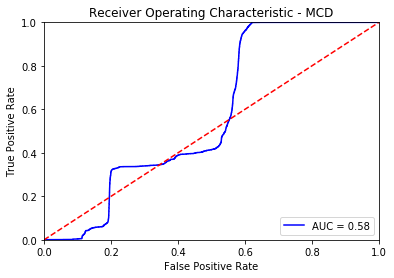

MCD ROC:0.5754, precision @ rank n:0.0802
Duration:  5.775893  seconds


#####################################################################

Results - OCSVM:
Confusion Matrix:
               Actual
Predicted   795  |  2342
            2611  |  14148 

Accuracy:  0.7510554885404102
Precision:  0.2534268409308256
Recall:  0.23341162654139752
F1-score:  0.24300779458963778


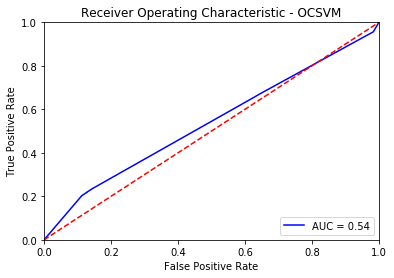

OCSVM ROC:0.537, precision @ rank n:0.2534
Duration:  361.222167  seconds


#####################################################################

Results - OCSVM:
Confusion Matrix:
               Actual
Predicted   0  |  0
            3406  |  16490 

Accuracy:  0.8288098110172899
Precision: -
Recall:  0.0
F1-score: -


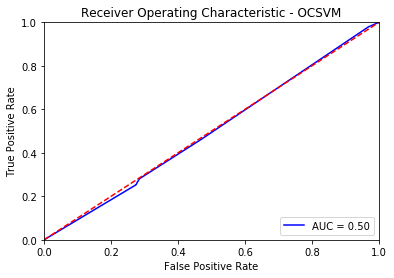

/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


OCSVM ROC:0.4968, precision @ rank n:0.0
Duration:  115.695757  seconds


#####################################################################

Results - LOF:
Confusion Matrix:
               Actual
Predicted   328  |  2888
            3078  |  13602 

Accuracy:  0.700140731805388
Precision:  0.10199004975124377
Recall:  0.09630064591896653
F1-score:  0.09906372697070373


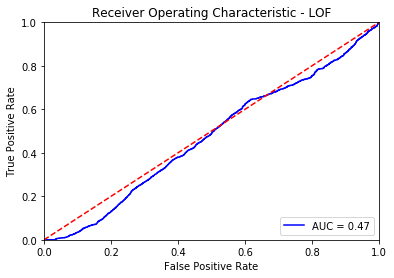

LOF ROC:0.4711, precision @ rank n:0.1086
Duration:  12.534462  seconds


#####################################################################

Results - LOF:
Confusion Matrix:
               Actual
Predicted   427  |  2784
            2979  |  13706 

Accuracy:  0.7103437876960192
Precision:  0.13298037994394268
Recall:  0.12536699941280094
F1-score:  0.1290615082363609


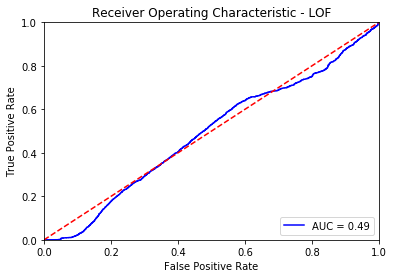

LOF ROC:0.4869, precision @ rank n:0.1418
Duration:  3.058302  seconds


#####################################################################

Results - CBLOF:
Confusion Matrix:
               Actual
Predicted   157  |  3226
            3249  |  13264 

Accuracy:  0.6745577000402091
Precision:  0.04640851315400532
Recall:  0.046095126247798004
F1-score:  0.04625128884960966


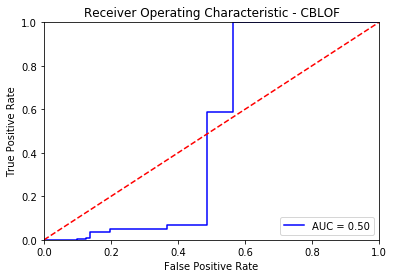

CBLOF ROC:0.5, precision @ rank n:0.0476
Duration:  0.720905  seconds


#####################################################################

Results - CBLOF:
Confusion Matrix:
               Actual
Predicted   157  |  3226
            3249  |  13264 

Accuracy:  0.6745577000402091
Precision:  0.04640851315400532
Recall:  0.046095126247798004
F1-score:  0.04625128884960966


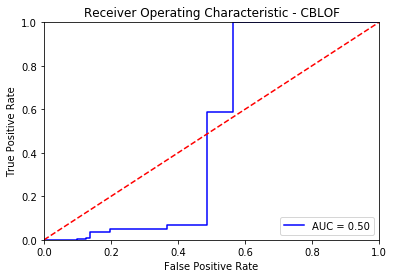

CBLOF ROC:0.5, precision @ rank n:0.0476
Duration:  0.352508  seconds


#####################################################################

Results - HBOS:
Confusion Matrix:
               Actual
Predicted   638  |  2744
            2768  |  13746 

Accuracy:  0.7229593888218737
Precision:  0.18864577173270256
Recall:  0.18731650029359953
F1-score:  0.1879787860931055


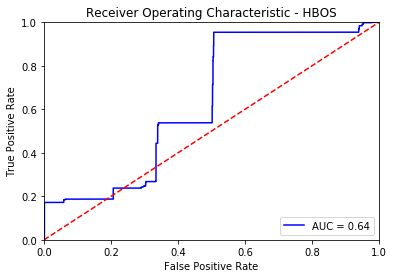

HBOS ROC:0.6357, precision @ rank n:0.1875
Duration:  0.156701  seconds


#####################################################################

Results - HBOS:
Confusion Matrix:
               Actual
Predicted   2391  |  988
            1015  |  15502 

Accuracy:  0.8993264977885002
Precision:  0.707605800532702
Recall:  0.7019964768056371
F1-score:  0.7047899778924098


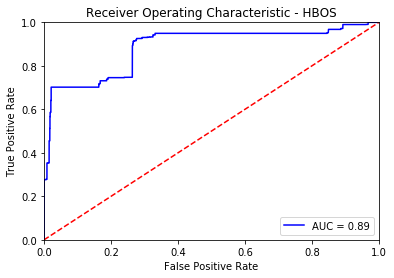

HBOS ROC:0.8853, precision @ rank n:0.702
Duration:  0.04186  seconds


#####################################################################

Results - kNN:
Confusion Matrix:
               Actual
Predicted   55  |  3045
            3351  |  13445 

Accuracy:  0.6785283474065139
Precision:  0.017741935483870968
Recall:  0.01614797416324134
F1-score:  0.016907470027666772


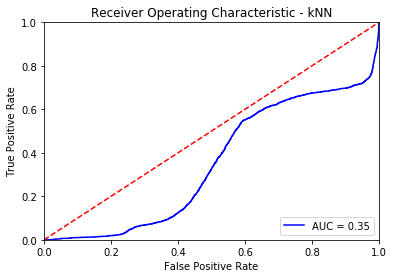

kNN ROC:0.3487, precision @ rank n:0.0194
Duration:  16.030946  seconds


#####################################################################

Results - kNN:
Confusion Matrix:
               Actual
Predicted   58  |  3024
            3348  |  13466 

Accuracy:  0.6797346200241254
Precision:  0.01881894873458793
Recall:  0.017028772753963594
F1-score:  0.017879161528976575


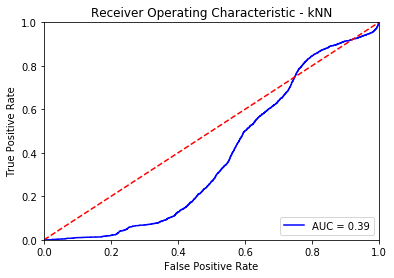

kNN ROC:0.3862, precision @ rank n:0.0208
Duration:  7.245501  seconds


#####################################################################

Results - AvgKNN:
Confusion Matrix:
               Actual
Predicted   50  |  2818
            3356  |  13672 

Accuracy:  0.6896863691194209
Precision:  0.017433751743375175
Recall:  0.014679976512037582
F1-score:  0.015938795027095953


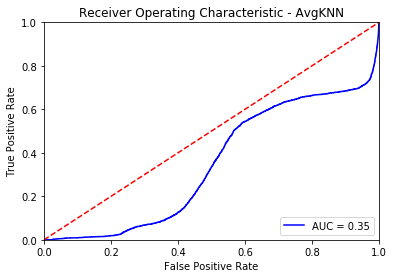

AvgKNN ROC:0.3459, precision @ rank n:0.0191
Duration:  16.949769  seconds


#####################################################################

Results - AvgKNN:
Confusion Matrix:
               Actual
Predicted   51  |  2944
            3355  |  13546 

Accuracy:  0.6834036992360274
Precision:  0.01702838063439065
Recall:  0.014973576042278332
F1-score:  0.015935010154663334


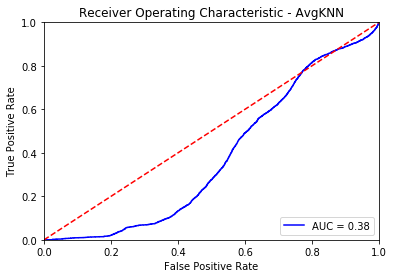

AvgKNN ROC:0.3805, precision @ rank n:0.0223
Duration:  8.238794  seconds


#####################################################################

Results - MedKNN:
Confusion Matrix:
               Actual
Predicted   50  |  2708
            3356  |  13782 

Accuracy:  0.6952151186168074
Precision:  0.018129079042784626
Recall:  0.014679976512037582
F1-score:  0.016223231667748216


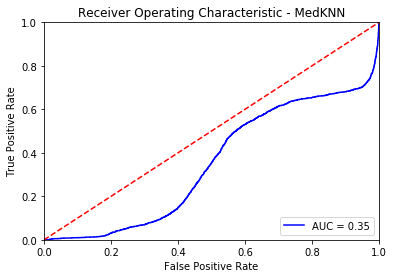

MedKNN ROC:0.349, precision @ rank n:0.0308
Duration:  20.149575  seconds


#####################################################################

Results - MedKNN:
Confusion Matrix:
               Actual
Predicted   59  |  2703
            3347  |  13787 

Accuracy:  0.6959187776437474
Precision:  0.021361332367849383
Recall:  0.017322372284204347
F1-score:  0.01913099870298314


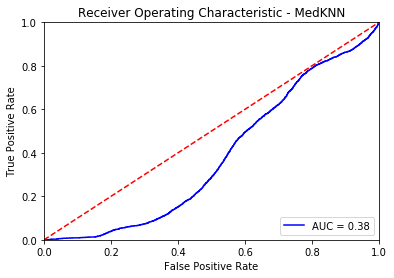

MedKNN ROC:0.3808, precision @ rank n:0.0382
Duration:  11.444014  seconds


#####################################################################

Results - ABOD:
Confusion Matrix:
               Actual
Predicted   90  |  3271
            3316  |  13219 

Accuracy:  0.6689284278246884
Precision:  0.02677774471883368
Recall:  0.026423957721667644
F1-score:  0.026599674892862423


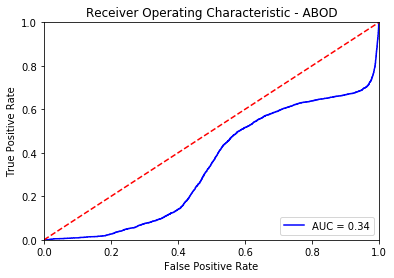

ABOD ROC:0.3407, precision @ rank n:0.0264
Duration:  32.715241  seconds


#####################################################################

Results - ABOD:
Confusion Matrix:
               Actual
Predicted   117  |  3220
            3289  |  13270 

Accuracy:  0.672848813831926
Precision:  0.03506143242433323
Recall:  0.03435114503816794
F1-score:  0.03470265460477532


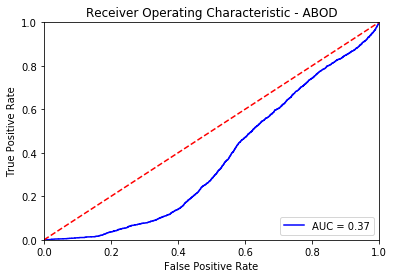

ABOD ROC:0.3693, precision @ rank n:0.0364
Duration:  21.783567  seconds


#####################################################################

Results - Isolation Forest:
Confusion Matrix:
               Actual
Predicted   704  |  2679
            2702  |  13811 

Accuracy:  0.7295436268596703
Precision:  0.20809932013006208
Recall:  0.20669406928948914
F1-score:  0.20739431433200767


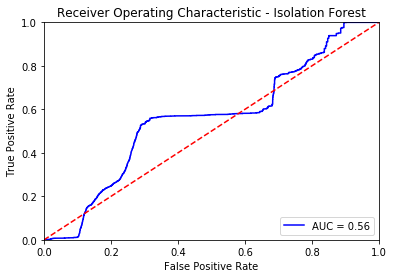

Isolation Forest ROC:0.557, precision @ rank n:0.2079
Duration:  5.417712  seconds


#####################################################################

Results - Isolation Forest:
Confusion Matrix:
               Actual
Predicted   706  |  2677
            2700  |  13813 

Accuracy:  0.7297446722959389
Precision:  0.20869051138043157
Recall:  0.20728126834997063
F1-score:  0.2079835027249963


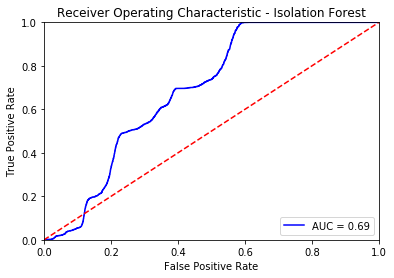

Isolation Forest ROC:0.6876, precision @ rank n:0.209
Duration:  3.255503  seconds


#####################################################################

Results - Feature Bagging:
Confusion Matrix:
               Actual
Predicted   326  |  2803
            3080  |  13687 

Accuracy:  0.7043124246079614
Precision:  0.10418664109939278
Recall:  0.09571344685848503
F1-score:  0.09977046671767406


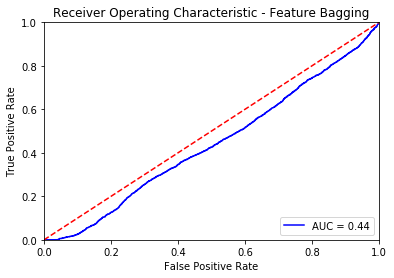

Feature Bagging ROC:0.4397, precision @ rank n:0.111
Duration:  77.440164  seconds


#####################################################################

Results - Feature Bagging:
Confusion Matrix:
               Actual
Predicted   318  |  2824
            3088  |  13666 

Accuracy:  0.7028548451950141
Precision:  0.10120942075111394
Recall:  0.09336465061655902
F1-score:  0.097128894318876


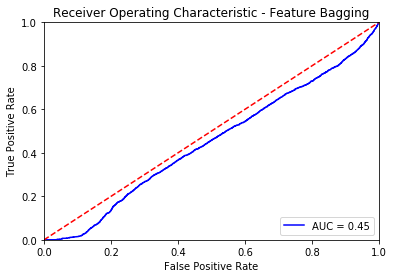

Feature Bagging ROC:0.4476, precision @ rank n:0.1139
Duration:  21.756716  seconds


#####################################################################
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 74)                5550      
_________________________________________________________________
dropout_1 (Dropout)          (None, 74)                0         
_________________________________________________________________
dense_2 (Dense)              (None, 74)                5550      
_________________________________________________________________
dropout_2 (Dropout)          (None, 74)                0         
_________________________________________________________________
dense_3 (Dense)              (None, 8)                 600       
_________________________________________________________________
dropout_3 (Dropout)          (

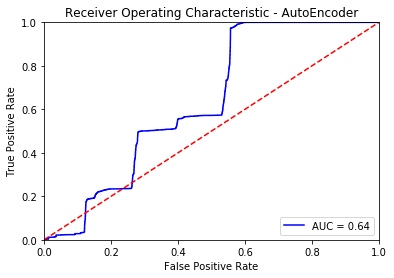

AutoEncoder ROC:0.6362, precision @ rank n:0.2199
Duration:  33.393793  seconds


#####################################################################
Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_8 (Dense)              (None, 17)                306       
_________________________________________________________________
dropout_7 (Dropout)          (None, 17)                0         
_________________________________________________________________
dense_9 (Dense)              (None, 17)                306       
_________________________________________________________________
dropout_8 (Dropout)          (None, 17)                0         
_________________________________________________________________
dense_10 (Dense)             (None, 8)                 144       
_________________________________________________________________
dropout_9 (Dropout)          (None

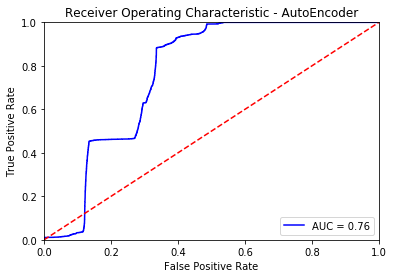

AutoEncoder ROC:0.7637, precision @ rank n:0.3746
Duration:  25.130342  seconds


#####################################################################
Epoch 1 of 60

Testing for epoch 1 index 1:


/home/andre/anaconda3/lib/python3.7/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'



Testing for epoch 1 index 2:

Testing for epoch 1 index 3:

Testing for epoch 1 index 4:

Testing for epoch 1 index 5:

Testing for epoch 1 index 6:

Testing for epoch 1 index 7:

Testing for epoch 1 index 8:

Testing for epoch 1 index 9:

Testing for epoch 1 index 10:

Testing for epoch 1 index 11:

Testing for epoch 1 index 12:

Testing for epoch 1 index 13:

Testing for epoch 1 index 14:

Testing for epoch 1 index 15:

Testing for epoch 1 index 16:

Testing for epoch 1 index 17:

Testing for epoch 1 index 18:

Testing for epoch 1 index 19:

Testing for epoch 1 index 20:

Testing for epoch 1 index 21:

Testing for epoch 1 index 22:

Testing for epoch 1 index 23:

Testing for epoch 1 index 24:

Testing for epoch 1 index 25:

Testing for epoch 1 index 26:

Testing for epoch 1 index 27:

Testing for epoch 1 index 28:

Testing for epoch 1 index 29:

Testing for epoch 1 index 30:

Testing for epoch 1 index 31:

Testing for epoch 1 index 32:

Testing for epoch 1 index 33:

Testing for epo


Testing for epoch 7 index 37:

Testing for epoch 7 index 38:

Testing for epoch 7 index 39:
Epoch 8 of 60

Testing for epoch 8 index 1:

Testing for epoch 8 index 2:

Testing for epoch 8 index 3:

Testing for epoch 8 index 4:

Testing for epoch 8 index 5:

Testing for epoch 8 index 6:

Testing for epoch 8 index 7:

Testing for epoch 8 index 8:

Testing for epoch 8 index 9:

Testing for epoch 8 index 10:

Testing for epoch 8 index 11:

Testing for epoch 8 index 12:

Testing for epoch 8 index 13:

Testing for epoch 8 index 14:

Testing for epoch 8 index 15:

Testing for epoch 8 index 16:

Testing for epoch 8 index 17:

Testing for epoch 8 index 18:

Testing for epoch 8 index 19:

Testing for epoch 8 index 20:

Testing for epoch 8 index 21:

Testing for epoch 8 index 22:

Testing for epoch 8 index 23:

Testing for epoch 8 index 24:

Testing for epoch 8 index 25:

Testing for epoch 8 index 26:

Testing for epoch 8 index 27:

Testing for epoch 8 index 28:

Testing for epoch 8 index 29:

Te


Testing for epoch 14 index 29:

Testing for epoch 14 index 30:

Testing for epoch 14 index 31:

Testing for epoch 14 index 32:

Testing for epoch 14 index 33:

Testing for epoch 14 index 34:

Testing for epoch 14 index 35:

Testing for epoch 14 index 36:

Testing for epoch 14 index 37:

Testing for epoch 14 index 38:

Testing for epoch 14 index 39:
Epoch 15 of 60

Testing for epoch 15 index 1:

Testing for epoch 15 index 2:

Testing for epoch 15 index 3:

Testing for epoch 15 index 4:

Testing for epoch 15 index 5:

Testing for epoch 15 index 6:

Testing for epoch 15 index 7:

Testing for epoch 15 index 8:

Testing for epoch 15 index 9:

Testing for epoch 15 index 10:

Testing for epoch 15 index 11:

Testing for epoch 15 index 12:

Testing for epoch 15 index 13:

Testing for epoch 15 index 14:

Testing for epoch 15 index 15:

Testing for epoch 15 index 16:

Testing for epoch 15 index 17:

Testing for epoch 15 index 18:

Testing for epoch 15 index 19:

Testing for epoch 15 index 20:

T


Testing for epoch 21 index 17:

Testing for epoch 21 index 18:

Testing for epoch 21 index 19:

Testing for epoch 21 index 20:

Testing for epoch 21 index 21:

Testing for epoch 21 index 22:

Testing for epoch 21 index 23:

Testing for epoch 21 index 24:

Testing for epoch 21 index 25:

Testing for epoch 21 index 26:

Testing for epoch 21 index 27:

Testing for epoch 21 index 28:

Testing for epoch 21 index 29:

Testing for epoch 21 index 30:

Testing for epoch 21 index 31:

Testing for epoch 21 index 32:

Testing for epoch 21 index 33:

Testing for epoch 21 index 34:

Testing for epoch 21 index 35:

Testing for epoch 21 index 36:

Testing for epoch 21 index 37:

Testing for epoch 21 index 38:

Testing for epoch 21 index 39:
Epoch 22 of 60

Testing for epoch 22 index 1:
500/500 [==============================] - 0s 73us/step

Testing for epoch 22 index 2:
500/500 [==============================] - 0s 30us/step

Testing for epoch 22 index 3:
500/500 [==============================] - 0

500/500 [==============================] - 0s 32us/step

Testing for epoch 24 index 8:
500/500 [==============================] - 0s 33us/step

Testing for epoch 24 index 9:
500/500 [==============================] - 0s 33us/step

Testing for epoch 24 index 10:
500/500 [==============================] - 0s 37us/step

Testing for epoch 24 index 11:
500/500 [==============================] - 0s 33us/step

Testing for epoch 24 index 12:
500/500 [==============================] - 0s 30us/step

Testing for epoch 24 index 13:
500/500 [==============================] - 0s 26us/step

Testing for epoch 24 index 14:
500/500 [==============================] - 0s 33us/step

Testing for epoch 24 index 15:
500/500 [==============================] - 0s 37us/step

Testing for epoch 24 index 16:
500/500 [==============================] - 0s 33us/step

Testing for epoch 24 index 17:
500/500 [==============================] - 0s 28us/step

Testing for epoch 24 index 18:
500/500 [=========================

500/500 [==============================] - 0s 33us/step

Testing for epoch 26 index 23:
500/500 [==============================] - 0s 31us/step

Testing for epoch 26 index 24:
500/500 [==============================] - 0s 33us/step

Testing for epoch 26 index 25:
500/500 [==============================] - 0s 31us/step

Testing for epoch 26 index 26:
500/500 [==============================] - 0s 31us/step

Testing for epoch 26 index 27:
500/500 [==============================] - 0s 27us/step

Testing for epoch 26 index 28:
500/500 [==============================] - 0s 32us/step

Testing for epoch 26 index 29:
500/500 [==============================] - 0s 29us/step

Testing for epoch 26 index 30:
500/500 [==============================] - 0s 26us/step

Testing for epoch 26 index 31:
500/500 [==============================] - 0s 28us/step

Testing for epoch 26 index 32:
500/500 [==============================] - 0s 32us/step

Testing for epoch 26 index 33:
500/500 [=======================

500/500 [==============================] - 0s 30us/step

Testing for epoch 28 index 38:
500/500 [==============================] - 0s 33us/step

Testing for epoch 28 index 39:
500/500 [==============================] - 0s 34us/step
Epoch 29 of 60

Testing for epoch 29 index 1:
500/500 [==============================] - 0s 32us/step

Testing for epoch 29 index 2:
500/500 [==============================] - 0s 34us/step

Testing for epoch 29 index 3:
500/500 [==============================] - 0s 35us/step

Testing for epoch 29 index 4:
500/500 [==============================] - 0s 35us/step

Testing for epoch 29 index 5:
500/500 [==============================] - 0s 37us/step

Testing for epoch 29 index 6:
500/500 [==============================] - 0s 27us/step

Testing for epoch 29 index 7:
500/500 [==============================] - 0s 30us/step

Testing for epoch 29 index 8:
500/500 [==============================] - 0s 38us/step

Testing for epoch 29 index 9:
500/500 [=================

500/500 [==============================] - 0s 34us/step

Testing for epoch 31 index 14:
500/500 [==============================] - 0s 30us/step

Testing for epoch 31 index 15:
500/500 [==============================] - 0s 30us/step

Testing for epoch 31 index 16:
500/500 [==============================] - 0s 28us/step

Testing for epoch 31 index 17:
500/500 [==============================] - 0s 30us/step

Testing for epoch 31 index 18:
500/500 [==============================] - 0s 32us/step

Testing for epoch 31 index 19:
500/500 [==============================] - 0s 27us/step

Testing for epoch 31 index 20:
500/500 [==============================] - 0s 32us/step

Testing for epoch 31 index 21:
500/500 [==============================] - 0s 34us/step

Testing for epoch 31 index 22:
500/500 [==============================] - 0s 29us/step

Testing for epoch 31 index 23:
500/500 [==============================] - 0s 30us/step

Testing for epoch 31 index 24:
500/500 [=======================

500/500 [==============================] - 0s 32us/step

Testing for epoch 33 index 29:
500/500 [==============================] - 0s 30us/step

Testing for epoch 33 index 30:
500/500 [==============================] - 0s 34us/step

Testing for epoch 33 index 31:
500/500 [==============================] - 0s 33us/step

Testing for epoch 33 index 32:
500/500 [==============================] - 0s 35us/step

Testing for epoch 33 index 33:
500/500 [==============================] - 0s 32us/step

Testing for epoch 33 index 34:
500/500 [==============================] - 0s 32us/step

Testing for epoch 33 index 35:
500/500 [==============================] - 0s 31us/step

Testing for epoch 33 index 36:
500/500 [==============================] - 0s 29us/step

Testing for epoch 33 index 37:
500/500 [==============================] - 0s 30us/step

Testing for epoch 33 index 38:
500/500 [==============================] - 0s 29us/step

Testing for epoch 33 index 39:
500/500 [=======================

500/500 [==============================] - 0s 26us/step

Testing for epoch 36 index 5:
500/500 [==============================] - 0s 29us/step

Testing for epoch 36 index 6:
500/500 [==============================] - 0s 32us/step

Testing for epoch 36 index 7:
500/500 [==============================] - 0s 26us/step

Testing for epoch 36 index 8:
500/500 [==============================] - 0s 29us/step

Testing for epoch 36 index 9:
500/500 [==============================] - 0s 32us/step

Testing for epoch 36 index 10:
500/500 [==============================] - 0s 34us/step

Testing for epoch 36 index 11:
500/500 [==============================] - 0s 31us/step

Testing for epoch 36 index 12:
500/500 [==============================] - 0s 33us/step

Testing for epoch 36 index 13:
500/500 [==============================] - 0s 27us/step

Testing for epoch 36 index 14:
500/500 [==============================] - 0s 32us/step

Testing for epoch 36 index 15:
500/500 [============================

500/500 [==============================] - 0s 34us/step

Testing for epoch 38 index 20:
500/500 [==============================] - 0s 29us/step

Testing for epoch 38 index 21:
500/500 [==============================] - 0s 32us/step

Testing for epoch 38 index 22:
500/500 [==============================] - 0s 28us/step

Testing for epoch 38 index 23:
500/500 [==============================] - 0s 32us/step

Testing for epoch 38 index 24:
500/500 [==============================] - 0s 29us/step

Testing for epoch 38 index 25:
500/500 [==============================] - 0s 32us/step

Testing for epoch 38 index 26:
500/500 [==============================] - 0s 26us/step

Testing for epoch 38 index 27:
500/500 [==============================] - 0s 27us/step

Testing for epoch 38 index 28:
500/500 [==============================] - 0s 32us/step

Testing for epoch 38 index 29:
500/500 [==============================] - 0s 41us/step

Testing for epoch 38 index 30:
500/500 [=======================

500/500 [==============================] - 0s 37us/step

Testing for epoch 40 index 35:
500/500 [==============================] - 0s 35us/step

Testing for epoch 40 index 36:
500/500 [==============================] - 0s 42us/step

Testing for epoch 40 index 37:
500/500 [==============================] - 0s 29us/step

Testing for epoch 40 index 38:
500/500 [==============================] - 0s 39us/step

Testing for epoch 40 index 39:
500/500 [==============================] - 0s 33us/step
Epoch 41 of 60

Testing for epoch 41 index 1:
500/500 [==============================] - 0s 33us/step

Testing for epoch 41 index 2:
500/500 [==============================] - 0s 30us/step

Testing for epoch 41 index 3:
500/500 [==============================] - 0s 28us/step

Testing for epoch 41 index 4:
500/500 [==============================] - 0s 27us/step

Testing for epoch 41 index 5:
500/500 [==============================] - 0s 27us/step

Testing for epoch 41 index 6:
500/500 [==============

500/500 [==============================] - 0s 29us/step

Testing for epoch 43 index 11:
500/500 [==============================] - 0s 30us/step

Testing for epoch 43 index 12:
500/500 [==============================] - 0s 35us/step

Testing for epoch 43 index 13:
500/500 [==============================] - 0s 31us/step

Testing for epoch 43 index 14:
500/500 [==============================] - 0s 33us/step

Testing for epoch 43 index 15:
500/500 [==============================] - 0s 35us/step

Testing for epoch 43 index 16:
500/500 [==============================] - 0s 30us/step

Testing for epoch 43 index 17:
500/500 [==============================] - 0s 37us/step

Testing for epoch 43 index 18:
500/500 [==============================] - 0s 34us/step

Testing for epoch 43 index 19:
500/500 [==============================] - 0s 31us/step

Testing for epoch 43 index 20:
500/500 [==============================] - 0s 30us/step

Testing for epoch 43 index 21:
500/500 [=======================

500/500 [==============================] - 0s 34us/step

Testing for epoch 45 index 26:
500/500 [==============================] - 0s 32us/step

Testing for epoch 45 index 27:
500/500 [==============================] - 0s 30us/step

Testing for epoch 45 index 28:
500/500 [==============================] - 0s 31us/step

Testing for epoch 45 index 29:
500/500 [==============================] - 0s 32us/step

Testing for epoch 45 index 30:
500/500 [==============================] - 0s 35us/step

Testing for epoch 45 index 31:
500/500 [==============================] - 0s 36us/step

Testing for epoch 45 index 32:
500/500 [==============================] - 0s 29us/step

Testing for epoch 45 index 33:
500/500 [==============================] - 0s 39us/step

Testing for epoch 45 index 34:
500/500 [==============================] - 0s 34us/step

Testing for epoch 45 index 35:
500/500 [==============================] - 0s 30us/step

Testing for epoch 45 index 36:
500/500 [=======================

500/500 [==============================] - 0s 38us/step

Testing for epoch 48 index 2:
500/500 [==============================] - 0s 29us/step

Testing for epoch 48 index 3:
500/500 [==============================] - 0s 31us/step

Testing for epoch 48 index 4:
500/500 [==============================] - 0s 28us/step

Testing for epoch 48 index 5:
500/500 [==============================] - 0s 31us/step

Testing for epoch 48 index 6:
500/500 [==============================] - 0s 30us/step

Testing for epoch 48 index 7:
500/500 [==============================] - 0s 26us/step

Testing for epoch 48 index 8:
500/500 [==============================] - 0s 30us/step

Testing for epoch 48 index 9:
500/500 [==============================] - 0s 28us/step

Testing for epoch 48 index 10:
500/500 [==============================] - 0s 29us/step

Testing for epoch 48 index 11:
500/500 [==============================] - 0s 34us/step

Testing for epoch 48 index 12:
500/500 [==============================]

500/500 [==============================] - 0s 28us/step

Testing for epoch 50 index 17:
500/500 [==============================] - 0s 31us/step

Testing for epoch 50 index 18:
500/500 [==============================] - 0s 31us/step

Testing for epoch 50 index 19:
500/500 [==============================] - 0s 30us/step

Testing for epoch 50 index 20:
500/500 [==============================] - 0s 32us/step

Testing for epoch 50 index 21:
500/500 [==============================] - 0s 27us/step

Testing for epoch 50 index 22:
500/500 [==============================] - 0s 32us/step

Testing for epoch 50 index 23:
500/500 [==============================] - 0s 31us/step

Testing for epoch 50 index 24:
500/500 [==============================] - 0s 30us/step

Testing for epoch 50 index 25:
500/500 [==============================] - 0s 30us/step

Testing for epoch 50 index 26:
500/500 [==============================] - 0s 35us/step

Testing for epoch 50 index 27:
500/500 [=======================

500/500 [==============================] - 0s 27us/step

Testing for epoch 52 index 32:
500/500 [==============================] - 0s 23us/step

Testing for epoch 52 index 33:
500/500 [==============================] - 0s 23us/step

Testing for epoch 52 index 34:
500/500 [==============================] - 0s 24us/step

Testing for epoch 52 index 35:
500/500 [==============================] - 0s 23us/step

Testing for epoch 52 index 36:
500/500 [==============================] - 0s 25us/step

Testing for epoch 52 index 37:
500/500 [==============================] - 0s 23us/step

Testing for epoch 52 index 38:
500/500 [==============================] - 0s 23us/step

Testing for epoch 52 index 39:
500/500 [==============================] - 0s 23us/step
Epoch 53 of 60

Testing for epoch 53 index 1:
500/500 [==============================] - 0s 24us/step

Testing for epoch 53 index 2:
500/500 [==============================] - 0s 22us/step

Testing for epoch 53 index 3:
500/500 [===========

500/500 [==============================] - 0s 29us/step

Testing for epoch 55 index 8:
500/500 [==============================] - 0s 32us/step

Testing for epoch 55 index 9:
500/500 [==============================] - 0s 34us/step

Testing for epoch 55 index 10:
500/500 [==============================] - 0s 29us/step

Testing for epoch 55 index 11:
500/500 [==============================] - 0s 32us/step

Testing for epoch 55 index 12:
500/500 [==============================] - 0s 30us/step

Testing for epoch 55 index 13:
500/500 [==============================] - 0s 32us/step

Testing for epoch 55 index 14:
500/500 [==============================] - 0s 32us/step

Testing for epoch 55 index 15:
500/500 [==============================] - 0s 34us/step

Testing for epoch 55 index 16:
500/500 [==============================] - 0s 32us/step

Testing for epoch 55 index 17:
500/500 [==============================] - 0s 35us/step

Testing for epoch 55 index 18:
500/500 [=========================

500/500 [==============================] - 0s 29us/step

Testing for epoch 57 index 23:
500/500 [==============================] - 0s 27us/step

Testing for epoch 57 index 24:
500/500 [==============================] - 0s 31us/step

Testing for epoch 57 index 25:
500/500 [==============================] - 0s 30us/step

Testing for epoch 57 index 26:
500/500 [==============================] - 0s 32us/step

Testing for epoch 57 index 27:
500/500 [==============================] - 0s 30us/step

Testing for epoch 57 index 28:
500/500 [==============================] - 0s 30us/step

Testing for epoch 57 index 29:
500/500 [==============================] - 0s 38us/step

Testing for epoch 57 index 30:
500/500 [==============================] - 0s 34us/step

Testing for epoch 57 index 31:
500/500 [==============================] - 0s 36us/step

Testing for epoch 57 index 32:
500/500 [==============================] - 0s 32us/step

Testing for epoch 57 index 33:
500/500 [=======================

500/500 [==============================] - 0s 28us/step

Testing for epoch 59 index 38:
500/500 [==============================] - 0s 29us/step

Testing for epoch 59 index 39:
500/500 [==============================] - 0s 33us/step
Epoch 60 of 60

Testing for epoch 60 index 1:
500/500 [==============================] - 0s 27us/step

Testing for epoch 60 index 2:
500/500 [==============================] - 0s 30us/step

Testing for epoch 60 index 3:
500/500 [==============================] - 0s 36us/step

Testing for epoch 60 index 4:
500/500 [==============================] - 0s 29us/step

Testing for epoch 60 index 5:
500/500 [==============================] - 0s 32us/step

Testing for epoch 60 index 6:
500/500 [==============================] - 0s 31us/step

Testing for epoch 60 index 7:
500/500 [==============================] - 0s 30us/step

Testing for epoch 60 index 8:
500/500 [==============================] - 0s 31us/step

Testing for epoch 60 index 9:
500/500 [=================

/home/andre/anaconda3/lib/python3.7/site-packages/pyod/models/base.py:365: RuntimeWarning: invalid value encountered in greater
  self.labels_ = (self.decision_scores_ > self.threshold_).astype(
/home/andre/anaconda3/lib/python3.7/site-packages/pyod/models/base.py:168: RuntimeWarning: invalid value encountered in greater
  return (pred_score > self.threshold_).astype('int').ravel()



Results - SO_GAAL:
Confusion Matrix:
               Actual
Predicted   0  |  0
            3406  |  16490 

Accuracy:  0.8288098110172899
Precision: -
Recall:  0.0
F1-score: -


/home/andre/anaconda3/lib/python3.7/site-packages/pyod/models/base.py:168: RuntimeWarning: invalid value encountered in greater
  return (pred_score > self.threshold_).astype('int').ravel()
/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:375: RuntimeWarning: All-NaN slice encountered
  data_min = np.nanmin(X, axis=0)
/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:376: RuntimeWarning: All-NaN slice encountered
  data_max = np.nanmax(X, axis=0)
/home/andre/anaconda3/lib/python3.7/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'



Results - SO_GAAL:
Confusion Matrix:
               Actual
Predicted   0  |  0
            3406  |  16490 

Accuracy:  0.8288098110172899
Precision: -
Recall:  0.0
F1-score: -
Duration:  68.170394  seconds


#####################################################################
Epoch 1 of 60

Testing for epoch 1 index 1:

Testing for epoch 1 index 2:

Testing for epoch 1 index 3:

Testing for epoch 1 index 4:

Testing for epoch 1 index 5:

Testing for epoch 1 index 6:

Testing for epoch 1 index 7:

Testing for epoch 1 index 8:

Testing for epoch 1 index 9:

Testing for epoch 1 index 10:

Testing for epoch 1 index 11:

Testing for epoch 1 index 12:

Testing for epoch 1 index 13:

Testing for epoch 1 index 14:

Testing for epoch 1 index 15:

Testing for epoch 1 index 16:

Testing for epoch 1 index 17:

Testing for epoch 1 index 18:

Testing for epoch 1 index 19:

Testing for epoch 1 index 20:

Testing for epoch 1 index 21:

Testing for epoch 1 index 22:

Testing for epoch 1 index 23:

Te


Testing for epoch 7 index 25:

Testing for epoch 7 index 26:

Testing for epoch 7 index 27:

Testing for epoch 7 index 28:

Testing for epoch 7 index 29:

Testing for epoch 7 index 30:

Testing for epoch 7 index 31:

Testing for epoch 7 index 32:

Testing for epoch 7 index 33:

Testing for epoch 7 index 34:

Testing for epoch 7 index 35:

Testing for epoch 7 index 36:

Testing for epoch 7 index 37:

Testing for epoch 7 index 38:

Testing for epoch 7 index 39:
Epoch 8 of 60

Testing for epoch 8 index 1:

Testing for epoch 8 index 2:

Testing for epoch 8 index 3:

Testing for epoch 8 index 4:

Testing for epoch 8 index 5:

Testing for epoch 8 index 6:

Testing for epoch 8 index 7:

Testing for epoch 8 index 8:

Testing for epoch 8 index 9:

Testing for epoch 8 index 10:

Testing for epoch 8 index 11:

Testing for epoch 8 index 12:

Testing for epoch 8 index 13:

Testing for epoch 8 index 14:

Testing for epoch 8 index 15:

Testing for epoch 8 index 16:

Testing for epoch 8 index 17:

Te


Testing for epoch 14 index 16:

Testing for epoch 14 index 17:

Testing for epoch 14 index 18:

Testing for epoch 14 index 19:

Testing for epoch 14 index 20:

Testing for epoch 14 index 21:

Testing for epoch 14 index 22:

Testing for epoch 14 index 23:

Testing for epoch 14 index 24:

Testing for epoch 14 index 25:

Testing for epoch 14 index 26:

Testing for epoch 14 index 27:

Testing for epoch 14 index 28:

Testing for epoch 14 index 29:

Testing for epoch 14 index 30:

Testing for epoch 14 index 31:

Testing for epoch 14 index 32:

Testing for epoch 14 index 33:

Testing for epoch 14 index 34:

Testing for epoch 14 index 35:

Testing for epoch 14 index 36:

Testing for epoch 14 index 37:

Testing for epoch 14 index 38:

Testing for epoch 14 index 39:
Epoch 15 of 60

Testing for epoch 15 index 1:

Testing for epoch 15 index 2:

Testing for epoch 15 index 3:

Testing for epoch 15 index 4:

Testing for epoch 15 index 5:

Testing for epoch 15 index 6:

Testing for epoch 15 index 7:



Testing for epoch 21 index 5:

Testing for epoch 21 index 6:

Testing for epoch 21 index 7:

Testing for epoch 21 index 8:

Testing for epoch 21 index 9:

Testing for epoch 21 index 10:

Testing for epoch 21 index 11:

Testing for epoch 21 index 12:

Testing for epoch 21 index 13:

Testing for epoch 21 index 14:

Testing for epoch 21 index 15:

Testing for epoch 21 index 16:

Testing for epoch 21 index 17:

Testing for epoch 21 index 18:

Testing for epoch 21 index 19:

Testing for epoch 21 index 20:

Testing for epoch 21 index 21:

Testing for epoch 21 index 22:

Testing for epoch 21 index 23:

Testing for epoch 21 index 24:

Testing for epoch 21 index 25:

Testing for epoch 21 index 26:

Testing for epoch 21 index 27:

Testing for epoch 21 index 28:

Testing for epoch 21 index 29:

Testing for epoch 21 index 30:

Testing for epoch 21 index 31:

Testing for epoch 21 index 32:

Testing for epoch 21 index 33:

Testing for epoch 21 index 34:

Testing for epoch 21 index 35:

Testing for 

500/500 [==============================] - 0s 33us/step

Testing for epoch 24 index 4:
500/500 [==============================] - 0s 30us/step

Testing for epoch 24 index 5:
500/500 [==============================] - 0s 27us/step

Testing for epoch 24 index 6:
500/500 [==============================] - 0s 30us/step

Testing for epoch 24 index 7:
500/500 [==============================] - 0s 25us/step

Testing for epoch 24 index 8:
500/500 [==============================] - 0s 30us/step

Testing for epoch 24 index 9:
500/500 [==============================] - 0s 27us/step

Testing for epoch 24 index 10:
500/500 [==============================] - 0s 26us/step

Testing for epoch 24 index 11:
500/500 [==============================] - 0s 24us/step

Testing for epoch 24 index 12:
500/500 [==============================] - 0s 30us/step

Testing for epoch 24 index 13:
500/500 [==============================] - 0s 26us/step

Testing for epoch 24 index 14:
500/500 [=============================

500/500 [==============================] - 0s 25us/step

Testing for epoch 26 index 19:
500/500 [==============================] - 0s 30us/step

Testing for epoch 26 index 20:
500/500 [==============================] - 0s 24us/step

Testing for epoch 26 index 21:
500/500 [==============================] - 0s 28us/step

Testing for epoch 26 index 22:
500/500 [==============================] - 0s 30us/step

Testing for epoch 26 index 23:
500/500 [==============================] - 0s 21us/step

Testing for epoch 26 index 24:
500/500 [==============================] - 0s 30us/step

Testing for epoch 26 index 25:
500/500 [==============================] - 0s 28us/step

Testing for epoch 26 index 26:
500/500 [==============================] - 0s 25us/step

Testing for epoch 26 index 27:
500/500 [==============================] - 0s 25us/step

Testing for epoch 26 index 28:
500/500 [==============================] - 0s 28us/step

Testing for epoch 26 index 29:
500/500 [=======================

500/500 [==============================] - 0s 26us/step

Testing for epoch 28 index 34:
500/500 [==============================] - 0s 29us/step

Testing for epoch 28 index 35:
500/500 [==============================] - 0s 27us/step

Testing for epoch 28 index 36:
500/500 [==============================] - 0s 28us/step

Testing for epoch 28 index 37:
500/500 [==============================] - 0s 26us/step

Testing for epoch 28 index 38:
500/500 [==============================] - 0s 31us/step

Testing for epoch 28 index 39:
500/500 [==============================] - 0s 29us/step
Epoch 29 of 60

Testing for epoch 29 index 1:
500/500 [==============================] - 0s 25us/step

Testing for epoch 29 index 2:
500/500 [==============================] - 0s 31us/step

Testing for epoch 29 index 3:
500/500 [==============================] - 0s 26us/step

Testing for epoch 29 index 4:
500/500 [==============================] - 0s 28us/step

Testing for epoch 29 index 5:
500/500 [=============

500/500 [==============================] - 0s 29us/step

Testing for epoch 31 index 10:
500/500 [==============================] - 0s 28us/step

Testing for epoch 31 index 11:
500/500 [==============================] - 0s 24us/step

Testing for epoch 31 index 12:
500/500 [==============================] - 0s 28us/step

Testing for epoch 31 index 13:
500/500 [==============================] - 0s 32us/step

Testing for epoch 31 index 14:
500/500 [==============================] - 0s 30us/step

Testing for epoch 31 index 15:
500/500 [==============================] - 0s 30us/step

Testing for epoch 31 index 16:
500/500 [==============================] - 0s 26us/step

Testing for epoch 31 index 17:
500/500 [==============================] - 0s 29us/step

Testing for epoch 31 index 18:
500/500 [==============================] - 0s 28us/step

Testing for epoch 31 index 19:
500/500 [==============================] - 0s 33us/step

Testing for epoch 31 index 20:
500/500 [=======================

500/500 [==============================] - 0s 26us/step

Testing for epoch 33 index 25:
500/500 [==============================] - 0s 32us/step

Testing for epoch 33 index 26:
500/500 [==============================] - 0s 27us/step

Testing for epoch 33 index 27:
500/500 [==============================] - 0s 28us/step

Testing for epoch 33 index 28:
500/500 [==============================] - 0s 26us/step

Testing for epoch 33 index 29:
500/500 [==============================] - 0s 29us/step

Testing for epoch 33 index 30:
500/500 [==============================] - 0s 27us/step

Testing for epoch 33 index 31:
500/500 [==============================] - 0s 35us/step

Testing for epoch 33 index 32:
500/500 [==============================] - 0s 28us/step

Testing for epoch 33 index 33:
500/500 [==============================] - 0s 32us/step

Testing for epoch 33 index 34:
500/500 [==============================] - 0s 27us/step

Testing for epoch 33 index 35:
500/500 [=======================

500/500 [==============================] - 0s 24us/step
Epoch 36 of 60

Testing for epoch 36 index 1:
500/500 [==============================] - 0s 27us/step

Testing for epoch 36 index 2:
500/500 [==============================] - 0s 24us/step

Testing for epoch 36 index 3:
500/500 [==============================] - 0s 25us/step

Testing for epoch 36 index 4:
500/500 [==============================] - 0s 23us/step

Testing for epoch 36 index 5:
500/500 [==============================] - 0s 28us/step

Testing for epoch 36 index 6:
500/500 [==============================] - 0s 24us/step

Testing for epoch 36 index 7:
500/500 [==============================] - 0s 25us/step

Testing for epoch 36 index 8:
500/500 [==============================] - 0s 36us/step

Testing for epoch 36 index 9:
500/500 [==============================] - 0s 31us/step

Testing for epoch 36 index 10:
500/500 [==============================] - 0s 26us/step

Testing for epoch 36 index 11:
500/500 [=================

500/500 [==============================] - 0s 29us/step

Testing for epoch 38 index 16:
500/500 [==============================] - 0s 29us/step

Testing for epoch 38 index 17:
500/500 [==============================] - 0s 34us/step

Testing for epoch 38 index 18:
500/500 [==============================] - 0s 26us/step

Testing for epoch 38 index 19:
500/500 [==============================] - 0s 26us/step

Testing for epoch 38 index 20:
500/500 [==============================] - 0s 28us/step

Testing for epoch 38 index 21:
500/500 [==============================] - 0s 26us/step

Testing for epoch 38 index 22:
500/500 [==============================] - 0s 27us/step

Testing for epoch 38 index 23:
500/500 [==============================] - 0s 31us/step

Testing for epoch 38 index 24:
500/500 [==============================] - 0s 26us/step

Testing for epoch 38 index 25:
500/500 [==============================] - 0s 28us/step

Testing for epoch 38 index 26:
500/500 [=======================

500/500 [==============================] - 0s 25us/step

Testing for epoch 40 index 31:
500/500 [==============================] - 0s 29us/step

Testing for epoch 40 index 32:
500/500 [==============================] - 0s 27us/step

Testing for epoch 40 index 33:
500/500 [==============================] - 0s 29us/step

Testing for epoch 40 index 34:
500/500 [==============================] - 0s 25us/step

Testing for epoch 40 index 35:
500/500 [==============================] - 0s 30us/step

Testing for epoch 40 index 36:
500/500 [==============================] - 0s 25us/step

Testing for epoch 40 index 37:
500/500 [==============================] - 0s 26us/step

Testing for epoch 40 index 38:
500/500 [==============================] - 0s 26us/step

Testing for epoch 40 index 39:
500/500 [==============================] - 0s 32us/step
Epoch 41 of 60

Testing for epoch 41 index 1:
500/500 [==============================] - 0s 29us/step

Testing for epoch 41 index 2:
500/500 [==========

500/500 [==============================] - 0s 28us/step

Testing for epoch 43 index 7:
500/500 [==============================] - 0s 32us/step

Testing for epoch 43 index 8:
500/500 [==============================] - 0s 28us/step

Testing for epoch 43 index 9:
500/500 [==============================] - 0s 26us/step

Testing for epoch 43 index 10:
500/500 [==============================] - 0s 28us/step

Testing for epoch 43 index 11:
500/500 [==============================] - 0s 25us/step

Testing for epoch 43 index 12:
500/500 [==============================] - 0s 33us/step

Testing for epoch 43 index 13:
500/500 [==============================] - 0s 28us/step

Testing for epoch 43 index 14:
500/500 [==============================] - 0s 28us/step

Testing for epoch 43 index 15:
500/500 [==============================] - 0s 27us/step

Testing for epoch 43 index 16:
500/500 [==============================] - 0s 25us/step

Testing for epoch 43 index 17:
500/500 [==========================

500/500 [==============================] - 0s 29us/step

Testing for epoch 45 index 22:
500/500 [==============================] - 0s 28us/step

Testing for epoch 45 index 23:
500/500 [==============================] - 0s 28us/step

Testing for epoch 45 index 24:
500/500 [==============================] - 0s 31us/step

Testing for epoch 45 index 25:
500/500 [==============================] - 0s 28us/step

Testing for epoch 45 index 26:
500/500 [==============================] - 0s 28us/step

Testing for epoch 45 index 27:
500/500 [==============================] - 0s 25us/step

Testing for epoch 45 index 28:
500/500 [==============================] - 0s 28us/step

Testing for epoch 45 index 29:
500/500 [==============================] - 0s 29us/step

Testing for epoch 45 index 30:
500/500 [==============================] - 0s 28us/step

Testing for epoch 45 index 31:
500/500 [==============================] - 0s 25us/step

Testing for epoch 45 index 32:
500/500 [=======================

500/500 [==============================] - 0s 29us/step

Testing for epoch 47 index 37:
500/500 [==============================] - 0s 28us/step

Testing for epoch 47 index 38:
500/500 [==============================] - 0s 27us/step

Testing for epoch 47 index 39:
500/500 [==============================] - 0s 28us/step
Epoch 48 of 60

Testing for epoch 48 index 1:
500/500 [==============================] - 0s 33us/step

Testing for epoch 48 index 2:
500/500 [==============================] - 0s 28us/step

Testing for epoch 48 index 3:
500/500 [==============================] - 0s 28us/step

Testing for epoch 48 index 4:
500/500 [==============================] - 0s 26us/step

Testing for epoch 48 index 5:
500/500 [==============================] - 0s 27us/step

Testing for epoch 48 index 6:
500/500 [==============================] - 0s 34us/step

Testing for epoch 48 index 7:
500/500 [==============================] - 0s 25us/step

Testing for epoch 48 index 8:
500/500 [================

500/500 [==============================] - 0s 26us/step

Testing for epoch 50 index 13:
500/500 [==============================] - 0s 29us/step

Testing for epoch 50 index 14:
500/500 [==============================] - 0s 29us/step

Testing for epoch 50 index 15:
500/500 [==============================] - 0s 26us/step

Testing for epoch 50 index 16:
500/500 [==============================] - 0s 30us/step

Testing for epoch 50 index 17:
500/500 [==============================] - 0s 28us/step

Testing for epoch 50 index 18:
500/500 [==============================] - 0s 27us/step

Testing for epoch 50 index 19:
500/500 [==============================] - 0s 30us/step

Testing for epoch 50 index 20:
500/500 [==============================] - 0s 29us/step

Testing for epoch 50 index 21:
500/500 [==============================] - 0s 36us/step

Testing for epoch 50 index 22:
500/500 [==============================] - 0s 31us/step

Testing for epoch 50 index 23:
500/500 [=======================

500/500 [==============================] - 0s 30us/step

Testing for epoch 52 index 28:
500/500 [==============================] - 0s 25us/step

Testing for epoch 52 index 29:
500/500 [==============================] - 0s 26us/step

Testing for epoch 52 index 30:
500/500 [==============================] - 0s 29us/step

Testing for epoch 52 index 31:
500/500 [==============================] - 0s 25us/step

Testing for epoch 52 index 32:
500/500 [==============================] - 0s 28us/step

Testing for epoch 52 index 33:
500/500 [==============================] - 0s 25us/step

Testing for epoch 52 index 34:
500/500 [==============================] - 0s 31us/step

Testing for epoch 52 index 35:
500/500 [==============================] - 0s 27us/step

Testing for epoch 52 index 36:
500/500 [==============================] - 0s 32us/step

Testing for epoch 52 index 37:
500/500 [==============================] - 0s 27us/step

Testing for epoch 52 index 38:
500/500 [=======================

500/500 [==============================] - 0s 29us/step

Testing for epoch 55 index 4:
500/500 [==============================] - 0s 26us/step

Testing for epoch 55 index 5:
500/500 [==============================] - 0s 27us/step

Testing for epoch 55 index 6:
500/500 [==============================] - 0s 28us/step

Testing for epoch 55 index 7:
500/500 [==============================] - 0s 27us/step

Testing for epoch 55 index 8:
500/500 [==============================] - 0s 30us/step

Testing for epoch 55 index 9:
500/500 [==============================] - 0s 25us/step

Testing for epoch 55 index 10:
500/500 [==============================] - 0s 27us/step

Testing for epoch 55 index 11:
500/500 [==============================] - 0s 26us/step

Testing for epoch 55 index 12:
500/500 [==============================] - 0s 27us/step

Testing for epoch 55 index 13:
500/500 [==============================] - 0s 25us/step

Testing for epoch 55 index 14:
500/500 [=============================

500/500 [==============================] - 0s 24us/step

Testing for epoch 57 index 19:
500/500 [==============================] - 0s 24us/step

Testing for epoch 57 index 20:
500/500 [==============================] - 0s 27us/step

Testing for epoch 57 index 21:
500/500 [==============================] - 0s 26us/step

Testing for epoch 57 index 22:
500/500 [==============================] - 0s 30us/step

Testing for epoch 57 index 23:
500/500 [==============================] - 0s 26us/step

Testing for epoch 57 index 24:
500/500 [==============================] - 0s 25us/step

Testing for epoch 57 index 25:
500/500 [==============================] - 0s 32us/step

Testing for epoch 57 index 26:
500/500 [==============================] - 0s 25us/step

Testing for epoch 57 index 27:
500/500 [==============================] - 0s 31us/step

Testing for epoch 57 index 28:
500/500 [==============================] - 0s 27us/step

Testing for epoch 57 index 29:
500/500 [=======================

500/500 [==============================] - 0s 26us/step

Testing for epoch 59 index 34:
500/500 [==============================] - 0s 23us/step

Testing for epoch 59 index 35:
500/500 [==============================] - 0s 28us/step

Testing for epoch 59 index 36:
500/500 [==============================] - 0s 27us/step

Testing for epoch 59 index 37:
500/500 [==============================] - 0s 28us/step

Testing for epoch 59 index 38:
500/500 [==============================] - 0s 26us/step

Testing for epoch 59 index 39:
500/500 [==============================] - 0s 32us/step
Epoch 60 of 60

Testing for epoch 60 index 1:
500/500 [==============================] - 0s 29us/step

Testing for epoch 60 index 2:
500/500 [==============================] - 0s 27us/step

Testing for epoch 60 index 3:
500/500 [==============================] - 0s 25us/step

Testing for epoch 60 index 4:
500/500 [==============================] - 0s 28us/step

Testing for epoch 60 index 5:
500/500 [=============

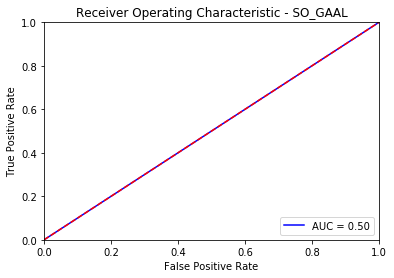

/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


SO_GAAL ROC:0.5, precision @ rank n:0.0
Duration:  56.120262  seconds


#####################################################################
Epoch 1 of 60

Testing for epoch 1 index 1:


/home/andre/anaconda3/lib/python3.7/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'



Testing for epoch 1 index 2:

Testing for epoch 1 index 3:

Testing for epoch 1 index 4:

Testing for epoch 1 index 5:

Testing for epoch 1 index 6:

Testing for epoch 1 index 7:

Testing for epoch 1 index 8:

Testing for epoch 1 index 9:

Testing for epoch 1 index 10:

Testing for epoch 1 index 11:

Testing for epoch 1 index 12:

Testing for epoch 1 index 13:

Testing for epoch 1 index 14:

Testing for epoch 1 index 15:

Testing for epoch 1 index 16:

Testing for epoch 1 index 17:

Testing for epoch 1 index 18:

Testing for epoch 1 index 19:

Testing for epoch 1 index 20:

Testing for epoch 1 index 21:

Testing for epoch 1 index 22:

Testing for epoch 1 index 23:

Testing for epoch 1 index 24:

Testing for epoch 1 index 25:

Testing for epoch 1 index 26:

Testing for epoch 1 index 27:

Testing for epoch 1 index 28:

Testing for epoch 1 index 29:

Testing for epoch 1 index 30:

Testing for epoch 1 index 31:

Testing for epoch 1 index 32:

Testing for epoch 1 index 33:

Testing for epo


Testing for epoch 7 index 32:

Testing for epoch 7 index 33:

Testing for epoch 7 index 34:

Testing for epoch 7 index 35:

Testing for epoch 7 index 36:

Testing for epoch 7 index 37:

Testing for epoch 7 index 38:

Testing for epoch 7 index 39:
Epoch 8 of 60

Testing for epoch 8 index 1:

Testing for epoch 8 index 2:

Testing for epoch 8 index 3:

Testing for epoch 8 index 4:

Testing for epoch 8 index 5:

Testing for epoch 8 index 6:

Testing for epoch 8 index 7:

Testing for epoch 8 index 8:

Testing for epoch 8 index 9:

Testing for epoch 8 index 10:

Testing for epoch 8 index 11:

Testing for epoch 8 index 12:

Testing for epoch 8 index 13:

Testing for epoch 8 index 14:

Testing for epoch 8 index 15:

Testing for epoch 8 index 16:

Testing for epoch 8 index 17:

Testing for epoch 8 index 18:

Testing for epoch 8 index 19:

Testing for epoch 8 index 20:

Testing for epoch 8 index 21:

Testing for epoch 8 index 22:

Testing for epoch 8 index 23:

Testing for epoch 8 index 24:

Te


Testing for epoch 14 index 17:

Testing for epoch 14 index 18:

Testing for epoch 14 index 19:

Testing for epoch 14 index 20:

Testing for epoch 14 index 21:

Testing for epoch 14 index 22:

Testing for epoch 14 index 23:

Testing for epoch 14 index 24:

Testing for epoch 14 index 25:

Testing for epoch 14 index 26:

Testing for epoch 14 index 27:

Testing for epoch 14 index 28:

Testing for epoch 14 index 29:

Testing for epoch 14 index 30:

Testing for epoch 14 index 31:

Testing for epoch 14 index 32:

Testing for epoch 14 index 33:

Testing for epoch 14 index 34:

Testing for epoch 14 index 35:

Testing for epoch 14 index 36:

Testing for epoch 14 index 37:

Testing for epoch 14 index 38:

Testing for epoch 14 index 39:
Epoch 15 of 60

Testing for epoch 15 index 1:

Testing for epoch 15 index 2:

Testing for epoch 15 index 3:

Testing for epoch 15 index 4:

Testing for epoch 15 index 5:

Testing for epoch 15 index 6:

Testing for epoch 15 index 7:

Testing for epoch 15 index 8:




Testing for epoch 20 index 38:

Testing for epoch 20 index 39:
Epoch 21 of 60

Testing for epoch 21 index 1:

Testing for epoch 21 index 2:
500/500 [==============================] - 0s 72us/step

Testing for epoch 21 index 3:
500/500 [==============================] - 0s 30us/step

Testing for epoch 21 index 4:
500/500 [==============================] - 0s 36us/step

Testing for epoch 21 index 5:
500/500 [==============================] - 0s 30us/step

Testing for epoch 21 index 6:
500/500 [==============================] - 0s 34us/step

Testing for epoch 21 index 7:
500/500 [==============================] - 0s 30us/step

Testing for epoch 21 index 8:
500/500 [==============================] - 0s 30us/step

Testing for epoch 21 index 9:
500/500 [==============================] - 0s 34us/step

Testing for epoch 21 index 10:
500/500 [==============================] - 0s 27us/step

Testing for epoch 21 index 11:
500/500 [==============================] - 0s 36us/step

Testing for epoch

500/500 [==============================] - 0s 31us/step

Testing for epoch 21 index 16:
500/500 [==============================] - 0s 38us/step

Testing for epoch 21 index 17:
500/500 [==============================] - 0s 31us/step

Testing for epoch 21 index 18:
500/500 [==============================] - 0s 42us/step

Testing for epoch 21 index 19:
500/500 [==============================] - 0s 36us/step

Testing for epoch 21 index 20:
500/500 [==============================] - 0s 30us/step

Testing for epoch 21 index 21:
500/500 [==============================] - 0s 34us/step

Testing for epoch 21 index 22:
500/500 [==============================] - 0s 33us/step

Testing for epoch 21 index 23:
500/500 [==============================] - 0s 27us/step

Testing for epoch 21 index 24:
500/500 [==============================] - 0s 34us/step

Testing for epoch 21 index 25:
500/500 [==============================] - 0s 35us/step

Testing for epoch 21 index 26:
500/500 [=======================

500/500 [==============================] - 0s 29us/step

Testing for epoch 21 index 30:
500/500 [==============================] - 0s 31us/step

Testing for epoch 21 index 31:
500/500 [==============================] - 0s 30us/step

Testing for epoch 21 index 32:
500/500 [==============================] - 0s 35us/step

Testing for epoch 21 index 33:
500/500 [==============================] - 0s 31us/step

Testing for epoch 21 index 34:
500/500 [==============================] - 0s 32us/step

Testing for epoch 21 index 35:
500/500 [==============================] - 0s 32us/step

Testing for epoch 21 index 36:
500/500 [==============================] - 0s 29us/step

Testing for epoch 21 index 37:
500/500 [==============================] - 0s 32us/step

Testing for epoch 21 index 38:
500/500 [==============================] - 0s 32us/step

Testing for epoch 21 index 39:
500/500 [==============================] - 0s 32us/step
Epoch 22 of 60

Testing for epoch 22 index 1:
500/500 [=========

500/500 [==============================] - 0s 35us/step

Testing for epoch 22 index 5:
500/500 [==============================] - 0s 36us/step

Testing for epoch 22 index 6:
500/500 [==============================] - 0s 38us/step

Testing for epoch 22 index 7:
500/500 [==============================] - 0s 33us/step

Testing for epoch 22 index 8:
500/500 [==============================] - 0s 30us/step

Testing for epoch 22 index 9:
500/500 [==============================] - 0s 32us/step

Testing for epoch 22 index 10:
500/500 [==============================] - 0s 30us/step

Testing for epoch 22 index 11:
500/500 [==============================] - 0s 38us/step

Testing for epoch 22 index 12:
500/500 [==============================] - 0s 30us/step

Testing for epoch 22 index 13:
500/500 [==============================] - 0s 30us/step

Testing for epoch 22 index 14:
500/500 [==============================] - 0s 33us/step

Testing for epoch 22 index 15:
500/500 [============================

500/500 [==============================] - 0s 31us/step

Testing for epoch 22 index 19:
500/500 [==============================] - 0s 39us/step

Testing for epoch 22 index 20:
500/500 [==============================] - 0s 33us/step

Testing for epoch 22 index 21:
500/500 [==============================] - 0s 36us/step

Testing for epoch 22 index 22:
500/500 [==============================] - 0s 42us/step

Testing for epoch 22 index 23:
500/500 [==============================] - 0s 32us/step

Testing for epoch 22 index 24:
500/500 [==============================] - 0s 39us/step

Testing for epoch 22 index 25:
500/500 [==============================] - 0s 35us/step

Testing for epoch 22 index 26:
500/500 [==============================] - 0s 30us/step

Testing for epoch 22 index 27:
500/500 [==============================] - 0s 30us/step

Testing for epoch 22 index 28:
500/500 [==============================] - 0s 35us/step

Testing for epoch 22 index 29:
500/500 [=======================

500/500 [==============================] - 0s 34us/step

Testing for epoch 22 index 32:
500/500 [==============================] - 0s 31us/step

Testing for epoch 22 index 33:
500/500 [==============================] - 0s 34us/step

Testing for epoch 22 index 34:
500/500 [==============================] - 0s 34us/step

Testing for epoch 22 index 35:
500/500 [==============================] - 0s 31us/step

Testing for epoch 22 index 36:
500/500 [==============================] - 0s 30us/step

Testing for epoch 22 index 37:
500/500 [==============================] - 0s 35us/step

Testing for epoch 22 index 38:
500/500 [==============================] - 0s 34us/step

Testing for epoch 22 index 39:
500/500 [==============================] - 0s 30us/step
Epoch 23 of 60

Testing for epoch 23 index 1:
500/500 [==============================] - 0s 29us/step

Testing for epoch 23 index 2:
500/500 [==============================] - 0s 32us/step

Testing for epoch 23 index 3:
500/500 [===========

500/500 [==============================] - 0s 29us/step

Testing for epoch 23 index 7:
500/500 [==============================] - 0s 38us/step

Testing for epoch 23 index 8:
500/500 [==============================] - 0s 33us/step

Testing for epoch 23 index 9:
500/500 [==============================] - 0s 34us/step

Testing for epoch 23 index 10:
500/500 [==============================] - 0s 33us/step

Testing for epoch 23 index 11:
500/500 [==============================] - 0s 32us/step

Testing for epoch 23 index 12:
500/500 [==============================] - 0s 42us/step

Testing for epoch 23 index 13:
500/500 [==============================] - 0s 31us/step

Testing for epoch 23 index 14:
500/500 [==============================] - 0s 31us/step

Testing for epoch 23 index 15:
500/500 [==============================] - 0s 32us/step

Testing for epoch 23 index 16:
500/500 [==============================] - 0s 28us/step

Testing for epoch 23 index 17:
500/500 [==========================

500/500 [==============================] - 0s 32us/step

Testing for epoch 23 index 21:
500/500 [==============================] - 0s 32us/step

Testing for epoch 23 index 22:
500/500 [==============================] - 0s 33us/step

Testing for epoch 23 index 23:
500/500 [==============================] - 0s 29us/step

Testing for epoch 23 index 24:
500/500 [==============================] - 0s 34us/step

Testing for epoch 23 index 25:
500/500 [==============================] - 0s 35us/step

Testing for epoch 23 index 26:
500/500 [==============================] - 0s 32us/step

Testing for epoch 23 index 27:
500/500 [==============================] - 0s 38us/step

Testing for epoch 23 index 28:
500/500 [==============================] - 0s 40us/step

Testing for epoch 23 index 29:
500/500 [==============================] - 0s 36us/step

Testing for epoch 23 index 30:
500/500 [==============================] - 0s 33us/step

Testing for epoch 23 index 31:
500/500 [=======================

500/500 [==============================] - 0s 32us/step

Testing for epoch 23 index 35:
500/500 [==============================] - 0s 36us/step

Testing for epoch 23 index 36:
500/500 [==============================] - 0s 33us/step

Testing for epoch 23 index 37:
500/500 [==============================] - 0s 28us/step

Testing for epoch 23 index 38:
500/500 [==============================] - 0s 33us/step

Testing for epoch 23 index 39:
500/500 [==============================] - 0s 36us/step
Epoch 24 of 60

Testing for epoch 24 index 1:
500/500 [==============================] - 0s 38us/step

Testing for epoch 24 index 2:
500/500 [==============================] - 0s 30us/step

Testing for epoch 24 index 3:
500/500 [==============================] - 0s 36us/step

Testing for epoch 24 index 4:
500/500 [==============================] - 0s 30us/step

Testing for epoch 24 index 5:
500/500 [==============================] - 0s 31us/step

Testing for epoch 24 index 6:
500/500 [==============

500/500 [==============================] - 0s 34us/step

Testing for epoch 24 index 10:
500/500 [==============================] - 0s 32us/step

Testing for epoch 24 index 11:
500/500 [==============================] - 0s 30us/step

Testing for epoch 24 index 12:
500/500 [==============================] - 0s 35us/step

Testing for epoch 24 index 13:
500/500 [==============================] - 0s 33us/step

Testing for epoch 24 index 14:
500/500 [==============================] - 0s 30us/step

Testing for epoch 24 index 15:
500/500 [==============================] - 0s 40us/step

Testing for epoch 24 index 16:
500/500 [==============================] - 0s 35us/step

Testing for epoch 24 index 17:
500/500 [==============================] - 0s 34us/step

Testing for epoch 24 index 18:
500/500 [==============================] - 0s 30us/step

Testing for epoch 24 index 19:
500/500 [==============================] - 0s 30us/step

Testing for epoch 24 index 20:
500/500 [=======================

500/500 [==============================] - 0s 35us/step

Testing for epoch 24 index 23:
500/500 [==============================] - 0s 42us/step

Testing for epoch 24 index 24:
500/500 [==============================] - 0s 33us/step

Testing for epoch 24 index 25:
500/500 [==============================] - 0s 33us/step

Testing for epoch 24 index 26:
500/500 [==============================] - 0s 32us/step

Testing for epoch 24 index 27:
500/500 [==============================] - 0s 39us/step

Testing for epoch 24 index 28:
500/500 [==============================] - 0s 30us/step

Testing for epoch 24 index 29:
500/500 [==============================] - 0s 29us/step

Testing for epoch 24 index 30:
500/500 [==============================] - 0s 31us/step

Testing for epoch 24 index 31:
500/500 [==============================] - 0s 28us/step

Testing for epoch 24 index 32:
500/500 [==============================] - 0s 38us/step

Testing for epoch 24 index 33:
500/500 [=======================

500/500 [==============================] - 0s 33us/step

Testing for epoch 24 index 37:
500/500 [==============================] - 0s 44us/step

Testing for epoch 24 index 38:
500/500 [==============================] - 0s 31us/step

Testing for epoch 24 index 39:
500/500 [==============================] - 0s 28us/step
Epoch 25 of 60

Testing for epoch 25 index 1:
500/500 [==============================] - 0s 37us/step

Testing for epoch 25 index 2:
500/500 [==============================] - 0s 35us/step

Testing for epoch 25 index 3:
500/500 [==============================] - 0s 35us/step

Testing for epoch 25 index 4:
500/500 [==============================] - 0s 32us/step

Testing for epoch 25 index 5:
500/500 [==============================] - 0s 31us/step

Testing for epoch 25 index 6:
500/500 [==============================] - 0s 39us/step

Testing for epoch 25 index 7:
500/500 [==============================] - 0s 30us/step

Testing for epoch 25 index 8:
500/500 [================

500/500 [==============================] - 0s 34us/step

Testing for epoch 25 index 12:
500/500 [==============================] - 0s 42us/step

Testing for epoch 25 index 13:
500/500 [==============================] - 0s 27us/step

Testing for epoch 25 index 14:
500/500 [==============================] - 0s 33us/step

Testing for epoch 25 index 15:
500/500 [==============================] - 0s 30us/step

Testing for epoch 25 index 16:
500/500 [==============================] - 0s 34us/step

Testing for epoch 25 index 17:
500/500 [==============================] - 0s 27us/step

Testing for epoch 25 index 18:
500/500 [==============================] - 0s 36us/step

Testing for epoch 25 index 19:
500/500 [==============================] - 0s 35us/step

Testing for epoch 25 index 20:
500/500 [==============================] - 0s 33us/step

Testing for epoch 25 index 21:
500/500 [==============================] - 0s 33us/step

Testing for epoch 25 index 22:
500/500 [=======================

500/500 [==============================] - 0s 32us/step

Testing for epoch 25 index 26:
500/500 [==============================] - 0s 31us/step

Testing for epoch 25 index 27:
500/500 [==============================] - 0s 35us/step

Testing for epoch 25 index 28:
500/500 [==============================] - 0s 40us/step

Testing for epoch 25 index 29:
500/500 [==============================] - 0s 39us/step

Testing for epoch 25 index 30:
500/500 [==============================] - 0s 32us/step

Testing for epoch 25 index 31:
500/500 [==============================] - 0s 30us/step

Testing for epoch 25 index 32:
500/500 [==============================] - 0s 31us/step

Testing for epoch 25 index 33:
500/500 [==============================] - 0s 42us/step

Testing for epoch 25 index 34:
500/500 [==============================] - 0s 32us/step

Testing for epoch 25 index 35:
500/500 [==============================] - 0s 23us/step

Testing for epoch 25 index 36:
500/500 [=======================

500/500 [==============================] - 0s 35us/step
Epoch 26 of 60

Testing for epoch 26 index 1:
500/500 [==============================] - 0s 33us/step

Testing for epoch 26 index 2:
500/500 [==============================] - 0s 31us/step

Testing for epoch 26 index 3:
500/500 [==============================] - 0s 32us/step

Testing for epoch 26 index 4:
500/500 [==============================] - 0s 47us/step

Testing for epoch 26 index 5:
500/500 [==============================] - 0s 32us/step

Testing for epoch 26 index 6:
500/500 [==============================] - 0s 30us/step

Testing for epoch 26 index 7:
500/500 [==============================] - 0s 35us/step

Testing for epoch 26 index 8:
500/500 [==============================] - 0s 36us/step

Testing for epoch 26 index 9:
500/500 [==============================] - 0s 37us/step

Testing for epoch 26 index 10:
500/500 [==============================] - 0s 34us/step

Testing for epoch 26 index 11:
500/500 [=================

500/500 [==============================] - 0s 30us/step

Testing for epoch 26 index 14:
500/500 [==============================] - 0s 32us/step

Testing for epoch 26 index 15:
500/500 [==============================] - 0s 31us/step

Testing for epoch 26 index 16:
500/500 [==============================] - 0s 33us/step

Testing for epoch 26 index 17:
500/500 [==============================] - 0s 32us/step

Testing for epoch 26 index 18:
500/500 [==============================] - 0s 27us/step

Testing for epoch 26 index 19:
500/500 [==============================] - 0s 34us/step

Testing for epoch 26 index 20:
500/500 [==============================] - 0s 37us/step

Testing for epoch 26 index 21:
500/500 [==============================] - 0s 33us/step

Testing for epoch 26 index 22:
500/500 [==============================] - 0s 34us/step

Testing for epoch 26 index 23:
500/500 [==============================] - 0s 34us/step

Testing for epoch 26 index 24:
500/500 [=======================

500/500 [==============================] - 0s 31us/step

Testing for epoch 26 index 28:
500/500 [==============================] - 0s 38us/step

Testing for epoch 26 index 29:
500/500 [==============================] - 0s 39us/step

Testing for epoch 26 index 30:
500/500 [==============================] - 0s 34us/step

Testing for epoch 26 index 31:
500/500 [==============================] - 0s 44us/step

Testing for epoch 26 index 32:
500/500 [==============================] - 0s 35us/step

Testing for epoch 26 index 33:
500/500 [==============================] - 0s 37us/step

Testing for epoch 26 index 34:
500/500 [==============================] - 0s 41us/step

Testing for epoch 26 index 35:
500/500 [==============================] - 0s 32us/step

Testing for epoch 26 index 36:
500/500 [==============================] - 0s 33us/step

Testing for epoch 26 index 37:
500/500 [==============================] - 0s 37us/step

Testing for epoch 26 index 38:
500/500 [=======================

500/500 [==============================] - 0s 38us/step

Testing for epoch 27 index 3:
500/500 [==============================] - 0s 41us/step

Testing for epoch 27 index 4:
500/500 [==============================] - 0s 40us/step

Testing for epoch 27 index 5:
500/500 [==============================] - 0s 38us/step

Testing for epoch 27 index 6:
500/500 [==============================] - 0s 34us/step

Testing for epoch 27 index 7:
500/500 [==============================] - 0s 35us/step

Testing for epoch 27 index 8:
500/500 [==============================] - 0s 35us/step

Testing for epoch 27 index 9:
500/500 [==============================] - 0s 32us/step

Testing for epoch 27 index 10:
500/500 [==============================] - 0s 35us/step

Testing for epoch 27 index 11:
500/500 [==============================] - 0s 31us/step

Testing for epoch 27 index 12:
500/500 [==============================] - 0s 35us/step

Testing for epoch 27 index 13:
500/500 [==============================

500/500 [==============================] - 0s 36us/step

Testing for epoch 27 index 17:
500/500 [==============================] - 0s 40us/step

Testing for epoch 27 index 18:
500/500 [==============================] - 0s 29us/step

Testing for epoch 27 index 19:
500/500 [==============================] - 0s 31us/step

Testing for epoch 27 index 20:
500/500 [==============================] - 0s 36us/step

Testing for epoch 27 index 21:
500/500 [==============================] - 0s 33us/step

Testing for epoch 27 index 22:
500/500 [==============================] - 0s 34us/step

Testing for epoch 27 index 23:
500/500 [==============================] - 0s 30us/step

Testing for epoch 27 index 24:
500/500 [==============================] - 0s 38us/step

Testing for epoch 27 index 25:
500/500 [==============================] - 0s 34us/step

Testing for epoch 27 index 26:
500/500 [==============================] - 0s 31us/step

Testing for epoch 27 index 27:
500/500 [=======================

500/500 [==============================] - 0s 40us/step

Testing for epoch 27 index 31:
500/500 [==============================] - 0s 43us/step

Testing for epoch 27 index 32:
500/500 [==============================] - 0s 38us/step

Testing for epoch 27 index 33:
500/500 [==============================] - 0s 38us/step

Testing for epoch 27 index 34:
500/500 [==============================] - 0s 33us/step

Testing for epoch 27 index 35:
500/500 [==============================] - 0s 43us/step

Testing for epoch 27 index 36:
500/500 [==============================] - 0s 37us/step

Testing for epoch 27 index 37:
500/500 [==============================] - 0s 44us/step

Testing for epoch 27 index 38:
500/500 [==============================] - 0s 34us/step

Testing for epoch 27 index 39:
500/500 [==============================] - 0s 40us/step
Epoch 28 of 60

Testing for epoch 28 index 1:
500/500 [==============================] - 0s 35us/step

Testing for epoch 28 index 2:
500/500 [==========

500/500 [==============================] - 0s 31us/step

Testing for epoch 28 index 5:
500/500 [==============================] - 0s 37us/step

Testing for epoch 28 index 6:
500/500 [==============================] - 0s 42us/step

Testing for epoch 28 index 7:
500/500 [==============================] - 0s 31us/step

Testing for epoch 28 index 8:
500/500 [==============================] - 0s 39us/step

Testing for epoch 28 index 9:
500/500 [==============================] - 0s 35us/step

Testing for epoch 28 index 10:
500/500 [==============================] - 0s 39us/step

Testing for epoch 28 index 11:
500/500 [==============================] - 0s 33us/step

Testing for epoch 28 index 12:
500/500 [==============================] - 0s 37us/step

Testing for epoch 28 index 13:
500/500 [==============================] - 0s 35us/step

Testing for epoch 28 index 14:
500/500 [==============================] - 0s 39us/step

Testing for epoch 28 index 15:
500/500 [============================

500/500 [==============================] - 0s 29us/step

Testing for epoch 28 index 19:
500/500 [==============================] - 0s 39us/step

Testing for epoch 28 index 20:
500/500 [==============================] - 0s 32us/step

Testing for epoch 28 index 21:
500/500 [==============================] - 0s 33us/step

Testing for epoch 28 index 22:
500/500 [==============================] - 0s 32us/step

Testing for epoch 28 index 23:
500/500 [==============================] - 0s 35us/step

Testing for epoch 28 index 24:
500/500 [==============================] - 0s 30us/step

Testing for epoch 28 index 25:
500/500 [==============================] - 0s 32us/step

Testing for epoch 28 index 26:
500/500 [==============================] - 0s 30us/step

Testing for epoch 28 index 27:
500/500 [==============================] - 0s 35us/step

Testing for epoch 28 index 28:
500/500 [==============================] - 0s 29us/step

Testing for epoch 28 index 29:
500/500 [=======================

500/500 [==============================] - 0s 36us/step

Testing for epoch 28 index 33:
500/500 [==============================] - 0s 37us/step

Testing for epoch 28 index 34:
500/500 [==============================] - 0s 32us/step

Testing for epoch 28 index 35:
500/500 [==============================] - 0s 33us/step

Testing for epoch 28 index 36:
500/500 [==============================] - 0s 50us/step

Testing for epoch 28 index 37:
500/500 [==============================] - 0s 34us/step

Testing for epoch 28 index 38:
500/500 [==============================] - 0s 32us/step

Testing for epoch 28 index 39:
500/500 [==============================] - 0s 38us/step
Epoch 29 of 60

Testing for epoch 29 index 1:
500/500 [==============================] - 0s 41us/step

Testing for epoch 29 index 2:
500/500 [==============================] - 0s 39us/step

Testing for epoch 29 index 3:
500/500 [==============================] - 0s 34us/step

Testing for epoch 29 index 4:
500/500 [============

500/500 [==============================] - 0s 32us/step

Testing for epoch 29 index 8:
500/500 [==============================] - 0s 38us/step

Testing for epoch 29 index 9:
500/500 [==============================] - 0s 35us/step

Testing for epoch 29 index 10:
500/500 [==============================] - 0s 33us/step

Testing for epoch 29 index 11:
500/500 [==============================] - 0s 37us/step

Testing for epoch 29 index 12:
500/500 [==============================] - 0s 38us/step

Testing for epoch 29 index 13:
500/500 [==============================] - 0s 36us/step

Testing for epoch 29 index 14:
500/500 [==============================] - 0s 32us/step

Testing for epoch 29 index 15:
500/500 [==============================] - 0s 35us/step

Testing for epoch 29 index 16:
500/500 [==============================] - 0s 32us/step

Testing for epoch 29 index 17:
500/500 [==============================] - 0s 33us/step

Testing for epoch 29 index 18:
500/500 [=========================

500/500 [==============================] - 0s 37us/step

Testing for epoch 29 index 22:
500/500 [==============================] - 0s 37us/step

Testing for epoch 29 index 23:
500/500 [==============================] - 0s 31us/step

Testing for epoch 29 index 24:
500/500 [==============================] - 0s 27us/step

Testing for epoch 29 index 25:
500/500 [==============================] - 0s 28us/step

Testing for epoch 29 index 26:
500/500 [==============================] - 0s 36us/step

Testing for epoch 29 index 27:
500/500 [==============================] - 0s 37us/step

Testing for epoch 29 index 28:
500/500 [==============================] - 0s 29us/step

Testing for epoch 29 index 29:
500/500 [==============================] - 0s 35us/step

Testing for epoch 29 index 30:
500/500 [==============================] - 0s 36us/step

Testing for epoch 29 index 31:
500/500 [==============================] - 0s 41us/step

Testing for epoch 29 index 32:
500/500 [=======================

500/500 [==============================] - 0s 33us/step

Testing for epoch 29 index 35:
500/500 [==============================] - 0s 37us/step

Testing for epoch 29 index 36:
500/500 [==============================] - 0s 35us/step

Testing for epoch 29 index 37:
500/500 [==============================] - 0s 37us/step

Testing for epoch 29 index 38:
500/500 [==============================] - 0s 35us/step

Testing for epoch 29 index 39:
500/500 [==============================] - 0s 43us/step
Epoch 30 of 60

Testing for epoch 30 index 1:
500/500 [==============================] - 0s 42us/step

Testing for epoch 30 index 2:
500/500 [==============================] - 0s 40us/step

Testing for epoch 30 index 3:
500/500 [==============================] - 0s 36us/step

Testing for epoch 30 index 4:
500/500 [==============================] - 0s 32us/step

Testing for epoch 30 index 5:
500/500 [==============================] - 0s 36us/step

Testing for epoch 30 index 6:
500/500 [==============

500/500 [==============================] - 0s 31us/step

Testing for epoch 30 index 10:
500/500 [==============================] - 0s 37us/step

Testing for epoch 30 index 11:
500/500 [==============================] - 0s 34us/step

Testing for epoch 30 index 12:
500/500 [==============================] - 0s 36us/step

Testing for epoch 30 index 13:
500/500 [==============================] - 0s 29us/step

Testing for epoch 30 index 14:
500/500 [==============================] - 0s 32us/step

Testing for epoch 30 index 15:
500/500 [==============================] - 0s 30us/step

Testing for epoch 30 index 16:
500/500 [==============================] - 0s 30us/step

Testing for epoch 30 index 17:
500/500 [==============================] - 0s 37us/step

Testing for epoch 30 index 18:
500/500 [==============================] - 0s 38us/step

Testing for epoch 30 index 19:
500/500 [==============================] - 0s 28us/step

Testing for epoch 30 index 20:
500/500 [=======================

500/500 [==============================] - 0s 33us/step

Testing for epoch 30 index 24:
500/500 [==============================] - 0s 32us/step

Testing for epoch 30 index 25:
500/500 [==============================] - 0s 30us/step

Testing for epoch 30 index 26:
500/500 [==============================] - 0s 35us/step

Testing for epoch 30 index 27:
500/500 [==============================] - 0s 32us/step

Testing for epoch 30 index 28:
500/500 [==============================] - 0s 35us/step

Testing for epoch 30 index 29:
500/500 [==============================] - 0s 36us/step

Testing for epoch 30 index 30:
500/500 [==============================] - 0s 31us/step

Testing for epoch 30 index 31:
500/500 [==============================] - 0s 32us/step

Testing for epoch 30 index 32:
500/500 [==============================] - 0s 34us/step

Testing for epoch 30 index 33:
500/500 [==============================] - 0s 32us/step

Testing for epoch 30 index 34:
500/500 [=======================

500/500 [==============================] - 0s 33us/step

Testing for epoch 30 index 38:
500/500 [==============================] - 0s 35us/step

Testing for epoch 30 index 39:
500/500 [==============================] - 0s 38us/step
Epoch 31 of 60

Testing for epoch 31 index 1:
500/500 [==============================] - 0s 31us/step

Testing for epoch 31 index 2:
500/500 [==============================] - 0s 39us/step

Testing for epoch 31 index 3:
500/500 [==============================] - 0s 34us/step

Testing for epoch 31 index 4:
500/500 [==============================] - 0s 35us/step

Testing for epoch 31 index 5:
500/500 [==============================] - 0s 36us/step

Testing for epoch 31 index 6:
500/500 [==============================] - 0s 32us/step

Testing for epoch 31 index 7:
500/500 [==============================] - 0s 37us/step

Testing for epoch 31 index 8:
500/500 [==============================] - 0s 34us/step

Testing for epoch 31 index 9:
500/500 [=================

500/500 [==============================] - 0s 22us/step

Testing for epoch 31 index 13:
500/500 [==============================] - 0s 26us/step

Testing for epoch 31 index 14:
500/500 [==============================] - 0s 23us/step

Testing for epoch 31 index 15:
500/500 [==============================] - 0s 37us/step

Testing for epoch 31 index 16:
500/500 [==============================] - 0s 33us/step

Testing for epoch 31 index 17:
500/500 [==============================] - 0s 32us/step

Testing for epoch 31 index 18:
500/500 [==============================] - 0s 31us/step

Testing for epoch 31 index 19:
500/500 [==============================] - 0s 35us/step

Testing for epoch 31 index 20:
500/500 [==============================] - 0s 38us/step

Testing for epoch 31 index 21:
500/500 [==============================] - 0s 35us/step

Testing for epoch 31 index 22:
500/500 [==============================] - 0s 36us/step

Testing for epoch 31 index 23:
500/500 [=======================

500/500 [==============================] - 0s 34us/step

Testing for epoch 31 index 26:
500/500 [==============================] - 0s 34us/step

Testing for epoch 31 index 27:
500/500 [==============================] - 0s 33us/step

Testing for epoch 31 index 28:
500/500 [==============================] - 0s 29us/step

Testing for epoch 31 index 29:
500/500 [==============================] - 0s 32us/step

Testing for epoch 31 index 30:
500/500 [==============================] - 0s 30us/step

Testing for epoch 31 index 31:
500/500 [==============================] - 0s 41us/step

Testing for epoch 31 index 32:
500/500 [==============================] - 0s 33us/step

Testing for epoch 31 index 33:
500/500 [==============================] - 0s 38us/step

Testing for epoch 31 index 34:
500/500 [==============================] - 0s 35us/step

Testing for epoch 31 index 35:
500/500 [==============================] - 0s 27us/step

Testing for epoch 31 index 36:
500/500 [=======================

500/500 [==============================] - 0s 28us/step
Epoch 32 of 60

Testing for epoch 32 index 1:
500/500 [==============================] - 0s 33us/step

Testing for epoch 32 index 2:
500/500 [==============================] - 0s 32us/step

Testing for epoch 32 index 3:
500/500 [==============================] - 0s 38us/step

Testing for epoch 32 index 4:
500/500 [==============================] - 0s 35us/step

Testing for epoch 32 index 5:
500/500 [==============================] - 0s 33us/step

Testing for epoch 32 index 6:
500/500 [==============================] - 0s 34us/step

Testing for epoch 32 index 7:
500/500 [==============================] - 0s 34us/step

Testing for epoch 32 index 8:
500/500 [==============================] - 0s 32us/step

Testing for epoch 32 index 9:
500/500 [==============================] - 0s 30us/step

Testing for epoch 32 index 10:
500/500 [==============================] - 0s 29us/step

Testing for epoch 32 index 11:
500/500 [=================

500/500 [==============================] - 0s 32us/step

Testing for epoch 32 index 15:
500/500 [==============================] - 0s 32us/step

Testing for epoch 32 index 16:
500/500 [==============================] - 0s 30us/step

Testing for epoch 32 index 17:
500/500 [==============================] - 0s 33us/step

Testing for epoch 32 index 18:
500/500 [==============================] - 0s 35us/step

Testing for epoch 32 index 19:
500/500 [==============================] - 0s 32us/step

Testing for epoch 32 index 20:
500/500 [==============================] - 0s 27us/step

Testing for epoch 32 index 21:
500/500 [==============================] - 0s 28us/step

Testing for epoch 32 index 22:
500/500 [==============================] - 0s 34us/step

Testing for epoch 32 index 23:
500/500 [==============================] - 0s 29us/step

Testing for epoch 32 index 24:
500/500 [==============================] - 0s 32us/step

Testing for epoch 32 index 25:
500/500 [=======================

500/500 [==============================] - 0s 31us/step

Testing for epoch 32 index 29:
500/500 [==============================] - 0s 32us/step

Testing for epoch 32 index 30:
500/500 [==============================] - 0s 32us/step

Testing for epoch 32 index 31:
500/500 [==============================] - 0s 29us/step

Testing for epoch 32 index 32:
500/500 [==============================] - 0s 34us/step

Testing for epoch 32 index 33:
500/500 [==============================] - 0s 31us/step

Testing for epoch 32 index 34:
500/500 [==============================] - 0s 33us/step

Testing for epoch 32 index 35:
500/500 [==============================] - 0s 34us/step

Testing for epoch 32 index 36:
500/500 [==============================] - 0s 30us/step

Testing for epoch 32 index 37:
500/500 [==============================] - 0s 29us/step

Testing for epoch 32 index 38:
500/500 [==============================] - 0s 31us/step

Testing for epoch 32 index 39:
500/500 [=======================

500/500 [==============================] - 0s 33us/step

Testing for epoch 33 index 4:
500/500 [==============================] - 0s 35us/step

Testing for epoch 33 index 5:
500/500 [==============================] - 0s 34us/step

Testing for epoch 33 index 6:
500/500 [==============================] - 0s 32us/step

Testing for epoch 33 index 7:
500/500 [==============================] - 0s 41us/step

Testing for epoch 33 index 8:
500/500 [==============================] - 0s 34us/step

Testing for epoch 33 index 9:
500/500 [==============================] - 0s 31us/step

Testing for epoch 33 index 10:
500/500 [==============================] - 0s 28us/step

Testing for epoch 33 index 11:
500/500 [==============================] - 0s 36us/step

Testing for epoch 33 index 12:
500/500 [==============================] - 0s 34us/step

Testing for epoch 33 index 13:
500/500 [==============================] - 0s 31us/step

Testing for epoch 33 index 14:
500/500 [=============================

500/500 [==============================] - 0s 34us/step

Testing for epoch 33 index 17:
500/500 [==============================] - 0s 34us/step

Testing for epoch 33 index 18:
500/500 [==============================] - 0s 30us/step

Testing for epoch 33 index 19:
500/500 [==============================] - 0s 33us/step

Testing for epoch 33 index 20:
500/500 [==============================] - 0s 33us/step

Testing for epoch 33 index 21:
500/500 [==============================] - 0s 32us/step

Testing for epoch 33 index 22:
500/500 [==============================] - 0s 34us/step

Testing for epoch 33 index 23:
500/500 [==============================] - 0s 35us/step

Testing for epoch 33 index 24:
500/500 [==============================] - 0s 52us/step

Testing for epoch 33 index 25:
500/500 [==============================] - 0s 32us/step

Testing for epoch 33 index 26:
500/500 [==============================] - 0s 31us/step

Testing for epoch 33 index 27:
500/500 [=======================

500/500 [==============================] - 0s 34us/step

Testing for epoch 33 index 31:
500/500 [==============================] - 0s 33us/step

Testing for epoch 33 index 32:
500/500 [==============================] - 0s 35us/step

Testing for epoch 33 index 33:
500/500 [==============================] - 0s 29us/step

Testing for epoch 33 index 34:
500/500 [==============================] - 0s 32us/step

Testing for epoch 33 index 35:
500/500 [==============================] - 0s 37us/step

Testing for epoch 33 index 36:
500/500 [==============================] - 0s 37us/step

Testing for epoch 33 index 37:
500/500 [==============================] - 0s 34us/step

Testing for epoch 33 index 38:
500/500 [==============================] - 0s 31us/step

Testing for epoch 33 index 39:
500/500 [==============================] - 0s 33us/step
Epoch 34 of 60

Testing for epoch 34 index 1:
500/500 [==============================] - 0s 31us/step

Testing for epoch 34 index 2:
500/500 [==========

500/500 [==============================] - 0s 42us/step

Testing for epoch 34 index 6:
500/500 [==============================] - 0s 36us/step

Testing for epoch 34 index 7:
500/500 [==============================] - 0s 31us/step

Testing for epoch 34 index 8:
500/500 [==============================] - 0s 30us/step

Testing for epoch 34 index 9:
500/500 [==============================] - 0s 40us/step

Testing for epoch 34 index 10:
500/500 [==============================] - 0s 31us/step

Testing for epoch 34 index 11:
500/500 [==============================] - 0s 34us/step

Testing for epoch 34 index 12:
500/500 [==============================] - 0s 30us/step

Testing for epoch 34 index 13:
500/500 [==============================] - 0s 35us/step

Testing for epoch 34 index 14:
500/500 [==============================] - 0s 31us/step

Testing for epoch 34 index 15:
500/500 [==============================] - 0s 32us/step

Testing for epoch 34 index 16:
500/500 [===========================

500/500 [==============================] - 0s 29us/step

Testing for epoch 34 index 20:
500/500 [==============================] - 0s 37us/step

Testing for epoch 34 index 21:
500/500 [==============================] - 0s 32us/step

Testing for epoch 34 index 22:
500/500 [==============================] - 0s 36us/step

Testing for epoch 34 index 23:
500/500 [==============================] - 0s 36us/step

Testing for epoch 34 index 24:
500/500 [==============================] - 0s 39us/step

Testing for epoch 34 index 25:
500/500 [==============================] - 0s 31us/step

Testing for epoch 34 index 26:
500/500 [==============================] - 0s 37us/step

Testing for epoch 34 index 27:
500/500 [==============================] - 0s 35us/step

Testing for epoch 34 index 28:
500/500 [==============================] - 0s 32us/step

Testing for epoch 34 index 29:
500/500 [==============================] - 0s 35us/step

Testing for epoch 34 index 30:
500/500 [=======================

500/500 [==============================] - 0s 34us/step

Testing for epoch 34 index 34:
500/500 [==============================] - 0s 33us/step

Testing for epoch 34 index 35:
500/500 [==============================] - 0s 36us/step

Testing for epoch 34 index 36:
500/500 [==============================] - 0s 33us/step

Testing for epoch 34 index 37:
500/500 [==============================] - 0s 33us/step

Testing for epoch 34 index 38:
500/500 [==============================] - 0s 31us/step

Testing for epoch 34 index 39:
500/500 [==============================] - 0s 42us/step
Epoch 35 of 60

Testing for epoch 35 index 1:
500/500 [==============================] - 0s 35us/step

Testing for epoch 35 index 2:
500/500 [==============================] - 0s 32us/step

Testing for epoch 35 index 3:
500/500 [==============================] - 0s 34us/step

Testing for epoch 35 index 4:
500/500 [==============================] - 0s 32us/step

Testing for epoch 35 index 5:
500/500 [=============

500/500 [==============================] - 0s 32us/step

Testing for epoch 35 index 8:
500/500 [==============================] - 0s 31us/step

Testing for epoch 35 index 9:
500/500 [==============================] - 0s 30us/step

Testing for epoch 35 index 10:
500/500 [==============================] - 0s 37us/step

Testing for epoch 35 index 11:
500/500 [==============================] - 0s 29us/step

Testing for epoch 35 index 12:
500/500 [==============================] - 0s 31us/step

Testing for epoch 35 index 13:
500/500 [==============================] - 0s 38us/step

Testing for epoch 35 index 14:
500/500 [==============================] - 0s 36us/step

Testing for epoch 35 index 15:
500/500 [==============================] - 0s 34us/step

Testing for epoch 35 index 16:
500/500 [==============================] - 0s 33us/step

Testing for epoch 35 index 17:
500/500 [==============================] - 0s 32us/step

Testing for epoch 35 index 18:
500/500 [=========================

500/500 [==============================] - 0s 30us/step

Testing for epoch 35 index 22:
500/500 [==============================] - 0s 38us/step

Testing for epoch 35 index 23:
500/500 [==============================] - 0s 31us/step

Testing for epoch 35 index 24:
500/500 [==============================] - 0s 35us/step

Testing for epoch 35 index 25:
500/500 [==============================] - 0s 26us/step

Testing for epoch 35 index 26:
500/500 [==============================] - 0s 34us/step

Testing for epoch 35 index 27:
500/500 [==============================] - 0s 36us/step

Testing for epoch 35 index 28:
500/500 [==============================] - 0s 32us/step

Testing for epoch 35 index 29:
500/500 [==============================] - 0s 32us/step

Testing for epoch 35 index 30:
500/500 [==============================] - 0s 32us/step

Testing for epoch 35 index 31:
500/500 [==============================] - 0s 33us/step

Testing for epoch 35 index 32:
500/500 [=======================

500/500 [==============================] - 0s 31us/step

Testing for epoch 35 index 36:
500/500 [==============================] - 0s 33us/step

Testing for epoch 35 index 37:
500/500 [==============================] - 0s 29us/step

Testing for epoch 35 index 38:
500/500 [==============================] - 0s 35us/step

Testing for epoch 35 index 39:
500/500 [==============================] - 0s 36us/step
Epoch 36 of 60

Testing for epoch 36 index 1:
500/500 [==============================] - 0s 38us/step

Testing for epoch 36 index 2:
500/500 [==============================] - 0s 33us/step

Testing for epoch 36 index 3:
500/500 [==============================] - 0s 48us/step

Testing for epoch 36 index 4:
500/500 [==============================] - 0s 40us/step

Testing for epoch 36 index 5:
500/500 [==============================] - 0s 39us/step

Testing for epoch 36 index 6:
500/500 [==============================] - 0s 28us/step

Testing for epoch 36 index 7:
500/500 [===============

500/500 [==============================] - 0s 36us/step

Testing for epoch 36 index 11:
500/500 [==============================] - 0s 33us/step

Testing for epoch 36 index 12:
500/500 [==============================] - 0s 36us/step

Testing for epoch 36 index 13:
500/500 [==============================] - 0s 30us/step

Testing for epoch 36 index 14:
500/500 [==============================] - 0s 29us/step

Testing for epoch 36 index 15:
500/500 [==============================] - 0s 35us/step

Testing for epoch 36 index 16:
500/500 [==============================] - 0s 33us/step

Testing for epoch 36 index 17:
500/500 [==============================] - 0s 28us/step

Testing for epoch 36 index 18:
500/500 [==============================] - 0s 30us/step

Testing for epoch 36 index 19:
500/500 [==============================] - 0s 31us/step

Testing for epoch 36 index 20:
500/500 [==============================] - 0s 33us/step

Testing for epoch 36 index 21:
500/500 [=======================

500/500 [==============================] - 0s 32us/step

Testing for epoch 36 index 25:
500/500 [==============================] - 0s 33us/step

Testing for epoch 36 index 26:
500/500 [==============================] - 0s 30us/step

Testing for epoch 36 index 27:
500/500 [==============================] - 0s 33us/step

Testing for epoch 36 index 28:
500/500 [==============================] - 0s 33us/step

Testing for epoch 36 index 29:
500/500 [==============================] - 0s 33us/step

Testing for epoch 36 index 30:
500/500 [==============================] - 0s 33us/step

Testing for epoch 36 index 31:
500/500 [==============================] - 0s 38us/step

Testing for epoch 36 index 32:
500/500 [==============================] - 0s 38us/step

Testing for epoch 36 index 33:
500/500 [==============================] - 0s 33us/step

Testing for epoch 36 index 34:
500/500 [==============================] - 0s 35us/step

Testing for epoch 36 index 35:
500/500 [=======================

500/500 [==============================] - 0s 38us/step

Testing for epoch 36 index 38:
500/500 [==============================] - 0s 23us/step

Testing for epoch 36 index 39:
500/500 [==============================] - 0s 21us/step
Epoch 37 of 60

Testing for epoch 37 index 1:
500/500 [==============================] - 0s 26us/step

Testing for epoch 37 index 2:
500/500 [==============================] - 0s 31us/step

Testing for epoch 37 index 3:
500/500 [==============================] - 0s 41us/step

Testing for epoch 37 index 4:
500/500 [==============================] - 0s 32us/step

Testing for epoch 37 index 5:
500/500 [==============================] - 0s 34us/step

Testing for epoch 37 index 6:
500/500 [==============================] - 0s 32us/step

Testing for epoch 37 index 7:
500/500 [==============================] - 0s 31us/step

Testing for epoch 37 index 8:
500/500 [==============================] - 0s 40us/step

Testing for epoch 37 index 9:
500/500 [=================

500/500 [==============================] - 0s 31us/step

Testing for epoch 37 index 13:
500/500 [==============================] - 0s 40us/step

Testing for epoch 37 index 14:
500/500 [==============================] - 0s 33us/step

Testing for epoch 37 index 15:
500/500 [==============================] - 0s 34us/step

Testing for epoch 37 index 16:
500/500 [==============================] - 0s 41us/step

Testing for epoch 37 index 17:
500/500 [==============================] - 0s 33us/step

Testing for epoch 37 index 18:
500/500 [==============================] - 0s 41us/step

Testing for epoch 37 index 19:
500/500 [==============================] - 0s 29us/step

Testing for epoch 37 index 20:
500/500 [==============================] - 0s 32us/step

Testing for epoch 37 index 21:
500/500 [==============================] - 0s 33us/step

Testing for epoch 37 index 22:
500/500 [==============================] - 0s 35us/step

Testing for epoch 37 index 23:
500/500 [=======================

500/500 [==============================] - 0s 39us/step

Testing for epoch 37 index 27:
500/500 [==============================] - 0s 33us/step

Testing for epoch 37 index 28:
500/500 [==============================] - 0s 32us/step

Testing for epoch 37 index 29:
500/500 [==============================] - 0s 33us/step

Testing for epoch 37 index 30:
500/500 [==============================] - 0s 31us/step

Testing for epoch 37 index 31:
500/500 [==============================] - 0s 35us/step

Testing for epoch 37 index 32:
500/500 [==============================] - 0s 37us/step

Testing for epoch 37 index 33:
500/500 [==============================] - 0s 30us/step

Testing for epoch 37 index 34:
500/500 [==============================] - 0s 31us/step

Testing for epoch 37 index 35:
500/500 [==============================] - 0s 35us/step

Testing for epoch 37 index 36:
500/500 [==============================] - 0s 31us/step

Testing for epoch 37 index 37:
500/500 [=======================

500/500 [==============================] - 0s 36us/step

Testing for epoch 38 index 2:
500/500 [==============================] - 0s 31us/step

Testing for epoch 38 index 3:
500/500 [==============================] - 0s 37us/step

Testing for epoch 38 index 4:
500/500 [==============================] - 0s 34us/step

Testing for epoch 38 index 5:
500/500 [==============================] - 0s 37us/step

Testing for epoch 38 index 6:
500/500 [==============================] - 0s 36us/step

Testing for epoch 38 index 7:
500/500 [==============================] - 0s 34us/step

Testing for epoch 38 index 8:
500/500 [==============================] - 0s 29us/step

Testing for epoch 38 index 9:
500/500 [==============================] - 0s 30us/step

Testing for epoch 38 index 10:
500/500 [==============================] - 0s 41us/step

Testing for epoch 38 index 11:
500/500 [==============================] - 0s 32us/step

Testing for epoch 38 index 12:
500/500 [==============================]

500/500 [==============================] - 0s 38us/step

Testing for epoch 38 index 16:
500/500 [==============================] - 0s 31us/step

Testing for epoch 38 index 17:
500/500 [==============================] - 0s 33us/step

Testing for epoch 38 index 18:
500/500 [==============================] - 0s 29us/step

Testing for epoch 38 index 19:
500/500 [==============================] - 0s 34us/step

Testing for epoch 38 index 20:
500/500 [==============================] - 0s 45us/step

Testing for epoch 38 index 21:
500/500 [==============================] - 0s 30us/step

Testing for epoch 38 index 22:
500/500 [==============================] - 0s 38us/step

Testing for epoch 38 index 23:
500/500 [==============================] - 0s 31us/step

Testing for epoch 38 index 24:
500/500 [==============================] - 0s 43us/step

Testing for epoch 38 index 25:
500/500 [==============================] - 0s 33us/step

Testing for epoch 38 index 26:
500/500 [=======================

500/500 [==============================] - 0s 29us/step

Testing for epoch 38 index 29:
500/500 [==============================] - 0s 33us/step

Testing for epoch 38 index 30:
500/500 [==============================] - 0s 39us/step

Testing for epoch 38 index 31:
500/500 [==============================] - 0s 29us/step

Testing for epoch 38 index 32:
500/500 [==============================] - 0s 36us/step

Testing for epoch 38 index 33:
500/500 [==============================] - 0s 38us/step

Testing for epoch 38 index 34:
500/500 [==============================] - 0s 32us/step

Testing for epoch 38 index 35:
500/500 [==============================] - 0s 32us/step

Testing for epoch 38 index 36:
500/500 [==============================] - 0s 36us/step

Testing for epoch 38 index 37:
500/500 [==============================] - 0s 35us/step

Testing for epoch 38 index 38:
500/500 [==============================] - 0s 32us/step

Testing for epoch 38 index 39:
500/500 [=======================

500/500 [==============================] - 0s 31us/step

Testing for epoch 39 index 4:
500/500 [==============================] - 0s 33us/step

Testing for epoch 39 index 5:
500/500 [==============================] - 0s 32us/step

Testing for epoch 39 index 6:
500/500 [==============================] - 0s 34us/step

Testing for epoch 39 index 7:
500/500 [==============================] - 0s 34us/step

Testing for epoch 39 index 8:
500/500 [==============================] - 0s 35us/step

Testing for epoch 39 index 9:
500/500 [==============================] - 0s 30us/step

Testing for epoch 39 index 10:
500/500 [==============================] - 0s 32us/step

Testing for epoch 39 index 11:
500/500 [==============================] - 0s 35us/step

Testing for epoch 39 index 12:
500/500 [==============================] - 0s 35us/step

Testing for epoch 39 index 13:
500/500 [==============================] - 0s 32us/step

Testing for epoch 39 index 14:
500/500 [=============================

500/500 [==============================] - 0s 37us/step

Testing for epoch 39 index 18:
500/500 [==============================] - 0s 32us/step

Testing for epoch 39 index 19:
500/500 [==============================] - 0s 32us/step

Testing for epoch 39 index 20:
500/500 [==============================] - 0s 36us/step

Testing for epoch 39 index 21:
500/500 [==============================] - 0s 32us/step

Testing for epoch 39 index 22:
500/500 [==============================] - 0s 41us/step

Testing for epoch 39 index 23:
500/500 [==============================] - 0s 45us/step

Testing for epoch 39 index 24:
500/500 [==============================] - 0s 29us/step

Testing for epoch 39 index 25:
500/500 [==============================] - 0s 31us/step

Testing for epoch 39 index 26:
500/500 [==============================] - 0s 32us/step

Testing for epoch 39 index 27:
500/500 [==============================] - 0s 31us/step

Testing for epoch 39 index 28:
500/500 [=======================

500/500 [==============================] - 0s 37us/step

Testing for epoch 39 index 32:
500/500 [==============================] - 0s 31us/step

Testing for epoch 39 index 33:
500/500 [==============================] - 0s 40us/step

Testing for epoch 39 index 34:
500/500 [==============================] - 0s 34us/step

Testing for epoch 39 index 35:
500/500 [==============================] - 0s 36us/step

Testing for epoch 39 index 36:
500/500 [==============================] - 0s 30us/step

Testing for epoch 39 index 37:
500/500 [==============================] - 0s 30us/step

Testing for epoch 39 index 38:
500/500 [==============================] - 0s 30us/step

Testing for epoch 39 index 39:
500/500 [==============================] - 0s 34us/step
Epoch 40 of 60

Testing for epoch 40 index 1:
500/500 [==============================] - 0s 32us/step

Testing for epoch 40 index 2:
500/500 [==============================] - 0s 31us/step

Testing for epoch 40 index 3:
500/500 [===========

500/500 [==============================] - 0s 35us/step

Testing for epoch 40 index 7:
500/500 [==============================] - 0s 34us/step

Testing for epoch 40 index 8:
500/500 [==============================] - 0s 31us/step

Testing for epoch 40 index 9:
500/500 [==============================] - 0s 30us/step

Testing for epoch 40 index 10:
500/500 [==============================] - 0s 33us/step

Testing for epoch 40 index 11:
500/500 [==============================] - 0s 34us/step

Testing for epoch 40 index 12:
500/500 [==============================] - 0s 34us/step

Testing for epoch 40 index 13:
500/500 [==============================] - 0s 33us/step

Testing for epoch 40 index 14:
500/500 [==============================] - 0s 36us/step

Testing for epoch 40 index 15:
500/500 [==============================] - 0s 34us/step

Testing for epoch 40 index 16:
500/500 [==============================] - 0s 34us/step

Testing for epoch 40 index 17:
500/500 [==========================


Testing for epoch 40 index 20:
500/500 [==============================] - 0s 32us/step

Testing for epoch 40 index 21:
500/500 [==============================] - 0s 34us/step

Testing for epoch 40 index 22:
500/500 [==============================] - 0s 40us/step

Testing for epoch 40 index 23:
500/500 [==============================] - 0s 31us/step

Testing for epoch 40 index 24:
500/500 [==============================] - 0s 30us/step

Testing for epoch 40 index 25:
500/500 [==============================] - 0s 33us/step

Testing for epoch 40 index 26:
500/500 [==============================] - 0s 33us/step

Testing for epoch 40 index 27:
500/500 [==============================] - 0s 29us/step

Testing for epoch 40 index 28:
500/500 [==============================] - 0s 35us/step

Testing for epoch 40 index 29:
500/500 [==============================] - 0s 31us/step

Testing for epoch 40 index 30:
500/500 [==============================] - 0s 39us/step

Testing for epoch 40 index 31:


500/500 [==============================] - 0s 34us/step

Testing for epoch 40 index 34:
500/500 [==============================] - 0s 42us/step

Testing for epoch 40 index 35:
500/500 [==============================] - 0s 26us/step

Testing for epoch 40 index 36:
500/500 [==============================] - 0s 36us/step

Testing for epoch 40 index 37:
500/500 [==============================] - 0s 34us/step

Testing for epoch 40 index 38:
500/500 [==============================] - 0s 28us/step

Testing for epoch 40 index 39:
500/500 [==============================] - 0s 38us/step
Epoch 41 of 60

Testing for epoch 41 index 1:
500/500 [==============================] - 0s 35us/step

Testing for epoch 41 index 2:
500/500 [==============================] - 0s 39us/step

Testing for epoch 41 index 3:
500/500 [==============================] - 0s 30us/step

Testing for epoch 41 index 4:
500/500 [==============================] - 0s 36us/step

Testing for epoch 41 index 5:
500/500 [=============

500/500 [==============================] - 0s 33us/step

Testing for epoch 41 index 9:
500/500 [==============================] - 0s 32us/step

Testing for epoch 41 index 10:
500/500 [==============================] - 0s 33us/step

Testing for epoch 41 index 11:
500/500 [==============================] - 0s 33us/step

Testing for epoch 41 index 12:
500/500 [==============================] - 0s 32us/step

Testing for epoch 41 index 13:
500/500 [==============================] - 0s 36us/step

Testing for epoch 41 index 14:
500/500 [==============================] - 0s 41us/step

Testing for epoch 41 index 15:
500/500 [==============================] - 0s 31us/step

Testing for epoch 41 index 16:
500/500 [==============================] - 0s 32us/step

Testing for epoch 41 index 17:
500/500 [==============================] - 0s 34us/step

Testing for epoch 41 index 18:
500/500 [==============================] - 0s 33us/step

Testing for epoch 41 index 19:
500/500 [========================

500/500 [==============================] - 0s 40us/step

Testing for epoch 41 index 23:
500/500 [==============================] - 0s 31us/step

Testing for epoch 41 index 24:
500/500 [==============================] - 0s 37us/step

Testing for epoch 41 index 25:
500/500 [==============================] - 0s 31us/step

Testing for epoch 41 index 26:
500/500 [==============================] - 0s 36us/step

Testing for epoch 41 index 27:
500/500 [==============================] - 0s 35us/step

Testing for epoch 41 index 28:
500/500 [==============================] - 0s 35us/step

Testing for epoch 41 index 29:
500/500 [==============================] - 0s 35us/step

Testing for epoch 41 index 30:
500/500 [==============================] - 0s 31us/step

Testing for epoch 41 index 31:
500/500 [==============================] - 0s 33us/step

Testing for epoch 41 index 32:
500/500 [==============================] - 0s 33us/step

Testing for epoch 41 index 33:
500/500 [=======================

500/500 [==============================] - 0s 32us/step

Testing for epoch 41 index 37:
500/500 [==============================] - 0s 41us/step

Testing for epoch 41 index 38:
500/500 [==============================] - 0s 28us/step

Testing for epoch 41 index 39:
500/500 [==============================] - 0s 33us/step
Epoch 42 of 60

Testing for epoch 42 index 1:
500/500 [==============================] - 0s 34us/step

Testing for epoch 42 index 2:
500/500 [==============================] - 0s 33us/step

Testing for epoch 42 index 3:
500/500 [==============================] - 0s 34us/step

Testing for epoch 42 index 4:
500/500 [==============================] - 0s 29us/step

Testing for epoch 42 index 5:
500/500 [==============================] - 0s 37us/step

Testing for epoch 42 index 6:
500/500 [==============================] - 0s 32us/step

Testing for epoch 42 index 7:
500/500 [==============================] - 0s 33us/step

Testing for epoch 42 index 8:
500/500 [================

500/500 [==============================] - 0s 37us/step

Testing for epoch 42 index 12:
500/500 [==============================] - 0s 34us/step

Testing for epoch 42 index 13:
500/500 [==============================] - 0s 35us/step

Testing for epoch 42 index 14:
500/500 [==============================] - 0s 33us/step

Testing for epoch 42 index 15:
500/500 [==============================] - 0s 34us/step

Testing for epoch 42 index 16:
500/500 [==============================] - 0s 30us/step

Testing for epoch 42 index 17:
500/500 [==============================] - 0s 33us/step

Testing for epoch 42 index 18:
500/500 [==============================] - 0s 28us/step

Testing for epoch 42 index 19:
500/500 [==============================] - 0s 38us/step

Testing for epoch 42 index 20:
500/500 [==============================] - 0s 34us/step

Testing for epoch 42 index 21:
500/500 [==============================] - 0s 35us/step

Testing for epoch 42 index 22:
500/500 [=======================

500/500 [==============================] - 0s 23us/step

Testing for epoch 42 index 25:
500/500 [==============================] - 0s 30us/step

Testing for epoch 42 index 26:
500/500 [==============================] - 0s 33us/step

Testing for epoch 42 index 27:
500/500 [==============================] - 0s 30us/step

Testing for epoch 42 index 28:
500/500 [==============================] - 0s 43us/step

Testing for epoch 42 index 29:
500/500 [==============================] - 0s 36us/step

Testing for epoch 42 index 30:
500/500 [==============================] - 0s 36us/step

Testing for epoch 42 index 31:
500/500 [==============================] - 0s 34us/step

Testing for epoch 42 index 32:
500/500 [==============================] - 0s 42us/step

Testing for epoch 42 index 33:
500/500 [==============================] - 0s 34us/step

Testing for epoch 42 index 34:
500/500 [==============================] - 0s 29us/step

Testing for epoch 42 index 35:
500/500 [=======================

500/500 [==============================] - 0s 30us/step

Testing for epoch 42 index 39:
500/500 [==============================] - 0s 34us/step
Epoch 43 of 60

Testing for epoch 43 index 1:
500/500 [==============================] - 0s 29us/step

Testing for epoch 43 index 2:
500/500 [==============================] - 0s 32us/step

Testing for epoch 43 index 3:
500/500 [==============================] - 0s 34us/step

Testing for epoch 43 index 4:
500/500 [==============================] - 0s 38us/step

Testing for epoch 43 index 5:
500/500 [==============================] - 0s 35us/step

Testing for epoch 43 index 6:
500/500 [==============================] - 0s 29us/step

Testing for epoch 43 index 7:
500/500 [==============================] - 0s 32us/step

Testing for epoch 43 index 8:
500/500 [==============================] - 0s 31us/step

Testing for epoch 43 index 9:
500/500 [==============================] - 0s 34us/step

Testing for epoch 43 index 10:
500/500 [=================

500/500 [==============================] - 0s 36us/step

Testing for epoch 43 index 14:
500/500 [==============================] - 0s 33us/step

Testing for epoch 43 index 15:
500/500 [==============================] - 0s 33us/step

Testing for epoch 43 index 16:
500/500 [==============================] - 0s 33us/step

Testing for epoch 43 index 17:
500/500 [==============================] - 0s 32us/step

Testing for epoch 43 index 18:
500/500 [==============================] - 0s 32us/step

Testing for epoch 43 index 19:
500/500 [==============================] - 0s 34us/step

Testing for epoch 43 index 20:
500/500 [==============================] - 0s 33us/step

Testing for epoch 43 index 21:
500/500 [==============================] - 0s 32us/step

Testing for epoch 43 index 22:
500/500 [==============================] - 0s 30us/step

Testing for epoch 43 index 23:
500/500 [==============================] - 0s 28us/step

Testing for epoch 43 index 24:
500/500 [=======================

500/500 [==============================] - 0s 32us/step

Testing for epoch 43 index 28:
500/500 [==============================] - 0s 32us/step

Testing for epoch 43 index 29:
500/500 [==============================] - 0s 36us/step

Testing for epoch 43 index 30:
500/500 [==============================] - 0s 34us/step

Testing for epoch 43 index 31:
500/500 [==============================] - 0s 33us/step

Testing for epoch 43 index 32:
500/500 [==============================] - 0s 28us/step

Testing for epoch 43 index 33:
500/500 [==============================] - 0s 33us/step

Testing for epoch 43 index 34:
500/500 [==============================] - 0s 34us/step

Testing for epoch 43 index 35:
500/500 [==============================] - 0s 31us/step

Testing for epoch 43 index 36:
500/500 [==============================] - 0s 29us/step

Testing for epoch 43 index 37:
500/500 [==============================] - 0s 35us/step

Testing for epoch 43 index 38:
500/500 [=======================

500/500 [==============================] - 0s 35us/step

Testing for epoch 44 index 3:
500/500 [==============================] - 0s 31us/step

Testing for epoch 44 index 4:
500/500 [==============================] - 0s 36us/step

Testing for epoch 44 index 5:
500/500 [==============================] - 0s 36us/step

Testing for epoch 44 index 6:
500/500 [==============================] - 0s 35us/step

Testing for epoch 44 index 7:
500/500 [==============================] - 0s 33us/step

Testing for epoch 44 index 8:
500/500 [==============================] - 0s 35us/step

Testing for epoch 44 index 9:
500/500 [==============================] - 0s 30us/step

Testing for epoch 44 index 10:
500/500 [==============================] - 0s 36us/step

Testing for epoch 44 index 11:
500/500 [==============================] - 0s 32us/step

Testing for epoch 44 index 12:
500/500 [==============================] - 0s 32us/step

Testing for epoch 44 index 13:
500/500 [==============================

500/500 [==============================] - 0s 32us/step

Testing for epoch 44 index 16:
500/500 [==============================] - 0s 30us/step

Testing for epoch 44 index 17:
500/500 [==============================] - 0s 34us/step

Testing for epoch 44 index 18:
500/500 [==============================] - 0s 33us/step

Testing for epoch 44 index 19:
500/500 [==============================] - 0s 30us/step

Testing for epoch 44 index 20:
500/500 [==============================] - 0s 33us/step

Testing for epoch 44 index 21:
500/500 [==============================] - 0s 34us/step

Testing for epoch 44 index 22:
500/500 [==============================] - 0s 37us/step

Testing for epoch 44 index 23:
500/500 [==============================] - 0s 29us/step

Testing for epoch 44 index 24:
500/500 [==============================] - 0s 30us/step

Testing for epoch 44 index 25:
500/500 [==============================] - 0s 28us/step

Testing for epoch 44 index 26:
500/500 [=======================

500/500 [==============================] - 0s 35us/step

Testing for epoch 44 index 30:
500/500 [==============================] - 0s 35us/step

Testing for epoch 44 index 31:
500/500 [==============================] - 0s 37us/step

Testing for epoch 44 index 32:
500/500 [==============================] - 0s 34us/step

Testing for epoch 44 index 33:
500/500 [==============================] - 0s 35us/step

Testing for epoch 44 index 34:
500/500 [==============================] - 0s 35us/step

Testing for epoch 44 index 35:
500/500 [==============================] - 0s 32us/step

Testing for epoch 44 index 36:
500/500 [==============================] - 0s 34us/step

Testing for epoch 44 index 37:
500/500 [==============================] - 0s 32us/step

Testing for epoch 44 index 38:
500/500 [==============================] - 0s 29us/step

Testing for epoch 44 index 39:
500/500 [==============================] - 0s 31us/step
Epoch 45 of 60

Testing for epoch 45 index 1:
500/500 [=========

500/500 [==============================] - 0s 30us/step

Testing for epoch 45 index 5:
500/500 [==============================] - 0s 36us/step

Testing for epoch 45 index 6:
500/500 [==============================] - 0s 33us/step

Testing for epoch 45 index 7:
500/500 [==============================] - 0s 29us/step

Testing for epoch 45 index 8:
500/500 [==============================] - 0s 34us/step

Testing for epoch 45 index 9:
500/500 [==============================] - 0s 30us/step

Testing for epoch 45 index 10:
500/500 [==============================] - 0s 36us/step

Testing for epoch 45 index 11:
500/500 [==============================] - 0s 33us/step

Testing for epoch 45 index 12:
500/500 [==============================] - 0s 31us/step

Testing for epoch 45 index 13:
500/500 [==============================] - 0s 35us/step

Testing for epoch 45 index 14:
500/500 [==============================] - 0s 36us/step

Testing for epoch 45 index 15:
500/500 [============================

500/500 [==============================] - 0s 37us/step

Testing for epoch 45 index 19:
500/500 [==============================] - 0s 33us/step

Testing for epoch 45 index 20:
500/500 [==============================] - 0s 28us/step

Testing for epoch 45 index 21:
500/500 [==============================] - 0s 29us/step

Testing for epoch 45 index 22:
500/500 [==============================] - 0s 30us/step

Testing for epoch 45 index 23:
500/500 [==============================] - 0s 33us/step

Testing for epoch 45 index 24:
500/500 [==============================] - 0s 34us/step

Testing for epoch 45 index 25:
500/500 [==============================] - 0s 33us/step

Testing for epoch 45 index 26:
500/500 [==============================] - 0s 32us/step

Testing for epoch 45 index 27:
500/500 [==============================] - 0s 33us/step

Testing for epoch 45 index 28:
500/500 [==============================] - 0s 30us/step

Testing for epoch 45 index 29:
500/500 [=======================

500/500 [==============================] - 0s 35us/step

Testing for epoch 45 index 33:
500/500 [==============================] - 0s 31us/step

Testing for epoch 45 index 34:
500/500 [==============================] - 0s 34us/step

Testing for epoch 45 index 35:
500/500 [==============================] - 0s 34us/step

Testing for epoch 45 index 36:
500/500 [==============================] - 0s 32us/step

Testing for epoch 45 index 37:
500/500 [==============================] - 0s 35us/step

Testing for epoch 45 index 38:
500/500 [==============================] - 0s 36us/step

Testing for epoch 45 index 39:
500/500 [==============================] - 0s 38us/step
Epoch 46 of 60

Testing for epoch 46 index 1:
500/500 [==============================] - 0s 35us/step

Testing for epoch 46 index 2:
500/500 [==============================] - 0s 32us/step

Testing for epoch 46 index 3:
500/500 [==============================] - 0s 50us/step

Testing for epoch 46 index 4:
500/500 [============

500/500 [==============================] - 0s 34us/step

Testing for epoch 46 index 7:
500/500 [==============================] - 0s 36us/step

Testing for epoch 46 index 8:
500/500 [==============================] - 0s 32us/step

Testing for epoch 46 index 9:
500/500 [==============================] - 0s 33us/step

Testing for epoch 46 index 10:
500/500 [==============================] - 0s 33us/step

Testing for epoch 46 index 11:
500/500 [==============================] - 0s 46us/step

Testing for epoch 46 index 12:
500/500 [==============================] - 0s 38us/step

Testing for epoch 46 index 13:
500/500 [==============================] - 0s 31us/step

Testing for epoch 46 index 14:
500/500 [==============================] - 0s 37us/step

Testing for epoch 46 index 15:
500/500 [==============================] - 0s 30us/step

Testing for epoch 46 index 16:
500/500 [==============================] - 0s 33us/step

Testing for epoch 46 index 17:
500/500 [==========================

500/500 [==============================] - 0s 31us/step

Testing for epoch 46 index 21:
500/500 [==============================] - 0s 40us/step

Testing for epoch 46 index 22:
500/500 [==============================] - 0s 31us/step

Testing for epoch 46 index 23:
500/500 [==============================] - 0s 33us/step

Testing for epoch 46 index 24:
500/500 [==============================] - 0s 35us/step

Testing for epoch 46 index 25:
500/500 [==============================] - 0s 30us/step

Testing for epoch 46 index 26:
500/500 [==============================] - 0s 26us/step

Testing for epoch 46 index 27:
500/500 [==============================] - 0s 33us/step

Testing for epoch 46 index 28:
500/500 [==============================] - 0s 31us/step

Testing for epoch 46 index 29:
500/500 [==============================] - 0s 42us/step

Testing for epoch 46 index 30:
500/500 [==============================] - 0s 36us/step

Testing for epoch 46 index 31:
500/500 [=======================

500/500 [==============================] - 0s 31us/step

Testing for epoch 46 index 35:
500/500 [==============================] - 0s 35us/step

Testing for epoch 46 index 36:
500/500 [==============================] - 0s 33us/step

Testing for epoch 46 index 37:
500/500 [==============================] - 0s 36us/step

Testing for epoch 46 index 38:
500/500 [==============================] - 0s 31us/step

Testing for epoch 46 index 39:
500/500 [==============================] - 0s 35us/step
Epoch 47 of 60

Testing for epoch 47 index 1:
500/500 [==============================] - 0s 33us/step

Testing for epoch 47 index 2:
500/500 [==============================] - 0s 31us/step

Testing for epoch 47 index 3:
500/500 [==============================] - 0s 31us/step

Testing for epoch 47 index 4:
500/500 [==============================] - 0s 34us/step

Testing for epoch 47 index 5:
500/500 [==============================] - 0s 28us/step

Testing for epoch 47 index 6:
500/500 [==============

500/500 [==============================] - 0s 32us/step

Testing for epoch 47 index 10:
500/500 [==============================] - 0s 39us/step

Testing for epoch 47 index 11:
500/500 [==============================] - 0s 32us/step

Testing for epoch 47 index 12:
500/500 [==============================] - 0s 30us/step

Testing for epoch 47 index 13:
500/500 [==============================] - 0s 35us/step

Testing for epoch 47 index 14:
500/500 [==============================] - 0s 34us/step

Testing for epoch 47 index 15:
500/500 [==============================] - 0s 35us/step

Testing for epoch 47 index 16:
500/500 [==============================] - 0s 31us/step

Testing for epoch 47 index 17:
500/500 [==============================] - 0s 30us/step

Testing for epoch 47 index 18:
500/500 [==============================] - 0s 38us/step

Testing for epoch 47 index 19:
500/500 [==============================] - 0s 29us/step

Testing for epoch 47 index 20:
500/500 [=======================

500/500 [==============================] - 0s 33us/step

Testing for epoch 47 index 24:
500/500 [==============================] - 0s 38us/step

Testing for epoch 47 index 25:
500/500 [==============================] - 0s 32us/step

Testing for epoch 47 index 26:
500/500 [==============================] - 0s 32us/step

Testing for epoch 47 index 27:
500/500 [==============================] - 0s 34us/step

Testing for epoch 47 index 28:
500/500 [==============================] - 0s 35us/step

Testing for epoch 47 index 29:
500/500 [==============================] - 0s 31us/step

Testing for epoch 47 index 30:
500/500 [==============================] - 0s 33us/step

Testing for epoch 47 index 31:
500/500 [==============================] - 0s 31us/step

Testing for epoch 47 index 32:
500/500 [==============================] - 0s 37us/step

Testing for epoch 47 index 33:
500/500 [==============================] - 0s 34us/step

Testing for epoch 47 index 34:
500/500 [=======================

500/500 [==============================] - 0s 35us/step

Testing for epoch 47 index 37:
500/500 [==============================] - 0s 37us/step

Testing for epoch 47 index 38:
500/500 [==============================] - 0s 38us/step

Testing for epoch 47 index 39:
500/500 [==============================] - 0s 29us/step
Epoch 48 of 60

Testing for epoch 48 index 1:
500/500 [==============================] - 0s 44us/step

Testing for epoch 48 index 2:
500/500 [==============================] - 0s 34us/step

Testing for epoch 48 index 3:
500/500 [==============================] - 0s 33us/step

Testing for epoch 48 index 4:
500/500 [==============================] - 0s 35us/step

Testing for epoch 48 index 5:
500/500 [==============================] - 0s 28us/step

Testing for epoch 48 index 6:
500/500 [==============================] - 0s 32us/step

Testing for epoch 48 index 7:
500/500 [==============================] - 0s 44us/step

Testing for epoch 48 index 8:
500/500 [================

500/500 [==============================] - 0s 23us/step

Testing for epoch 48 index 12:
500/500 [==============================] - 0s 30us/step

Testing for epoch 48 index 13:
500/500 [==============================] - 0s 30us/step

Testing for epoch 48 index 14:
500/500 [==============================] - 0s 35us/step

Testing for epoch 48 index 15:
500/500 [==============================] - 0s 32us/step

Testing for epoch 48 index 16:
500/500 [==============================] - 0s 30us/step

Testing for epoch 48 index 17:
500/500 [==============================] - 0s 41us/step

Testing for epoch 48 index 18:
500/500 [==============================] - 0s 32us/step

Testing for epoch 48 index 19:
500/500 [==============================] - 0s 34us/step

Testing for epoch 48 index 20:
500/500 [==============================] - 0s 34us/step

Testing for epoch 48 index 21:
500/500 [==============================] - 0s 37us/step

Testing for epoch 48 index 22:
500/500 [=======================

500/500 [==============================] - 0s 31us/step

Testing for epoch 48 index 26:
500/500 [==============================] - 0s 31us/step

Testing for epoch 48 index 27:
500/500 [==============================] - 0s 33us/step

Testing for epoch 48 index 28:
500/500 [==============================] - 0s 33us/step

Testing for epoch 48 index 29:
500/500 [==============================] - 0s 34us/step

Testing for epoch 48 index 30:
500/500 [==============================] - 0s 32us/step

Testing for epoch 48 index 31:
500/500 [==============================] - 0s 32us/step

Testing for epoch 48 index 32:
500/500 [==============================] - 0s 33us/step

Testing for epoch 48 index 33:
500/500 [==============================] - 0s 34us/step

Testing for epoch 48 index 34:
500/500 [==============================] - 0s 38us/step

Testing for epoch 48 index 35:
500/500 [==============================] - 0s 33us/step

Testing for epoch 48 index 36:
500/500 [=======================

500/500 [==============================] - 0s 31us/step
Epoch 49 of 60

Testing for epoch 49 index 1:
500/500 [==============================] - 0s 31us/step

Testing for epoch 49 index 2:
500/500 [==============================] - 0s 41us/step

Testing for epoch 49 index 3:
500/500 [==============================] - 0s 36us/step

Testing for epoch 49 index 4:
500/500 [==============================] - 0s 40us/step

Testing for epoch 49 index 5:
500/500 [==============================] - 0s 34us/step

Testing for epoch 49 index 6:
500/500 [==============================] - 0s 33us/step

Testing for epoch 49 index 7:
500/500 [==============================] - 0s 33us/step

Testing for epoch 49 index 8:
500/500 [==============================] - 0s 32us/step

Testing for epoch 49 index 9:
500/500 [==============================] - 0s 36us/step

Testing for epoch 49 index 10:
500/500 [==============================] - 0s 33us/step

Testing for epoch 49 index 11:
500/500 [=================

500/500 [==============================] - 0s 34us/step

Testing for epoch 49 index 15:
500/500 [==============================] - 0s 33us/step

Testing for epoch 49 index 16:
500/500 [==============================] - 0s 38us/step

Testing for epoch 49 index 17:
500/500 [==============================] - 0s 35us/step

Testing for epoch 49 index 18:
500/500 [==============================] - 0s 37us/step

Testing for epoch 49 index 19:
500/500 [==============================] - 0s 36us/step

Testing for epoch 49 index 20:
500/500 [==============================] - 0s 36us/step

Testing for epoch 49 index 21:
500/500 [==============================] - 0s 39us/step

Testing for epoch 49 index 22:
500/500 [==============================] - 0s 32us/step

Testing for epoch 49 index 23:
500/500 [==============================] - 0s 34us/step

Testing for epoch 49 index 24:
500/500 [==============================] - 0s 33us/step

Testing for epoch 49 index 25:
500/500 [=======================

500/500 [==============================] - 0s 31us/step

Testing for epoch 49 index 28:
500/500 [==============================] - 0s 30us/step

Testing for epoch 49 index 29:
500/500 [==============================] - 0s 43us/step

Testing for epoch 49 index 30:
500/500 [==============================] - 0s 36us/step

Testing for epoch 49 index 31:
500/500 [==============================] - 0s 33us/step

Testing for epoch 49 index 32:
500/500 [==============================] - 0s 31us/step

Testing for epoch 49 index 33:
500/500 [==============================] - 0s 37us/step

Testing for epoch 49 index 34:
500/500 [==============================] - 0s 34us/step

Testing for epoch 49 index 35:
500/500 [==============================] - 0s 31us/step

Testing for epoch 49 index 36:
500/500 [==============================] - 0s 33us/step

Testing for epoch 49 index 37:
500/500 [==============================] - 0s 33us/step

Testing for epoch 49 index 38:
500/500 [=======================

500/500 [==============================] - 0s 35us/step

Testing for epoch 50 index 3:
500/500 [==============================] - 0s 37us/step

Testing for epoch 50 index 4:
500/500 [==============================] - 0s 31us/step

Testing for epoch 50 index 5:
500/500 [==============================] - 0s 31us/step

Testing for epoch 50 index 6:
500/500 [==============================] - 0s 31us/step

Testing for epoch 50 index 7:
500/500 [==============================] - 0s 40us/step

Testing for epoch 50 index 8:
500/500 [==============================] - 0s 35us/step

Testing for epoch 50 index 9:
500/500 [==============================] - 0s 129us/step

Testing for epoch 50 index 10:
500/500 [==============================] - 0s 32us/step

Testing for epoch 50 index 11:
500/500 [==============================] - 0s 27us/step

Testing for epoch 50 index 12:
500/500 [==============================] - 0s 31us/step

Testing for epoch 50 index 13:
500/500 [=============================

500/500 [==============================] - 0s 48us/step

Testing for epoch 50 index 17:
500/500 [==============================] - 0s 59us/step

Testing for epoch 50 index 18:
500/500 [==============================] - 0s 37us/step

Testing for epoch 50 index 19:
500/500 [==============================] - 0s 39us/step

Testing for epoch 50 index 20:
500/500 [==============================] - 0s 73us/step

Testing for epoch 50 index 21:
500/500 [==============================] - 0s 27us/step

Testing for epoch 50 index 22:
500/500 [==============================] - 0s 35us/step

Testing for epoch 50 index 23:
500/500 [==============================] - 0s 47us/step

Testing for epoch 50 index 24:
500/500 [==============================] - 0s 37us/step

Testing for epoch 50 index 25:
500/500 [==============================] - 0s 33us/step

Testing for epoch 50 index 26:
500/500 [==============================] - 0s 33us/step

Testing for epoch 50 index 27:
500/500 [=======================

500/500 [==============================] - 0s 29us/step

Testing for epoch 50 index 31:
500/500 [==============================] - 0s 29us/step

Testing for epoch 50 index 32:
500/500 [==============================] - 0s 32us/step

Testing for epoch 50 index 33:
500/500 [==============================] - 0s 30us/step

Testing for epoch 50 index 34:
500/500 [==============================] - 0s 35us/step

Testing for epoch 50 index 35:
500/500 [==============================] - 0s 30us/step

Testing for epoch 50 index 36:
500/500 [==============================] - 0s 32us/step

Testing for epoch 50 index 37:
500/500 [==============================] - 0s 33us/step

Testing for epoch 50 index 38:
500/500 [==============================] - 0s 37us/step

Testing for epoch 50 index 39:
500/500 [==============================] - 0s 31us/step
Epoch 51 of 60

Testing for epoch 51 index 1:
500/500 [==============================] - 0s 34us/step

Testing for epoch 51 index 2:
500/500 [==========

500/500 [==============================] - 0s 32us/step

Testing for epoch 51 index 6:
500/500 [==============================] - 0s 35us/step

Testing for epoch 51 index 7:
500/500 [==============================] - 0s 32us/step

Testing for epoch 51 index 8:
500/500 [==============================] - 0s 31us/step

Testing for epoch 51 index 9:
500/500 [==============================] - 0s 35us/step

Testing for epoch 51 index 10:
500/500 [==============================] - 0s 33us/step

Testing for epoch 51 index 11:
500/500 [==============================] - 0s 36us/step

Testing for epoch 51 index 12:
500/500 [==============================] - 0s 28us/step

Testing for epoch 51 index 13:
500/500 [==============================] - 0s 29us/step

Testing for epoch 51 index 14:
500/500 [==============================] - 0s 29us/step

Testing for epoch 51 index 15:
500/500 [==============================] - 0s 31us/step

Testing for epoch 51 index 16:
500/500 [===========================


Testing for epoch 51 index 19:
500/500 [==============================] - 0s 30us/step

Testing for epoch 51 index 20:
500/500 [==============================] - 0s 34us/step

Testing for epoch 51 index 21:
500/500 [==============================] - 0s 32us/step

Testing for epoch 51 index 22:
500/500 [==============================] - 0s 34us/step

Testing for epoch 51 index 23:
500/500 [==============================] - 0s 32us/step

Testing for epoch 51 index 24:
500/500 [==============================] - 0s 30us/step

Testing for epoch 51 index 25:
500/500 [==============================] - 0s 27us/step

Testing for epoch 51 index 26:
500/500 [==============================] - 0s 27us/step

Testing for epoch 51 index 27:
500/500 [==============================] - 0s 32us/step

Testing for epoch 51 index 28:
500/500 [==============================] - 0s 34us/step

Testing for epoch 51 index 29:
500/500 [==============================] - 0s 33us/step

Testing for epoch 51 index 30:


500/500 [==============================] - 0s 31us/step

Testing for epoch 51 index 33:
500/500 [==============================] - 0s 34us/step

Testing for epoch 51 index 34:
500/500 [==============================] - 0s 35us/step

Testing for epoch 51 index 35:
500/500 [==============================] - 0s 30us/step

Testing for epoch 51 index 36:
500/500 [==============================] - 0s 33us/step

Testing for epoch 51 index 37:
500/500 [==============================] - 0s 32us/step

Testing for epoch 51 index 38:
500/500 [==============================] - 0s 43us/step

Testing for epoch 51 index 39:
500/500 [==============================] - 0s 29us/step
Epoch 52 of 60

Testing for epoch 52 index 1:
500/500 [==============================] - 0s 38us/step

Testing for epoch 52 index 2:
500/500 [==============================] - 0s 32us/step

Testing for epoch 52 index 3:
500/500 [==============================] - 0s 28us/step

Testing for epoch 52 index 4:
500/500 [============

500/500 [==============================] - 0s 29us/step

Testing for epoch 52 index 8:
500/500 [==============================] - 0s 30us/step

Testing for epoch 52 index 9:
500/500 [==============================] - 0s 34us/step

Testing for epoch 52 index 10:
500/500 [==============================] - 0s 28us/step

Testing for epoch 52 index 11:
500/500 [==============================] - 0s 31us/step

Testing for epoch 52 index 12:
500/500 [==============================] - 0s 28us/step

Testing for epoch 52 index 13:
500/500 [==============================] - 0s 34us/step

Testing for epoch 52 index 14:
500/500 [==============================] - 0s 28us/step

Testing for epoch 52 index 15:
500/500 [==============================] - 0s 27us/step

Testing for epoch 52 index 16:
500/500 [==============================] - 0s 30us/step

Testing for epoch 52 index 17:
500/500 [==============================] - 0s 30us/step

Testing for epoch 52 index 18:
500/500 [=========================

500/500 [==============================] - 0s 36us/step

Testing for epoch 52 index 22:
500/500 [==============================] - 0s 34us/step

Testing for epoch 52 index 23:
500/500 [==============================] - 0s 28us/step

Testing for epoch 52 index 24:
500/500 [==============================] - 0s 31us/step

Testing for epoch 52 index 25:
500/500 [==============================] - 0s 30us/step

Testing for epoch 52 index 26:
500/500 [==============================] - 0s 34us/step

Testing for epoch 52 index 27:
500/500 [==============================] - 0s 31us/step

Testing for epoch 52 index 28:
500/500 [==============================] - 0s 30us/step

Testing for epoch 52 index 29:
500/500 [==============================] - 0s 29us/step

Testing for epoch 52 index 30:
500/500 [==============================] - 0s 43us/step

Testing for epoch 52 index 31:
500/500 [==============================] - 0s 35us/step

Testing for epoch 52 index 32:
500/500 [=======================

500/500 [==============================] - 0s 31us/step

Testing for epoch 52 index 36:
500/500 [==============================] - 0s 27us/step

Testing for epoch 52 index 37:
500/500 [==============================] - 0s 25us/step

Testing for epoch 52 index 38:
500/500 [==============================] - 0s 32us/step

Testing for epoch 52 index 39:
500/500 [==============================] - 0s 36us/step
Epoch 53 of 60

Testing for epoch 53 index 1:
500/500 [==============================] - 0s 35us/step

Testing for epoch 53 index 2:
500/500 [==============================] - 0s 36us/step

Testing for epoch 53 index 3:
500/500 [==============================] - 0s 29us/step

Testing for epoch 53 index 4:
500/500 [==============================] - 0s 31us/step

Testing for epoch 53 index 5:
500/500 [==============================] - 0s 31us/step

Testing for epoch 53 index 6:
500/500 [==============================] - 0s 40us/step

Testing for epoch 53 index 7:
500/500 [===============

500/500 [==============================] - 0s 34us/step

Testing for epoch 53 index 11:
500/500 [==============================] - 0s 35us/step

Testing for epoch 53 index 12:
500/500 [==============================] - 0s 35us/step

Testing for epoch 53 index 13:
500/500 [==============================] - 0s 38us/step

Testing for epoch 53 index 14:
500/500 [==============================] - 0s 33us/step

Testing for epoch 53 index 15:
500/500 [==============================] - 0s 31us/step

Testing for epoch 53 index 16:
500/500 [==============================] - 0s 29us/step

Testing for epoch 53 index 17:
500/500 [==============================] - 0s 30us/step

Testing for epoch 53 index 18:
500/500 [==============================] - 0s 30us/step

Testing for epoch 53 index 19:
500/500 [==============================] - 0s 28us/step

Testing for epoch 53 index 20:
500/500 [==============================] - 0s 31us/step

Testing for epoch 53 index 21:
500/500 [=======================

500/500 [==============================] - 0s 28us/step

Testing for epoch 53 index 24:
500/500 [==============================] - 0s 31us/step

Testing for epoch 53 index 25:
500/500 [==============================] - 0s 30us/step

Testing for epoch 53 index 26:
500/500 [==============================] - 0s 28us/step

Testing for epoch 53 index 27:
500/500 [==============================] - 0s 33us/step

Testing for epoch 53 index 28:
500/500 [==============================] - 0s 31us/step

Testing for epoch 53 index 29:
500/500 [==============================] - 0s 37us/step

Testing for epoch 53 index 30:
500/500 [==============================] - 0s 31us/step

Testing for epoch 53 index 31:
500/500 [==============================] - 0s 32us/step

Testing for epoch 53 index 32:
500/500 [==============================] - 0s 30us/step

Testing for epoch 53 index 33:
500/500 [==============================] - 0s 31us/step

Testing for epoch 53 index 34:
500/500 [=======================

500/500 [==============================] - 0s 34us/step

Testing for epoch 53 index 38:
500/500 [==============================] - 0s 33us/step

Testing for epoch 53 index 39:
500/500 [==============================] - 0s 30us/step
Epoch 54 of 60

Testing for epoch 54 index 1:
500/500 [==============================] - 0s 31us/step

Testing for epoch 54 index 2:
500/500 [==============================] - 0s 31us/step

Testing for epoch 54 index 3:
500/500 [==============================] - 0s 30us/step

Testing for epoch 54 index 4:
500/500 [==============================] - 0s 26us/step

Testing for epoch 54 index 5:
500/500 [==============================] - 0s 27us/step

Testing for epoch 54 index 6:
500/500 [==============================] - 0s 39us/step

Testing for epoch 54 index 7:
500/500 [==============================] - 0s 29us/step

Testing for epoch 54 index 8:
500/500 [==============================] - 0s 30us/step

Testing for epoch 54 index 9:
500/500 [=================

500/500 [==============================] - 0s 34us/step

Testing for epoch 54 index 13:
500/500 [==============================] - 0s 32us/step

Testing for epoch 54 index 14:
500/500 [==============================] - 0s 30us/step

Testing for epoch 54 index 15:
500/500 [==============================] - 0s 32us/step

Testing for epoch 54 index 16:
500/500 [==============================] - 0s 27us/step

Testing for epoch 54 index 17:
500/500 [==============================] - 0s 28us/step

Testing for epoch 54 index 18:
500/500 [==============================] - 0s 32us/step

Testing for epoch 54 index 19:
500/500 [==============================] - 0s 31us/step

Testing for epoch 54 index 20:
500/500 [==============================] - 0s 29us/step

Testing for epoch 54 index 21:
500/500 [==============================] - 0s 29us/step

Testing for epoch 54 index 22:
500/500 [==============================] - 0s 31us/step

Testing for epoch 54 index 23:
500/500 [=======================

500/500 [==============================] - 0s 30us/step

Testing for epoch 54 index 27:
500/500 [==============================] - 0s 31us/step

Testing for epoch 54 index 28:
500/500 [==============================] - 0s 32us/step

Testing for epoch 54 index 29:
500/500 [==============================] - 0s 35us/step

Testing for epoch 54 index 30:
500/500 [==============================] - 0s 27us/step

Testing for epoch 54 index 31:
500/500 [==============================] - 0s 31us/step

Testing for epoch 54 index 32:
500/500 [==============================] - 0s 34us/step

Testing for epoch 54 index 33:
500/500 [==============================] - 0s 29us/step

Testing for epoch 54 index 34:
500/500 [==============================] - 0s 32us/step

Testing for epoch 54 index 35:
500/500 [==============================] - 0s 29us/step

Testing for epoch 54 index 36:
500/500 [==============================] - 0s 29us/step

Testing for epoch 54 index 37:
500/500 [=======================

500/500 [==============================] - 0s 31us/step

Testing for epoch 55 index 2:
500/500 [==============================] - 0s 31us/step

Testing for epoch 55 index 3:
500/500 [==============================] - 0s 32us/step

Testing for epoch 55 index 4:
500/500 [==============================] - 0s 30us/step

Testing for epoch 55 index 5:
500/500 [==============================] - 0s 34us/step

Testing for epoch 55 index 6:
500/500 [==============================] - 0s 30us/step

Testing for epoch 55 index 7:
500/500 [==============================] - 0s 30us/step

Testing for epoch 55 index 8:
500/500 [==============================] - 0s 29us/step

Testing for epoch 55 index 9:
500/500 [==============================] - 0s 33us/step

Testing for epoch 55 index 10:
500/500 [==============================] - 0s 31us/step

Testing for epoch 55 index 11:
500/500 [==============================] - 0s 29us/step

Testing for epoch 55 index 12:
500/500 [==============================]

500/500 [==============================] - 0s 39us/step

Testing for epoch 55 index 15:
500/500 [==============================] - 0s 31us/step

Testing for epoch 55 index 16:
500/500 [==============================] - 0s 31us/step

Testing for epoch 55 index 17:
500/500 [==============================] - 0s 28us/step

Testing for epoch 55 index 18:
500/500 [==============================] - 0s 36us/step

Testing for epoch 55 index 19:
500/500 [==============================] - 0s 29us/step

Testing for epoch 55 index 20:
500/500 [==============================] - 0s 31us/step

Testing for epoch 55 index 21:
500/500 [==============================] - 0s 33us/step

Testing for epoch 55 index 22:
500/500 [==============================] - 0s 37us/step

Testing for epoch 55 index 23:
500/500 [==============================] - 0s 35us/step

Testing for epoch 55 index 24:
500/500 [==============================] - 0s 38us/step

Testing for epoch 55 index 25:
500/500 [=======================

500/500 [==============================] - 0s 37us/step

Testing for epoch 55 index 29:
500/500 [==============================] - 0s 36us/step

Testing for epoch 55 index 30:
500/500 [==============================] - 0s 35us/step

Testing for epoch 55 index 31:
500/500 [==============================] - 0s 29us/step

Testing for epoch 55 index 32:
500/500 [==============================] - 0s 31us/step

Testing for epoch 55 index 33:
500/500 [==============================] - 0s 32us/step

Testing for epoch 55 index 34:
500/500 [==============================] - 0s 36us/step

Testing for epoch 55 index 35:
500/500 [==============================] - 0s 36us/step

Testing for epoch 55 index 36:
500/500 [==============================] - 0s 38us/step

Testing for epoch 55 index 37:
500/500 [==============================] - 0s 32us/step

Testing for epoch 55 index 38:
500/500 [==============================] - 0s 28us/step

Testing for epoch 55 index 39:
500/500 [=======================

500/500 [==============================] - 0s 31us/step

Testing for epoch 56 index 4:
500/500 [==============================] - 0s 32us/step

Testing for epoch 56 index 5:
500/500 [==============================] - 0s 31us/step

Testing for epoch 56 index 6:
500/500 [==============================] - 0s 33us/step

Testing for epoch 56 index 7:
500/500 [==============================] - 0s 33us/step

Testing for epoch 56 index 8:
500/500 [==============================] - 0s 29us/step

Testing for epoch 56 index 9:
500/500 [==============================] - 0s 36us/step

Testing for epoch 56 index 10:
500/500 [==============================] - 0s 30us/step

Testing for epoch 56 index 11:
500/500 [==============================] - 0s 29us/step

Testing for epoch 56 index 12:
500/500 [==============================] - 0s 31us/step

Testing for epoch 56 index 13:
500/500 [==============================] - 0s 30us/step

Testing for epoch 56 index 14:
500/500 [=============================

500/500 [==============================] - 0s 41us/step

Testing for epoch 56 index 18:
500/500 [==============================] - 0s 37us/step

Testing for epoch 56 index 19:
500/500 [==============================] - 0s 35us/step

Testing for epoch 56 index 20:
500/500 [==============================] - 0s 29us/step

Testing for epoch 56 index 21:
500/500 [==============================] - 0s 31us/step

Testing for epoch 56 index 22:
500/500 [==============================] - 0s 32us/step

Testing for epoch 56 index 23:
500/500 [==============================] - 0s 32us/step

Testing for epoch 56 index 24:
500/500 [==============================] - 0s 29us/step

Testing for epoch 56 index 25:
500/500 [==============================] - 0s 33us/step

Testing for epoch 56 index 26:
500/500 [==============================] - 0s 30us/step

Testing for epoch 56 index 27:
500/500 [==============================] - 0s 33us/step

Testing for epoch 56 index 28:
500/500 [=======================

500/500 [==============================] - 0s 34us/step

Testing for epoch 56 index 32:
500/500 [==============================] - 0s 32us/step

Testing for epoch 56 index 33:
500/500 [==============================] - 0s 34us/step

Testing for epoch 56 index 34:
500/500 [==============================] - 0s 30us/step

Testing for epoch 56 index 35:
500/500 [==============================] - 0s 32us/step

Testing for epoch 56 index 36:
500/500 [==============================] - 0s 31us/step

Testing for epoch 56 index 37:
500/500 [==============================] - 0s 29us/step

Testing for epoch 56 index 38:
500/500 [==============================] - 0s 32us/step

Testing for epoch 56 index 39:
500/500 [==============================] - 0s 28us/step
Epoch 57 of 60

Testing for epoch 57 index 1:
500/500 [==============================] - 0s 27us/step

Testing for epoch 57 index 2:
500/500 [==============================] - 0s 38us/step

Testing for epoch 57 index 3:
500/500 [===========

500/500 [==============================] - 0s 34us/step

Testing for epoch 57 index 6:
500/500 [==============================] - 0s 37us/step

Testing for epoch 57 index 7:
500/500 [==============================] - 0s 38us/step

Testing for epoch 57 index 8:
500/500 [==============================] - 0s 34us/step

Testing for epoch 57 index 9:
500/500 [==============================] - 0s 36us/step

Testing for epoch 57 index 10:
500/500 [==============================] - 0s 29us/step

Testing for epoch 57 index 11:
500/500 [==============================] - 0s 29us/step

Testing for epoch 57 index 12:
500/500 [==============================] - 0s 30us/step

Testing for epoch 57 index 13:
500/500 [==============================] - 0s 31us/step

Testing for epoch 57 index 14:
500/500 [==============================] - 0s 30us/step

Testing for epoch 57 index 15:
500/500 [==============================] - 0s 40us/step

Testing for epoch 57 index 16:
500/500 [===========================

500/500 [==============================] - 0s 35us/step

Testing for epoch 57 index 20:
500/500 [==============================] - 0s 32us/step

Testing for epoch 57 index 21:
500/500 [==============================] - 0s 30us/step

Testing for epoch 57 index 22:
500/500 [==============================] - 0s 29us/step

Testing for epoch 57 index 23:
500/500 [==============================] - 0s 32us/step

Testing for epoch 57 index 24:
500/500 [==============================] - 0s 37us/step

Testing for epoch 57 index 25:
500/500 [==============================] - 0s 31us/step

Testing for epoch 57 index 26:
500/500 [==============================] - 0s 33us/step

Testing for epoch 57 index 27:
500/500 [==============================] - 0s 29us/step

Testing for epoch 57 index 28:
500/500 [==============================] - 0s 31us/step

Testing for epoch 57 index 29:
500/500 [==============================] - 0s 31us/step

Testing for epoch 57 index 30:
500/500 [=======================

500/500 [==============================] - 0s 34us/step

Testing for epoch 57 index 34:
500/500 [==============================] - 0s 35us/step

Testing for epoch 57 index 35:
500/500 [==============================] - 0s 31us/step

Testing for epoch 57 index 36:
500/500 [==============================] - 0s 30us/step

Testing for epoch 57 index 37:
500/500 [==============================] - 0s 30us/step

Testing for epoch 57 index 38:
500/500 [==============================] - 0s 32us/step

Testing for epoch 57 index 39:
500/500 [==============================] - 0s 36us/step
Epoch 58 of 60

Testing for epoch 58 index 1:
500/500 [==============================] - 0s 35us/step

Testing for epoch 58 index 2:
500/500 [==============================] - 0s 33us/step

Testing for epoch 58 index 3:
500/500 [==============================] - 0s 30us/step

Testing for epoch 58 index 4:
500/500 [==============================] - 0s 33us/step

Testing for epoch 58 index 5:
500/500 [=============

500/500 [==============================] - 0s 33us/step

Testing for epoch 58 index 9:
500/500 [==============================] - 0s 38us/step

Testing for epoch 58 index 10:
500/500 [==============================] - 0s 35us/step

Testing for epoch 58 index 11:
500/500 [==============================] - 0s 32us/step

Testing for epoch 58 index 12:
500/500 [==============================] - 0s 29us/step

Testing for epoch 58 index 13:
500/500 [==============================] - 0s 32us/step

Testing for epoch 58 index 14:
500/500 [==============================] - 0s 34us/step

Testing for epoch 58 index 15:
500/500 [==============================] - 0s 35us/step

Testing for epoch 58 index 16:
500/500 [==============================] - 0s 40us/step

Testing for epoch 58 index 17:
500/500 [==============================] - 0s 32us/step

Testing for epoch 58 index 18:
500/500 [==============================] - 0s 33us/step

Testing for epoch 58 index 19:
500/500 [========================

500/500 [==============================] - 0s 33us/step

Testing for epoch 58 index 23:
500/500 [==============================] - 0s 31us/step

Testing for epoch 58 index 24:
500/500 [==============================] - 0s 29us/step

Testing for epoch 58 index 25:
500/500 [==============================] - 0s 30us/step

Testing for epoch 58 index 26:
500/500 [==============================] - 0s 32us/step

Testing for epoch 58 index 27:
500/500 [==============================] - 0s 33us/step

Testing for epoch 58 index 28:
500/500 [==============================] - 0s 33us/step

Testing for epoch 58 index 29:
500/500 [==============================] - 0s 33us/step

Testing for epoch 58 index 30:
500/500 [==============================] - 0s 30us/step

Testing for epoch 58 index 31:
500/500 [==============================] - 0s 32us/step

Testing for epoch 58 index 32:
500/500 [==============================] - 0s 32us/step

Testing for epoch 58 index 33:
500/500 [=======================

500/500 [==============================] - 0s 28us/step

Testing for epoch 58 index 36:
500/500 [==============================] - 0s 32us/step

Testing for epoch 58 index 37:
500/500 [==============================] - 0s 29us/step

Testing for epoch 58 index 38:
500/500 [==============================] - 0s 35us/step

Testing for epoch 58 index 39:
500/500 [==============================] - 0s 30us/step
Epoch 59 of 60

Testing for epoch 59 index 1:
500/500 [==============================] - 0s 30us/step

Testing for epoch 59 index 2:
500/500 [==============================] - 0s 30us/step

Testing for epoch 59 index 3:
500/500 [==============================] - 0s 27us/step

Testing for epoch 59 index 4:
500/500 [==============================] - 0s 32us/step

Testing for epoch 59 index 5:
500/500 [==============================] - 0s 31us/step

Testing for epoch 59 index 6:
500/500 [==============================] - 0s 30us/step

Testing for epoch 59 index 7:
500/500 [===============

500/500 [==============================] - 0s 33us/step

Testing for epoch 59 index 11:
500/500 [==============================] - 0s 38us/step

Testing for epoch 59 index 12:
500/500 [==============================] - 0s 36us/step

Testing for epoch 59 index 13:
500/500 [==============================] - 0s 30us/step

Testing for epoch 59 index 14:
500/500 [==============================] - 0s 37us/step

Testing for epoch 59 index 15:
500/500 [==============================] - 0s 32us/step

Testing for epoch 59 index 16:
500/500 [==============================] - 0s 30us/step

Testing for epoch 59 index 17:
500/500 [==============================] - 0s 32us/step

Testing for epoch 59 index 18:
500/500 [==============================] - 0s 34us/step

Testing for epoch 59 index 19:
500/500 [==============================] - 0s 28us/step

Testing for epoch 59 index 20:
500/500 [==============================] - 0s 36us/step

Testing for epoch 59 index 21:
500/500 [=======================

500/500 [==============================] - 0s 34us/step

Testing for epoch 59 index 25:
500/500 [==============================] - 0s 29us/step

Testing for epoch 59 index 26:
500/500 [==============================] - 0s 33us/step

Testing for epoch 59 index 27:
500/500 [==============================] - 0s 34us/step

Testing for epoch 59 index 28:
500/500 [==============================] - 0s 25us/step

Testing for epoch 59 index 29:
500/500 [==============================] - 0s 34us/step

Testing for epoch 59 index 30:
500/500 [==============================] - 0s 24us/step

Testing for epoch 59 index 31:
500/500 [==============================] - 0s 32us/step

Testing for epoch 59 index 32:
500/500 [==============================] - 0s 31us/step

Testing for epoch 59 index 33:
500/500 [==============================] - 0s 29us/step

Testing for epoch 59 index 34:
500/500 [==============================] - 0s 28us/step

Testing for epoch 59 index 35:
500/500 [=======================

500/500 [==============================] - 0s 27us/step

Testing for epoch 59 index 39:
500/500 [==============================] - 0s 31us/step
Epoch 60 of 60

Testing for epoch 60 index 1:
500/500 [==============================] - 0s 30us/step

Testing for epoch 60 index 2:
500/500 [==============================] - 0s 29us/step

Testing for epoch 60 index 3:
500/500 [==============================] - 0s 34us/step

Testing for epoch 60 index 4:
500/500 [==============================] - 0s 29us/step

Testing for epoch 60 index 5:
500/500 [==============================] - 0s 32us/step

Testing for epoch 60 index 6:
500/500 [==============================] - 0s 35us/step

Testing for epoch 60 index 7:
500/500 [==============================] - 0s 28us/step

Testing for epoch 60 index 8:
500/500 [==============================] - 0s 36us/step

Testing for epoch 60 index 9:
500/500 [==============================] - 0s 33us/step

Testing for epoch 60 index 10:
500/500 [=================

500/500 [==============================] - 0s 32us/step

Testing for epoch 60 index 14:
500/500 [==============================] - 0s 30us/step

Testing for epoch 60 index 15:
500/500 [==============================] - 0s 35us/step

Testing for epoch 60 index 16:
500/500 [==============================] - 0s 34us/step

Testing for epoch 60 index 17:
500/500 [==============================] - 0s 31us/step

Testing for epoch 60 index 18:
500/500 [==============================] - 0s 30us/step

Testing for epoch 60 index 19:
500/500 [==============================] - 0s 31us/step

Testing for epoch 60 index 20:
500/500 [==============================] - 0s 28us/step

Testing for epoch 60 index 21:
500/500 [==============================] - 0s 35us/step

Testing for epoch 60 index 22:
500/500 [==============================] - 0s 27us/step

Testing for epoch 60 index 23:
500/500 [==============================] - 0s 30us/step

Testing for epoch 60 index 24:
500/500 [=======================

500/500 [==============================] - 0s 27us/step

Testing for epoch 60 index 27:
500/500 [==============================] - 0s 36us/step

Testing for epoch 60 index 28:
500/500 [==============================] - 0s 32us/step

Testing for epoch 60 index 29:
500/500 [==============================] - 0s 34us/step

Testing for epoch 60 index 30:
500/500 [==============================] - 0s 33us/step

Testing for epoch 60 index 31:
500/500 [==============================] - 0s 35us/step

Testing for epoch 60 index 32:
500/500 [==============================] - 0s 36us/step

Testing for epoch 60 index 33:
500/500 [==============================] - 0s 33us/step

Testing for epoch 60 index 34:
500/500 [==============================] - 0s 40us/step

Testing for epoch 60 index 35:
500/500 [==============================] - 0s 33us/step

Testing for epoch 60 index 36:
500/500 [==============================] - 0s 34us/step

Testing for epoch 60 index 37:
500/500 [=======================

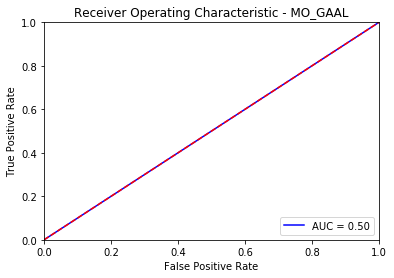

/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


MO_GAAL ROC:0.5, precision @ rank n:0.0
Duration:  1158.931908  seconds


#####################################################################
Epoch 1 of 60

Testing for epoch 1 index 1:


/home/andre/anaconda3/lib/python3.7/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'



Testing for epoch 1 index 2:

Testing for epoch 1 index 3:

Testing for epoch 1 index 4:

Testing for epoch 1 index 5:

Testing for epoch 1 index 6:

Testing for epoch 1 index 7:

Testing for epoch 1 index 8:

Testing for epoch 1 index 9:

Testing for epoch 1 index 10:

Testing for epoch 1 index 11:

Testing for epoch 1 index 12:

Testing for epoch 1 index 13:

Testing for epoch 1 index 14:

Testing for epoch 1 index 15:

Testing for epoch 1 index 16:

Testing for epoch 1 index 17:

Testing for epoch 1 index 18:

Testing for epoch 1 index 19:

Testing for epoch 1 index 20:

Testing for epoch 1 index 21:

Testing for epoch 1 index 22:

Testing for epoch 1 index 23:

Testing for epoch 1 index 24:

Testing for epoch 1 index 25:

Testing for epoch 1 index 26:

Testing for epoch 1 index 27:

Testing for epoch 1 index 28:

Testing for epoch 1 index 29:

Testing for epoch 1 index 30:

Testing for epoch 1 index 31:

Testing for epoch 1 index 32:

Testing for epoch 1 index 33:

Testing for epo


Testing for epoch 7 index 32:

Testing for epoch 7 index 33:

Testing for epoch 7 index 34:

Testing for epoch 7 index 35:

Testing for epoch 7 index 36:

Testing for epoch 7 index 37:

Testing for epoch 7 index 38:

Testing for epoch 7 index 39:
Epoch 8 of 60

Testing for epoch 8 index 1:

Testing for epoch 8 index 2:

Testing for epoch 8 index 3:

Testing for epoch 8 index 4:

Testing for epoch 8 index 5:

Testing for epoch 8 index 6:

Testing for epoch 8 index 7:

Testing for epoch 8 index 8:

Testing for epoch 8 index 9:

Testing for epoch 8 index 10:

Testing for epoch 8 index 11:

Testing for epoch 8 index 12:

Testing for epoch 8 index 13:

Testing for epoch 8 index 14:

Testing for epoch 8 index 15:

Testing for epoch 8 index 16:

Testing for epoch 8 index 17:

Testing for epoch 8 index 18:

Testing for epoch 8 index 19:

Testing for epoch 8 index 20:

Testing for epoch 8 index 21:

Testing for epoch 8 index 22:

Testing for epoch 8 index 23:

Testing for epoch 8 index 24:

Te


Testing for epoch 14 index 17:

Testing for epoch 14 index 18:

Testing for epoch 14 index 19:

Testing for epoch 14 index 20:

Testing for epoch 14 index 21:

Testing for epoch 14 index 22:

Testing for epoch 14 index 23:

Testing for epoch 14 index 24:

Testing for epoch 14 index 25:

Testing for epoch 14 index 26:

Testing for epoch 14 index 27:

Testing for epoch 14 index 28:

Testing for epoch 14 index 29:

Testing for epoch 14 index 30:

Testing for epoch 14 index 31:

Testing for epoch 14 index 32:

Testing for epoch 14 index 33:

Testing for epoch 14 index 34:

Testing for epoch 14 index 35:

Testing for epoch 14 index 36:

Testing for epoch 14 index 37:

Testing for epoch 14 index 38:

Testing for epoch 14 index 39:
Epoch 15 of 60

Testing for epoch 15 index 1:

Testing for epoch 15 index 2:

Testing for epoch 15 index 3:

Testing for epoch 15 index 4:

Testing for epoch 15 index 5:

Testing for epoch 15 index 6:

Testing for epoch 15 index 7:

Testing for epoch 15 index 8:




Testing for epoch 20 index 38:

Testing for epoch 20 index 39:
Epoch 21 of 60

Testing for epoch 21 index 1:

Testing for epoch 21 index 2:
500/500 [==============================] - 0s 82us/step

Testing for epoch 21 index 3:
500/500 [==============================] - 0s 37us/step

Testing for epoch 21 index 4:
500/500 [==============================] - 0s 42us/step

Testing for epoch 21 index 5:
500/500 [==============================] - 0s 37us/step

Testing for epoch 21 index 6:
500/500 [==============================] - 0s 31us/step

Testing for epoch 21 index 7:
500/500 [==============================] - 0s 37us/step

Testing for epoch 21 index 8:
500/500 [==============================] - 0s 36us/step

Testing for epoch 21 index 9:
500/500 [==============================] - 0s 34us/step

Testing for epoch 21 index 10:
500/500 [==============================] - 0s 32us/step

Testing for epoch 21 index 11:
500/500 [==============================] - 0s 30us/step

Testing for epoch

500/500 [==============================] - 0s 34us/step

Testing for epoch 21 index 16:
500/500 [==============================] - 0s 36us/step

Testing for epoch 21 index 17:
500/500 [==============================] - 0s 36us/step

Testing for epoch 21 index 18:
500/500 [==============================] - 0s 29us/step

Testing for epoch 21 index 19:
500/500 [==============================] - 0s 38us/step

Testing for epoch 21 index 20:
500/500 [==============================] - 0s 28us/step

Testing for epoch 21 index 21:
500/500 [==============================] - 0s 31us/step

Testing for epoch 21 index 22:
500/500 [==============================] - 0s 34us/step

Testing for epoch 21 index 23:
500/500 [==============================] - 0s 30us/step

Testing for epoch 21 index 24:
500/500 [==============================] - 0s 33us/step

Testing for epoch 21 index 25:
500/500 [==============================] - 0s 24us/step

Testing for epoch 21 index 26:
500/500 [=======================

500/500 [==============================] - 0s 31us/step

Testing for epoch 21 index 30:
500/500 [==============================] - 0s 40us/step

Testing for epoch 21 index 31:
500/500 [==============================] - 0s 43us/step

Testing for epoch 21 index 32:
500/500 [==============================] - 0s 27us/step

Testing for epoch 21 index 33:
500/500 [==============================] - 0s 34us/step

Testing for epoch 21 index 34:
500/500 [==============================] - 0s 31us/step

Testing for epoch 21 index 35:
500/500 [==============================] - 0s 33us/step

Testing for epoch 21 index 36:
500/500 [==============================] - 0s 27us/step

Testing for epoch 21 index 37:
500/500 [==============================] - 0s 27us/step

Testing for epoch 21 index 38:
500/500 [==============================] - 0s 41us/step

Testing for epoch 21 index 39:
500/500 [==============================] - 0s 35us/step
Epoch 22 of 60

Testing for epoch 22 index 1:
500/500 [=========

500/500 [==============================] - 0s 33us/step

Testing for epoch 22 index 5:
500/500 [==============================] - 0s 33us/step

Testing for epoch 22 index 6:
500/500 [==============================] - 0s 31us/step

Testing for epoch 22 index 7:
500/500 [==============================] - 0s 33us/step

Testing for epoch 22 index 8:
500/500 [==============================] - 0s 35us/step

Testing for epoch 22 index 9:
500/500 [==============================] - 0s 33us/step

Testing for epoch 22 index 10:
500/500 [==============================] - 0s 29us/step

Testing for epoch 22 index 11:
500/500 [==============================] - 0s 30us/step

Testing for epoch 22 index 12:
500/500 [==============================] - 0s 32us/step

Testing for epoch 22 index 13:
500/500 [==============================] - 0s 36us/step

Testing for epoch 22 index 14:
500/500 [==============================] - 0s 33us/step

Testing for epoch 22 index 15:
500/500 [============================

500/500 [==============================] - 0s 33us/step

Testing for epoch 22 index 19:
500/500 [==============================] - 0s 30us/step

Testing for epoch 22 index 20:
500/500 [==============================] - 0s 28us/step

Testing for epoch 22 index 21:
500/500 [==============================] - 0s 28us/step

Testing for epoch 22 index 22:
500/500 [==============================] - 0s 31us/step

Testing for epoch 22 index 23:
500/500 [==============================] - 0s 37us/step

Testing for epoch 22 index 24:
500/500 [==============================] - 0s 40us/step

Testing for epoch 22 index 25:
500/500 [==============================] - 0s 37us/step

Testing for epoch 22 index 26:
500/500 [==============================] - 0s 25us/step

Testing for epoch 22 index 27:
500/500 [==============================] - 0s 26us/step

Testing for epoch 22 index 28:
500/500 [==============================] - 0s 35us/step

Testing for epoch 22 index 29:
500/500 [=======================

500/500 [==============================] - 0s 33us/step

Testing for epoch 22 index 32:
500/500 [==============================] - 0s 36us/step

Testing for epoch 22 index 33:
500/500 [==============================] - 0s 45us/step

Testing for epoch 22 index 34:
500/500 [==============================] - 0s 36us/step

Testing for epoch 22 index 35:
500/500 [==============================] - 0s 35us/step

Testing for epoch 22 index 36:
500/500 [==============================] - 0s 30us/step

Testing for epoch 22 index 37:
500/500 [==============================] - 0s 30us/step

Testing for epoch 22 index 38:
500/500 [==============================] - 0s 36us/step

Testing for epoch 22 index 39:
500/500 [==============================] - 0s 39us/step
Epoch 23 of 60

Testing for epoch 23 index 1:
500/500 [==============================] - 0s 31us/step

Testing for epoch 23 index 2:
500/500 [==============================] - 0s 39us/step

Testing for epoch 23 index 3:
500/500 [===========

500/500 [==============================] - 0s 31us/step

Testing for epoch 23 index 7:
500/500 [==============================] - 0s 40us/step

Testing for epoch 23 index 8:
500/500 [==============================] - 0s 28us/step

Testing for epoch 23 index 9:
500/500 [==============================] - 0s 33us/step

Testing for epoch 23 index 10:
500/500 [==============================] - 0s 31us/step

Testing for epoch 23 index 11:
500/500 [==============================] - 0s 45us/step

Testing for epoch 23 index 12:
500/500 [==============================] - 0s 31us/step

Testing for epoch 23 index 13:
500/500 [==============================] - 0s 35us/step

Testing for epoch 23 index 14:
500/500 [==============================] - 0s 29us/step

Testing for epoch 23 index 15:
500/500 [==============================] - 0s 31us/step

Testing for epoch 23 index 16:
500/500 [==============================] - 0s 33us/step

Testing for epoch 23 index 17:
500/500 [==========================

500/500 [==============================] - 0s 42us/step

Testing for epoch 23 index 21:
500/500 [==============================] - 0s 30us/step

Testing for epoch 23 index 22:
500/500 [==============================] - 0s 34us/step

Testing for epoch 23 index 23:
500/500 [==============================] - 0s 29us/step

Testing for epoch 23 index 24:
500/500 [==============================] - 0s 40us/step

Testing for epoch 23 index 25:
500/500 [==============================] - 0s 33us/step

Testing for epoch 23 index 26:
500/500 [==============================] - 0s 27us/step

Testing for epoch 23 index 27:
500/500 [==============================] - 0s 37us/step

Testing for epoch 23 index 28:
500/500 [==============================] - 0s 38us/step

Testing for epoch 23 index 29:
500/500 [==============================] - 0s 39us/step

Testing for epoch 23 index 30:
500/500 [==============================] - 0s 30us/step

Testing for epoch 23 index 31:
500/500 [=======================

500/500 [==============================] - 0s 31us/step

Testing for epoch 23 index 35:
500/500 [==============================] - 0s 41us/step

Testing for epoch 23 index 36:
500/500 [==============================] - 0s 30us/step

Testing for epoch 23 index 37:
500/500 [==============================] - 0s 36us/step

Testing for epoch 23 index 38:
500/500 [==============================] - 0s 38us/step

Testing for epoch 23 index 39:
500/500 [==============================] - 0s 32us/step
Epoch 24 of 60

Testing for epoch 24 index 1:
500/500 [==============================] - 0s 35us/step

Testing for epoch 24 index 2:
500/500 [==============================] - 0s 30us/step

Testing for epoch 24 index 3:
500/500 [==============================] - 0s 31us/step

Testing for epoch 24 index 4:
500/500 [==============================] - 0s 34us/step

Testing for epoch 24 index 5:
500/500 [==============================] - 0s 40us/step

Testing for epoch 24 index 6:
500/500 [==============

500/500 [==============================] - 0s 37us/step

Testing for epoch 24 index 10:
500/500 [==============================] - 0s 30us/step

Testing for epoch 24 index 11:
500/500 [==============================] - 0s 36us/step

Testing for epoch 24 index 12:
500/500 [==============================] - 0s 35us/step

Testing for epoch 24 index 13:
500/500 [==============================] - 0s 40us/step

Testing for epoch 24 index 14:
500/500 [==============================] - 0s 37us/step

Testing for epoch 24 index 15:
500/500 [==============================] - 0s 32us/step

Testing for epoch 24 index 16:
500/500 [==============================] - 0s 30us/step

Testing for epoch 24 index 17:
500/500 [==============================] - 0s 29us/step

Testing for epoch 24 index 18:
500/500 [==============================] - 0s 36us/step

Testing for epoch 24 index 19:
500/500 [==============================] - 0s 34us/step

Testing for epoch 24 index 20:
500/500 [=======================

500/500 [==============================] - 0s 34us/step

Testing for epoch 24 index 23:
500/500 [==============================] - 0s 25us/step

Testing for epoch 24 index 24:
500/500 [==============================] - 0s 30us/step

Testing for epoch 24 index 25:
500/500 [==============================] - 0s 25us/step

Testing for epoch 24 index 26:
500/500 [==============================] - 0s 30us/step

Testing for epoch 24 index 27:
500/500 [==============================] - 0s 32us/step

Testing for epoch 24 index 28:
500/500 [==============================] - 0s 33us/step

Testing for epoch 24 index 29:
500/500 [==============================] - 0s 30us/step

Testing for epoch 24 index 30:
500/500 [==============================] - 0s 37us/step

Testing for epoch 24 index 31:
500/500 [==============================] - 0s 35us/step

Testing for epoch 24 index 32:
500/500 [==============================] - 0s 30us/step

Testing for epoch 24 index 33:
500/500 [=======================

500/500 [==============================] - 0s 30us/step

Testing for epoch 24 index 37:
500/500 [==============================] - 0s 33us/step

Testing for epoch 24 index 38:
500/500 [==============================] - 0s 30us/step

Testing for epoch 24 index 39:
500/500 [==============================] - 0s 32us/step
Epoch 25 of 60

Testing for epoch 25 index 1:
500/500 [==============================] - 0s 36us/step

Testing for epoch 25 index 2:
500/500 [==============================] - 0s 39us/step

Testing for epoch 25 index 3:
500/500 [==============================] - 0s 31us/step

Testing for epoch 25 index 4:
500/500 [==============================] - 0s 25us/step

Testing for epoch 25 index 5:
500/500 [==============================] - 0s 40us/step

Testing for epoch 25 index 6:
500/500 [==============================] - 0s 36us/step

Testing for epoch 25 index 7:
500/500 [==============================] - 0s 34us/step

Testing for epoch 25 index 8:
500/500 [================

500/500 [==============================] - 0s 30us/step

Testing for epoch 25 index 12:
500/500 [==============================] - 0s 30us/step

Testing for epoch 25 index 13:
500/500 [==============================] - 0s 41us/step

Testing for epoch 25 index 14:
500/500 [==============================] - 0s 31us/step

Testing for epoch 25 index 15:
500/500 [==============================] - 0s 28us/step

Testing for epoch 25 index 16:
500/500 [==============================] - 0s 37us/step

Testing for epoch 25 index 17:
500/500 [==============================] - 0s 61us/step

Testing for epoch 25 index 18:
500/500 [==============================] - 0s 39us/step

Testing for epoch 25 index 19:
500/500 [==============================] - 0s 36us/step

Testing for epoch 25 index 20:
500/500 [==============================] - 0s 33us/step

Testing for epoch 25 index 21:
500/500 [==============================] - 0s 26us/step

Testing for epoch 25 index 22:
500/500 [=======================

500/500 [==============================] - 0s 27us/step

Testing for epoch 25 index 26:
500/500 [==============================] - 0s 38us/step

Testing for epoch 25 index 27:
500/500 [==============================] - 0s 33us/step

Testing for epoch 25 index 28:
500/500 [==============================] - 0s 36us/step

Testing for epoch 25 index 29:
500/500 [==============================] - 0s 32us/step

Testing for epoch 25 index 30:
500/500 [==============================] - 0s 31us/step

Testing for epoch 25 index 31:
500/500 [==============================] - 0s 50us/step

Testing for epoch 25 index 32:
500/500 [==============================] - 0s 33us/step

Testing for epoch 25 index 33:
500/500 [==============================] - 0s 27us/step

Testing for epoch 25 index 34:
500/500 [==============================] - 0s 25us/step

Testing for epoch 25 index 35:
500/500 [==============================] - 0s 35us/step

Testing for epoch 25 index 36:
500/500 [=======================

500/500 [==============================] - 0s 40us/step
Epoch 26 of 60

Testing for epoch 26 index 1:
500/500 [==============================] - 0s 37us/step

Testing for epoch 26 index 2:
500/500 [==============================] - 0s 29us/step

Testing for epoch 26 index 3:
500/500 [==============================] - 0s 31us/step

Testing for epoch 26 index 4:
500/500 [==============================] - 0s 29us/step

Testing for epoch 26 index 5:
500/500 [==============================] - 0s 48us/step

Testing for epoch 26 index 6:
500/500 [==============================] - 0s 36us/step

Testing for epoch 26 index 7:
500/500 [==============================] - 0s 35us/step

Testing for epoch 26 index 8:
500/500 [==============================] - 0s 25us/step

Testing for epoch 26 index 9:
500/500 [==============================] - 0s 28us/step

Testing for epoch 26 index 10:
500/500 [==============================] - 0s 28us/step

Testing for epoch 26 index 11:
500/500 [=================

500/500 [==============================] - 0s 30us/step

Testing for epoch 26 index 14:
500/500 [==============================] - 0s 30us/step

Testing for epoch 26 index 15:
500/500 [==============================] - 0s 30us/step

Testing for epoch 26 index 16:
500/500 [==============================] - 0s 40us/step

Testing for epoch 26 index 17:
500/500 [==============================] - 0s 35us/step

Testing for epoch 26 index 18:
500/500 [==============================] - 0s 41us/step

Testing for epoch 26 index 19:
500/500 [==============================] - 0s 29us/step

Testing for epoch 26 index 20:
500/500 [==============================] - 0s 38us/step

Testing for epoch 26 index 21:
500/500 [==============================] - 0s 29us/step

Testing for epoch 26 index 22:
500/500 [==============================] - 0s 28us/step

Testing for epoch 26 index 23:
500/500 [==============================] - 0s 35us/step

Testing for epoch 26 index 24:
500/500 [=======================

500/500 [==============================] - 0s 29us/step

Testing for epoch 26 index 28:
500/500 [==============================] - 0s 32us/step

Testing for epoch 26 index 29:
500/500 [==============================] - 0s 39us/step

Testing for epoch 26 index 30:
500/500 [==============================] - 0s 24us/step

Testing for epoch 26 index 31:
500/500 [==============================] - 0s 38us/step

Testing for epoch 26 index 32:
500/500 [==============================] - 0s 33us/step

Testing for epoch 26 index 33:
500/500 [==============================] - 0s 35us/step

Testing for epoch 26 index 34:
500/500 [==============================] - 0s 28us/step

Testing for epoch 26 index 35:
500/500 [==============================] - 0s 44us/step

Testing for epoch 26 index 36:
500/500 [==============================] - 0s 29us/step

Testing for epoch 26 index 37:
500/500 [==============================] - 0s 29us/step

Testing for epoch 26 index 38:
500/500 [=======================

500/500 [==============================] - 0s 33us/step

Testing for epoch 27 index 3:
500/500 [==============================] - 0s 38us/step

Testing for epoch 27 index 4:
500/500 [==============================] - 0s 34us/step

Testing for epoch 27 index 5:
500/500 [==============================] - 0s 32us/step

Testing for epoch 27 index 6:
500/500 [==============================] - 0s 39us/step

Testing for epoch 27 index 7:
500/500 [==============================] - 0s 34us/step

Testing for epoch 27 index 8:
500/500 [==============================] - 0s 40us/step

Testing for epoch 27 index 9:
500/500 [==============================] - 0s 27us/step

Testing for epoch 27 index 10:
500/500 [==============================] - 0s 27us/step

Testing for epoch 27 index 11:
500/500 [==============================] - 0s 41us/step

Testing for epoch 27 index 12:
500/500 [==============================] - 0s 28us/step

Testing for epoch 27 index 13:
500/500 [==============================

500/500 [==============================] - 0s 35us/step

Testing for epoch 27 index 17:
500/500 [==============================] - 0s 37us/step

Testing for epoch 27 index 18:
500/500 [==============================] - 0s 29us/step

Testing for epoch 27 index 19:
500/500 [==============================] - 0s 30us/step

Testing for epoch 27 index 20:
500/500 [==============================] - 0s 36us/step

Testing for epoch 27 index 21:
500/500 [==============================] - 0s 36us/step

Testing for epoch 27 index 22:
500/500 [==============================] - 0s 34us/step

Testing for epoch 27 index 23:
500/500 [==============================] - 0s 28us/step

Testing for epoch 27 index 24:
500/500 [==============================] - 0s 41us/step

Testing for epoch 27 index 25:
500/500 [==============================] - 0s 24us/step

Testing for epoch 27 index 26:
500/500 [==============================] - 0s 26us/step

Testing for epoch 27 index 27:
500/500 [=======================

500/500 [==============================] - 0s 35us/step

Testing for epoch 27 index 31:
500/500 [==============================] - 0s 30us/step

Testing for epoch 27 index 32:
500/500 [==============================] - 0s 29us/step

Testing for epoch 27 index 33:
500/500 [==============================] - 0s 37us/step

Testing for epoch 27 index 34:
500/500 [==============================] - 0s 35us/step

Testing for epoch 27 index 35:
500/500 [==============================] - 0s 30us/step

Testing for epoch 27 index 36:
500/500 [==============================] - 0s 29us/step

Testing for epoch 27 index 37:
500/500 [==============================] - 0s 32us/step

Testing for epoch 27 index 38:
500/500 [==============================] - 0s 29us/step

Testing for epoch 27 index 39:
500/500 [==============================] - 0s 34us/step
Epoch 28 of 60

Testing for epoch 28 index 1:
500/500 [==============================] - 0s 30us/step

Testing for epoch 28 index 2:
500/500 [==========

500/500 [==============================] - 0s 29us/step

Testing for epoch 28 index 5:
500/500 [==============================] - 0s 27us/step

Testing for epoch 28 index 6:
500/500 [==============================] - 0s 36us/step

Testing for epoch 28 index 7:
500/500 [==============================] - 0s 32us/step

Testing for epoch 28 index 8:
500/500 [==============================] - 0s 33us/step

Testing for epoch 28 index 9:
500/500 [==============================] - 0s 35us/step

Testing for epoch 28 index 10:
500/500 [==============================] - 0s 31us/step

Testing for epoch 28 index 11:
500/500 [==============================] - 0s 35us/step

Testing for epoch 28 index 12:
500/500 [==============================] - 0s 34us/step

Testing for epoch 28 index 13:
500/500 [==============================] - 0s 38us/step

Testing for epoch 28 index 14:
500/500 [==============================] - 0s 31us/step

Testing for epoch 28 index 15:
500/500 [============================

500/500 [==============================] - 0s 34us/step

Testing for epoch 28 index 19:
500/500 [==============================] - 0s 31us/step

Testing for epoch 28 index 20:
500/500 [==============================] - 0s 29us/step

Testing for epoch 28 index 21:
500/500 [==============================] - 0s 26us/step

Testing for epoch 28 index 22:
500/500 [==============================] - 0s 32us/step

Testing for epoch 28 index 23:
500/500 [==============================] - 0s 33us/step

Testing for epoch 28 index 24:
500/500 [==============================] - 0s 32us/step

Testing for epoch 28 index 25:
500/500 [==============================] - 0s 44us/step

Testing for epoch 28 index 26:
500/500 [==============================] - 0s 39us/step

Testing for epoch 28 index 27:
500/500 [==============================] - 0s 34us/step

Testing for epoch 28 index 28:
500/500 [==============================] - 0s 36us/step

Testing for epoch 28 index 29:
500/500 [=======================

500/500 [==============================] - 0s 32us/step

Testing for epoch 28 index 33:
500/500 [==============================] - 0s 31us/step

Testing for epoch 28 index 34:
500/500 [==============================] - 0s 32us/step

Testing for epoch 28 index 35:
500/500 [==============================] - 0s 30us/step

Testing for epoch 28 index 36:
500/500 [==============================] - 0s 32us/step

Testing for epoch 28 index 37:
500/500 [==============================] - 0s 37us/step

Testing for epoch 28 index 38:
500/500 [==============================] - 0s 37us/step

Testing for epoch 28 index 39:
500/500 [==============================] - 0s 34us/step
Epoch 29 of 60

Testing for epoch 29 index 1:
500/500 [==============================] - 0s 31us/step

Testing for epoch 29 index 2:
500/500 [==============================] - 0s 47us/step

Testing for epoch 29 index 3:
500/500 [==============================] - 0s 33us/step

Testing for epoch 29 index 4:
500/500 [============

500/500 [==============================] - 0s 34us/step

Testing for epoch 29 index 8:
500/500 [==============================] - 0s 40us/step

Testing for epoch 29 index 9:
500/500 [==============================] - 0s 34us/step

Testing for epoch 29 index 10:
500/500 [==============================] - 0s 29us/step

Testing for epoch 29 index 11:
500/500 [==============================] - 0s 35us/step

Testing for epoch 29 index 12:
500/500 [==============================] - 0s 36us/step

Testing for epoch 29 index 13:
500/500 [==============================] - 0s 30us/step

Testing for epoch 29 index 14:
500/500 [==============================] - 0s 26us/step

Testing for epoch 29 index 15:
500/500 [==============================] - 0s 33us/step

Testing for epoch 29 index 16:
500/500 [==============================] - 0s 38us/step

Testing for epoch 29 index 17:
500/500 [==============================] - 0s 42us/step

Testing for epoch 29 index 18:
500/500 [=========================

500/500 [==============================] - 0s 36us/step

Testing for epoch 29 index 22:
500/500 [==============================] - 0s 30us/step

Testing for epoch 29 index 23:
500/500 [==============================] - 0s 33us/step

Testing for epoch 29 index 24:
500/500 [==============================] - 0s 32us/step

Testing for epoch 29 index 25:
500/500 [==============================] - 0s 28us/step

Testing for epoch 29 index 26:
500/500 [==============================] - 0s 38us/step

Testing for epoch 29 index 27:
500/500 [==============================] - 0s 37us/step

Testing for epoch 29 index 28:
500/500 [==============================] - 0s 31us/step

Testing for epoch 29 index 29:
500/500 [==============================] - 0s 32us/step

Testing for epoch 29 index 30:
500/500 [==============================] - 0s 32us/step

Testing for epoch 29 index 31:
500/500 [==============================] - 0s 33us/step

Testing for epoch 29 index 32:
500/500 [=======================

500/500 [==============================] - 0s 32us/step

Testing for epoch 29 index 35:
500/500 [==============================] - 0s 33us/step

Testing for epoch 29 index 36:
500/500 [==============================] - 0s 37us/step

Testing for epoch 29 index 37:
500/500 [==============================] - 0s 37us/step

Testing for epoch 29 index 38:
500/500 [==============================] - 0s 36us/step

Testing for epoch 29 index 39:
500/500 [==============================] - 0s 36us/step
Epoch 30 of 60

Testing for epoch 30 index 1:
500/500 [==============================] - 0s 48us/step

Testing for epoch 30 index 2:
500/500 [==============================] - 0s 32us/step

Testing for epoch 30 index 3:
500/500 [==============================] - 0s 32us/step

Testing for epoch 30 index 4:
500/500 [==============================] - 0s 30us/step

Testing for epoch 30 index 5:
500/500 [==============================] - 0s 38us/step

Testing for epoch 30 index 6:
500/500 [==============

500/500 [==============================] - 0s 25us/step

Testing for epoch 30 index 10:
500/500 [==============================] - 0s 28us/step

Testing for epoch 30 index 11:
500/500 [==============================] - 0s 28us/step

Testing for epoch 30 index 12:
500/500 [==============================] - 0s 36us/step

Testing for epoch 30 index 13:
500/500 [==============================] - 0s 35us/step

Testing for epoch 30 index 14:
500/500 [==============================] - 0s 46us/step

Testing for epoch 30 index 15:
500/500 [==============================] - 0s 30us/step

Testing for epoch 30 index 16:
500/500 [==============================] - 0s 27us/step

Testing for epoch 30 index 17:
500/500 [==============================] - 0s 34us/step

Testing for epoch 30 index 18:
500/500 [==============================] - 0s 29us/step

Testing for epoch 30 index 19:
500/500 [==============================] - 0s 38us/step

Testing for epoch 30 index 20:
500/500 [=======================

500/500 [==============================] - 0s 34us/step

Testing for epoch 30 index 24:
500/500 [==============================] - 0s 32us/step

Testing for epoch 30 index 25:
500/500 [==============================] - 0s 36us/step

Testing for epoch 30 index 26:
500/500 [==============================] - 0s 33us/step

Testing for epoch 30 index 27:
500/500 [==============================] - 0s 39us/step

Testing for epoch 30 index 28:
500/500 [==============================] - 0s 48us/step

Testing for epoch 30 index 29:
500/500 [==============================] - 0s 34us/step

Testing for epoch 30 index 30:
500/500 [==============================] - 0s 36us/step

Testing for epoch 30 index 31:
500/500 [==============================] - 0s 42us/step

Testing for epoch 30 index 32:
500/500 [==============================] - 0s 31us/step

Testing for epoch 30 index 33:
500/500 [==============================] - 0s 26us/step

Testing for epoch 30 index 34:
500/500 [=======================

500/500 [==============================] - 0s 35us/step

Testing for epoch 30 index 38:
500/500 [==============================] - 0s 30us/step

Testing for epoch 30 index 39:
500/500 [==============================] - 0s 35us/step
Epoch 31 of 60

Testing for epoch 31 index 1:
500/500 [==============================] - 0s 26us/step

Testing for epoch 31 index 2:
500/500 [==============================] - 0s 32us/step

Testing for epoch 31 index 3:
500/500 [==============================] - 0s 38us/step

Testing for epoch 31 index 4:
500/500 [==============================] - 0s 37us/step

Testing for epoch 31 index 5:
500/500 [==============================] - 0s 33us/step

Testing for epoch 31 index 6:
500/500 [==============================] - 0s 35us/step

Testing for epoch 31 index 7:
500/500 [==============================] - 0s 34us/step

Testing for epoch 31 index 8:
500/500 [==============================] - 0s 30us/step

Testing for epoch 31 index 9:
500/500 [=================

500/500 [==============================] - 0s 36us/step

Testing for epoch 31 index 13:
500/500 [==============================] - 0s 44us/step

Testing for epoch 31 index 14:
500/500 [==============================] - 0s 36us/step

Testing for epoch 31 index 15:
500/500 [==============================] - 0s 31us/step

Testing for epoch 31 index 16:
500/500 [==============================] - 0s 36us/step

Testing for epoch 31 index 17:
500/500 [==============================] - 0s 41us/step

Testing for epoch 31 index 18:
500/500 [==============================] - 0s 29us/step

Testing for epoch 31 index 19:
500/500 [==============================] - 0s 28us/step

Testing for epoch 31 index 20:
500/500 [==============================] - 0s 28us/step

Testing for epoch 31 index 21:
500/500 [==============================] - 0s 28us/step

Testing for epoch 31 index 22:
500/500 [==============================] - 0s 37us/step

Testing for epoch 31 index 23:
500/500 [=======================

500/500 [==============================] - 0s 30us/step

Testing for epoch 31 index 26:
500/500 [==============================] - 0s 35us/step

Testing for epoch 31 index 27:
500/500 [==============================] - 0s 25us/step

Testing for epoch 31 index 28:
500/500 [==============================] - 0s 41us/step

Testing for epoch 31 index 29:
500/500 [==============================] - 0s 30us/step

Testing for epoch 31 index 30:
500/500 [==============================] - 0s 31us/step

Testing for epoch 31 index 31:
500/500 [==============================] - 0s 37us/step

Testing for epoch 31 index 32:
500/500 [==============================] - 0s 30us/step

Testing for epoch 31 index 33:
500/500 [==============================] - 0s 25us/step

Testing for epoch 31 index 34:
500/500 [==============================] - 0s 36us/step

Testing for epoch 31 index 35:
500/500 [==============================] - 0s 38us/step

Testing for epoch 31 index 36:
500/500 [=======================

500/500 [==============================] - 0s 43us/step
Epoch 32 of 60

Testing for epoch 32 index 1:
500/500 [==============================] - 0s 42us/step

Testing for epoch 32 index 2:
500/500 [==============================] - 0s 34us/step

Testing for epoch 32 index 3:
500/500 [==============================] - 0s 36us/step

Testing for epoch 32 index 4:
500/500 [==============================] - 0s 40us/step

Testing for epoch 32 index 5:
500/500 [==============================] - 0s 44us/step

Testing for epoch 32 index 6:
500/500 [==============================] - 0s 34us/step

Testing for epoch 32 index 7:
500/500 [==============================] - 0s 34us/step

Testing for epoch 32 index 8:
500/500 [==============================] - 0s 30us/step

Testing for epoch 32 index 9:
500/500 [==============================] - 0s 29us/step

Testing for epoch 32 index 10:
500/500 [==============================] - 0s 32us/step

Testing for epoch 32 index 11:
500/500 [=================

500/500 [==============================] - 0s 33us/step

Testing for epoch 32 index 15:
500/500 [==============================] - 0s 41us/step

Testing for epoch 32 index 16:
500/500 [==============================] - 0s 29us/step

Testing for epoch 32 index 17:
500/500 [==============================] - 0s 36us/step

Testing for epoch 32 index 18:
500/500 [==============================] - 0s 29us/step

Testing for epoch 32 index 19:
500/500 [==============================] - 0s 36us/step

Testing for epoch 32 index 20:
500/500 [==============================] - 0s 30us/step

Testing for epoch 32 index 21:
500/500 [==============================] - 0s 32us/step

Testing for epoch 32 index 22:
500/500 [==============================] - 0s 26us/step

Testing for epoch 32 index 23:
500/500 [==============================] - 0s 34us/step

Testing for epoch 32 index 24:
500/500 [==============================] - 0s 34us/step

Testing for epoch 32 index 25:
500/500 [=======================

500/500 [==============================] - 0s 39us/step

Testing for epoch 32 index 29:
500/500 [==============================] - 0s 39us/step

Testing for epoch 32 index 30:
500/500 [==============================] - 0s 34us/step

Testing for epoch 32 index 31:
500/500 [==============================] - 0s 37us/step

Testing for epoch 32 index 32:
500/500 [==============================] - 0s 34us/step

Testing for epoch 32 index 33:
500/500 [==============================] - 0s 39us/step

Testing for epoch 32 index 34:
500/500 [==============================] - 0s 31us/step

Testing for epoch 32 index 35:
500/500 [==============================] - 0s 38us/step

Testing for epoch 32 index 36:
500/500 [==============================] - 0s 44us/step

Testing for epoch 32 index 37:
500/500 [==============================] - 0s 34us/step

Testing for epoch 32 index 38:
500/500 [==============================] - 0s 35us/step

Testing for epoch 32 index 39:
500/500 [=======================

500/500 [==============================] - 0s 38us/step

Testing for epoch 33 index 4:
500/500 [==============================] - 0s 38us/step

Testing for epoch 33 index 5:
500/500 [==============================] - 0s 32us/step

Testing for epoch 33 index 6:
500/500 [==============================] - 0s 43us/step

Testing for epoch 33 index 7:
500/500 [==============================] - 0s 38us/step

Testing for epoch 33 index 8:
500/500 [==============================] - 0s 30us/step

Testing for epoch 33 index 9:
500/500 [==============================] - 0s 31us/step

Testing for epoch 33 index 10:
500/500 [==============================] - 0s 30us/step

Testing for epoch 33 index 11:
500/500 [==============================] - 0s 49us/step

Testing for epoch 33 index 12:
500/500 [==============================] - 0s 28us/step

Testing for epoch 33 index 13:
500/500 [==============================] - 0s 37us/step

Testing for epoch 33 index 14:
500/500 [=============================

500/500 [==============================] - 0s 27us/step

Testing for epoch 33 index 17:
500/500 [==============================] - 0s 35us/step

Testing for epoch 33 index 18:
500/500 [==============================] - 0s 30us/step

Testing for epoch 33 index 19:
500/500 [==============================] - 0s 37us/step

Testing for epoch 33 index 20:
500/500 [==============================] - 0s 36us/step

Testing for epoch 33 index 21:
500/500 [==============================] - 0s 31us/step

Testing for epoch 33 index 22:
500/500 [==============================] - 0s 43us/step

Testing for epoch 33 index 23:
500/500 [==============================] - 0s 33us/step

Testing for epoch 33 index 24:
500/500 [==============================] - 0s 40us/step

Testing for epoch 33 index 25:
500/500 [==============================] - 0s 29us/step

Testing for epoch 33 index 26:
500/500 [==============================] - 0s 30us/step

Testing for epoch 33 index 27:
500/500 [=======================

500/500 [==============================] - 0s 38us/step

Testing for epoch 33 index 31:
500/500 [==============================] - 0s 34us/step

Testing for epoch 33 index 32:
500/500 [==============================] - 0s 33us/step

Testing for epoch 33 index 33:
500/500 [==============================] - 0s 34us/step

Testing for epoch 33 index 34:
500/500 [==============================] - 0s 41us/step

Testing for epoch 33 index 35:
500/500 [==============================] - 0s 30us/step

Testing for epoch 33 index 36:
500/500 [==============================] - 0s 38us/step

Testing for epoch 33 index 37:
500/500 [==============================] - 0s 32us/step

Testing for epoch 33 index 38:
500/500 [==============================] - 0s 50us/step

Testing for epoch 33 index 39:
500/500 [==============================] - 0s 39us/step
Epoch 34 of 60

Testing for epoch 34 index 1:
500/500 [==============================] - 0s 28us/step

Testing for epoch 34 index 2:
500/500 [==========

500/500 [==============================] - 0s 33us/step

Testing for epoch 34 index 6:
500/500 [==============================] - 0s 30us/step

Testing for epoch 34 index 7:
500/500 [==============================] - 0s 39us/step

Testing for epoch 34 index 8:
500/500 [==============================] - 0s 35us/step

Testing for epoch 34 index 9:
500/500 [==============================] - 0s 42us/step

Testing for epoch 34 index 10:
500/500 [==============================] - 0s 30us/step

Testing for epoch 34 index 11:
500/500 [==============================] - 0s 33us/step

Testing for epoch 34 index 12:
500/500 [==============================] - 0s 33us/step

Testing for epoch 34 index 13:
500/500 [==============================] - 0s 31us/step

Testing for epoch 34 index 14:
500/500 [==============================] - 0s 28us/step

Testing for epoch 34 index 15:
500/500 [==============================] - 0s 34us/step

Testing for epoch 34 index 16:
500/500 [===========================

500/500 [==============================] - 0s 32us/step

Testing for epoch 34 index 20:
500/500 [==============================] - 0s 43us/step

Testing for epoch 34 index 21:
500/500 [==============================] - 0s 36us/step

Testing for epoch 34 index 22:
500/500 [==============================] - 0s 31us/step

Testing for epoch 34 index 23:
500/500 [==============================] - 0s 35us/step

Testing for epoch 34 index 24:
500/500 [==============================] - 0s 34us/step

Testing for epoch 34 index 25:
500/500 [==============================] - 0s 33us/step

Testing for epoch 34 index 26:
500/500 [==============================] - 0s 31us/step

Testing for epoch 34 index 27:
500/500 [==============================] - 0s 24us/step

Testing for epoch 34 index 28:
500/500 [==============================] - 0s 44us/step

Testing for epoch 34 index 29:
500/500 [==============================] - 0s 34us/step

Testing for epoch 34 index 30:
500/500 [=======================

500/500 [==============================] - 0s 32us/step

Testing for epoch 34 index 34:
500/500 [==============================] - 0s 36us/step

Testing for epoch 34 index 35:
500/500 [==============================] - 0s 34us/step

Testing for epoch 34 index 36:
500/500 [==============================] - 0s 34us/step

Testing for epoch 34 index 37:
500/500 [==============================] - 0s 27us/step

Testing for epoch 34 index 38:
500/500 [==============================] - 0s 37us/step

Testing for epoch 34 index 39:
500/500 [==============================] - 0s 31us/step
Epoch 35 of 60

Testing for epoch 35 index 1:
500/500 [==============================] - 0s 38us/step

Testing for epoch 35 index 2:
500/500 [==============================] - 0s 30us/step

Testing for epoch 35 index 3:
500/500 [==============================] - 0s 35us/step

Testing for epoch 35 index 4:
500/500 [==============================] - 0s 28us/step

Testing for epoch 35 index 5:
500/500 [=============

500/500 [==============================] - 0s 35us/step

Testing for epoch 35 index 8:
500/500 [==============================] - 0s 31us/step

Testing for epoch 35 index 9:
500/500 [==============================] - 0s 31us/step

Testing for epoch 35 index 10:
500/500 [==============================] - 0s 36us/step

Testing for epoch 35 index 11:
500/500 [==============================] - 0s 27us/step

Testing for epoch 35 index 12:
500/500 [==============================] - 0s 38us/step

Testing for epoch 35 index 13:
500/500 [==============================] - 0s 31us/step

Testing for epoch 35 index 14:
500/500 [==============================] - 0s 33us/step

Testing for epoch 35 index 15:
500/500 [==============================] - 0s 31us/step

Testing for epoch 35 index 16:
500/500 [==============================] - 0s 29us/step

Testing for epoch 35 index 17:
500/500 [==============================] - 0s 29us/step

Testing for epoch 35 index 18:
500/500 [=========================

500/500 [==============================] - 0s 26us/step

Testing for epoch 35 index 22:
500/500 [==============================] - 0s 30us/step

Testing for epoch 35 index 23:
500/500 [==============================] - 0s 44us/step

Testing for epoch 35 index 24:
500/500 [==============================] - 0s 30us/step

Testing for epoch 35 index 25:
500/500 [==============================] - 0s 26us/step

Testing for epoch 35 index 26:
500/500 [==============================] - 0s 40us/step

Testing for epoch 35 index 27:
500/500 [==============================] - 0s 39us/step

Testing for epoch 35 index 28:
500/500 [==============================] - 0s 32us/step

Testing for epoch 35 index 29:
500/500 [==============================] - 0s 31us/step

Testing for epoch 35 index 30:
500/500 [==============================] - 0s 35us/step

Testing for epoch 35 index 31:
500/500 [==============================] - 0s 38us/step

Testing for epoch 35 index 32:
500/500 [=======================

500/500 [==============================] - 0s 33us/step

Testing for epoch 35 index 36:
500/500 [==============================] - 0s 27us/step

Testing for epoch 35 index 37:
500/500 [==============================] - 0s 41us/step

Testing for epoch 35 index 38:
500/500 [==============================] - 0s 32us/step

Testing for epoch 35 index 39:
500/500 [==============================] - 0s 24us/step
Epoch 36 of 60

Testing for epoch 36 index 1:
500/500 [==============================] - 0s 40us/step

Testing for epoch 36 index 2:
500/500 [==============================] - 0s 31us/step

Testing for epoch 36 index 3:
500/500 [==============================] - 0s 43us/step

Testing for epoch 36 index 4:
500/500 [==============================] - 0s 43us/step

Testing for epoch 36 index 5:
500/500 [==============================] - 0s 41us/step

Testing for epoch 36 index 6:
500/500 [==============================] - 0s 29us/step

Testing for epoch 36 index 7:
500/500 [===============

500/500 [==============================] - 0s 33us/step

Testing for epoch 36 index 11:
500/500 [==============================] - 0s 25us/step

Testing for epoch 36 index 12:
500/500 [==============================] - 0s 37us/step

Testing for epoch 36 index 13:
500/500 [==============================] - 0s 32us/step

Testing for epoch 36 index 14:
500/500 [==============================] - 0s 33us/step

Testing for epoch 36 index 15:
500/500 [==============================] - 0s 35us/step

Testing for epoch 36 index 16:
500/500 [==============================] - 0s 41us/step

Testing for epoch 36 index 17:
500/500 [==============================] - 0s 44us/step

Testing for epoch 36 index 18:
500/500 [==============================] - 0s 30us/step

Testing for epoch 36 index 19:
500/500 [==============================] - 0s 31us/step

Testing for epoch 36 index 20:
500/500 [==============================] - 0s 31us/step

Testing for epoch 36 index 21:
500/500 [=======================

500/500 [==============================] - 0s 27us/step

Testing for epoch 36 index 25:
500/500 [==============================] - 0s 44us/step

Testing for epoch 36 index 26:
500/500 [==============================] - 0s 31us/step

Testing for epoch 36 index 27:
500/500 [==============================] - 0s 40us/step

Testing for epoch 36 index 28:
500/500 [==============================] - 0s 50us/step

Testing for epoch 36 index 29:
500/500 [==============================] - 0s 31us/step

Testing for epoch 36 index 30:
500/500 [==============================] - 0s 37us/step

Testing for epoch 36 index 31:
500/500 [==============================] - 0s 37us/step

Testing for epoch 36 index 32:
500/500 [==============================] - 0s 28us/step

Testing for epoch 36 index 33:
500/500 [==============================] - 0s 35us/step

Testing for epoch 36 index 34:
500/500 [==============================] - 0s 39us/step

Testing for epoch 36 index 35:
500/500 [=======================

500/500 [==============================] - 0s 38us/step

Testing for epoch 36 index 38:
500/500 [==============================] - 0s 35us/step

Testing for epoch 36 index 39:
500/500 [==============================] - 0s 35us/step
Epoch 37 of 60

Testing for epoch 37 index 1:
500/500 [==============================] - 0s 38us/step

Testing for epoch 37 index 2:
500/500 [==============================] - 0s 32us/step

Testing for epoch 37 index 3:
500/500 [==============================] - 0s 37us/step

Testing for epoch 37 index 4:
500/500 [==============================] - 0s 44us/step

Testing for epoch 37 index 5:
500/500 [==============================] - 0s 48us/step

Testing for epoch 37 index 6:
500/500 [==============================] - 0s 46us/step

Testing for epoch 37 index 7:
500/500 [==============================] - 0s 28us/step

Testing for epoch 37 index 8:
500/500 [==============================] - 0s 31us/step

Testing for epoch 37 index 9:
500/500 [=================

500/500 [==============================] - 0s 33us/step

Testing for epoch 37 index 13:
500/500 [==============================] - 0s 30us/step

Testing for epoch 37 index 14:
500/500 [==============================] - 0s 29us/step

Testing for epoch 37 index 15:
500/500 [==============================] - 0s 33us/step

Testing for epoch 37 index 16:
500/500 [==============================] - 0s 41us/step

Testing for epoch 37 index 17:
500/500 [==============================] - 0s 29us/step

Testing for epoch 37 index 18:
500/500 [==============================] - 0s 27us/step

Testing for epoch 37 index 19:
500/500 [==============================] - 0s 38us/step

Testing for epoch 37 index 20:
500/500 [==============================] - 0s 36us/step

Testing for epoch 37 index 21:
500/500 [==============================] - 0s 27us/step

Testing for epoch 37 index 22:
500/500 [==============================] - 0s 26us/step

Testing for epoch 37 index 23:
500/500 [=======================

500/500 [==============================] - 0s 32us/step

Testing for epoch 37 index 27:
500/500 [==============================] - 0s 31us/step

Testing for epoch 37 index 28:
500/500 [==============================] - 0s 46us/step

Testing for epoch 37 index 29:
500/500 [==============================] - 0s 34us/step

Testing for epoch 37 index 30:
500/500 [==============================] - 0s 30us/step

Testing for epoch 37 index 31:
500/500 [==============================] - 0s 36us/step

Testing for epoch 37 index 32:
500/500 [==============================] - 0s 30us/step

Testing for epoch 37 index 33:
500/500 [==============================] - 0s 31us/step

Testing for epoch 37 index 34:
500/500 [==============================] - 0s 36us/step

Testing for epoch 37 index 35:
500/500 [==============================] - 0s 32us/step

Testing for epoch 37 index 36:
500/500 [==============================] - 0s 41us/step

Testing for epoch 37 index 37:
500/500 [=======================

500/500 [==============================] - 0s 32us/step

Testing for epoch 38 index 2:
500/500 [==============================] - 0s 31us/step

Testing for epoch 38 index 3:
500/500 [==============================] - 0s 32us/step

Testing for epoch 38 index 4:
500/500 [==============================] - 0s 34us/step

Testing for epoch 38 index 5:
500/500 [==============================] - 0s 29us/step

Testing for epoch 38 index 6:
500/500 [==============================] - 0s 32us/step

Testing for epoch 38 index 7:
500/500 [==============================] - 0s 37us/step

Testing for epoch 38 index 8:
500/500 [==============================] - 0s 32us/step

Testing for epoch 38 index 9:
500/500 [==============================] - 0s 32us/step

Testing for epoch 38 index 10:
500/500 [==============================] - 0s 36us/step

Testing for epoch 38 index 11:
500/500 [==============================] - 0s 31us/step

Testing for epoch 38 index 12:
500/500 [==============================]

500/500 [==============================] - 0s 26us/step

Testing for epoch 38 index 16:
500/500 [==============================] - 0s 45us/step

Testing for epoch 38 index 17:
500/500 [==============================] - 0s 32us/step

Testing for epoch 38 index 18:
500/500 [==============================] - 0s 26us/step

Testing for epoch 38 index 19:
500/500 [==============================] - 0s 37us/step

Testing for epoch 38 index 20:
500/500 [==============================] - 0s 34us/step

Testing for epoch 38 index 21:
500/500 [==============================] - 0s 32us/step

Testing for epoch 38 index 22:
500/500 [==============================] - 0s 35us/step

Testing for epoch 38 index 23:
500/500 [==============================] - 0s 30us/step

Testing for epoch 38 index 24:
500/500 [==============================] - 0s 38us/step

Testing for epoch 38 index 25:
500/500 [==============================] - 0s 30us/step

Testing for epoch 38 index 26:
500/500 [=======================

500/500 [==============================] - 0s 27us/step

Testing for epoch 38 index 29:
500/500 [==============================] - 0s 29us/step

Testing for epoch 38 index 30:
500/500 [==============================] - 0s 29us/step

Testing for epoch 38 index 31:
500/500 [==============================] - 0s 35us/step

Testing for epoch 38 index 32:
500/500 [==============================] - 0s 41us/step

Testing for epoch 38 index 33:
500/500 [==============================] - 0s 31us/step

Testing for epoch 38 index 34:
500/500 [==============================] - 0s 26us/step

Testing for epoch 38 index 35:
500/500 [==============================] - 0s 30us/step

Testing for epoch 38 index 36:
500/500 [==============================] - 0s 30us/step

Testing for epoch 38 index 37:
500/500 [==============================] - 0s 38us/step

Testing for epoch 38 index 38:
500/500 [==============================] - 0s 42us/step

Testing for epoch 38 index 39:
500/500 [=======================

500/500 [==============================] - 0s 27us/step

Testing for epoch 39 index 4:
500/500 [==============================] - 0s 33us/step

Testing for epoch 39 index 5:
500/500 [==============================] - 0s 28us/step

Testing for epoch 39 index 6:
500/500 [==============================] - 0s 38us/step

Testing for epoch 39 index 7:
500/500 [==============================] - 0s 25us/step

Testing for epoch 39 index 8:
500/500 [==============================] - 0s 33us/step

Testing for epoch 39 index 9:
500/500 [==============================] - 0s 37us/step

Testing for epoch 39 index 10:
500/500 [==============================] - 0s 31us/step

Testing for epoch 39 index 11:
500/500 [==============================] - 0s 38us/step

Testing for epoch 39 index 12:
500/500 [==============================] - 0s 39us/step

Testing for epoch 39 index 13:
500/500 [==============================] - 0s 29us/step

Testing for epoch 39 index 14:
500/500 [=============================

500/500 [==============================] - 0s 34us/step

Testing for epoch 39 index 18:
500/500 [==============================] - 0s 41us/step

Testing for epoch 39 index 19:
500/500 [==============================] - 0s 29us/step

Testing for epoch 39 index 20:
500/500 [==============================] - 0s 32us/step

Testing for epoch 39 index 21:
500/500 [==============================] - 0s 35us/step

Testing for epoch 39 index 22:
500/500 [==============================] - 0s 29us/step

Testing for epoch 39 index 23:
500/500 [==============================] - 0s 43us/step

Testing for epoch 39 index 24:
500/500 [==============================] - 0s 31us/step

Testing for epoch 39 index 25:
500/500 [==============================] - 0s 41us/step

Testing for epoch 39 index 26:
500/500 [==============================] - 0s 45us/step

Testing for epoch 39 index 27:
500/500 [==============================] - 0s 27us/step

Testing for epoch 39 index 28:
500/500 [=======================

500/500 [==============================] - 0s 31us/step

Testing for epoch 39 index 32:
500/500 [==============================] - 0s 32us/step

Testing for epoch 39 index 33:
500/500 [==============================] - 0s 30us/step

Testing for epoch 39 index 34:
500/500 [==============================] - 0s 28us/step

Testing for epoch 39 index 35:
500/500 [==============================] - 0s 30us/step

Testing for epoch 39 index 36:
500/500 [==============================] - 0s 30us/step

Testing for epoch 39 index 37:
500/500 [==============================] - 0s 43us/step

Testing for epoch 39 index 38:
500/500 [==============================] - 0s 28us/step

Testing for epoch 39 index 39:
500/500 [==============================] - 0s 30us/step
Epoch 40 of 60

Testing for epoch 40 index 1:
500/500 [==============================] - 0s 37us/step

Testing for epoch 40 index 2:
500/500 [==============================] - 0s 51us/step

Testing for epoch 40 index 3:
500/500 [===========

500/500 [==============================] - 0s 30us/step

Testing for epoch 40 index 7:
500/500 [==============================] - 0s 26us/step

Testing for epoch 40 index 8:
500/500 [==============================] - 0s 31us/step

Testing for epoch 40 index 9:
500/500 [==============================] - 0s 29us/step

Testing for epoch 40 index 10:
500/500 [==============================] - 0s 38us/step

Testing for epoch 40 index 11:
500/500 [==============================] - 0s 27us/step

Testing for epoch 40 index 12:
500/500 [==============================] - 0s 31us/step

Testing for epoch 40 index 13:
500/500 [==============================] - 0s 31us/step

Testing for epoch 40 index 14:
500/500 [==============================] - 0s 40us/step

Testing for epoch 40 index 15:
500/500 [==============================] - 0s 27us/step

Testing for epoch 40 index 16:
500/500 [==============================] - 0s 32us/step

Testing for epoch 40 index 17:
500/500 [==========================


Testing for epoch 40 index 20:
500/500 [==============================] - 0s 32us/step

Testing for epoch 40 index 21:
500/500 [==============================] - 0s 31us/step

Testing for epoch 40 index 22:
500/500 [==============================] - 0s 34us/step

Testing for epoch 40 index 23:
500/500 [==============================] - 0s 30us/step

Testing for epoch 40 index 24:
500/500 [==============================] - 0s 34us/step

Testing for epoch 40 index 25:
500/500 [==============================] - 0s 29us/step

Testing for epoch 40 index 26:
500/500 [==============================] - 0s 32us/step

Testing for epoch 40 index 27:
500/500 [==============================] - 0s 56us/step

Testing for epoch 40 index 28:
500/500 [==============================] - 0s 31us/step

Testing for epoch 40 index 29:
500/500 [==============================] - 0s 28us/step

Testing for epoch 40 index 30:
500/500 [==============================] - 0s 40us/step

Testing for epoch 40 index 31:


500/500 [==============================] - 0s 36us/step

Testing for epoch 40 index 34:
500/500 [==============================] - 0s 35us/step

Testing for epoch 40 index 35:
500/500 [==============================] - 0s 36us/step

Testing for epoch 40 index 36:
500/500 [==============================] - 0s 30us/step

Testing for epoch 40 index 37:
500/500 [==============================] - 0s 33us/step

Testing for epoch 40 index 38:
500/500 [==============================] - 0s 37us/step

Testing for epoch 40 index 39:
500/500 [==============================] - 0s 40us/step
Epoch 41 of 60

Testing for epoch 41 index 1:
500/500 [==============================] - 0s 33us/step

Testing for epoch 41 index 2:
500/500 [==============================] - 0s 31us/step

Testing for epoch 41 index 3:
500/500 [==============================] - 0s 34us/step

Testing for epoch 41 index 4:
500/500 [==============================] - 0s 26us/step

Testing for epoch 41 index 5:
500/500 [=============

500/500 [==============================] - 0s 30us/step

Testing for epoch 41 index 9:
500/500 [==============================] - 0s 31us/step

Testing for epoch 41 index 10:
500/500 [==============================] - 0s 35us/step

Testing for epoch 41 index 11:
500/500 [==============================] - 0s 35us/step

Testing for epoch 41 index 12:
500/500 [==============================] - 0s 34us/step

Testing for epoch 41 index 13:
500/500 [==============================] - 0s 34us/step

Testing for epoch 41 index 14:
500/500 [==============================] - 0s 31us/step

Testing for epoch 41 index 15:
500/500 [==============================] - 0s 30us/step

Testing for epoch 41 index 16:
500/500 [==============================] - 0s 42us/step

Testing for epoch 41 index 17:
500/500 [==============================] - 0s 41us/step

Testing for epoch 41 index 18:
500/500 [==============================] - 0s 29us/step

Testing for epoch 41 index 19:
500/500 [========================

500/500 [==============================] - 0s 31us/step

Testing for epoch 41 index 23:
500/500 [==============================] - 0s 28us/step

Testing for epoch 41 index 24:
500/500 [==============================] - 0s 30us/step

Testing for epoch 41 index 25:
500/500 [==============================] - 0s 24us/step

Testing for epoch 41 index 26:
500/500 [==============================] - 0s 25us/step

Testing for epoch 41 index 27:
500/500 [==============================] - 0s 45us/step

Testing for epoch 41 index 28:
500/500 [==============================] - 0s 34us/step

Testing for epoch 41 index 29:
500/500 [==============================] - 0s 34us/step

Testing for epoch 41 index 30:
500/500 [==============================] - 0s 28us/step

Testing for epoch 41 index 31:
500/500 [==============================] - 0s 27us/step

Testing for epoch 41 index 32:
500/500 [==============================] - 0s 36us/step

Testing for epoch 41 index 33:
500/500 [=======================

500/500 [==============================] - 0s 33us/step

Testing for epoch 41 index 37:
500/500 [==============================] - 0s 36us/step

Testing for epoch 41 index 38:
500/500 [==============================] - 0s 27us/step

Testing for epoch 41 index 39:
500/500 [==============================] - 0s 28us/step
Epoch 42 of 60

Testing for epoch 42 index 1:
500/500 [==============================] - 0s 32us/step

Testing for epoch 42 index 2:
500/500 [==============================] - 0s 32us/step

Testing for epoch 42 index 3:
500/500 [==============================] - 0s 40us/step

Testing for epoch 42 index 4:
500/500 [==============================] - 0s 35us/step

Testing for epoch 42 index 5:
500/500 [==============================] - 0s 43us/step

Testing for epoch 42 index 6:
500/500 [==============================] - 0s 42us/step

Testing for epoch 42 index 7:
500/500 [==============================] - 0s 42us/step

Testing for epoch 42 index 8:
500/500 [================

500/500 [==============================] - 0s 32us/step

Testing for epoch 42 index 12:
500/500 [==============================] - 0s 29us/step

Testing for epoch 42 index 13:
500/500 [==============================] - 0s 34us/step

Testing for epoch 42 index 14:
500/500 [==============================] - 0s 27us/step

Testing for epoch 42 index 15:
500/500 [==============================] - 0s 27us/step

Testing for epoch 42 index 16:
500/500 [==============================] - 0s 25us/step

Testing for epoch 42 index 17:
500/500 [==============================] - 0s 34us/step

Testing for epoch 42 index 18:
500/500 [==============================] - 0s 32us/step

Testing for epoch 42 index 19:
500/500 [==============================] - 0s 31us/step

Testing for epoch 42 index 20:
500/500 [==============================] - 0s 38us/step

Testing for epoch 42 index 21:
500/500 [==============================] - 0s 35us/step

Testing for epoch 42 index 22:
500/500 [=======================

500/500 [==============================] - 0s 34us/step

Testing for epoch 42 index 25:
500/500 [==============================] - 0s 28us/step

Testing for epoch 42 index 26:
500/500 [==============================] - 0s 30us/step

Testing for epoch 42 index 27:
500/500 [==============================] - 0s 27us/step

Testing for epoch 42 index 28:
500/500 [==============================] - 0s 34us/step

Testing for epoch 42 index 29:
500/500 [==============================] - 0s 43us/step

Testing for epoch 42 index 30:
500/500 [==============================] - 0s 29us/step

Testing for epoch 42 index 31:
500/500 [==============================] - 0s 35us/step

Testing for epoch 42 index 32:
500/500 [==============================] - 0s 38us/step

Testing for epoch 42 index 33:
500/500 [==============================] - 0s 34us/step

Testing for epoch 42 index 34:
500/500 [==============================] - 0s 33us/step

Testing for epoch 42 index 35:
500/500 [=======================

500/500 [==============================] - 0s 32us/step

Testing for epoch 42 index 39:
500/500 [==============================] - 0s 30us/step
Epoch 43 of 60

Testing for epoch 43 index 1:
500/500 [==============================] - 0s 30us/step

Testing for epoch 43 index 2:
500/500 [==============================] - 0s 37us/step

Testing for epoch 43 index 3:
500/500 [==============================] - 0s 35us/step

Testing for epoch 43 index 4:
500/500 [==============================] - 0s 30us/step

Testing for epoch 43 index 5:
500/500 [==============================] - 0s 36us/step

Testing for epoch 43 index 6:
500/500 [==============================] - 0s 33us/step

Testing for epoch 43 index 7:
500/500 [==============================] - 0s 26us/step

Testing for epoch 43 index 8:
500/500 [==============================] - 0s 33us/step

Testing for epoch 43 index 9:
500/500 [==============================] - 0s 31us/step

Testing for epoch 43 index 10:
500/500 [=================

500/500 [==============================] - 0s 47us/step

Testing for epoch 43 index 14:
500/500 [==============================] - 0s 34us/step

Testing for epoch 43 index 15:
500/500 [==============================] - 0s 29us/step

Testing for epoch 43 index 16:
500/500 [==============================] - 0s 34us/step

Testing for epoch 43 index 17:
500/500 [==============================] - 0s 34us/step

Testing for epoch 43 index 18:
500/500 [==============================] - 0s 34us/step

Testing for epoch 43 index 19:
500/500 [==============================] - 0s 29us/step

Testing for epoch 43 index 20:
500/500 [==============================] - 0s 31us/step

Testing for epoch 43 index 21:
500/500 [==============================] - 0s 33us/step

Testing for epoch 43 index 22:
500/500 [==============================] - 0s 30us/step

Testing for epoch 43 index 23:
500/500 [==============================] - 0s 31us/step

Testing for epoch 43 index 24:
500/500 [=======================

500/500 [==============================] - 0s 36us/step

Testing for epoch 43 index 28:
500/500 [==============================] - 0s 34us/step

Testing for epoch 43 index 29:
500/500 [==============================] - 0s 33us/step

Testing for epoch 43 index 30:
500/500 [==============================] - 0s 34us/step

Testing for epoch 43 index 31:
500/500 [==============================] - 0s 32us/step

Testing for epoch 43 index 32:
500/500 [==============================] - 0s 36us/step

Testing for epoch 43 index 33:
500/500 [==============================] - 0s 31us/step

Testing for epoch 43 index 34:
500/500 [==============================] - 0s 36us/step

Testing for epoch 43 index 35:
500/500 [==============================] - 0s 27us/step

Testing for epoch 43 index 36:
500/500 [==============================] - 0s 34us/step

Testing for epoch 43 index 37:
500/500 [==============================] - 0s 36us/step

Testing for epoch 43 index 38:
500/500 [=======================

500/500 [==============================] - 0s 48us/step

Testing for epoch 44 index 3:
500/500 [==============================] - 0s 28us/step

Testing for epoch 44 index 4:
500/500 [==============================] - 0s 33us/step

Testing for epoch 44 index 5:
500/500 [==============================] - 0s 28us/step

Testing for epoch 44 index 6:
500/500 [==============================] - 0s 35us/step

Testing for epoch 44 index 7:
500/500 [==============================] - 0s 35us/step

Testing for epoch 44 index 8:
500/500 [==============================] - 0s 30us/step

Testing for epoch 44 index 9:
500/500 [==============================] - 0s 35us/step

Testing for epoch 44 index 10:
500/500 [==============================] - 0s 32us/step

Testing for epoch 44 index 11:
500/500 [==============================] - 0s 28us/step

Testing for epoch 44 index 12:
500/500 [==============================] - 0s 43us/step

Testing for epoch 44 index 13:
500/500 [==============================

500/500 [==============================] - 0s 36us/step

Testing for epoch 44 index 16:
500/500 [==============================] - 0s 33us/step

Testing for epoch 44 index 17:
500/500 [==============================] - 0s 36us/step

Testing for epoch 44 index 18:
500/500 [==============================] - 0s 37us/step

Testing for epoch 44 index 19:
500/500 [==============================] - 0s 34us/step

Testing for epoch 44 index 20:
500/500 [==============================] - 0s 33us/step

Testing for epoch 44 index 21:
500/500 [==============================] - 0s 34us/step

Testing for epoch 44 index 22:
500/500 [==============================] - 0s 44us/step

Testing for epoch 44 index 23:
500/500 [==============================] - 0s 37us/step

Testing for epoch 44 index 24:
500/500 [==============================] - 0s 35us/step

Testing for epoch 44 index 25:
500/500 [==============================] - 0s 33us/step

Testing for epoch 44 index 26:
500/500 [=======================

500/500 [==============================] - 0s 29us/step

Testing for epoch 44 index 30:
500/500 [==============================] - 0s 32us/step

Testing for epoch 44 index 31:
500/500 [==============================] - 0s 31us/step

Testing for epoch 44 index 32:
500/500 [==============================] - 0s 30us/step

Testing for epoch 44 index 33:
500/500 [==============================] - 0s 37us/step

Testing for epoch 44 index 34:
500/500 [==============================] - 0s 29us/step

Testing for epoch 44 index 35:
500/500 [==============================] - 0s 29us/step

Testing for epoch 44 index 36:
500/500 [==============================] - 0s 30us/step

Testing for epoch 44 index 37:
500/500 [==============================] - 0s 36us/step

Testing for epoch 44 index 38:
500/500 [==============================] - 0s 30us/step

Testing for epoch 44 index 39:
500/500 [==============================] - 0s 32us/step
Epoch 45 of 60

Testing for epoch 45 index 1:
500/500 [=========

500/500 [==============================] - 0s 34us/step

Testing for epoch 45 index 5:
500/500 [==============================] - 0s 32us/step

Testing for epoch 45 index 6:
500/500 [==============================] - 0s 32us/step

Testing for epoch 45 index 7:
500/500 [==============================] - 0s 32us/step

Testing for epoch 45 index 8:
500/500 [==============================] - 0s 36us/step

Testing for epoch 45 index 9:
500/500 [==============================] - 0s 39us/step

Testing for epoch 45 index 10:
500/500 [==============================] - 0s 38us/step

Testing for epoch 45 index 11:
500/500 [==============================] - 0s 28us/step

Testing for epoch 45 index 12:
500/500 [==============================] - 0s 31us/step

Testing for epoch 45 index 13:
500/500 [==============================] - 0s 31us/step

Testing for epoch 45 index 14:
500/500 [==============================] - 0s 38us/step

Testing for epoch 45 index 15:
500/500 [============================

500/500 [==============================] - 0s 38us/step

Testing for epoch 45 index 19:
500/500 [==============================] - 0s 42us/step

Testing for epoch 45 index 20:
500/500 [==============================] - 0s 28us/step

Testing for epoch 45 index 21:
500/500 [==============================] - 0s 42us/step

Testing for epoch 45 index 22:
500/500 [==============================] - 0s 37us/step

Testing for epoch 45 index 23:
500/500 [==============================] - 0s 39us/step

Testing for epoch 45 index 24:
500/500 [==============================] - 0s 25us/step

Testing for epoch 45 index 25:
500/500 [==============================] - 0s 38us/step

Testing for epoch 45 index 26:
500/500 [==============================] - 0s 43us/step

Testing for epoch 45 index 27:
500/500 [==============================] - 0s 33us/step

Testing for epoch 45 index 28:
500/500 [==============================] - 0s 31us/step

Testing for epoch 45 index 29:
500/500 [=======================

500/500 [==============================] - 0s 28us/step

Testing for epoch 45 index 33:
500/500 [==============================] - 0s 39us/step

Testing for epoch 45 index 34:
500/500 [==============================] - 0s 33us/step

Testing for epoch 45 index 35:
500/500 [==============================] - 0s 33us/step

Testing for epoch 45 index 36:
500/500 [==============================] - 0s 34us/step

Testing for epoch 45 index 37:
500/500 [==============================] - 0s 43us/step

Testing for epoch 45 index 38:
500/500 [==============================] - 0s 42us/step

Testing for epoch 45 index 39:
500/500 [==============================] - 0s 36us/step
Epoch 46 of 60

Testing for epoch 46 index 1:
500/500 [==============================] - 0s 33us/step

Testing for epoch 46 index 2:
500/500 [==============================] - 0s 32us/step

Testing for epoch 46 index 3:
500/500 [==============================] - 0s 31us/step

Testing for epoch 46 index 4:
500/500 [============

500/500 [==============================] - 0s 42us/step

Testing for epoch 46 index 7:
500/500 [==============================] - 0s 34us/step

Testing for epoch 46 index 8:
500/500 [==============================] - 0s 45us/step

Testing for epoch 46 index 9:
500/500 [==============================] - 0s 41us/step

Testing for epoch 46 index 10:
500/500 [==============================] - 0s 34us/step

Testing for epoch 46 index 11:
500/500 [==============================] - 0s 31us/step

Testing for epoch 46 index 12:
500/500 [==============================] - 0s 36us/step

Testing for epoch 46 index 13:
500/500 [==============================] - 0s 39us/step

Testing for epoch 46 index 14:
500/500 [==============================] - 0s 27us/step

Testing for epoch 46 index 15:
500/500 [==============================] - 0s 30us/step

Testing for epoch 46 index 16:
500/500 [==============================] - 0s 28us/step

Testing for epoch 46 index 17:
500/500 [==========================

500/500 [==============================] - 0s 36us/step

Testing for epoch 46 index 21:
500/500 [==============================] - 0s 27us/step

Testing for epoch 46 index 22:
500/500 [==============================] - 0s 29us/step

Testing for epoch 46 index 23:
500/500 [==============================] - 0s 29us/step

Testing for epoch 46 index 24:
500/500 [==============================] - 0s 29us/step

Testing for epoch 46 index 25:
500/500 [==============================] - 0s 27us/step

Testing for epoch 46 index 26:
500/500 [==============================] - 0s 39us/step

Testing for epoch 46 index 27:
500/500 [==============================] - 0s 29us/step

Testing for epoch 46 index 28:
500/500 [==============================] - 0s 39us/step

Testing for epoch 46 index 29:
500/500 [==============================] - 0s 36us/step

Testing for epoch 46 index 30:
500/500 [==============================] - 0s 31us/step

Testing for epoch 46 index 31:
500/500 [=======================

500/500 [==============================] - 0s 28us/step

Testing for epoch 46 index 35:
500/500 [==============================] - 0s 33us/step

Testing for epoch 46 index 36:
500/500 [==============================] - 0s 30us/step

Testing for epoch 46 index 37:
500/500 [==============================] - 0s 44us/step

Testing for epoch 46 index 38:
500/500 [==============================] - 0s 30us/step

Testing for epoch 46 index 39:
500/500 [==============================] - 0s 33us/step
Epoch 47 of 60

Testing for epoch 47 index 1:
500/500 [==============================] - 0s 27us/step

Testing for epoch 47 index 2:
500/500 [==============================] - 0s 32us/step

Testing for epoch 47 index 3:
500/500 [==============================] - 0s 35us/step

Testing for epoch 47 index 4:
500/500 [==============================] - 0s 33us/step

Testing for epoch 47 index 5:
500/500 [==============================] - 0s 27us/step

Testing for epoch 47 index 6:
500/500 [==============

500/500 [==============================] - 0s 28us/step

Testing for epoch 47 index 10:
500/500 [==============================] - 0s 32us/step

Testing for epoch 47 index 11:
500/500 [==============================] - 0s 26us/step

Testing for epoch 47 index 12:
500/500 [==============================] - 0s 36us/step

Testing for epoch 47 index 13:
500/500 [==============================] - 0s 45us/step

Testing for epoch 47 index 14:
500/500 [==============================] - 0s 27us/step

Testing for epoch 47 index 15:
500/500 [==============================] - 0s 32us/step

Testing for epoch 47 index 16:
500/500 [==============================] - 0s 27us/step

Testing for epoch 47 index 17:
500/500 [==============================] - 0s 42us/step

Testing for epoch 47 index 18:
500/500 [==============================] - 0s 31us/step

Testing for epoch 47 index 19:
500/500 [==============================] - 0s 30us/step

Testing for epoch 47 index 20:
500/500 [=======================

500/500 [==============================] - 0s 30us/step

Testing for epoch 47 index 24:
500/500 [==============================] - 0s 29us/step

Testing for epoch 47 index 25:
500/500 [==============================] - 0s 36us/step

Testing for epoch 47 index 26:
500/500 [==============================] - 0s 41us/step

Testing for epoch 47 index 27:
500/500 [==============================] - 0s 28us/step

Testing for epoch 47 index 28:
500/500 [==============================] - 0s 51us/step

Testing for epoch 47 index 29:
500/500 [==============================] - 0s 45us/step

Testing for epoch 47 index 30:
500/500 [==============================] - 0s 37us/step

Testing for epoch 47 index 31:
500/500 [==============================] - 0s 29us/step

Testing for epoch 47 index 32:
500/500 [==============================] - 0s 32us/step

Testing for epoch 47 index 33:
500/500 [==============================] - 0s 26us/step

Testing for epoch 47 index 34:
500/500 [=======================

500/500 [==============================] - 0s 29us/step

Testing for epoch 47 index 37:
500/500 [==============================] - 0s 36us/step

Testing for epoch 47 index 38:
500/500 [==============================] - 0s 25us/step

Testing for epoch 47 index 39:
500/500 [==============================] - 0s 31us/step
Epoch 48 of 60

Testing for epoch 48 index 1:
500/500 [==============================] - 0s 29us/step

Testing for epoch 48 index 2:
500/500 [==============================] - 0s 32us/step

Testing for epoch 48 index 3:
500/500 [==============================] - 0s 47us/step

Testing for epoch 48 index 4:
500/500 [==============================] - 0s 26us/step

Testing for epoch 48 index 5:
500/500 [==============================] - 0s 26us/step

Testing for epoch 48 index 6:
500/500 [==============================] - 0s 56us/step

Testing for epoch 48 index 7:
500/500 [==============================] - 0s 31us/step

Testing for epoch 48 index 8:
500/500 [================

500/500 [==============================] - 0s 30us/step

Testing for epoch 48 index 12:
500/500 [==============================] - 0s 24us/step

Testing for epoch 48 index 13:
500/500 [==============================] - 0s 21us/step

Testing for epoch 48 index 14:
500/500 [==============================] - 0s 34us/step

Testing for epoch 48 index 15:
500/500 [==============================] - 0s 28us/step

Testing for epoch 48 index 16:
500/500 [==============================] - 0s 33us/step

Testing for epoch 48 index 17:
500/500 [==============================] - 0s 32us/step

Testing for epoch 48 index 18:
500/500 [==============================] - 0s 39us/step

Testing for epoch 48 index 19:
500/500 [==============================] - 0s 37us/step

Testing for epoch 48 index 20:
500/500 [==============================] - 0s 31us/step

Testing for epoch 48 index 21:
500/500 [==============================] - 0s 34us/step

Testing for epoch 48 index 22:
500/500 [=======================

500/500 [==============================] - 0s 33us/step

Testing for epoch 48 index 26:
500/500 [==============================] - 0s 35us/step

Testing for epoch 48 index 27:
500/500 [==============================] - 0s 29us/step

Testing for epoch 48 index 28:
500/500 [==============================] - 0s 30us/step

Testing for epoch 48 index 29:
500/500 [==============================] - 0s 31us/step

Testing for epoch 48 index 30:
500/500 [==============================] - 0s 31us/step

Testing for epoch 48 index 31:
500/500 [==============================] - 0s 33us/step

Testing for epoch 48 index 32:
500/500 [==============================] - 0s 35us/step

Testing for epoch 48 index 33:
500/500 [==============================] - 0s 32us/step

Testing for epoch 48 index 34:
500/500 [==============================] - 0s 36us/step

Testing for epoch 48 index 35:
500/500 [==============================] - 0s 34us/step

Testing for epoch 48 index 36:
500/500 [=======================

500/500 [==============================] - 0s 29us/step
Epoch 49 of 60

Testing for epoch 49 index 1:
500/500 [==============================] - 0s 25us/step

Testing for epoch 49 index 2:
500/500 [==============================] - 0s 34us/step

Testing for epoch 49 index 3:
500/500 [==============================] - 0s 31us/step

Testing for epoch 49 index 4:
500/500 [==============================] - 0s 29us/step

Testing for epoch 49 index 5:
500/500 [==============================] - 0s 28us/step

Testing for epoch 49 index 6:
500/500 [==============================] - 0s 40us/step

Testing for epoch 49 index 7:
500/500 [==============================] - 0s 30us/step

Testing for epoch 49 index 8:
500/500 [==============================] - 0s 26us/step

Testing for epoch 49 index 9:
500/500 [==============================] - 0s 30us/step

Testing for epoch 49 index 10:
500/500 [==============================] - 0s 27us/step

Testing for epoch 49 index 11:
500/500 [=================

500/500 [==============================] - 0s 27us/step

Testing for epoch 49 index 15:
500/500 [==============================] - 0s 29us/step

Testing for epoch 49 index 16:
500/500 [==============================] - 0s 25us/step

Testing for epoch 49 index 17:
500/500 [==============================] - 0s 31us/step

Testing for epoch 49 index 18:
500/500 [==============================] - 0s 25us/step

Testing for epoch 49 index 19:
500/500 [==============================] - 0s 28us/step

Testing for epoch 49 index 20:
500/500 [==============================] - 0s 45us/step

Testing for epoch 49 index 21:
500/500 [==============================] - 0s 32us/step

Testing for epoch 49 index 22:
500/500 [==============================] - 0s 28us/step

Testing for epoch 49 index 23:
500/500 [==============================] - 0s 30us/step

Testing for epoch 49 index 24:
500/500 [==============================] - 0s 28us/step

Testing for epoch 49 index 25:
500/500 [=======================

500/500 [==============================] - 0s 52us/step

Testing for epoch 49 index 28:
500/500 [==============================] - 0s 37us/step

Testing for epoch 49 index 29:
500/500 [==============================] - 0s 44us/step

Testing for epoch 49 index 30:
500/500 [==============================] - 0s 25us/step

Testing for epoch 49 index 31:
500/500 [==============================] - 0s 46us/step

Testing for epoch 49 index 32:
500/500 [==============================] - 0s 31us/step

Testing for epoch 49 index 33:
500/500 [==============================] - 0s 39us/step

Testing for epoch 49 index 34:
500/500 [==============================] - 0s 40us/step

Testing for epoch 49 index 35:
500/500 [==============================] - 0s 28us/step

Testing for epoch 49 index 36:
500/500 [==============================] - 0s 37us/step

Testing for epoch 49 index 37:
500/500 [==============================] - 0s 58us/step

Testing for epoch 49 index 38:
500/500 [=======================

500/500 [==============================] - 0s 27us/step

Testing for epoch 50 index 3:
500/500 [==============================] - 0s 33us/step

Testing for epoch 50 index 4:
500/500 [==============================] - 0s 28us/step

Testing for epoch 50 index 5:
500/500 [==============================] - 0s 32us/step

Testing for epoch 50 index 6:
500/500 [==============================] - 0s 32us/step

Testing for epoch 50 index 7:
500/500 [==============================] - 0s 31us/step

Testing for epoch 50 index 8:
500/500 [==============================] - 0s 31us/step

Testing for epoch 50 index 9:
500/500 [==============================] - 0s 29us/step

Testing for epoch 50 index 10:
500/500 [==============================] - 0s 26us/step

Testing for epoch 50 index 11:
500/500 [==============================] - 0s 31us/step

Testing for epoch 50 index 12:
500/500 [==============================] - 0s 27us/step

Testing for epoch 50 index 13:
500/500 [==============================

500/500 [==============================] - 0s 45us/step

Testing for epoch 50 index 17:
500/500 [==============================] - 0s 37us/step

Testing for epoch 50 index 18:
500/500 [==============================] - 0s 35us/step

Testing for epoch 50 index 19:
500/500 [==============================] - 0s 26us/step

Testing for epoch 50 index 20:
500/500 [==============================] - 0s 30us/step

Testing for epoch 50 index 21:
500/500 [==============================] - 0s 33us/step

Testing for epoch 50 index 22:
500/500 [==============================] - 0s 45us/step

Testing for epoch 50 index 23:
500/500 [==============================] - 0s 43us/step

Testing for epoch 50 index 24:
500/500 [==============================] - 0s 25us/step

Testing for epoch 50 index 25:
500/500 [==============================] - 0s 31us/step

Testing for epoch 50 index 26:
500/500 [==============================] - 0s 29us/step

Testing for epoch 50 index 27:
500/500 [=======================

500/500 [==============================] - 0s 27us/step

Testing for epoch 50 index 31:
500/500 [==============================] - 0s 27us/step

Testing for epoch 50 index 32:
500/500 [==============================] - 0s 33us/step

Testing for epoch 50 index 33:
500/500 [==============================] - 0s 34us/step

Testing for epoch 50 index 34:
500/500 [==============================] - 0s 28us/step

Testing for epoch 50 index 35:
500/500 [==============================] - 0s 32us/step

Testing for epoch 50 index 36:
500/500 [==============================] - 0s 26us/step

Testing for epoch 50 index 37:
500/500 [==============================] - 0s 27us/step

Testing for epoch 50 index 38:
500/500 [==============================] - 0s 29us/step

Testing for epoch 50 index 39:
500/500 [==============================] - 0s 36us/step
Epoch 51 of 60

Testing for epoch 51 index 1:
500/500 [==============================] - 0s 28us/step

Testing for epoch 51 index 2:
500/500 [==========

500/500 [==============================] - 0s 32us/step

Testing for epoch 51 index 6:
500/500 [==============================] - 0s 70us/step

Testing for epoch 51 index 7:
500/500 [==============================] - 0s 34us/step

Testing for epoch 51 index 8:
500/500 [==============================] - 0s 33us/step

Testing for epoch 51 index 9:
500/500 [==============================] - 0s 42us/step

Testing for epoch 51 index 10:
500/500 [==============================] - 0s 38us/step

Testing for epoch 51 index 11:
500/500 [==============================] - 0s 53us/step

Testing for epoch 51 index 12:
500/500 [==============================] - 0s 58us/step

Testing for epoch 51 index 13:
500/500 [==============================] - 0s 63us/step

Testing for epoch 51 index 14:
500/500 [==============================] - 0s 35us/step

Testing for epoch 51 index 15:
500/500 [==============================] - 0s 62us/step

Testing for epoch 51 index 16:
500/500 [===========================


Testing for epoch 51 index 19:
500/500 [==============================] - 0s 85us/step

Testing for epoch 51 index 20:
500/500 [==============================] - 0s 46us/step

Testing for epoch 51 index 21:
500/500 [==============================] - 0s 36us/step

Testing for epoch 51 index 22:
500/500 [==============================] - 0s 30us/step

Testing for epoch 51 index 23:
500/500 [==============================] - 0s 28us/step

Testing for epoch 51 index 24:
500/500 [==============================] - 0s 31us/step

Testing for epoch 51 index 25:
500/500 [==============================] - 0s 30us/step

Testing for epoch 51 index 26:
500/500 [==============================] - 0s 28us/step

Testing for epoch 51 index 27:
500/500 [==============================] - 0s 33us/step

Testing for epoch 51 index 28:
500/500 [==============================] - 0s 36us/step

Testing for epoch 51 index 29:
500/500 [==============================] - 0s 28us/step

Testing for epoch 51 index 30:


500/500 [==============================] - 0s 28us/step

Testing for epoch 51 index 33:
500/500 [==============================] - 0s 29us/step

Testing for epoch 51 index 34:
500/500 [==============================] - 0s 29us/step

Testing for epoch 51 index 35:
500/500 [==============================] - 0s 29us/step

Testing for epoch 51 index 36:
500/500 [==============================] - 0s 27us/step

Testing for epoch 51 index 37:
500/500 [==============================] - 0s 38us/step

Testing for epoch 51 index 38:
500/500 [==============================] - 0s 28us/step

Testing for epoch 51 index 39:
500/500 [==============================] - 0s 44us/step
Epoch 52 of 60

Testing for epoch 52 index 1:
500/500 [==============================] - 0s 33us/step

Testing for epoch 52 index 2:
500/500 [==============================] - 0s 27us/step

Testing for epoch 52 index 3:
500/500 [==============================] - 0s 31us/step

Testing for epoch 52 index 4:
500/500 [============

500/500 [==============================] - 0s 26us/step

Testing for epoch 52 index 8:
500/500 [==============================] - 0s 25us/step

Testing for epoch 52 index 9:
500/500 [==============================] - 0s 30us/step

Testing for epoch 52 index 10:
500/500 [==============================] - 0s 30us/step

Testing for epoch 52 index 11:
500/500 [==============================] - 0s 31us/step

Testing for epoch 52 index 12:
500/500 [==============================] - 0s 33us/step

Testing for epoch 52 index 13:
500/500 [==============================] - 0s 44us/step

Testing for epoch 52 index 14:
500/500 [==============================] - 0s 50us/step

Testing for epoch 52 index 15:
500/500 [==============================] - 0s 45us/step

Testing for epoch 52 index 16:
500/500 [==============================] - 0s 30us/step

Testing for epoch 52 index 17:
500/500 [==============================] - 0s 31us/step

Testing for epoch 52 index 18:
500/500 [=========================

500/500 [==============================] - 0s 50us/step

Testing for epoch 52 index 22:
500/500 [==============================] - 0s 29us/step

Testing for epoch 52 index 23:
500/500 [==============================] - 0s 36us/step

Testing for epoch 52 index 24:
500/500 [==============================] - 0s 39us/step

Testing for epoch 52 index 25:
500/500 [==============================] - 0s 35us/step

Testing for epoch 52 index 26:
500/500 [==============================] - 0s 41us/step

Testing for epoch 52 index 27:
500/500 [==============================] - 0s 64us/step

Testing for epoch 52 index 28:
500/500 [==============================] - 0s 35us/step

Testing for epoch 52 index 29:
500/500 [==============================] - 0s 59us/step

Testing for epoch 52 index 30:
500/500 [==============================] - 0s 36us/step

Testing for epoch 52 index 31:
500/500 [==============================] - 0s 43us/step

Testing for epoch 52 index 32:
500/500 [=======================

500/500 [==============================] - 0s 50us/step

Testing for epoch 52 index 36:
500/500 [==============================] - 0s 35us/step

Testing for epoch 52 index 37:
500/500 [==============================] - 0s 34us/step

Testing for epoch 52 index 38:
500/500 [==============================] - 0s 49us/step

Testing for epoch 52 index 39:
500/500 [==============================] - 0s 66us/step
Epoch 53 of 60

Testing for epoch 53 index 1:
500/500 [==============================] - 0s 41us/step

Testing for epoch 53 index 2:
500/500 [==============================] - 0s 29us/step

Testing for epoch 53 index 3:
500/500 [==============================] - 0s 34us/step

Testing for epoch 53 index 4:
500/500 [==============================] - 0s 25us/step

Testing for epoch 53 index 5:
500/500 [==============================] - 0s 33us/step

Testing for epoch 53 index 6:
500/500 [==============================] - 0s 43us/step

Testing for epoch 53 index 7:
500/500 [===============

500/500 [==============================] - 0s 43us/step

Testing for epoch 53 index 11:
500/500 [==============================] - 0s 48us/step

Testing for epoch 53 index 12:
500/500 [==============================] - 0s 39us/step

Testing for epoch 53 index 13:
500/500 [==============================] - 0s 42us/step

Testing for epoch 53 index 14:
500/500 [==============================] - 0s 29us/step

Testing for epoch 53 index 15:
500/500 [==============================] - 0s 28us/step

Testing for epoch 53 index 16:
500/500 [==============================] - 0s 31us/step

Testing for epoch 53 index 17:
500/500 [==============================] - 0s 40us/step

Testing for epoch 53 index 18:
500/500 [==============================] - 0s 31us/step

Testing for epoch 53 index 19:
500/500 [==============================] - 0s 32us/step

Testing for epoch 53 index 20:
500/500 [==============================] - 0s 34us/step

Testing for epoch 53 index 21:
500/500 [=======================

500/500 [==============================] - 0s 37us/step

Testing for epoch 53 index 24:
500/500 [==============================] - 0s 40us/step

Testing for epoch 53 index 25:
500/500 [==============================] - 0s 32us/step

Testing for epoch 53 index 26:
500/500 [==============================] - 0s 28us/step

Testing for epoch 53 index 27:
500/500 [==============================] - 0s 27us/step

Testing for epoch 53 index 28:
500/500 [==============================] - 0s 40us/step

Testing for epoch 53 index 29:
500/500 [==============================] - 0s 30us/step

Testing for epoch 53 index 30:
500/500 [==============================] - 0s 51us/step

Testing for epoch 53 index 31:
500/500 [==============================] - 0s 29us/step

Testing for epoch 53 index 32:
500/500 [==============================] - 0s 34us/step

Testing for epoch 53 index 33:
500/500 [==============================] - 0s 27us/step

Testing for epoch 53 index 34:
500/500 [=======================

500/500 [==============================] - 0s 31us/step

Testing for epoch 53 index 38:
500/500 [==============================] - 0s 30us/step

Testing for epoch 53 index 39:
500/500 [==============================] - 0s 40us/step
Epoch 54 of 60

Testing for epoch 54 index 1:
500/500 [==============================] - 0s 29us/step

Testing for epoch 54 index 2:
500/500 [==============================] - 0s 27us/step

Testing for epoch 54 index 3:
500/500 [==============================] - 0s 34us/step

Testing for epoch 54 index 4:
500/500 [==============================] - 0s 49us/step

Testing for epoch 54 index 5:
500/500 [==============================] - 0s 30us/step

Testing for epoch 54 index 6:
500/500 [==============================] - 0s 24us/step

Testing for epoch 54 index 7:
500/500 [==============================] - 0s 23us/step

Testing for epoch 54 index 8:
500/500 [==============================] - 0s 20us/step

Testing for epoch 54 index 9:
500/500 [=================

500/500 [==============================] - 0s 47us/step

Testing for epoch 54 index 13:
500/500 [==============================] - 0s 58us/step

Testing for epoch 54 index 14:
500/500 [==============================] - 0s 35us/step

Testing for epoch 54 index 15:
500/500 [==============================] - 0s 31us/step

Testing for epoch 54 index 16:
500/500 [==============================] - 0s 29us/step

Testing for epoch 54 index 17:
500/500 [==============================] - 0s 28us/step

Testing for epoch 54 index 18:
500/500 [==============================] - 0s 45us/step

Testing for epoch 54 index 19:
500/500 [==============================] - 0s 36us/step

Testing for epoch 54 index 20:
500/500 [==============================] - 0s 29us/step

Testing for epoch 54 index 21:
500/500 [==============================] - 0s 46us/step

Testing for epoch 54 index 22:
500/500 [==============================] - 0s 32us/step

Testing for epoch 54 index 23:
500/500 [=======================

500/500 [==============================] - 0s 32us/step

Testing for epoch 54 index 27:
500/500 [==============================] - 0s 43us/step

Testing for epoch 54 index 28:
500/500 [==============================] - 0s 26us/step

Testing for epoch 54 index 29:
500/500 [==============================] - 0s 36us/step

Testing for epoch 54 index 30:
500/500 [==============================] - 0s 30us/step

Testing for epoch 54 index 31:
500/500 [==============================] - 0s 33us/step

Testing for epoch 54 index 32:
500/500 [==============================] - 0s 46us/step

Testing for epoch 54 index 33:
500/500 [==============================] - 0s 37us/step

Testing for epoch 54 index 34:
500/500 [==============================] - 0s 35us/step

Testing for epoch 54 index 35:
500/500 [==============================] - 0s 29us/step

Testing for epoch 54 index 36:
500/500 [==============================] - 0s 28us/step

Testing for epoch 54 index 37:
500/500 [=======================

500/500 [==============================] - 0s 29us/step

Testing for epoch 55 index 2:
500/500 [==============================] - 0s 37us/step

Testing for epoch 55 index 3:
500/500 [==============================] - 0s 26us/step

Testing for epoch 55 index 4:
500/500 [==============================] - 0s 30us/step

Testing for epoch 55 index 5:
500/500 [==============================] - 0s 28us/step

Testing for epoch 55 index 6:
500/500 [==============================] - 0s 31us/step

Testing for epoch 55 index 7:
500/500 [==============================] - 0s 38us/step

Testing for epoch 55 index 8:
500/500 [==============================] - 0s 28us/step

Testing for epoch 55 index 9:
500/500 [==============================] - 0s 26us/step

Testing for epoch 55 index 10:
500/500 [==============================] - 0s 32us/step

Testing for epoch 55 index 11:
500/500 [==============================] - 0s 34us/step

Testing for epoch 55 index 12:
500/500 [==============================]

500/500 [==============================] - 0s 32us/step

Testing for epoch 55 index 15:
500/500 [==============================] - 0s 41us/step

Testing for epoch 55 index 16:
500/500 [==============================] - 0s 44us/step

Testing for epoch 55 index 17:
500/500 [==============================] - 0s 28us/step

Testing for epoch 55 index 18:
500/500 [==============================] - 0s 35us/step

Testing for epoch 55 index 19:
500/500 [==============================] - 0s 28us/step

Testing for epoch 55 index 20:
500/500 [==============================] - 0s 35us/step

Testing for epoch 55 index 21:
500/500 [==============================] - 0s 31us/step

Testing for epoch 55 index 22:
500/500 [==============================] - 0s 29us/step

Testing for epoch 55 index 23:
500/500 [==============================] - 0s 36us/step

Testing for epoch 55 index 24:
500/500 [==============================] - 0s 27us/step

Testing for epoch 55 index 25:
500/500 [=======================

500/500 [==============================] - 0s 38us/step

Testing for epoch 55 index 29:
500/500 [==============================] - 0s 43us/step

Testing for epoch 55 index 30:
500/500 [==============================] - 0s 37us/step

Testing for epoch 55 index 31:
500/500 [==============================] - 0s 34us/step

Testing for epoch 55 index 32:
500/500 [==============================] - 0s 34us/step

Testing for epoch 55 index 33:
500/500 [==============================] - 0s 27us/step

Testing for epoch 55 index 34:
500/500 [==============================] - 0s 27us/step

Testing for epoch 55 index 35:
500/500 [==============================] - 0s 31us/step

Testing for epoch 55 index 36:
500/500 [==============================] - 0s 58us/step

Testing for epoch 55 index 37:
500/500 [==============================] - 0s 34us/step

Testing for epoch 55 index 38:
500/500 [==============================] - 0s 59us/step

Testing for epoch 55 index 39:
500/500 [=======================

500/500 [==============================] - 0s 32us/step

Testing for epoch 56 index 4:
500/500 [==============================] - 0s 28us/step

Testing for epoch 56 index 5:
500/500 [==============================] - 0s 26us/step

Testing for epoch 56 index 6:
500/500 [==============================] - 0s 42us/step

Testing for epoch 56 index 7:
500/500 [==============================] - 0s 40us/step

Testing for epoch 56 index 8:
500/500 [==============================] - 0s 31us/step

Testing for epoch 56 index 9:
500/500 [==============================] - 0s 35us/step

Testing for epoch 56 index 10:
500/500 [==============================] - 0s 34us/step

Testing for epoch 56 index 11:
500/500 [==============================] - 0s 32us/step

Testing for epoch 56 index 12:
500/500 [==============================] - 0s 35us/step

Testing for epoch 56 index 13:
500/500 [==============================] - 0s 48us/step

Testing for epoch 56 index 14:
500/500 [=============================

500/500 [==============================] - 0s 47us/step

Testing for epoch 56 index 18:
500/500 [==============================] - 0s 45us/step

Testing for epoch 56 index 19:
500/500 [==============================] - 0s 33us/step

Testing for epoch 56 index 20:
500/500 [==============================] - 0s 51us/step

Testing for epoch 56 index 21:
500/500 [==============================] - 0s 54us/step

Testing for epoch 56 index 22:
500/500 [==============================] - 0s 43us/step

Testing for epoch 56 index 23:
500/500 [==============================] - 0s 48us/step

Testing for epoch 56 index 24:
500/500 [==============================] - 0s 35us/step

Testing for epoch 56 index 25:
500/500 [==============================] - 0s 28us/step

Testing for epoch 56 index 26:
500/500 [==============================] - 0s 53us/step

Testing for epoch 56 index 27:
500/500 [==============================] - 0s 31us/step

Testing for epoch 56 index 28:
500/500 [=======================

500/500 [==============================] - 0s 161us/step

Testing for epoch 56 index 32:
500/500 [==============================] - 0s 109us/step

Testing for epoch 56 index 33:
500/500 [==============================] - 0s 162us/step

Testing for epoch 56 index 34:
500/500 [==============================] - 0s 128us/step

Testing for epoch 56 index 35:
500/500 [==============================] - 0s 165us/step

Testing for epoch 56 index 36:
500/500 [==============================] - 0s 166us/step

Testing for epoch 56 index 37:
500/500 [==============================] - 0s 138us/step

Testing for epoch 56 index 38:
500/500 [==============================] - 0s 104us/step

Testing for epoch 56 index 39:
500/500 [==============================] - 0s 174us/step
Epoch 57 of 60

Testing for epoch 57 index 1:
500/500 [==============================] - 0s 203us/step

Testing for epoch 57 index 2:
500/500 [==============================] - 0s 166us/step

Testing for epoch 57 index 3:
500/500 [

500/500 [==============================] - ETA:  - 0s 200us/step

Testing for epoch 57 index 6:
500/500 [==============================] - 0s 109us/step

Testing for epoch 57 index 7:
500/500 [==============================] - 0s 185us/step

Testing for epoch 57 index 8:
500/500 [==============================] - 0s 75us/step

Testing for epoch 57 index 9:
500/500 [==============================] - 0s 193us/step

Testing for epoch 57 index 10:
500/500 [==============================] - 0s 128us/step

Testing for epoch 57 index 11:
500/500 [==============================] - 0s 186us/step

Testing for epoch 57 index 12:
500/500 [==============================] - 0s 128us/step

Testing for epoch 57 index 13:
500/500 [==============================] - 0s 174us/step

Testing for epoch 57 index 14:
500/500 [==============================] - 0s 157us/step

Testing for epoch 57 index 15:
500/500 [==============================] - 0s 180us/step

Testing for epoch 57 index 16:
500/500 [=========

500/500 [==============================] - 0s 187us/step

Testing for epoch 57 index 20:
500/500 [==============================] - 0s 121us/step

Testing for epoch 57 index 21:
500/500 [==============================] - 0s 152us/step

Testing for epoch 57 index 22:
500/500 [==============================] - 0s 151us/step

Testing for epoch 57 index 23:
500/500 [==============================] - 0s 118us/step

Testing for epoch 57 index 24:
500/500 [==============================] - 0s 183us/step

Testing for epoch 57 index 25:
500/500 [==============================] - 0s 144us/step

Testing for epoch 57 index 26:
500/500 [==============================] - 0s 160us/step

Testing for epoch 57 index 27:
500/500 [==============================] - 0s 106us/step

Testing for epoch 57 index 28:
500/500 [==============================] - 0s 254us/step

Testing for epoch 57 index 29:
500/500 [==============================] - 0s 136us/step

Testing for epoch 57 index 30:
500/500 [============

500/500 [==============================] - 0s 146us/step

Testing for epoch 57 index 33:
500/500 [==============================] - 0s 154us/step

Testing for epoch 57 index 34:
500/500 [==============================] - 0s 134us/step

Testing for epoch 57 index 35:
500/500 [==============================] - 0s 166us/step

Testing for epoch 57 index 36:
500/500 [==============================] - 0s 184us/step

Testing for epoch 57 index 37:
500/500 [==============================] - 0s 29us/step

Testing for epoch 57 index 38:
500/500 [==============================] - 0s 30us/step

Testing for epoch 57 index 39:
500/500 [==============================] - 0s 40us/step
Epoch 58 of 60

Testing for epoch 58 index 1:
500/500 [==============================] - 0s 36us/step

Testing for epoch 58 index 2:
500/500 [==============================] - 0s 30us/step

Testing for epoch 58 index 3:
500/500 [==============================] - 0s 37us/step

Testing for epoch 58 index 4:
500/500 [=======

500/500 [==============================] - 0s 34us/step

Testing for epoch 58 index 8:
500/500 [==============================] - 0s 40us/step

Testing for epoch 58 index 9:
500/500 [==============================] - 0s 28us/step

Testing for epoch 58 index 10:
500/500 [==============================] - 0s 36us/step

Testing for epoch 58 index 11:
500/500 [==============================] - 0s 33us/step

Testing for epoch 58 index 12:
500/500 [==============================] - 0s 32us/step

Testing for epoch 58 index 13:
500/500 [==============================] - 0s 36us/step

Testing for epoch 58 index 14:
500/500 [==============================] - 0s 38us/step

Testing for epoch 58 index 15:
500/500 [==============================] - 0s 31us/step

Testing for epoch 58 index 16:
500/500 [==============================] - 0s 29us/step

Testing for epoch 58 index 17:
500/500 [==============================] - 0s 33us/step

Testing for epoch 58 index 18:
500/500 [=========================

500/500 [==============================] - 0s 32us/step

Testing for epoch 58 index 22:
500/500 [==============================] - 0s 33us/step

Testing for epoch 58 index 23:
500/500 [==============================] - 0s 32us/step

Testing for epoch 58 index 24:
500/500 [==============================] - 0s 27us/step

Testing for epoch 58 index 25:
500/500 [==============================] - 0s 31us/step

Testing for epoch 58 index 26:
500/500 [==============================] - 0s 36us/step

Testing for epoch 58 index 27:
500/500 [==============================] - 0s 29us/step

Testing for epoch 58 index 28:
500/500 [==============================] - 0s 34us/step

Testing for epoch 58 index 29:
500/500 [==============================] - 0s 30us/step

Testing for epoch 58 index 30:
500/500 [==============================] - 0s 36us/step

Testing for epoch 58 index 31:
500/500 [==============================] - 0s 44us/step

Testing for epoch 58 index 32:
500/500 [=======================

500/500 [==============================] - 0s 31us/step

Testing for epoch 58 index 36:
500/500 [==============================] - 0s 36us/step

Testing for epoch 58 index 37:
500/500 [==============================] - 0s 30us/step

Testing for epoch 58 index 38:
500/500 [==============================] - 0s 28us/step

Testing for epoch 58 index 39:
500/500 [==============================] - 0s 31us/step
Epoch 59 of 60

Testing for epoch 59 index 1:
500/500 [==============================] - 0s 33us/step

Testing for epoch 59 index 2:
500/500 [==============================] - 0s 31us/step

Testing for epoch 59 index 3:
500/500 [==============================] - 0s 29us/step

Testing for epoch 59 index 4:
500/500 [==============================] - 0s 31us/step

Testing for epoch 59 index 5:
500/500 [==============================] - 0s 43us/step

Testing for epoch 59 index 6:
500/500 [==============================] - 0s 33us/step

Testing for epoch 59 index 7:
500/500 [===============

500/500 [==============================] - 0s 36us/step

Testing for epoch 59 index 11:
500/500 [==============================] - 0s 30us/step

Testing for epoch 59 index 12:
500/500 [==============================] - 0s 34us/step

Testing for epoch 59 index 13:
500/500 [==============================] - 0s 37us/step

Testing for epoch 59 index 14:
500/500 [==============================] - 0s 28us/step

Testing for epoch 59 index 15:
500/500 [==============================] - 0s 35us/step

Testing for epoch 59 index 16:
500/500 [==============================] - 0s 31us/step

Testing for epoch 59 index 17:
500/500 [==============================] - 0s 36us/step

Testing for epoch 59 index 18:
500/500 [==============================] - 0s 34us/step

Testing for epoch 59 index 19:
500/500 [==============================] - 0s 38us/step

Testing for epoch 59 index 20:
500/500 [==============================] - 0s 38us/step

Testing for epoch 59 index 21:
500/500 [=======================

500/500 [==============================] - 0s 36us/step

Testing for epoch 59 index 24:
500/500 [==============================] - 0s 31us/step

Testing for epoch 59 index 25:
500/500 [==============================] - 0s 27us/step

Testing for epoch 59 index 26:
500/500 [==============================] - 0s 32us/step

Testing for epoch 59 index 27:
500/500 [==============================] - 0s 42us/step

Testing for epoch 59 index 28:
500/500 [==============================] - 0s 33us/step

Testing for epoch 59 index 29:
500/500 [==============================] - 0s 27us/step

Testing for epoch 59 index 30:
500/500 [==============================] - 0s 50us/step

Testing for epoch 59 index 31:
500/500 [==============================] - 0s 27us/step

Testing for epoch 59 index 32:
500/500 [==============================] - 0s 36us/step

Testing for epoch 59 index 33:
500/500 [==============================] - 0s 31us/step

Testing for epoch 59 index 34:
500/500 [=======================

500/500 [==============================] - 0s 36us/step

Testing for epoch 59 index 38:
500/500 [==============================] - 0s 48us/step

Testing for epoch 59 index 39:
500/500 [==============================] - 0s 28us/step
Epoch 60 of 60

Testing for epoch 60 index 1:
500/500 [==============================] - 0s 35us/step

Testing for epoch 60 index 2:
500/500 [==============================] - 0s 48us/step

Testing for epoch 60 index 3:
500/500 [==============================] - 0s 36us/step

Testing for epoch 60 index 4:
500/500 [==============================] - 0s 33us/step

Testing for epoch 60 index 5:
500/500 [==============================] - 0s 33us/step

Testing for epoch 60 index 6:
500/500 [==============================] - 0s 33us/step

Testing for epoch 60 index 7:
500/500 [==============================] - 0s 39us/step

Testing for epoch 60 index 8:
500/500 [==============================] - 0s 35us/step

Testing for epoch 60 index 9:
500/500 [=================

500/500 [==============================] - 0s 36us/step

Testing for epoch 60 index 13:
500/500 [==============================] - 0s 63us/step

Testing for epoch 60 index 14:
500/500 [==============================] - 0s 39us/step

Testing for epoch 60 index 15:
500/500 [==============================] - 0s 49us/step

Testing for epoch 60 index 16:
500/500 [==============================] - 0s 40us/step

Testing for epoch 60 index 17:
500/500 [==============================] - 0s 46us/step

Testing for epoch 60 index 18:
500/500 [==============================] - 0s 31us/step

Testing for epoch 60 index 19:
500/500 [==============================] - 0s 34us/step

Testing for epoch 60 index 20:
500/500 [==============================] - 0s 45us/step

Testing for epoch 60 index 21:
500/500 [==============================] - 0s 33us/step

Testing for epoch 60 index 22:
500/500 [==============================] - 0s 28us/step

Testing for epoch 60 index 23:
500/500 [=======================

500/500 [==============================] - 0s 31us/step

Testing for epoch 60 index 27:
500/500 [==============================] - 0s 31us/step

Testing for epoch 60 index 28:
500/500 [==============================] - 0s 29us/step

Testing for epoch 60 index 29:
500/500 [==============================] - 0s 38us/step

Testing for epoch 60 index 30:
500/500 [==============================] - 0s 30us/step

Testing for epoch 60 index 31:
500/500 [==============================] - 0s 27us/step

Testing for epoch 60 index 32:
500/500 [==============================] - 0s 29us/step

Testing for epoch 60 index 33:
500/500 [==============================] - 0s 27us/step

Testing for epoch 60 index 34:
500/500 [==============================] - 0s 31us/step

Testing for epoch 60 index 35:
500/500 [==============================] - 0s 31us/step

Testing for epoch 60 index 36:
500/500 [==============================] - 0s 38us/step

Testing for epoch 60 index 37:
500/500 [=======================

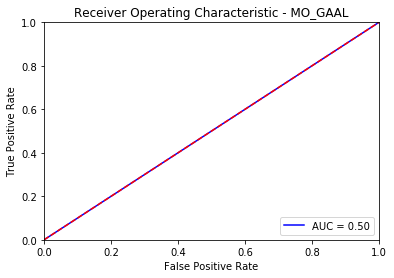

MO_GAAL ROC:0.5, precision @ rank n:0.0
Duration:  1138.807612  seconds


#####################################################################


/home/andre/anaconda3/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [59]:
#Proximity Based
classifiers = {
    'PCA': PCA(contamination= outliers_fraction),
    'MCD': MCD(contamination= outliers_fraction),
    'OCSVM': OCSVM(contamination= outliers_fraction),
    'LOF': LOF(contamination = outliers_fraction),
    'CBLOF':CBLOF(contamination= outliers_fraction),
    'HBOS': HBOS(contamination= outliers_fraction),
    'kNN': KNN(method='largest', contamination= outliers_fraction),
    'AvgKNN': KNN(method='mean', contamination= outliers_fraction),
    'MedKNN': KNN(method='median', contamination= outliers_fraction),
    #'SOD': SOD(contamination= outliers_fraction),
    'ABOD': ABOD(contamination = outliers_fraction),
    'Isolation Forest': IForest(contamination = outliers_fraction),
    'Feature Bagging': FeatureBagging(contamination = outliers_fraction),
    'AutoEncoder': AutoEncoder(contamination = outliers_fraction, hidden_neurons = [8, 4, 4, 8], epochs = 15),
    'SO_GAAL': SO_GAAL(contamination = outliers_fraction),
    'MO_GAAL': MO_GAAL(contamination = outliers_fraction)
}

for i, (clf_name, clf) in enumerate(classifiers.items()):
    testMethod(clf, clf_name, testingSet_pd, testingSet_pd, y_test)
    testMethod(clf, clf_name, testingSet_fs, testingSet_fs, y_test)


Results - HBOS - 10:
Confusion Matrix:
               Actual
Predicted   2391  |  988
            1015  |  15502 

Accuracy:  0.8993264977885002
Precision:  0.707605800532702
Recall:  0.7019964768056371
F1-score:  0.7047899778924098


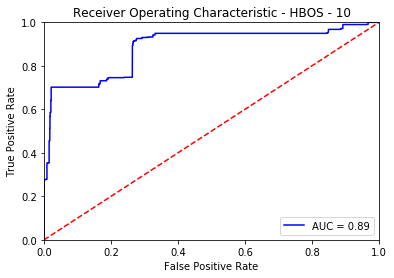

HBOS - 10 ROC:0.8853, precision @ rank n:0.702
Duration:  0.06016  seconds


#####################################################################

Results - HBOS - 20:
Confusion Matrix:
               Actual
Predicted   2391  |  963
            1015  |  15527 

Accuracy:  0.900583031765179
Precision:  0.7128801431127012
Recall:  0.7019964768056371
F1-score:  0.707396449704142


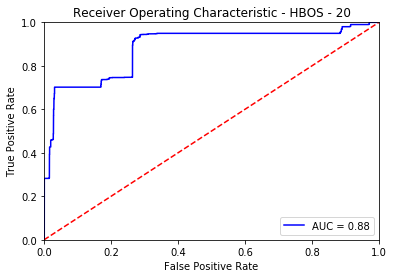

HBOS - 20 ROC:0.8817, precision @ rank n:0.702
Duration:  0.049281  seconds


#####################################################################

Results - HBOS - 30:
Confusion Matrix:
               Actual
Predicted   2393  |  962
            1013  |  15528 

Accuracy:  0.9007338158423803
Precision:  0.713263785394933
Recall:  0.7025836758661186
F1-score:  0.7078834491939062


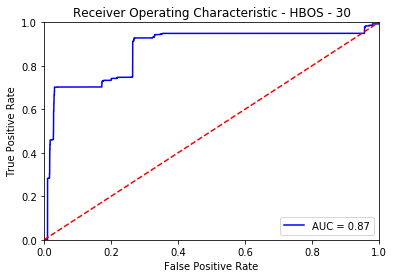

HBOS - 30 ROC:0.8749, precision @ rank n:0.7028
Duration:  0.053597  seconds


#####################################################################

Results - HBOS - 40:
Confusion Matrix:
               Actual
Predicted   2538  |  808
            868  |  15682 

Accuracy:  0.915761962203458
Precision:  0.7585176329946205
Recall:  0.7451556077510276
F1-score:  0.7517772511848341


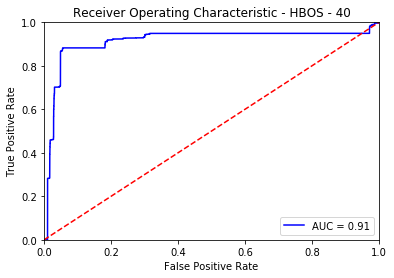

HBOS - 40 ROC:0.9135, precision @ rank n:0.7585
Duration:  0.056589  seconds


#####################################################################

Results - HBOS - 50:
Confusion Matrix:
               Actual
Predicted   2661  |  718
            745  |  15772 

Accuracy:  0.9264676316847608
Precision:  0.7875110979579757
Recall:  0.7812683499706401
F1-score:  0.7843773028739868


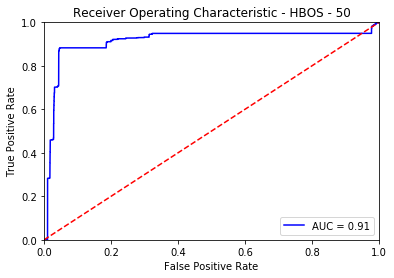

HBOS - 50 ROC:0.9137, precision @ rank n:0.7875
Duration:  0.06858  seconds


#####################################################################

Results - HBOS - 60:
Confusion Matrix:
               Actual
Predicted   2649  |  716
            757  |  15774 

Accuracy:  0.9259650180940893
Precision:  0.787221396731055
Recall:  0.777745155607751
F1-score:  0.7824545857332743


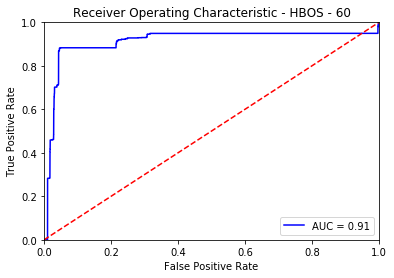

HBOS - 60 ROC:0.9121, precision @ rank n:0.7893
Duration:  0.057038  seconds


#####################################################################

Results - HBOS - 70:
Confusion Matrix:
               Actual
Predicted   2626  |  745
            780  |  15745 

Accuracy:  0.9233514274225975
Precision:  0.7789973301690893
Recall:  0.7709923664122137
F1-score:  0.7749741773646156


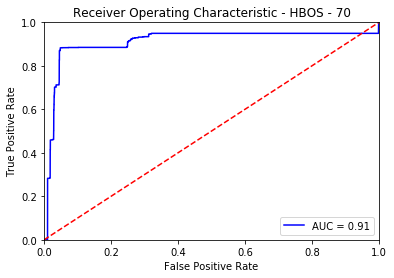

HBOS - 70 ROC:0.9104, precision @ rank n:0.781
Duration:  0.055545  seconds


#####################################################################

Results - HBOS - 80:
Confusion Matrix:
               Actual
Predicted   2670  |  704
            736  |  15786 

Accuracy:  0.9276236429433052
Precision:  0.7913455838767042
Recall:  0.7839107457428068
F1-score:  0.7876106194690266


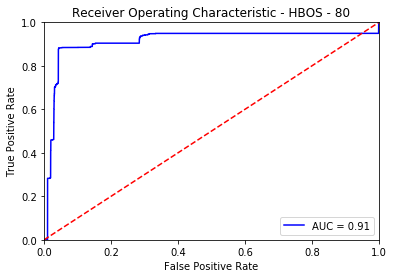

HBOS - 80 ROC:0.9122, precision @ rank n:0.7913
Duration:  0.055299  seconds


#####################################################################

Results - HBOS - 90:
Confusion Matrix:
               Actual
Predicted   2632  |  736
            774  |  15754 

Accuracy:  0.9241053478086048
Precision:  0.7814726840855107
Recall:  0.7727539635936582
F1-score:  0.7770888692057869


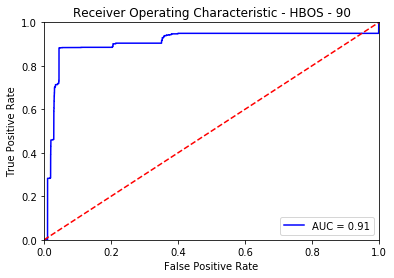

HBOS - 90 ROC:0.9076, precision @ rank n:0.7835
Duration:  0.062134  seconds


#####################################################################

Results - HBOS - 100:
Confusion Matrix:
               Actual
Predicted   2593  |  748
            813  |  15742 

Accuracy:  0.9215420184961801
Precision:  0.7761149356480096
Recall:  0.761303581914269
F1-score:  0.7686379131465836


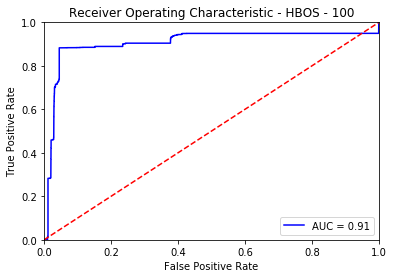

HBOS - 100 ROC:0.9057, precision @ rank n:0.7802
Duration:  0.05831  seconds


#####################################################################

Results - HBOS - 110:
Confusion Matrix:
               Actual
Predicted   130  |  3249
            3276  |  13241 

Accuracy:  0.6720446320868516
Precision:  0.03847292098253921
Recall:  0.03816793893129771
F1-score:  0.038319823139277814


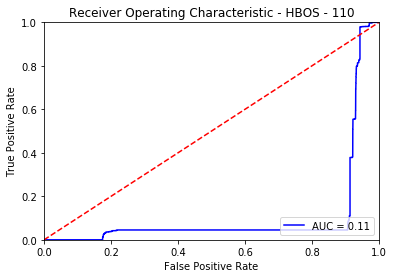

HBOS - 110 ROC:0.1075, precision @ rank n:0.0382
Duration:  0.065122  seconds


#####################################################################

Results - HBOS - 120:
Confusion Matrix:
               Actual
Predicted   2616  |  752
            790  |  15738 

Accuracy:  0.922496984318456
Precision:  0.7767220902612827
Recall:  0.7680563711098062
F1-score:  0.7723649247121347


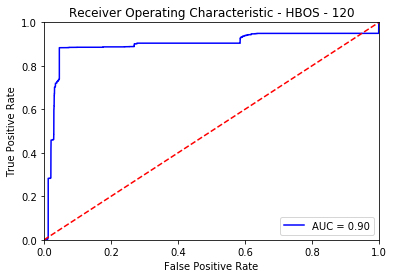

HBOS - 120 ROC:0.8954, precision @ rank n:0.7783
Duration:  0.062438  seconds


#####################################################################

Results - HBOS - 130:
Confusion Matrix:
               Actual
Predicted   2617  |  756
            789  |  15734 

Accuracy:  0.9223462002412546
Precision:  0.7758671805514379
Recall:  0.768349970640047
F1-score:  0.7720902788021832


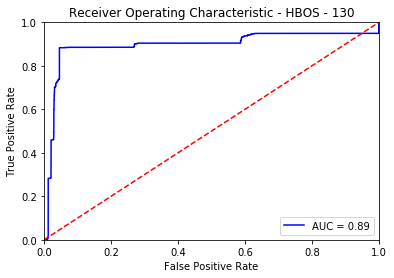

HBOS - 130 ROC:0.895, precision @ rank n:0.7778
Duration:  0.057763  seconds


#####################################################################

Results - HBOS - 140:
Confusion Matrix:
               Actual
Predicted   2634  |  733
            772  |  15757 

Accuracy:  0.9243566546039405
Precision:  0.7822987822987822
Recall:  0.7733411626541398
F1-score:  0.7777941827845859


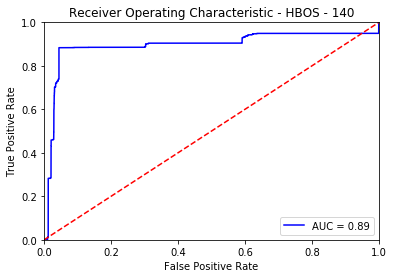

HBOS - 140 ROC:0.8943, precision @ rank n:0.7847
Duration:  0.056936  seconds


#####################################################################

Results - HBOS - 150:
Confusion Matrix:
               Actual
Predicted   2623  |  750
            783  |  15740 

Accuracy:  0.9229493365500603
Precision:  0.7776460124518233
Recall:  0.7701115678214915
F1-score:  0.7738604513940109


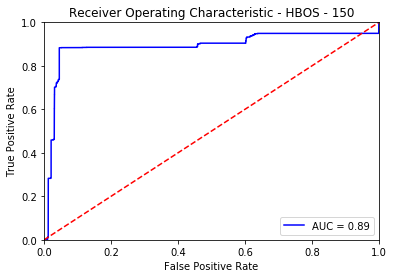

HBOS - 150 ROC:0.8903, precision @ rank n:0.7788
Duration:  0.059476  seconds


#####################################################################

Results - HBOS - 160:
Confusion Matrix:
               Actual
Predicted   2630  |  748
            776  |  15742 

Accuracy:  0.9234016887816646
Precision:  0.7785671995263469
Recall:  0.7721667645331768
F1-score:  0.7753537735849056


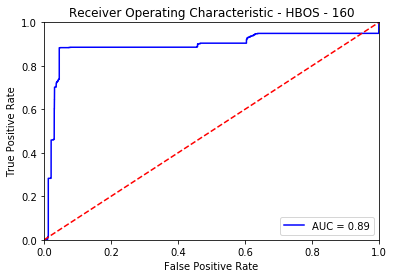

HBOS - 160 ROC:0.8904, precision @ rank n:0.7786
Duration:  0.062327  seconds


#####################################################################

Results - HBOS - 170:
Confusion Matrix:
               Actual
Predicted   2614  |  759
            792  |  15731 

Accuracy:  0.9220446320868516
Precision:  0.7749777646012452
Recall:  0.7674691720493247
F1-score:  0.7712051925062694


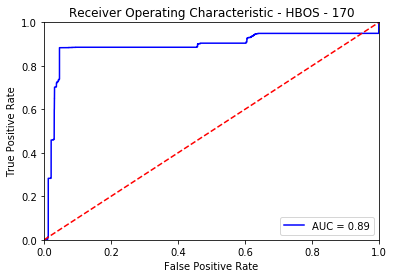

HBOS - 170 ROC:0.8902, precision @ rank n:0.7768
Duration:  0.06077  seconds


#####################################################################

Results - HBOS - 180:
Confusion Matrix:
               Actual
Predicted   2611  |  769
            795  |  15721 

Accuracy:  0.9213912344189787
Precision:  0.7724852071005918
Recall:  0.7665883734586024
F1-score:  0.7695254936634247


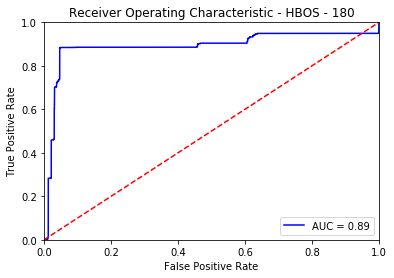

HBOS - 180 ROC:0.89, precision @ rank n:0.7736
Duration:  0.063834  seconds


#####################################################################

Results - HBOS - 190:
Confusion Matrix:
               Actual
Predicted   2565  |  799
            841  |  15691 

Accuracy:  0.9175713711298753
Precision:  0.7624851367419738
Recall:  0.7530827950675278
F1-score:  0.757754800590842


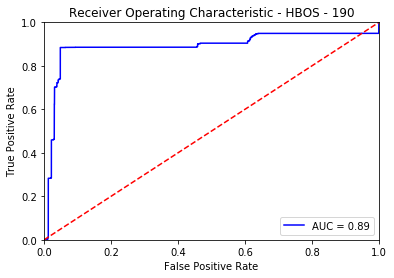

HBOS - 190 ROC:0.8895, precision @ rank n:0.7651
Duration:  0.06175  seconds


#####################################################################

Results - HBOS - 200:
Confusion Matrix:
               Actual
Predicted   2579  |  782
            827  |  15708 

Accuracy:  0.919129473260957
Precision:  0.7673311514430229
Recall:  0.7571931884908985
F1-score:  0.7622284616521353


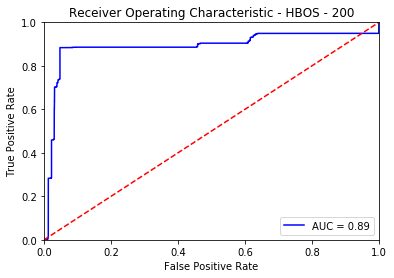

HBOS - 200 ROC:0.8896, precision @ rank n:0.7697
Duration:  0.057594  seconds


#####################################################################

Results - HBOS - 210:
Confusion Matrix:
               Actual
Predicted   2556  |  808
            850  |  15682 

Accuracy:  0.9166666666666666
Precision:  0.7598097502972652
Recall:  0.7504403992953611
F1-score:  0.7550960118168389


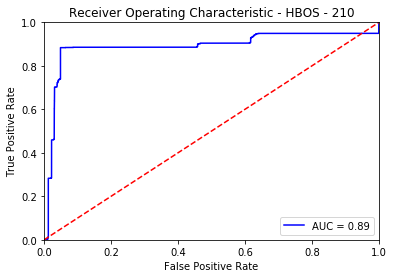

HBOS - 210 ROC:0.8892, precision @ rank n:0.7614
Duration:  0.065098  seconds


#####################################################################

Results - HBOS - 220:
Confusion Matrix:
               Actual
Predicted   34  |  3348
            3372  |  13142 

Accuracy:  0.6622436670687576
Precision:  0.010053222945002957
Recall:  0.009982384028185555
F1-score:  0.010017678255745432


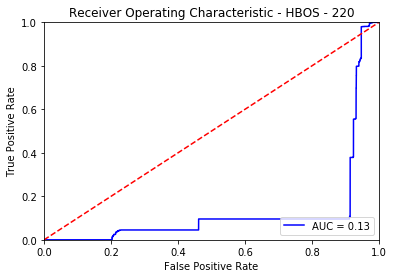

HBOS - 220 ROC:0.1273, precision @ rank n:0.0124
Duration:  0.080097  seconds


#####################################################################

Results - HBOS - 230:
Confusion Matrix:
               Actual
Predicted   2562  |  821
            844  |  15669 

Accuracy:  0.9163148371531966
Precision:  0.7573159917233225
Recall:  0.7522019964768056
F1-score:  0.754750331418471


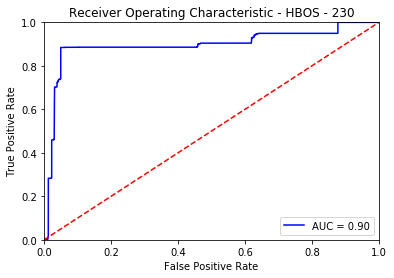

HBOS - 230 ROC:0.8951, precision @ rank n:0.7576
Duration:  0.072492  seconds


#####################################################################

Results - HBOS - 240:
Confusion Matrix:
               Actual
Predicted   2531  |  847
            875  |  15643 

Accuracy:  0.9134499396863691
Precision:  0.7492599171107164
Recall:  0.7431004110393423
F1-score:  0.7461674528301886


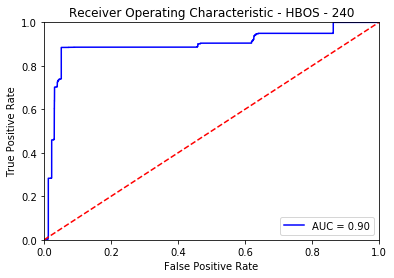

HBOS - 240 ROC:0.8956, precision @ rank n:0.751
Duration:  0.076311  seconds


#####################################################################

Results - HBOS - 250:
Confusion Matrix:
               Actual
Predicted   2551  |  832
            855  |  15658 

Accuracy:  0.9152090872537193
Precision:  0.7540644398462902
Recall:  0.7489724016441573
F1-score:  0.7515097952570334


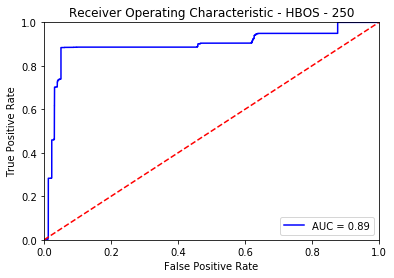

HBOS - 250 ROC:0.8949, precision @ rank n:0.7541
Duration:  0.06885  seconds


#####################################################################

Results - HBOS - 260:
Confusion Matrix:
               Actual
Predicted   2522  |  861
            884  |  15629 

Accuracy:  0.9122939284278246
Precision:  0.7454921667159327
Recall:  0.7404580152671756
F1-score:  0.7429665635586978


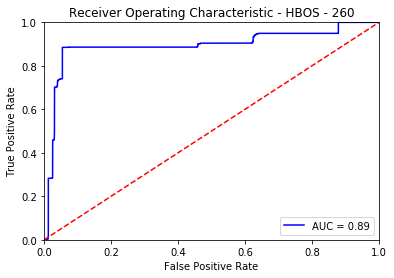

HBOS - 260 ROC:0.8937, precision @ rank n:0.7405
Duration:  0.068791  seconds


#####################################################################

Results - HBOS - 270:
Confusion Matrix:
               Actual
Predicted   2522  |  861
            884  |  15629 

Accuracy:  0.9122939284278246
Precision:  0.7454921667159327
Recall:  0.7404580152671756
F1-score:  0.7429665635586978


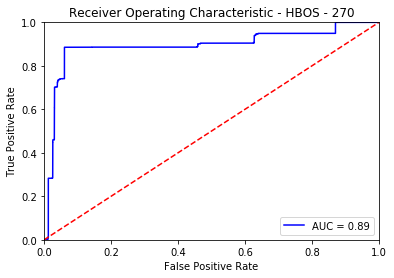

HBOS - 270 ROC:0.8931, precision @ rank n:0.741
Duration:  0.06491  seconds


#####################################################################

Results - HBOS - 280:
Confusion Matrix:
               Actual
Predicted   2521  |  862
            885  |  15628 

Accuracy:  0.9121934057096904
Precision:  0.7451965710907479
Recall:  0.7401644157369348
F1-score:  0.7426719693622035


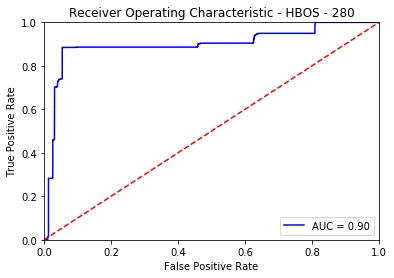

HBOS - 280 ROC:0.897, precision @ rank n:0.7402
Duration:  0.070636  seconds


#####################################################################

Results - HBOS - 290:
Confusion Matrix:
               Actual
Predicted   2523  |  860
            883  |  15630 

Accuracy:  0.912394451145959
Precision:  0.7457877623411173
Recall:  0.7407516147974164
F1-score:  0.7432611577551922


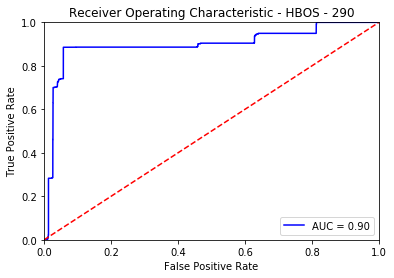

HBOS - 290 ROC:0.8973, precision @ rank n:0.741
Duration:  0.068284  seconds


#####################################################################

Results - HBOS - 300:
Confusion Matrix:
               Actual
Predicted   2520  |  863
            886  |  15627 

Accuracy:  0.9120928829915561
Precision:  0.7449009754655631
Recall:  0.739870816206694
F1-score:  0.7423773751657092


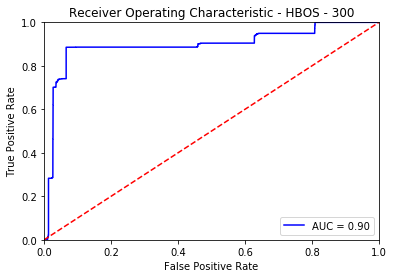

HBOS - 300 ROC:0.8964, precision @ rank n:0.7408
Duration:  0.075623  seconds


#####################################################################

Results - HBOS - 310:
Confusion Matrix:
               Actual
Predicted   2522  |  861
            884  |  15629 

Accuracy:  0.9122939284278246
Precision:  0.7454921667159327
Recall:  0.7404580152671756
F1-score:  0.7429665635586978


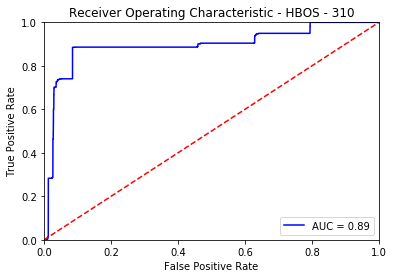

HBOS - 310 ROC:0.8941, precision @ rank n:0.7405
Duration:  0.06923  seconds


#####################################################################

Results - HBOS - 320:
Confusion Matrix:
               Actual
Predicted   2524  |  859
            882  |  15631 

Accuracy:  0.9124949738640933
Precision:  0.7460833579663021
Recall:  0.741045214327657
F1-score:  0.7435557519516865


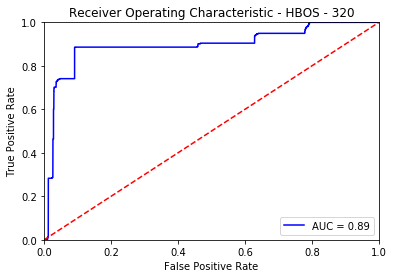

HBOS - 320 ROC:0.8937, precision @ rank n:0.741
Duration:  0.070624  seconds


#####################################################################

Results - HBOS - 330:
Confusion Matrix:
               Actual
Predicted   0  |  3377
            3406  |  13113 

Accuracy:  0.6590772014475271
Precision:  0.0
Recall:  0.0
F1-score: -


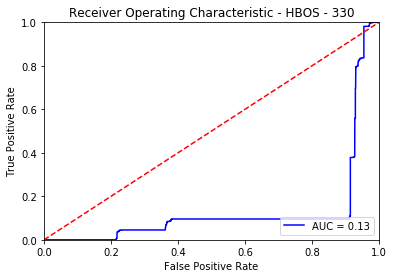

HBOS - 330 ROC:0.1304, precision @ rank n:0.0
Duration:  0.067479  seconds


#####################################################################

Results - HBOS - 340:
Confusion Matrix:
               Actual
Predicted   2521  |  862
            885  |  15628 

Accuracy:  0.9121934057096904
Precision:  0.7451965710907479
Recall:  0.7401644157369348
F1-score:  0.7426719693622035


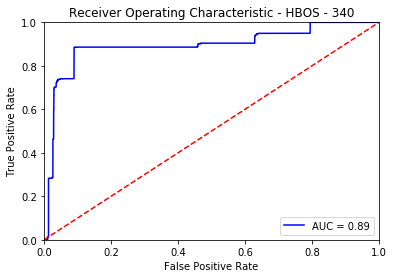

HBOS - 340 ROC:0.8932, precision @ rank n:0.7402
Duration:  0.067093  seconds


#####################################################################

Results - HBOS - 350:
Confusion Matrix:
               Actual
Predicted   2524  |  858
            882  |  15632 

Accuracy:  0.9125452352231604
Precision:  0.7463039621525724
Recall:  0.741045214327657
F1-score:  0.7436652916912196


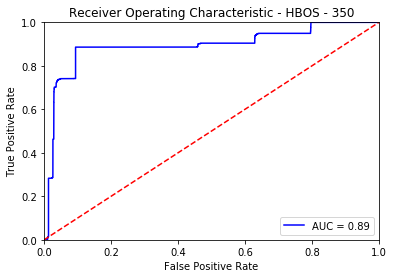

HBOS - 350 ROC:0.8923, precision @ rank n:0.741
Duration:  0.068015  seconds


#####################################################################

Results - HBOS - 360:
Confusion Matrix:
               Actual
Predicted   2523  |  860
            883  |  15630 

Accuracy:  0.912394451145959
Precision:  0.7457877623411173
Recall:  0.7407516147974164
F1-score:  0.7432611577551922


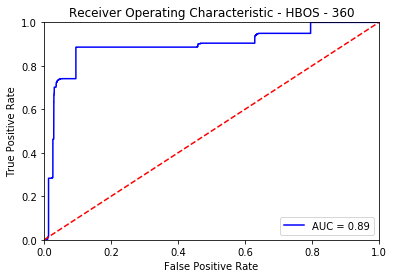

HBOS - 360 ROC:0.8922, precision @ rank n:0.741
Duration:  0.061715  seconds


#####################################################################

Results - HBOS - 370:
Confusion Matrix:
               Actual
Predicted   2521  |  862
            885  |  15628 

Accuracy:  0.9121934057096904
Precision:  0.7451965710907479
Recall:  0.7401644157369348
F1-score:  0.7426719693622035


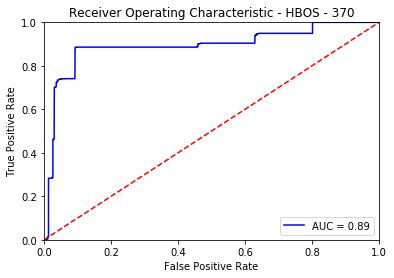

HBOS - 370 ROC:0.892, precision @ rank n:0.7402
Duration:  0.075708  seconds


#####################################################################

Results - HBOS - 380:
Confusion Matrix:
               Actual
Predicted   2523  |  860
            883  |  15630 

Accuracy:  0.912394451145959
Precision:  0.7457877623411173
Recall:  0.7407516147974164
F1-score:  0.7432611577551922


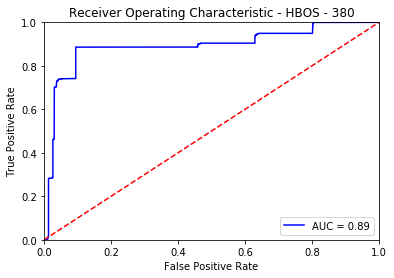

HBOS - 380 ROC:0.8916, precision @ rank n:0.7408
Duration:  0.066216  seconds


#####################################################################

Results - HBOS - 390:
Confusion Matrix:
               Actual
Predicted   2523  |  860
            883  |  15630 

Accuracy:  0.912394451145959
Precision:  0.7457877623411173
Recall:  0.7407516147974164
F1-score:  0.7432611577551922


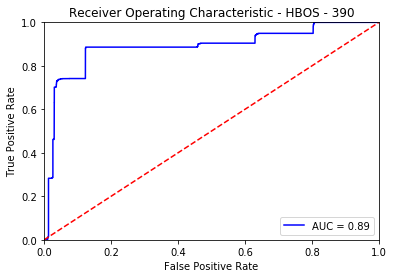

HBOS - 390 ROC:0.8874, precision @ rank n:0.7408
Duration:  0.066025  seconds


#####################################################################

Results - HBOS - 400:
Confusion Matrix:
               Actual
Predicted   2520  |  863
            886  |  15627 

Accuracy:  0.9120928829915561
Precision:  0.7449009754655631
Recall:  0.739870816206694
F1-score:  0.7423773751657092


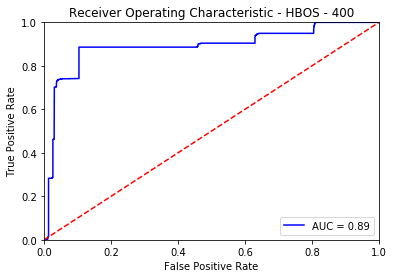

HBOS - 400 ROC:0.89, precision @ rank n:0.7399
Duration:  0.066043  seconds


#####################################################################

Results - HBOS - 410:
Confusion Matrix:
               Actual
Predicted   2520  |  862
            886  |  15628 

Accuracy:  0.9121431443506233
Precision:  0.7451212300413956
Recall:  0.739870816206694
F1-score:  0.7424867413081909


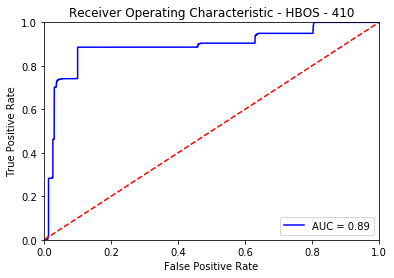

HBOS - 410 ROC:0.8907, precision @ rank n:0.7408
Duration:  0.066807  seconds


#####################################################################

Results - HBOS - 420:
Confusion Matrix:
               Actual
Predicted   2517  |  866
            889  |  15624 

Accuracy:  0.9117913148371531
Precision:  0.7440141885900089
Recall:  0.7389900176159718
F1-score:  0.7414935925762263


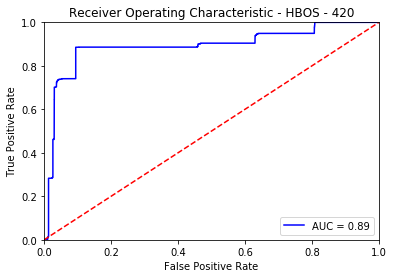

HBOS - 420 ROC:0.8913, precision @ rank n:0.7408
Duration:  0.060643  seconds


#####################################################################

Results - HBOS - 430:
Confusion Matrix:
               Actual
Predicted   2516  |  867
            890  |  15623 

Accuracy:  0.9116907921190189
Precision:  0.7437185929648241
Recall:  0.738696418085731
F1-score:  0.7411989983797319


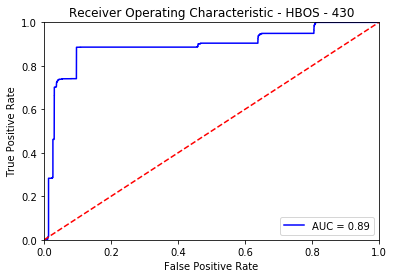

HBOS - 430 ROC:0.8906, precision @ rank n:0.7396
Duration:  0.07211  seconds


#####################################################################

Results - HBOS - 440:
Confusion Matrix:
               Actual
Predicted   0  |  3383
            3406  |  13107 

Accuracy:  0.6587756332931243
Precision:  0.0
Recall:  0.0
F1-score: -


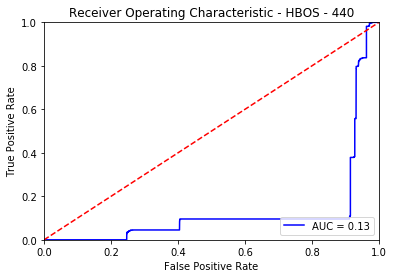

HBOS - 440 ROC:0.1255, precision @ rank n:0.0
Duration:  0.071974  seconds


#####################################################################

Results - HBOS - 450:
Confusion Matrix:
               Actual
Predicted   2518  |  865
            888  |  15625 

Accuracy:  0.9118918375552875
Precision:  0.7443097842151937
Recall:  0.7392836171462126
F1-score:  0.7417881867727206


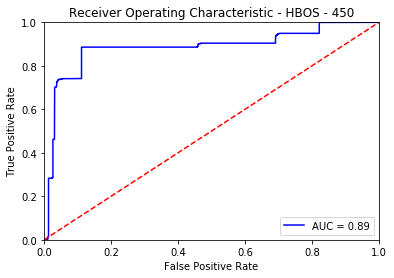

HBOS - 450 ROC:0.8851, precision @ rank n:0.7393
Duration:  0.067612  seconds


#####################################################################

Results - HBOS - 460:
Confusion Matrix:
               Actual
Predicted   2517  |  866
            889  |  15624 

Accuracy:  0.9117913148371531
Precision:  0.7440141885900089
Recall:  0.7389900176159718
F1-score:  0.7414935925762263


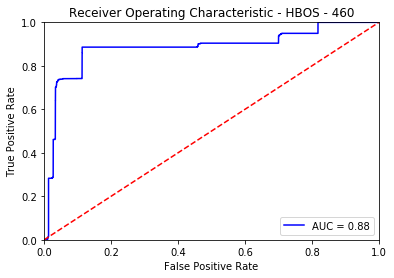

HBOS - 460 ROC:0.8839, precision @ rank n:0.739
Duration:  0.066063  seconds


#####################################################################

Results - HBOS - 470:
Confusion Matrix:
               Actual
Predicted   2515  |  868
            891  |  15622 

Accuracy:  0.9115902694008846
Precision:  0.7434229973396393
Recall:  0.7384028185554903
F1-score:  0.7409044041832376


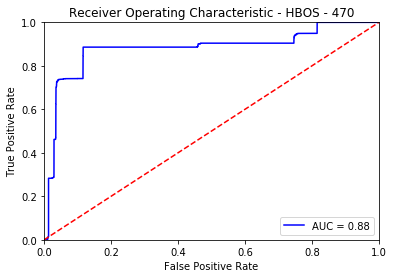

HBOS - 470 ROC:0.8807, precision @ rank n:0.7384
Duration:  0.080331  seconds


#####################################################################

Results - HBOS - 480:
Confusion Matrix:
               Actual
Predicted   2517  |  866
            889  |  15624 

Accuracy:  0.9117913148371531
Precision:  0.7440141885900089
Recall:  0.7389900176159718
F1-score:  0.7414935925762263


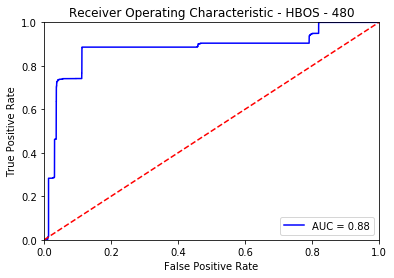

HBOS - 480 ROC:0.8784, precision @ rank n:0.739
Duration:  0.062963  seconds


#####################################################################

Results - HBOS - 490:
Confusion Matrix:
               Actual
Predicted   2516  |  867
            890  |  15623 

Accuracy:  0.9116907921190189
Precision:  0.7437185929648241
Recall:  0.738696418085731
F1-score:  0.7411989983797319


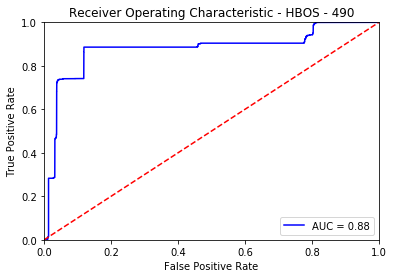

HBOS - 490 ROC:0.8783, precision @ rank n:0.7387
Duration:  0.063188  seconds


#####################################################################

Results - HBOS - 500:
Confusion Matrix:
               Actual
Predicted   2516  |  867
            890  |  15623 

Accuracy:  0.9116907921190189
Precision:  0.7437185929648241
Recall:  0.738696418085731
F1-score:  0.7411989983797319


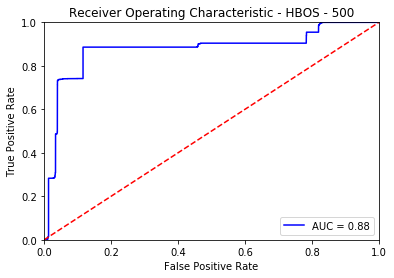

HBOS - 500 ROC:0.8772, precision @ rank n:0.7387
Duration:  0.077359  seconds


#####################################################################

Results - HBOS - 510:
Confusion Matrix:
               Actual
Predicted   2516  |  867
            890  |  15623 

Accuracy:  0.9116907921190189
Precision:  0.7437185929648241
Recall:  0.738696418085731
F1-score:  0.7411989983797319


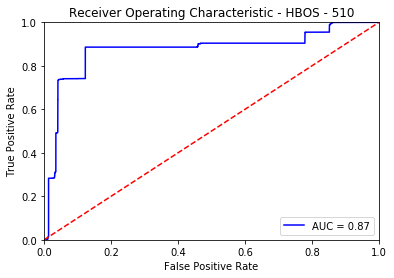

HBOS - 510 ROC:0.8745, precision @ rank n:0.7387
Duration:  0.072481  seconds


#####################################################################

Results - HBOS - 520:
Confusion Matrix:
               Actual
Predicted   2691  |  686
            715  |  15804 

Accuracy:  0.929583835946924
Precision:  0.7968611193366893
Recall:  0.7900763358778626
F1-score:  0.793454223794781

Results - HBOS - 520:
Confusion Matrix:
               Actual
Predicted   2691  |  686
            715  |  15804 

Accuracy:  0.929583835946924
Precision:  0.7968611193366893
Recall:  0.7900763358778626
F1-score:  0.793454223794781
Duration:  0.243201  seconds


#####################################################################

Results - HBOS - 530:
Confusion Matrix:
               Actual
Predicted   2516  |  867
            890  |  15623 

Accuracy:  0.9116907921190189
Precision:  0.7437185929648241
Recall:  0.738696418085731
F1-score:  0.7411989983797319


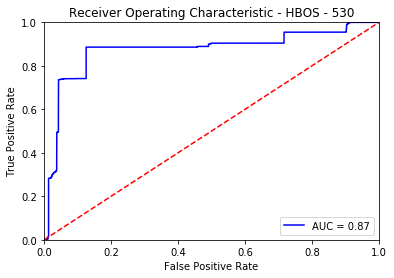

HBOS - 530 ROC:0.8739, precision @ rank n:0.739
Duration:  0.080801  seconds


#####################################################################

Results - HBOS - 540:
Confusion Matrix:
               Actual
Predicted   2518  |  865
            888  |  15625 

Accuracy:  0.9118918375552875
Precision:  0.7443097842151937
Recall:  0.7392836171462126
F1-score:  0.7417881867727206


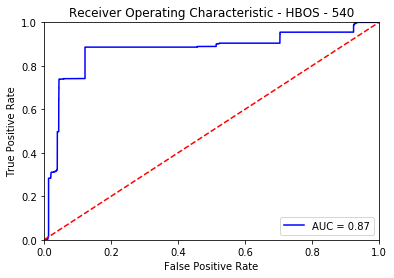

HBOS - 540 ROC:0.8733, precision @ rank n:0.7393
Duration:  0.06558  seconds


#####################################################################

Results - HBOS - 550:
Confusion Matrix:
               Actual
Predicted   0  |  3383
            3406  |  13107 

Accuracy:  0.6587756332931243
Precision:  0.0
Recall:  0.0
F1-score: -


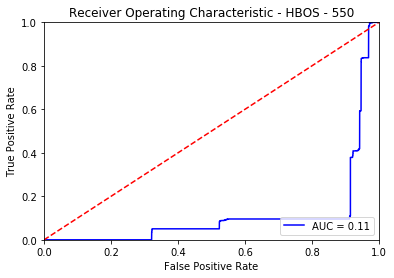

HBOS - 550 ROC:0.1106, precision @ rank n:0.0
Duration:  0.067589  seconds


#####################################################################

Results - HBOS - 560:
Confusion Matrix:
               Actual
Predicted   2515  |  868
            891  |  15622 

Accuracy:  0.9115902694008846
Precision:  0.7434229973396393
Recall:  0.7384028185554903
F1-score:  0.7409044041832376


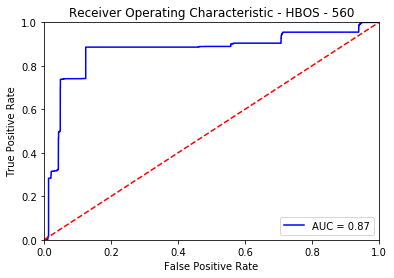

HBOS - 560 ROC:0.8697, precision @ rank n:0.7387
Duration:  0.072797  seconds


#####################################################################

Results - HBOS - 570:
Confusion Matrix:
               Actual
Predicted   2517  |  866
            889  |  15624 

Accuracy:  0.9117913148371531
Precision:  0.7440141885900089
Recall:  0.7389900176159718
F1-score:  0.7414935925762263


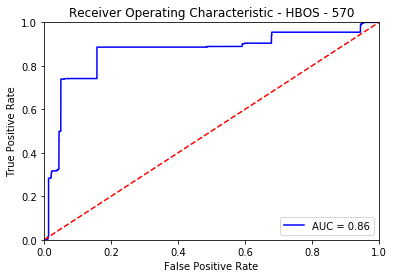

HBOS - 570 ROC:0.8649, precision @ rank n:0.739
Duration:  0.069572  seconds


#####################################################################

Results - HBOS - 580:
Confusion Matrix:
               Actual
Predicted   2518  |  865
            888  |  15625 

Accuracy:  0.9118918375552875
Precision:  0.7443097842151937
Recall:  0.7392836171462126
F1-score:  0.7417881867727206


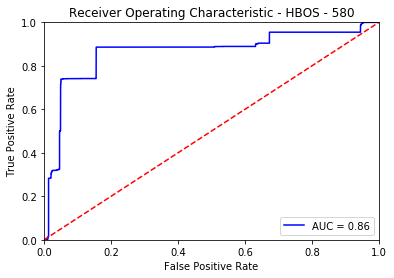

HBOS - 580 ROC:0.8648, precision @ rank n:0.7393
Duration:  0.084341  seconds


#####################################################################

Results - HBOS - 590:
Confusion Matrix:
               Actual
Predicted   2476  |  907
            930  |  15583 

Accuracy:  0.907669883393647
Precision:  0.7318947679574342
Recall:  0.726952436876101
F1-score:  0.7294152305199588


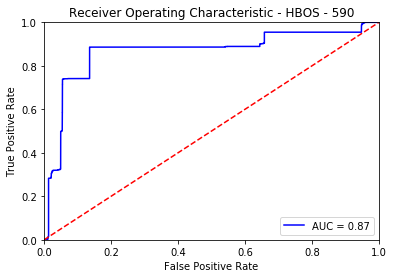

HBOS - 590 ROC:0.8661, precision @ rank n:0.7334
Duration:  0.06942  seconds


#####################################################################

Results - HBOS - 600:
Confusion Matrix:
               Actual
Predicted   2443  |  938
            963  |  15552 

Accuracy:  0.9044531564133494
Precision:  0.722567287784679
Recall:  0.7172636523781561
F1-score:  0.7199057020775009


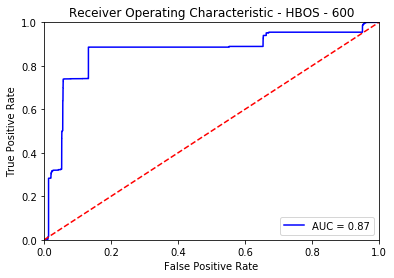

HBOS - 600 ROC:0.8654, precision @ rank n:0.7239
Duration:  0.079702  seconds


#####################################################################

Results - HBOS - 610:
Confusion Matrix:
               Actual
Predicted   2396  |  986
            1010  |  15504 

Accuracy:  0.8996783273019703
Precision:  0.7084565345949142
Recall:  0.7034644744568409
F1-score:  0.7059516794342958


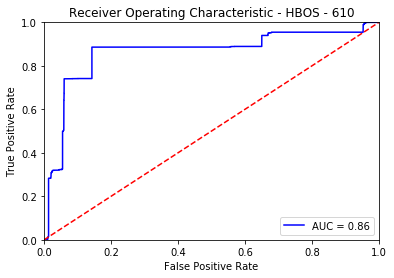

HBOS - 610 ROC:0.8627, precision @ rank n:0.7102
Duration:  0.076004  seconds


#####################################################################

Results - HBOS - 620:
Confusion Matrix:
               Actual
Predicted   2214  |  1166
            1192  |  15324 

Accuracy:  0.8814837153196623
Precision:  0.6550295857988165
Recall:  0.650029359953024
F1-score:  0.6525198938992042


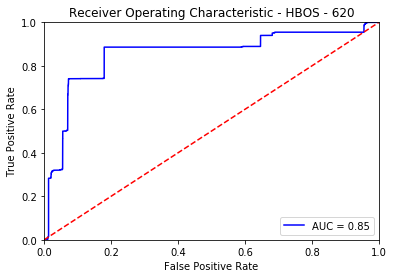

HBOS - 620 ROC:0.8543, precision @ rank n:0.6576
Duration:  0.074262  seconds


#####################################################################

Results - HBOS - 630:
Confusion Matrix:
               Actual
Predicted   2016  |  1364
            1390  |  15126 

Accuracy:  0.8615802171290712
Precision:  0.5964497041420118
Recall:  0.5918966529653552
F1-score:  0.5941644562334217


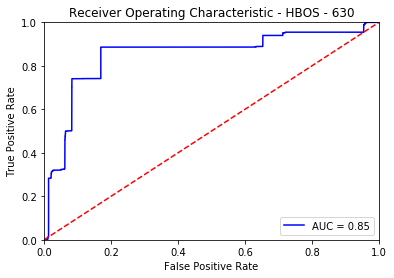

HBOS - 630 ROC:0.8508, precision @ rank n:0.5964
Duration:  0.069265  seconds


#####################################################################

Results - HBOS - 640:
Confusion Matrix:
               Actual
Predicted   1802  |  1581
            1604  |  14909 

Accuracy:  0.8399175713711299
Precision:  0.5326633165829145
Recall:  0.5290663534938345
F1-score:  0.530858742082781


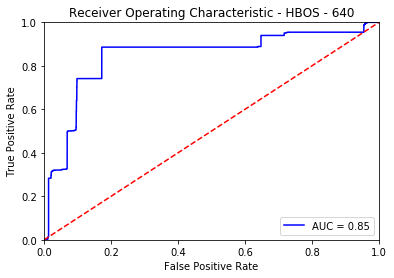

HBOS - 640 ROC:0.846, precision @ rank n:0.5327
Duration:  0.079743  seconds


#####################################################################

Results - HBOS - 650:
Confusion Matrix:
               Actual
Predicted   1752  |  1615
            1654  |  14875 

Accuracy:  0.8356956172094894
Precision:  0.5203445203445204
Recall:  0.5143863769817968
F1-score:  0.5173482946995424


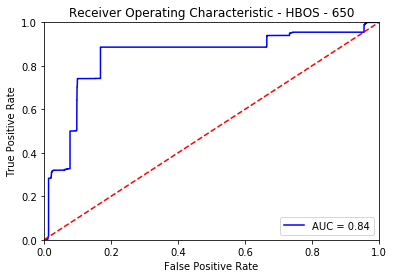

HBOS - 650 ROC:0.8435, precision @ rank n:0.5203
Duration:  0.069447  seconds


#####################################################################

Results - HBOS - 660:
Confusion Matrix:
               Actual
Predicted   0  |  3383
            3406  |  13107 

Accuracy:  0.6587756332931243
Precision:  0.0
Recall:  0.0
F1-score: -


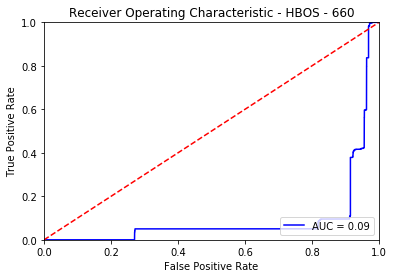

HBOS - 660 ROC:0.0937, precision @ rank n:0.0
Duration:  0.08073  seconds


#####################################################################

Results - HBOS - 670:
Confusion Matrix:
               Actual
Predicted   1706  |  1677
            1700  |  14813 

Accuracy:  0.8302673904302372
Precision:  0.5042861365651788
Recall:  0.5008807985907222
F1-score:  0.5025776992193253


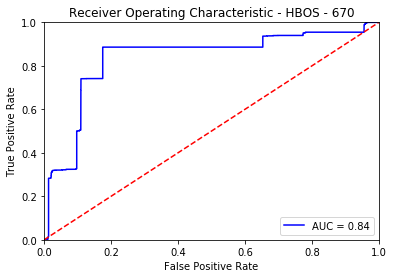

HBOS - 670 ROC:0.8362, precision @ rank n:0.5009
Duration:  0.073178  seconds


#####################################################################

Results - HBOS - 680:
Confusion Matrix:
               Actual
Predicted   1623  |  1760
            1783  |  14730 

Accuracy:  0.8219240048250904
Precision:  0.4797516996748448
Recall:  0.47651203758073984
F1-score:  0.478126380910296


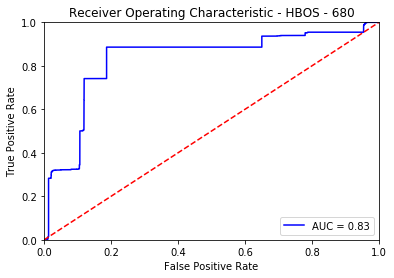

HBOS - 680 ROC:0.8306, precision @ rank n:0.4833
Duration:  0.069114  seconds


#####################################################################

Results - HBOS - 690:
Confusion Matrix:
               Actual
Predicted   1526  |  1854
            1880  |  14636 

Accuracy:  0.8123240852432649
Precision:  0.4514792899408284
Recall:  0.448032883147387
F1-score:  0.44974948423224287


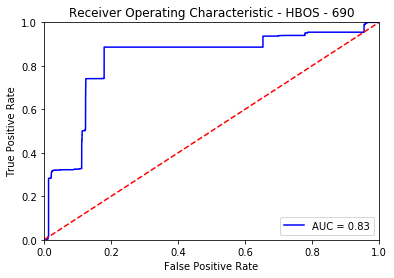

HBOS - 690 ROC:0.8293, precision @ rank n:0.4534
Duration:  0.066109  seconds


#####################################################################

Results - HBOS - 700:
Confusion Matrix:
               Actual
Predicted   1495  |  1887
            1911  |  14603 

Accuracy:  0.8091073582629674
Precision:  0.4420461265523359
Recall:  0.4389312977099237
F1-score:  0.44048320565704185


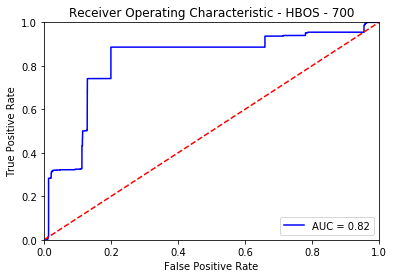

HBOS - 700 ROC:0.8246, precision @ rank n:0.4447
Duration:  0.065313  seconds


#####################################################################

Results - HBOS - 710:
Confusion Matrix:
               Actual
Predicted   1371  |  2007
            2035  |  14483 

Accuracy:  0.7968435866505831
Precision:  0.4058614564831261
Recall:  0.4025249559600705
F1-score:  0.40418632075471705


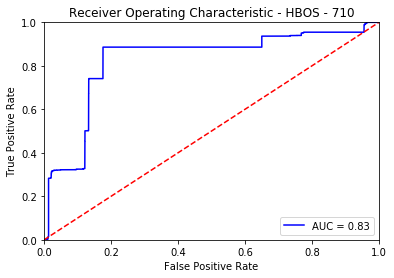

HBOS - 710 ROC:0.8262, precision @ rank n:0.4106
Duration:  0.07032  seconds


#####################################################################

Results - HBOS - 720:
Confusion Matrix:
               Actual
Predicted   1303  |  2061
            2103  |  14429 

Accuracy:  0.7907117008443908
Precision:  0.3873365041617122
Recall:  0.38256018790369933
F1-score:  0.3849335302806499


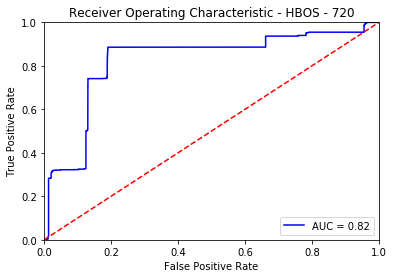

HBOS - 720 ROC:0.8234, precision @ rank n:0.3915
Duration:  0.079843  seconds


#####################################################################

Results - HBOS - 730:
Confusion Matrix:
               Actual
Predicted   1202  |  2174
            2204  |  14316 

Accuracy:  0.7799557700040209
Precision:  0.35604265402843605
Recall:  0.35290663534938344
F1-score:  0.354467708640519


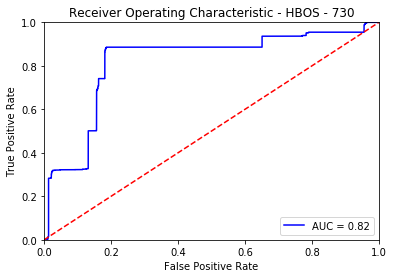

HBOS - 730 ROC:0.8172, precision @ rank n:0.3587
Duration:  0.072855  seconds


#####################################################################

Results - HBOS - 740:
Confusion Matrix:
               Actual
Predicted   1121  |  2261
            2285  |  14229 

Accuracy:  0.7715118616807398
Precision:  0.33146067415730335
Recall:  0.32912507339988256
F1-score:  0.3302887448438421


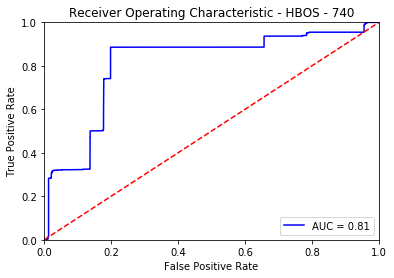

HBOS - 740 ROC:0.8086, precision @ rank n:0.3348
Duration:  0.072796  seconds


#####################################################################

Results - HBOS - 750:
Confusion Matrix:
               Actual
Predicted   1107  |  2276
            2299  |  14214 

Accuracy:  0.7700542822677925
Precision:  0.32722435707951525
Recall:  0.325014679976512
F1-score:  0.3261157755192223


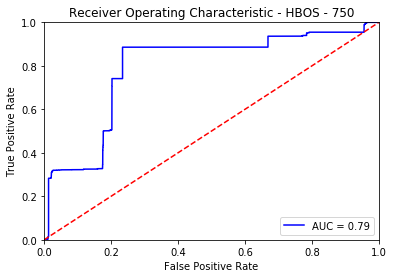

HBOS - 750 ROC:0.7902, precision @ rank n:0.325
Duration:  0.070792  seconds


#####################################################################

Results - HBOS - 760:
Confusion Matrix:
               Actual
Predicted   1107  |  2276
            2299  |  14214 

Accuracy:  0.7700542822677925
Precision:  0.32722435707951525
Recall:  0.325014679976512
F1-score:  0.3261157755192223


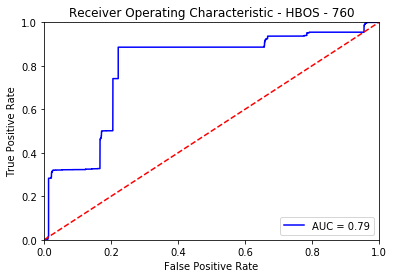

HBOS - 760 ROC:0.7931, precision @ rank n:0.325
Duration:  0.070148  seconds


#####################################################################

Results - HBOS - 770:
Confusion Matrix:
               Actual
Predicted   0  |  3383
            3406  |  13107 

Accuracy:  0.6587756332931243
Precision:  0.0
Recall:  0.0
F1-score: -


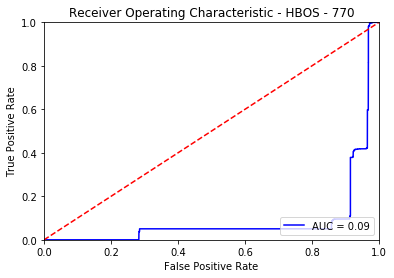

HBOS - 770 ROC:0.0883, precision @ rank n:0.0
Duration:  0.069133  seconds


#####################################################################

Results - HBOS - 780:
Confusion Matrix:
               Actual
Predicted   1099  |  2280
            2307  |  14210 

Accuracy:  0.7694511459589868
Precision:  0.3252441550754661
Recall:  0.32266588373458605
F1-score:  0.3239498894620486


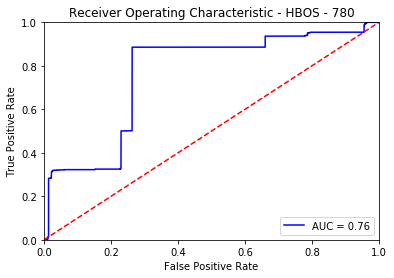

HBOS - 780 ROC:0.7623, precision @ rank n:0.3228
Duration:  0.071354  seconds


#####################################################################

Results - HBOS - 790:
Confusion Matrix:
               Actual
Predicted   1099  |  2283
            2307  |  14207 

Accuracy:  0.7693003618817853
Precision:  0.3249556475458309
Recall:  0.32266588373458605
F1-score:  0.3238067177371833


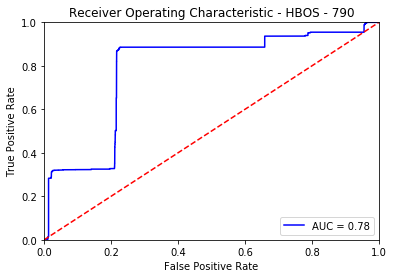

HBOS - 790 ROC:0.7835, precision @ rank n:0.3227
Duration:  0.076087  seconds


#####################################################################

Results - HBOS - 800:
Confusion Matrix:
               Actual
Predicted   1099  |  2284
            2307  |  14206 

Accuracy:  0.7692501005227181
Precision:  0.3248595920780372
Recall:  0.32266588373458605
F1-score:  0.3237590219472677


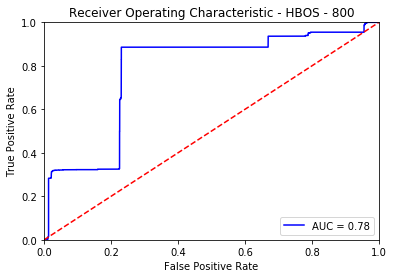

HBOS - 800 ROC:0.7756, precision @ rank n:0.3227
Duration:  0.079919  seconds


#####################################################################

Results - HBOS - 810:
Confusion Matrix:
               Actual
Predicted   1099  |  2284
            2307  |  14206 

Accuracy:  0.7692501005227181
Precision:  0.3248595920780372
Recall:  0.32266588373458605
F1-score:  0.3237590219472677


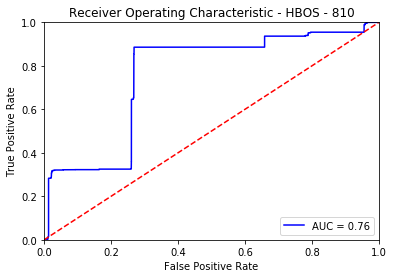

HBOS - 810 ROC:0.7559, precision @ rank n:0.3227
Duration:  0.069936  seconds


#####################################################################

Results - HBOS - 820:
Confusion Matrix:
               Actual
Predicted   1099  |  2284
            2307  |  14206 

Accuracy:  0.7692501005227181
Precision:  0.3248595920780372
Recall:  0.32266588373458605
F1-score:  0.3237590219472677


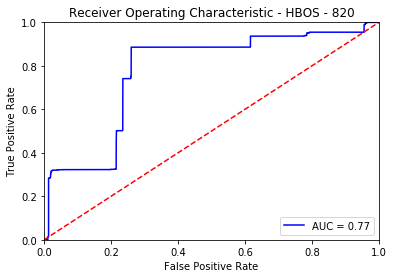

HBOS - 820 ROC:0.7741, precision @ rank n:0.3227
Duration:  0.076859  seconds


#####################################################################

Results - HBOS - 830:
Confusion Matrix:
               Actual
Predicted   1099  |  2281
            2307  |  14209 

Accuracy:  0.7694008845999196
Precision:  0.32514792899408285
Recall:  0.32266588373458605
F1-score:  0.3239021514883584


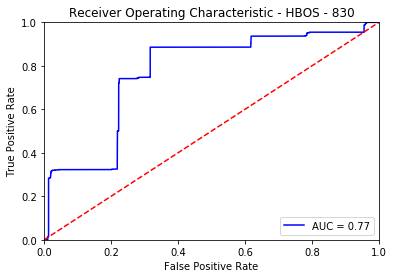

HBOS - 830 ROC:0.7684, precision @ rank n:0.3228
Duration:  0.071674  seconds


#####################################################################

Results - HBOS - 840:
Confusion Matrix:
               Actual
Predicted   1099  |  2281
            2307  |  14209 

Accuracy:  0.7694008845999196
Precision:  0.32514792899408285
Recall:  0.32266588373458605
F1-score:  0.3239021514883584


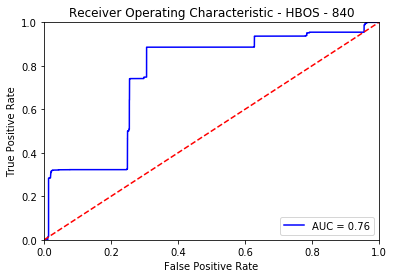

HBOS - 840 ROC:0.7561, precision @ rank n:0.323
Duration:  0.067611  seconds


#####################################################################

Results - HBOS - 850:
Confusion Matrix:
               Actual
Predicted   1099  |  2284
            2307  |  14206 

Accuracy:  0.7692501005227181
Precision:  0.3248595920780372
Recall:  0.32266588373458605
F1-score:  0.3237590219472677


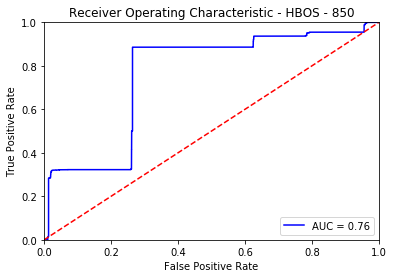

HBOS - 850 ROC:0.7579, precision @ rank n:0.3227
Duration:  0.071771  seconds


#####################################################################

Results - HBOS - 860:
Confusion Matrix:
               Actual
Predicted   1099  |  2284
            2307  |  14206 

Accuracy:  0.7692501005227181
Precision:  0.3248595920780372
Recall:  0.32266588373458605
F1-score:  0.3237590219472677


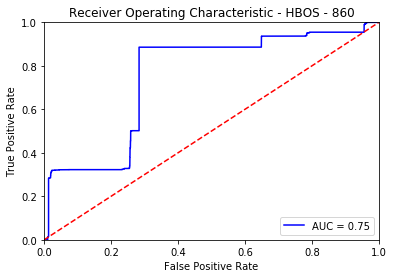

HBOS - 860 ROC:0.75, precision @ rank n:0.3231
Duration:  0.073502  seconds


#####################################################################

Results - HBOS - 870:
Confusion Matrix:
               Actual
Predicted   1099  |  2284
            2307  |  14206 

Accuracy:  0.7692501005227181
Precision:  0.3248595920780372
Recall:  0.32266588373458605
F1-score:  0.3237590219472677


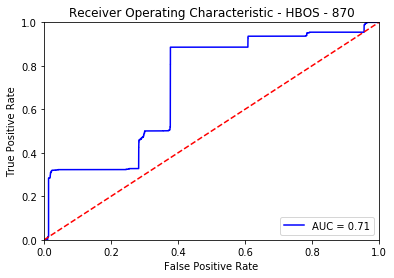

HBOS - 870 ROC:0.711, precision @ rank n:0.3227
Duration:  0.074872  seconds


#####################################################################

Results - HBOS - 880:
Confusion Matrix:
               Actual
Predicted   0  |  3383
            3406  |  13107 

Accuracy:  0.6587756332931243
Precision:  0.0
Recall:  0.0
F1-score: -


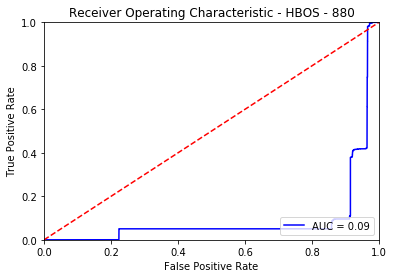

HBOS - 880 ROC:0.0927, precision @ rank n:0.0
Duration:  0.076371  seconds


#####################################################################

Results - HBOS - 890:
Confusion Matrix:
               Actual
Predicted   1099  |  2275
            2307  |  14215 

Accuracy:  0.7697024527543225
Precision:  0.3257261410788382
Recall:  0.32266588373458605
F1-score:  0.32418879056047195


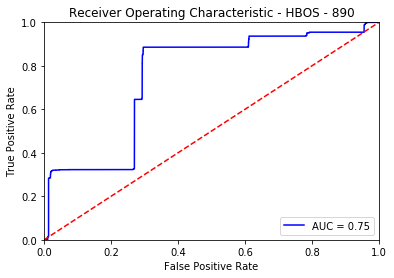

HBOS - 890 ROC:0.7492, precision @ rank n:0.3228
Duration:  0.07666  seconds


#####################################################################

Results - HBOS - 900:
Confusion Matrix:
               Actual
Predicted   1099  |  2283
            2307  |  14207 

Accuracy:  0.7693003618817853
Precision:  0.3249556475458309
Recall:  0.32266588373458605
F1-score:  0.3238067177371833


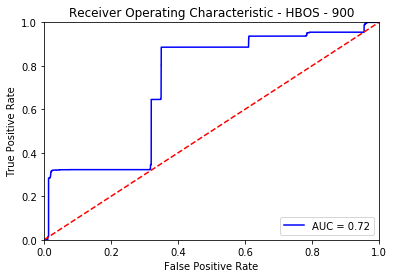

HBOS - 900 ROC:0.7195, precision @ rank n:0.3227
Duration:  0.085386  seconds


#####################################################################

Results - HBOS - 910:
Confusion Matrix:
               Actual
Predicted   1099  |  2279
            2307  |  14211 

Accuracy:  0.7695014073180538
Precision:  0.32534043812907043
Recall:  0.32266588373458605
F1-score:  0.32399764150943394


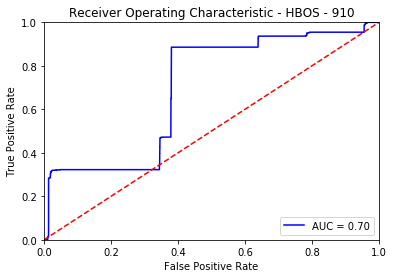

HBOS - 910 ROC:0.6968, precision @ rank n:0.3229
Duration:  0.075175  seconds


#####################################################################

Results - HBOS - 920:
Confusion Matrix:
               Actual
Predicted   1099  |  2284
            2307  |  14206 

Accuracy:  0.7692501005227181
Precision:  0.3248595920780372
Recall:  0.32266588373458605
F1-score:  0.3237590219472677


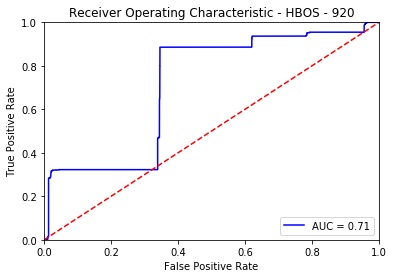

HBOS - 920 ROC:0.7128, precision @ rank n:0.3228
Duration:  0.083853  seconds


#####################################################################

Results - HBOS - 930:
Confusion Matrix:
               Actual
Predicted   1099  |  2284
            2307  |  14206 

Accuracy:  0.7692501005227181
Precision:  0.3248595920780372
Recall:  0.32266588373458605
F1-score:  0.3237590219472677


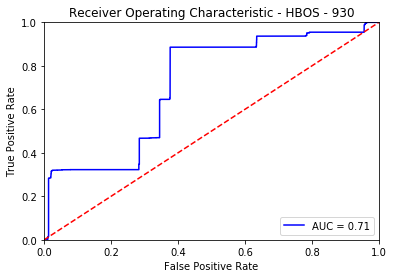

HBOS - 930 ROC:0.7126, precision @ rank n:0.3227
Duration:  0.067217  seconds


#####################################################################

Results - HBOS - 940:
Confusion Matrix:
               Actual
Predicted   1099  |  2284
            2307  |  14206 

Accuracy:  0.7692501005227181
Precision:  0.3248595920780372
Recall:  0.32266588373458605
F1-score:  0.3237590219472677


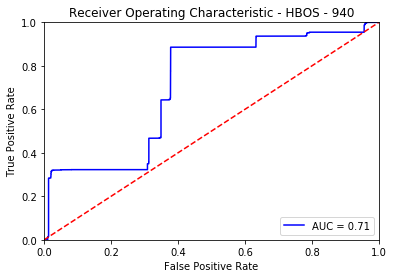

HBOS - 940 ROC:0.7074, precision @ rank n:0.3227
Duration:  0.083246  seconds


#####################################################################

Results - HBOS - 950:
Confusion Matrix:
               Actual
Predicted   1099  |  2283
            2307  |  14207 

Accuracy:  0.7693003618817853
Precision:  0.3249556475458309
Recall:  0.32266588373458605
F1-score:  0.3238067177371833


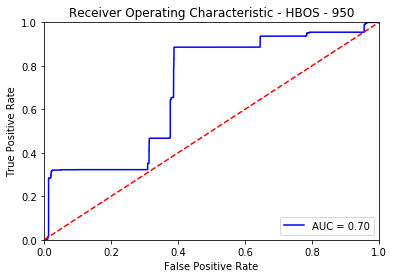

HBOS - 950 ROC:0.6996, precision @ rank n:0.3227
Duration:  0.072713  seconds


#####################################################################

Results - HBOS - 960:
Confusion Matrix:
               Actual
Predicted   1099  |  2284
            2307  |  14206 

Accuracy:  0.7692501005227181
Precision:  0.3248595920780372
Recall:  0.32266588373458605
F1-score:  0.3237590219472677


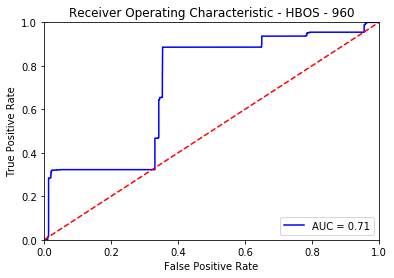

HBOS - 960 ROC:0.711, precision @ rank n:0.3235
Duration:  0.075071  seconds


#####################################################################

Results - HBOS - 970:
Confusion Matrix:
               Actual
Predicted   1099  |  2284
            2307  |  14206 

Accuracy:  0.7692501005227181
Precision:  0.3248595920780372
Recall:  0.32266588373458605
F1-score:  0.3237590219472677


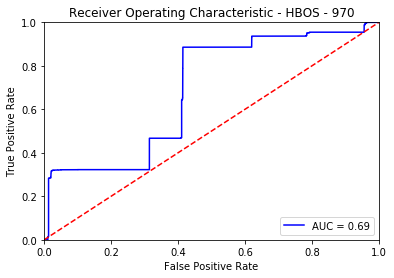

HBOS - 970 ROC:0.688, precision @ rank n:0.3227
Duration:  0.074788  seconds


#####################################################################

Results - HBOS - 980:
Confusion Matrix:
               Actual
Predicted   1099  |  2282
            2307  |  14208 

Accuracy:  0.7693506232408525
Precision:  0.3250517598343685
Recall:  0.32266588373458605
F1-score:  0.32385442758214233


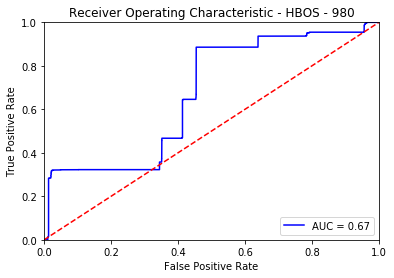

HBOS - 980 ROC:0.6719, precision @ rank n:0.3229
Duration:  0.086508  seconds


#####################################################################

Results - HBOS - 990:
Confusion Matrix:
               Actual
Predicted   0  |  3383
            3406  |  13107 

Accuracy:  0.6587756332931243
Precision:  0.0
Recall:  0.0
F1-score: -


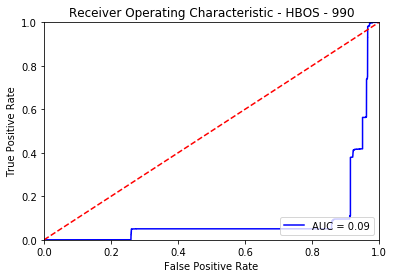

HBOS - 990 ROC:0.093, precision @ rank n:0.0
Duration:  0.074284  seconds


#####################################################################


In [66]:
for i in range(10, 1000, 10):
    testMethod(HBOS(contamination=outliers_fraction, n_bins = i), "HBOS - "+str(i), testingSet_fs, testingSet_fs, y_test)


Results - PCA - 1:
Confusion Matrix:
               Actual
Predicted   1367  |  2016
            2039  |  14474 

Accuracy:  0.7961901889827101
Precision:  0.4040792196275495
Recall:  0.40135055783910745
F1-score:  0.4027102666077478


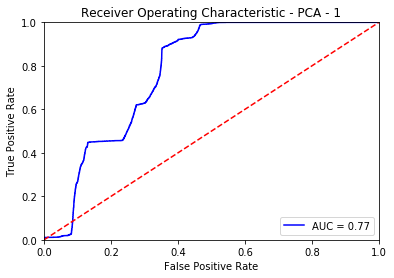

PCA - 1 ROC:0.7742, precision @ rank n:0.4055
Duration:  0.077014  seconds


#####################################################################

Results - PCA - 2:
Confusion Matrix:
               Actual
Predicted   1519  |  1864
            1887  |  14626 

Accuracy:  0.8114696421391234
Precision:  0.4490097546556311
Recall:  0.4459776864357017
F1-score:  0.4474885844748858


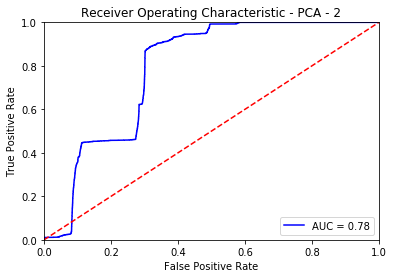

PCA - 2 ROC:0.7849, precision @ rank n:0.4469
Duration:  0.052833  seconds


#####################################################################

Results - PCA - 3:
Confusion Matrix:
               Actual
Predicted   1306  |  2077
            2100  |  14413 

Accuracy:  0.7900583031765179
Precision:  0.3860478864912799
Recall:  0.3834409864944216
F1-score:  0.3847400206215938


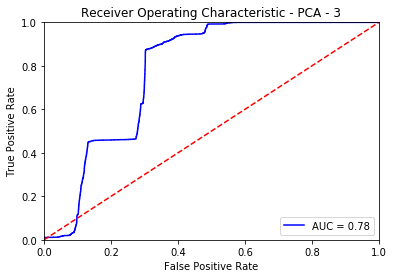

PCA - 3 ROC:0.7765, precision @ rank n:0.3881
Duration:  0.058321  seconds


#####################################################################

Results - PCA - 4:
Confusion Matrix:
               Actual
Predicted   1361  |  2022
            2045  |  14468 

Accuracy:  0.7955870526739043
Precision:  0.402305645876441
Recall:  0.399588960657663
F1-score:  0.4009427014287819


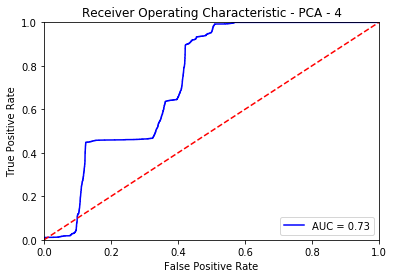

PCA - 4 ROC:0.7322, precision @ rank n:0.4052
Duration:  0.074568  seconds


#####################################################################

Results - PCA - 5:
Confusion Matrix:
               Actual
Predicted   1289  |  2094
            2117  |  14396 

Accuracy:  0.7883494169682348
Precision:  0.38102276086313924
Recall:  0.37844979448032884
F1-score:  0.3797319192811902


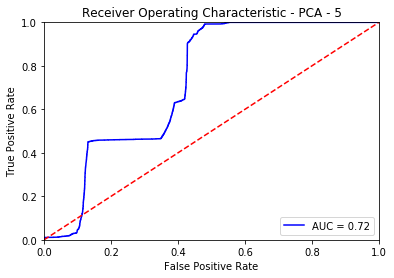

PCA - 5 ROC:0.7235, precision @ rank n:0.384
Duration:  0.073465  seconds


#####################################################################

Results - PCA - 6:
Confusion Matrix:
               Actual
Predicted   1280  |  2103
            2126  |  14387 

Accuracy:  0.7874447125050261
Precision:  0.3783624002364765
Recall:  0.37580739870816204
F1-score:  0.37708057151274116


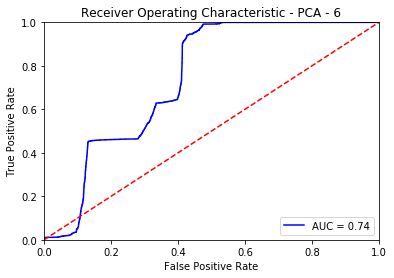

PCA - 6 ROC:0.7402, precision @ rank n:0.382
Duration:  0.066016  seconds


#####################################################################

Results - PCA - 7:
Confusion Matrix:
               Actual
Predicted   1294  |  2089
            2112  |  14401 

Accuracy:  0.7888520305589063
Precision:  0.38250073898906295
Recall:  0.3799177921315326
F1-score:  0.38120489026366183


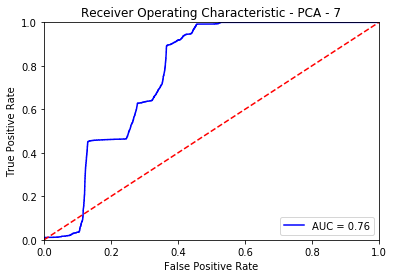

PCA - 7 ROC:0.7635, precision @ rank n:0.3855
Duration:  0.118437  seconds


#####################################################################

Results - PCA - 8:
Confusion Matrix:
               Actual
Predicted   1319  |  2064
            2087  |  14426 

Accuracy:  0.7913650985122638
Precision:  0.38989062961868165
Recall:  0.3872577803875514
F1-score:  0.38856974517602


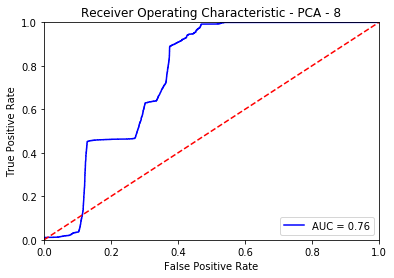

PCA - 8 ROC:0.7565, precision @ rank n:0.3928
Duration:  0.070198  seconds


#####################################################################

Results - PCA - 9:
Confusion Matrix:
               Actual
Predicted   1279  |  2104
            2127  |  14386 

Accuracy:  0.7873441897868918
Precision:  0.3780668046112918
Recall:  0.3755137991779213
F1-score:  0.37678597731624686


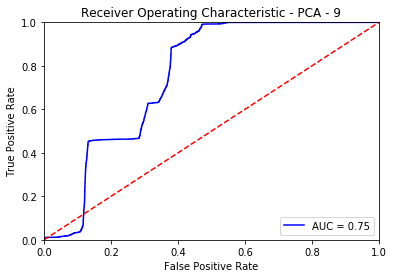

PCA - 9 ROC:0.7508, precision @ rank n:0.3814
Duration:  0.091796  seconds


#####################################################################

Results - PCA - 10:
Confusion Matrix:
               Actual
Predicted   1254  |  2129
            2152  |  14361 

Accuracy:  0.7848311218335344
Precision:  0.3706769139816731
Recall:  0.36817381092190254
F1-score:  0.36942112240388864


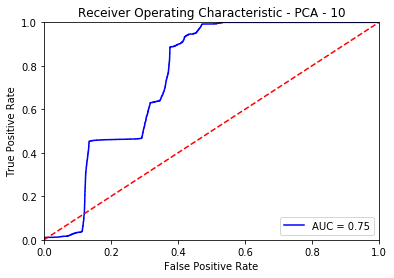

PCA - 10 ROC:0.7504, precision @ rank n:0.3732
Duration:  0.072094  seconds


#####################################################################

Results - PCA - 11:
Confusion Matrix:
               Actual
Predicted   1251  |  2132
            2155  |  14358 

Accuracy:  0.7845295536791315
Precision:  0.3697901271061188
Recall:  0.3672930123311803
F1-score:  0.3685373398144056


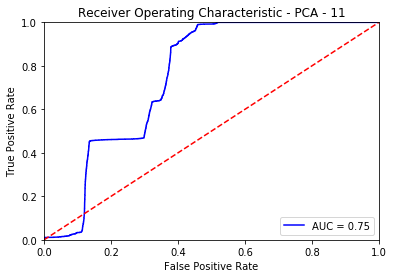

PCA - 11 ROC:0.7499, precision @ rank n:0.3714
Duration:  0.078692  seconds


#####################################################################

Results - PCA - 12:
Confusion Matrix:
               Actual
Predicted   1226  |  2157
            2180  |  14333 

Accuracy:  0.782016485725774
Precision:  0.36240023647650016
Recall:  0.3599530240751615
F1-score:  0.36117248490204745


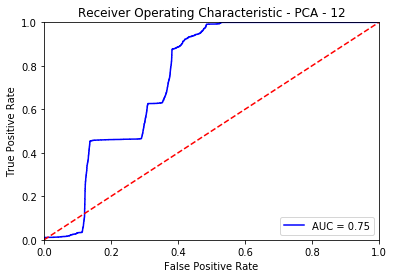

PCA - 12 ROC:0.7467, precision @ rank n:0.3647
Duration:  0.084197  seconds


#####################################################################

Results - PCA - 13:
Confusion Matrix:
               Actual
Predicted   1251  |  2132
            2155  |  14358 

Accuracy:  0.7845295536791315
Precision:  0.3697901271061188
Recall:  0.3672930123311803
F1-score:  0.3685373398144056


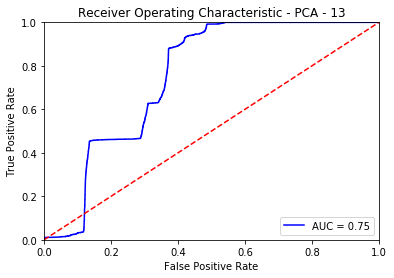

PCA - 13 ROC:0.7498, precision @ rank n:0.3723
Duration:  0.102869  seconds


#####################################################################

Results - PCA - 14:
Confusion Matrix:
               Actual
Predicted   1267  |  2116
            2139  |  14374 

Accuracy:  0.7861379171692803
Precision:  0.3745196571090748
Recall:  0.3719906048150323
F1-score:  0.37325084695831495


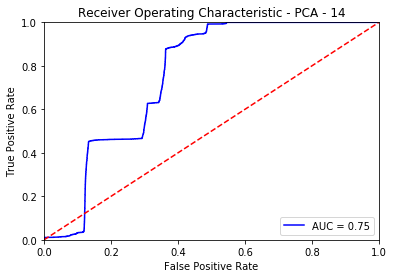

PCA - 14 ROC:0.7512, precision @ rank n:0.3776
Duration:  0.062361  seconds


#####################################################################

Results - PCA - 15:
Confusion Matrix:
               Actual
Predicted   1262  |  2121
            2144  |  14369 

Accuracy:  0.7856353035786088
Precision:  0.37304167898315105
Recall:  0.3705226071638285
F1-score:  0.3717778759758433


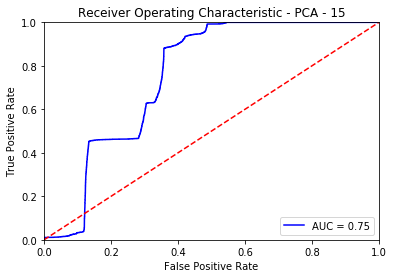

PCA - 15 ROC:0.7544, precision @ rank n:0.3758
Duration:  0.056727  seconds


#####################################################################

Results - PCA - 16:
Confusion Matrix:
               Actual
Predicted   1255  |  2128
            2151  |  14362 

Accuracy:  0.7849316445516686
Precision:  0.3709725096068578
Recall:  0.36846741045214326
F1-score:  0.36971571660038294


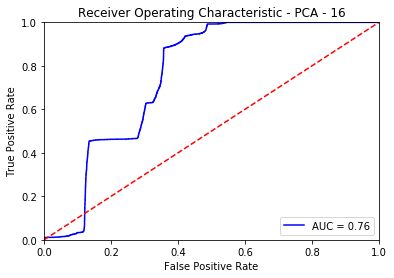

PCA - 16 ROC:0.7553, precision @ rank n:0.3735
Duration:  0.04755  seconds


#####################################################################


In [69]:
for i in range(1, len(testingSet_fs.columns), 1):
    testMethod(PCA(contamination=outliers_fraction, n_components = i), "PCA - "+str(i), testingSet_fs, testingSet_fs, y_test)


Results - KNN - 10:
Confusion Matrix:
               Actual
Predicted   63  |  3201
            3343  |  13289 

Accuracy:  0.6710896662645758
Precision:  0.019301470588235295
Recall:  0.01849677040516735
F1-score:  0.01889055472263868


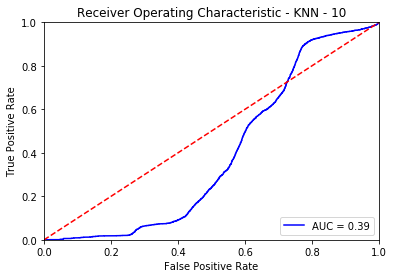

KNN - 10 ROC:0.3924, precision @ rank n:0.0185
Duration:  8.092647  seconds


#####################################################################

Results - KNN - 20:
Confusion Matrix:
               Actual
Predicted   67  |  3196
            3339  |  13294 

Accuracy:  0.6715420184961801
Precision:  0.02053325160894882
Recall:  0.019671168526130357
F1-score:  0.020092967461388514


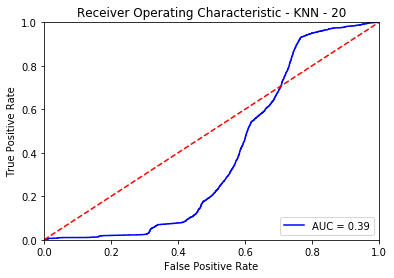

KNN - 20 ROC:0.394, precision @ rank n:0.02
Duration:  8.384075  seconds


#####################################################################

Results - KNN - 30:
Confusion Matrix:
               Actual
Predicted   43  |  3282
            3363  |  13208 

Accuracy:  0.6660132689987938
Precision:  0.012932330827067668
Recall:  0.01262477980035232
F1-score:  0.012776704798692615


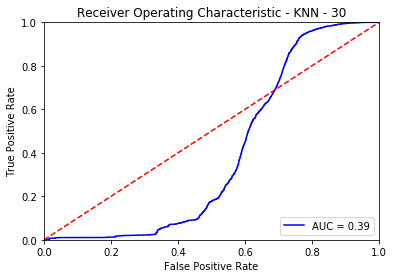

KNN - 30 ROC:0.3929, precision @ rank n:0.0126
Duration:  8.835117  seconds


#####################################################################

Results - KNN - 40:
Confusion Matrix:
               Actual
Predicted   35  |  3261
            3371  |  13229 

Accuracy:  0.6666666666666666
Precision:  0.010618932038834952
Recall:  0.010275983558426306
F1-score:  0.010444643390032825


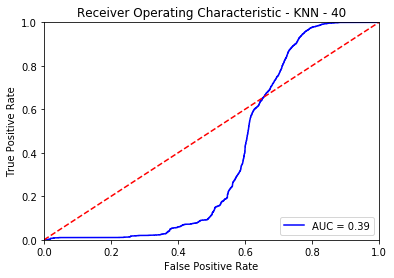

KNN - 40 ROC:0.3893, precision @ rank n:0.0103
Duration:  9.475662  seconds


#####################################################################

Results - KNN - 50:
Confusion Matrix:
               Actual
Predicted   35  |  3298
            3371  |  13192 

Accuracy:  0.6648069963811821
Precision:  0.010501050105010502
Recall:  0.010275983558426306
F1-score:  0.010387297818667459


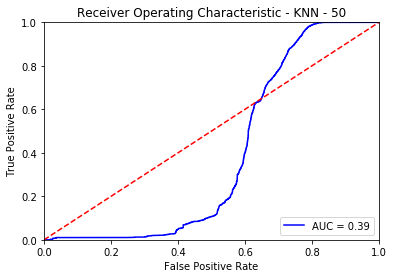

KNN - 50 ROC:0.3892, precision @ rank n:0.0103
Duration:  9.45369  seconds


#####################################################################

Results - KNN - 60:
Confusion Matrix:
               Actual
Predicted   35  |  3315
            3371  |  13175 

Accuracy:  0.6639525532770406
Precision:  0.010447761194029851
Recall:  0.010275983558426306
F1-score:  0.010361160449970397


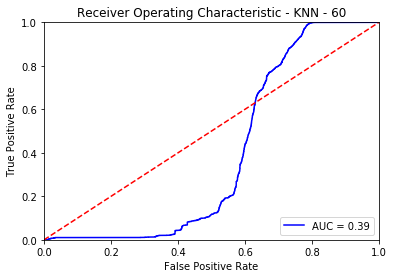

KNN - 60 ROC:0.3927, precision @ rank n:0.0103
Duration:  9.744501  seconds


#####################################################################

Results - KNN - 70:
Confusion Matrix:
               Actual
Predicted   35  |  3310
            3371  |  13180 

Accuracy:  0.6642038600723763
Precision:  0.01046337817638266
Recall:  0.010275983558426306
F1-score:  0.010368834246778254


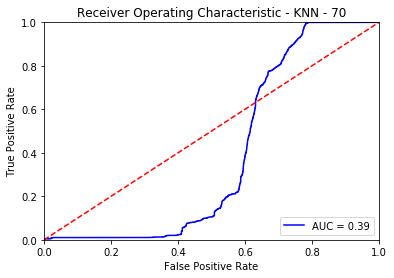

KNN - 70 ROC:0.39, precision @ rank n:0.0103
Duration:  10.036831  seconds


#####################################################################

Results - KNN - 80:
Confusion Matrix:
               Actual
Predicted   35  |  3278
            3371  |  13212 

Accuracy:  0.6658122235625251
Precision:  0.01056444310292786
Recall:  0.010275983558426306
F1-score:  0.01041821699657687


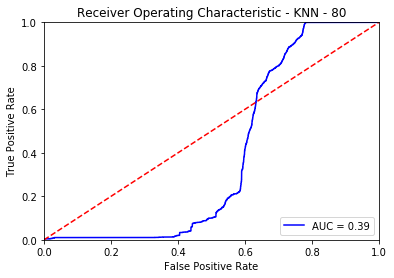

KNN - 80 ROC:0.388, precision @ rank n:0.0103
Duration:  10.369145  seconds


#####################################################################

Results - KNN - 90:
Confusion Matrix:
               Actual
Predicted   35  |  3262
            3371  |  13228 

Accuracy:  0.6666164053075995
Precision:  0.010615711252653927
Recall:  0.010275983558426306
F1-score:  0.010443085185737729


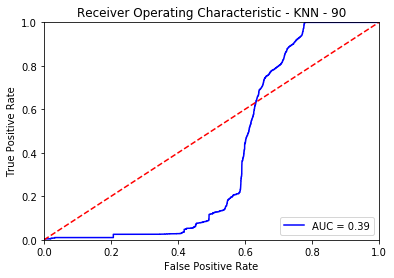

KNN - 90 ROC:0.3911, precision @ rank n:0.0103
Duration:  10.602227  seconds


#####################################################################


In [72]:
for i in range(10, 100, 10):
    testMethod(KNN(contamination=outliers_fraction, n_neighbors = i), "KNN - "+str(i), testingSet_fs, testingSet_fs, y_test)